# CAPSTONE PROJECT: Predicción de ventas de un eCommerce.

**Authors:** Albert García López, Joan Boronat Ruiz, Pep Martí Mascaro

**Date:** 15 de junio de 2021

**Description:** En este notebook se presenta la solución al reto: Predecir las unidades vendidas por producto y fecha para un eCommerce de material informático.

Este reto consiste en la predicción de ventas de nuestro eCommerce  para los meses de octubre, noviembre y diciembre de 2016 a partir de los datos de los 15 meses anteriores. Como particularidad en este reto contamos con el número de visitas para los meses a predecir. Debido a esto, hemos enfocado el problema desde el punto de vista de una serie temporal y desde el punto de vista de regresión.

- La predicción de la serie temporal nos permite pesar con mayor precisión la estacionalidad de los datos con periodos, como por ejemplo Black Friday o Navidad, con un gran incremento de ventas. El modelo usado en este caso ha sido <a href="https://facebook.github.io/prophet/">Prophet</a>. Para una mejor predicción, hemos creado un modelo para cada producto en el dataset.  

- Para la regresión hemos usado varios modelos que, aunque se basen en las mismas variables para generar una predicción, combinandolos nos ayudarán a hacer una proyección de ventas más precisas y evitar el <a href="https://towardsdatascience.com/handling-overfitting-in-deep-learning-models-c760ee047c6e">overfitting</a> sobre los datos de entrenamiento.

Los modelos de regresión utilizados son los siguientes:

   - <a href="https://xgboost.readthedocs.io/en/latest/">XGBoost</a> que nos ha permitido predecir las ventas a partir de las características de los productos. Para evitar que los periodos con descuentos influencien en exceso la predicción, hemos entrenado el modelo únicamente con los datos de los mismos meses del año anterior.
   - <a href="https://catboost.ai/">CatBoost</a> nos permite gestionar de forma más controlada las variables categóricas que usamos como predictor (importantes en el set de datos al ser las que nos dan una descripción sobre el producto y los días en que podemos esperar un comportamiento atípico)
   - <a href="https://lightgbm.readthedocs.io/en/latest/">LightGBM</a> similar en funcionamiento a XGBoost por el uso de <a href="https://towardsdatascience.com/understanding-gradient-boosting-machines-9be756fe76ab">Gradient Boosting</a> con árboles de decisión pero de forma más ágil al hacer una inspección previa de las observaciones que más información aportan al modelo

Finalmente hemos aplicado una técnica de <a href="https://machinelearningmastery.com/blending-ensemble-machine-learning-with-python/">blending</a> con los dos anteriores resultados para obtener un resultado final. Para ello hemos usado un regresor lineal. 

<br><br>
### Descripción del dataset

**Fecha** : momento del tiempo en el que se produce el evento.
    
**Id**: número identificador del artículo.
    
**Visitas**: número de veces que ha sido visualizada la ficha de un producto dado para un día concreto. Remarcamos que puede darse el caso en el que las visitas sean inferiores a las compras de ese mismo día, siempre que el producto que se ha comprado estuviera previamente añadido al carrito o se haya añadido desde la opción del recomendador sin pasar por ficha de producto.
    
**Categoría_uno**: categoría de producto nivel uno.
    
**Categoría_dos**: segundo nivel de agrupación para cada producto que precede a la de nivel uno.
    
**Estado**: situación en la que se encuentra el producto. Esta variable toma 3 posibles valores para el dataset Modelar_UH2021:
- Rotura: no hay stock físico disponible para servir en nuestros almacenes.
- Tránsito: no hay stock físico en nuestros almacenes, pero está pendiente de entrega inminente desde proveedor.
- No Rotura: hay stock físico disponible en nuestros almacenes.

Para el dataset Estimar_UH2021 todas las variables aparecen con el estado Tránsito o No Rotura.

**Precio**: indica el precio unitario al que se realiza la transacción. Cuando su valor es nulo, ha de ser completado con el precio anterior temporalmente más cercano para cada artículo.

**Día atípico**: toma los siguientes valores:
- 0: si estamos fuera de fechas con comportamiento atípico.
- 1: si estamos en un periodo con una demanda más alta de lo habitual.
- -1: si estamos en un periodo con una demanda más baja de lo habitual.

**Campaña**: esta variable nos indica para las campañas principales, si el producto estaba en promoción o no en una fecha determinada.

**Antiguedad**: días transcurridos desde la entrada en catálogo de cada producto.

**Unidades vendidas**: variable a predecir. Nos indica las unidades vendidas para cada día y cada artículo.

### Resources

* https://www.kaggle.com/elenapetrova/time-series-analysis-and-forecasts-with-prophet
* https://towardsdatascience.com/demand-forecasting-using-fb-prophet-e3d1444b9dd8
* https://nbviewer.jupyter.org/github/nicolasfauchereau/Auckland_Cycling/blob/master/notebooks/Auckland_cycling_and_weather.ipynb
* https://machinelearningmastery.com/blending-ensemble-machine-learning-with-python/

### Table of contents

1. [Loading Data & Libraries](#loadingLibraries)
    1. [Visualizing the problem](#visualizingProblem)
    2. [Data Description](#dataDescription)
2. [Data Preprocess](#dataPreprocess)
    1. [Removing Duplicates](#removingDuplicates)
    2. [Defining Data Types](#dataTypes)
    3. [Estimate Missing Values](#estimateMissing)
    4. [Filling Missing Values](#fillMissing)
    5. [Normalizing](#normalizing)
    6. [Defining New Features](#newFeatures)
3. [Predictions](#predictions)
    1. [Prophet](#prophet)
        1. [Validation](#prophetVal)
        2. [Test](#prophetTest)
    2. [XGBoost](#xgboost)
        1. [Validation](#xgboostVal)
        2. [Test](#xgboostTest)
    3. [CatBoost](#catboost)
        1. [Validation](#catboostVal)
        2. [Test](#catboostTest)
    4. [LightGBM](#LightGBM)
        1. [Validation](#lightgbmVal)
        2. [Test](#lightgbmTest)       
    5. [Blending](#blending)
        1. [Validation](#blendingVal)
        2. [Test](#blendingTest)
4. [Conclusiones](#conclusiones)

<br><br>

# <a name="loadingLibraries">1. Loading Data & Libraries</a>

In [ ]:
import datetime
import pickle

import matplotlib.pylab as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import StackingRegressor
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.seasonal import seasonal_decompose
from tqdm.notebook import tqdm
from catboost import CatBoostRegressor, Pool
import shap

import xgboost as xgb
from fbprophet import Prophet
import lightgbm as lgbm

%matplotlib inline
plt.style.use('./base.mplstyle')

In [ ]:
df = pd.read_csv('./dataset/Modelar_UH2021.txt', sep='|')

df['fecha'] = pd.to_datetime(df['fecha'].str.split(' ').str[0], format='%d/%m/%Y')
days_count = (df['fecha'].max() - df['fecha'].min()).days

In [ ]:
df_test = pd.read_csv('./dataset/Estimar2.txt', sep='|', low_memory=False)
df_test['fecha'] = pd.to_datetime(df_test['fecha'], format='%Y-%m-%d')

### <a name="visualizingProblem"> 1.1 Visualizing the problem</a>

In [ ]:
holidays_train = df[['fecha', 'dia_atipico']]
holidays_test = df_test[['fecha', 'dia_atipico']]
holidays = pd.concat([holidays_train, holidays_test])

holidays.drop_duplicates(inplace=True)
holidays = holidays[holidays['dia_atipico'] != 0]

holidays.loc[holidays['dia_atipico'] == 1, 'holiday'] = 'positive'
holidays.loc[holidays['dia_atipico'] == -1, 'holiday'] = 'negative'

In [ ]:
def plot(train, kpi, test=None, holidays=None):

    fig, ax = plt.subplots(figsize=(15,4))

    _ = train.plot(ax=ax, y=kpi, lw=.8)
    labels = [f'Train {kpi}']
    if test is not None:
        labels.append(f'Test {kpi}')
        _ = test.plot(ax=ax, y=kpi, lw=.8)
    
    ax.legend(
        labels,
        ncol=3,
        bbox_to_anchor=(0.5, 1.15),
        prop={'size': 12},
        frameon=False
    )
    
    if holidays is not None:
        for holiday in holidays.to_dict('records'):
            if holiday['dia_atipico'] == 1:
                plt.axvline(x=holiday['fecha'], alpha=.1, color='green')
            elif holiday['dia_atipico'] == -1:
                plt.axvline(x=holiday['fecha'], alpha=.1, color='red')

    _ = ax.set_xlabel('')

In [ ]:
test = df_test.groupby(['fecha']).mean().fillna(0)
train = df.groupby(['fecha']).mean().fillna(0)

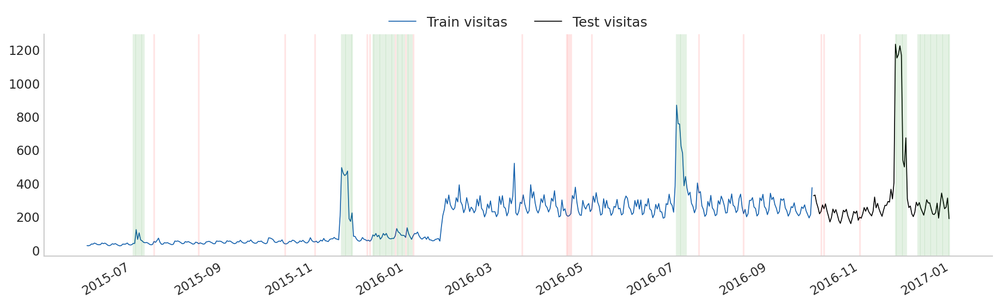

In [ ]:
plot(train, 'visitas', test, holidays)

In [ ]:
min_test_date = df_test['fecha'].min().strftime('%Y-%m-%d')
max_test_date = df_test['fecha'].max().strftime('%Y-%m-%d')

print(f"We will have to predict the sales from {min_test_date} to {max_test_date}")

We will have to predict the sales from 2016-10-01 to 2016-12-31


In [ ]:
df.sample(5)

,fecha,id,visitas,categoria_uno,categoria_dos,estado,precio,dia_atipico,campaña,antiguedad,unidades_vendidas
1745461,2015-12-28,177174,5,A,127.0,No Rotura,NaN,1,0,NaN,0
3776063,2016-08-29,321970,110,E,114.0,No Rotura,"24,67",0,0,607.0,3
2211409,2016-02-22,211820,575,E,122.0,No Rotura,"16,14",0,0,1167.0,27
3082328,2016-06-07,146372,15,B,312.0,No Rotura,NaN,0,0,1905.0,0
2715465,2016-04-23,366292,75,A,82.0,No Rotura,"34,28",0,0,NaN,3


### <a name="dataDescription">1.2 Data description</a>

In [ ]:
print(f"We have {df.shape[0]} registers with {df.shape[1]} features.")
print(f"The data ranges from {df['fecha'].min()} to {df['fecha'].max()}.")
print(f"We expect to have {days_count} registers per product.")
print(f"There are {df.duplicated().sum()} duplicated registers.")
print(f"There are {df['id'].nunique()} unique products.")
print(f"There are {df['categoria_uno'].nunique()} unique category one.")
print(f"There are {df['categoria_dos'].nunique()} unique category dos.")

We have 4045022 registers with 11 features.
The data ranges from 2015-06-01 00:00:00 to 2016-09-30 00:00:00.
We expect to have 487 registers per product.
There are 2004985 duplicated registers.
There are 4168 unique products.
There are 13 unique category one.
There are 182 unique category dos.


<br><br>
# <a name="dataPreprocess">2. Data Preprocess </a>
### <a name="removingDuplicates">2.1 Removing Duplicates</a>

In [ ]:
df = df[~df.duplicated()]

In [ ]:
def count_duplicates(df):
    g = df.groupby('id').size()
    return g[g != days_count].shape[0]

count = count_duplicates(df)
print(f"There are {count} products with more registers than days.")

There are 1199 products with more registers than days.


In [ ]:
g = df.groupby('id').size()
example_id = g[g != days_count].reset_index()['id'].values[0]
df_example = df[df['id'] == example_id]
df_example[df_example.duplicated(subset=['fecha'], keep=False)].head(5)

,fecha,id,visitas,categoria_uno,categoria_dos,estado,precio,dia_atipico,campaña,antiguedad,unidades_vendidas
290712,2015-07-06,24306,409,A,46.0,No Rotura,"7,04",1,1,NaN,15
290713,2015-07-06,24306,409,A,46.0,No Rotura,"7,04",1,0,NaN,15
299018,2015-07-07,24306,223,A,46.0,No Rotura,"6,77",1,0,NaN,3
299019,2015-07-07,24306,223,A,46.0,No Rotura,"6,77",1,1,NaN,3
307324,2015-07-08,24306,128,A,46.0,No Rotura,"6,77",1,1,NaN,27


The difference between these duplicated values are the campaña. We will keep drop the rows with campaña 0 if there is a register for the same date and campaña with value 1. 

In [ ]:
columns = df.columns.tolist()
columns.remove('campaña')

df.loc[df.duplicated(columns, keep=False), 'campaña'] = '1'
df = df[~df.duplicated()]

In [ ]:
count = count_duplicates(df)
print(f"There are still {count} products with more registers than days.")

There are still 3 products with more registers than days.


In [ ]:
g = df.groupby('id').size()
example_id = g[g != days_count].reset_index()['id'].sample().values[0]
df_example = df[df['id'] == example_id]
df_example[df_example.duplicated(subset=['fecha'], keep=False)].head(5)

,fecha,id,visitas,categoria_uno,categoria_dos,estado,precio,dia_atipico,campaña,antiguedad,unidades_vendidas
2932,2015-06-01,260338,98,A,46.0,No Rotura,"24,67",0,0,NaN,6
2944,2015-06-01,260338,98,A,46.0,No Rotura,"24,67",0,0,946.0,6
11238,2015-06-02,260338,88,A,46.0,No Rotura,"24,67",0,0,946.0,3
11250,2015-06-02,260338,88,A,46.0,No Rotura,"24,67",0,0,NaN,3
19544,2015-06-03,260338,83,A,46.0,No Rotura,NaN,0,0,NaN,0


We will remove these registers after filling these missing values as they will become fully duplicated entries


### <a name="dataTypes">2.2 Refining data types</a>

In [ ]:
df['precio'] = df['precio'].str.replace(',', '.')
df_test['precio'] = df_test['precio'].str.replace(',', '.')

dtypes = {
    'id': str,
    'categoria_dos': str,
    'precio': float,
    'dia_atipico': str,
    'campaña': str,
    'antiguedad': float
}

df = df.astype(dtypes)

df_test = df_test.replace('-', 0).astype(dtypes)
df_test = df_test.astype(dtypes)

### <a name="estimateMissing">2.3 Estimate missing values</a>

In [ ]:
def estimate_antiquity(X_train, X_test):

    y_train = X_train['antiguedad']
    y_test = X_test['antiguedad']

    X_train['id_feature'] = X_train['id']
    X_test['id_feature'] = X_test['id']

    features = ['visitas', 'id_feature', 'precio', 'unidades_vendidas']

    for feature in features:
        scaler = MinMaxScaler()
        X_train[feature] = scaler.fit_transform(X_train[[feature]])
        X_test[feature] = scaler.transform(X_test[[feature]])

    columns = ['categoria_uno', 'categoria_dos']
    X_train = X_train[['id'] + columns + features]
    X_train = pd.get_dummies(X_train, columns=columns)

    X_test = X_test[['id'] + columns + features]
    X_test = pd.get_dummies(X_test, columns=columns)

    classifier = KNeighborsClassifier(n_neighbors=3)
    classifier.fit(X_train, y_train)

    for col in X_train.columns:
        if col not in X_test:
            X_test[col] = 0

    for col in X_test.columns:
        if col not in X_train:
            X_test.drop(columns=[col], inplace=True)

    return classifier.predict(X_test)

In [ ]:
X_train = df[~df.antiguedad.isna()].groupby(['id', 'categoria_uno', 'categoria_dos']).min()
X_train = X_train.reset_index()

X_test = df[df.antiguedad.isna()].groupby(['id', 'categoria_uno', 'categoria_dos']).min()
X_test = X_test.reset_index()

X_test['antiguedad'] = estimate_antiquity(X_train, X_test)

data_by_product = []
antiguedad_estimated = X_test[['id', 'antiguedad']].set_index('id').T.to_dict()

### <a name="fillMissing">2.4 Filling missing values</a>

In [ ]:
def fill_missing_values(df, label, antiguedad_estimated):
    
    data_by_product = []
    for product_id in tqdm(set(df['id']), desc=f'Cleaning {label}'):

        aux = df[df['id'] == product_id]
        aux = aux[~aux.duplicated()]
        # Fill the price with the previous most recent value. (Forward fill)
        aux['precio'].ffill(inplace=True)
        aux['antiguedad'].ffill(inplace=True)
        # There are still some missing values. Fill with most recent value. (Back fill)
        aux['precio'].bfill(inplace=True)
        aux['antiguedad'].bfill(inplace=True)
        
        data_by_product.append(aux)

    return pd.concat(data_by_product)

In [ ]:
df = fill_missing_values(df, 'train', antiguedad_estimated)
df_test = fill_missing_values(df_test, 'test', antiguedad_estimated)

In [ ]:
columns = ['fecha', 'id', 'visitas', 'categoria_uno', 'categoria_dos', 
           'estado', 'precio', 'dia_atipico', 'campaña', 'unidades_vendidas']

df = df[~df.duplicated(subset=columns)]
g = df.groupby('id').size()

count = g[g != days_count].shape[0]
print(f"After some cleaning, we have {count} products with more registers than days.")

After some cleaning, we have 0 products with more registers than days.


### <a name="normalizing">2.5 Normalizing</a>

In [ ]:
df['visitas_normalized'] = df['visitas']
df_test['visitas_normalized'] = df_test['visitas']

# See Analysis notebook for the reason why we multiply by 5. 
mask = df['fecha'] < '2016-01-25'
df.loc[mask, 'visitas_normalized'] = df.loc[mask, 'visitas'] * 5

In [ ]:
test = df_test.groupby(['fecha']).mean().fillna(0)
train = df.groupby(['fecha']).mean().fillna(0)

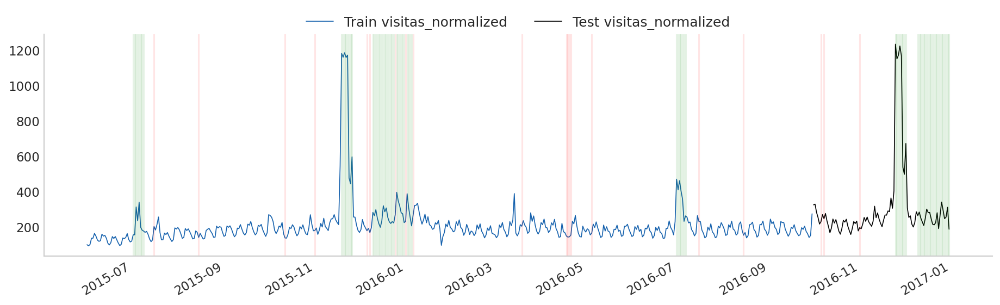

In [ ]:
# THIS WILL BE DELETED 
plot(train, 'visitas_normalized', test, holidays)

### <a name="newFeatures">2.6 Defining new features</a>

In [ ]:
def get_category_trend(df, df_test, category):
    
    g_train = df.groupby(['fecha', category]).sum().reset_index()
    g_test = df_test.groupby(['fecha', category]).sum().reset_index()

    g = pd.concat([g_train, g_test])
    p = g.pivot(index='fecha', columns=category, values='visitas_normalized')

    g = g.groupby('fecha').sum().reset_index()
    g['overall_trend'] = seasonal_decompose(
        g['visitas_normalized'],
        model='additive',
        period=7
    ).trend
    g['overall_trend'] = g['overall_trend'].ffill().bfill()


    p = p.reset_index().merge(g[['fecha', 'overall_trend']], on='fecha', how='left')

    p = p.set_index('fecha')

    for col in p:
        if p[col].sum() >= 1e6:
            trend = seasonal_decompose(
                p[col],
                model='additive',
                period=7
            ).trend
            p[col] = trend.ffill().bfill()
        else:
            p[col] = p['overall_trend']

    p.drop(columns=['overall_trend'], inplace=True)

    return p.melt(
        ignore_index=False,
        value_name=f'{category}_trend',
        var_name=category
    ).reset_index()

In [ ]:
category_trend = get_category_trend(df, df_test, 'categoria_uno')

df.drop(columns=['categoria_uno_trend'], errors='ignore', inplace=True)
df_test.drop(columns=['categoria_uno_trend'], errors='ignore', inplace=True)

df = df.merge(category_trend, on=['fecha', 'categoria_uno'], how='left')
df_test = df_test.merge(category_trend, on=['fecha', 'categoria_uno'], how='left')

In [ ]:
def add_time_segments(df):
    df['year'] = df['fecha'].dt.year
    df['month'] = df['fecha'].dt.month
    df['day'] = df['fecha'].dt.day
    df['week_number'] = df['fecha'].dt.isocalendar().week
    df['day_of_week'] = df['fecha'].dt.dayofweek
    return df

df = add_time_segments(df)
df_test = add_time_segments(df_test)

<br><br>
# <a name="Predictions">3. Predictions</a>

In [ ]:
class BaseModel:
    
    def __init__(self, df_train, df_test, holidays, validation=False):
        
        self.y_train = df_train['unidades_vendidas'].copy()        
        if validation:
            self.y_test = df_test['unidades_vendidas'].copy()
            
        features = df_train.columns.tolist()
        features.remove('unidades_vendidas')
        self.train = df_train[features].copy()
        self.test = df_test[features].copy()
        self.holidays = holidays
        self.validation = validation

    def score(self):
        mse = mean_squared_error(self.y_test, self.y_pred)
        rmse = np.sqrt(mse)
        rrmse = rmse / self.y_train.mean()
        cf = (self.y_test <= self.y_pred).sum() / len(self.y_pred)
        score = (0.7 * rrmse) + (0.3 * (1 - cf))
        return score
    
    def plot(self):
        self.train['y'] = self.y_train
        g = self.train.groupby(['fecha']).sum()
        
        self.test['y_pred'] = self.y_pred
        if self.validation:
            self.test['y'] = self.y_test
        g_pred = self.test.groupby(['fecha']).sum()

        fig, ax = plt.subplots(figsize=(15,4))
        _ = g.plot(ax=ax, y='y', lw=.8)
        _ = g_pred.plot(ax=ax, y='y_pred', lw=.8)
        
        if self.validation:
            _ = g_pred.plot(ax=ax, y='y', lw=.8, color='C0')

        ax.legend(
            ['Sales', 'Prediction'],
            ncol=3,
            bbox_to_anchor=(0.8, 1.15),
            prop={'size': 12},
            frameon=False
        )

        for holiday in self.holidays.to_dict('records'):
            if holiday['dia_atipico'] == 1:
                plt.axvline(x=holiday['fecha'], alpha=.1, color='green')
            elif holiday['dia_atipico'] == -1:
                plt.axvline(x=holiday['fecha'], alpha=.1, color='red')
        _ = ax.set_xlabel('')

        if self.validation:
            _ = ax.set_title('Score: {:.2f}'.format(self.score()))
            
    def scatterplot_distplot(self):
        
        assert self.validation, "This is only available for validation."        
        self.test['y_pred'] = self.y_pred
        self.test['y'] = self.y_test
        g_pred = self.test.groupby(['fecha']).sum()
        
        p1 = sns.jointplot(x=g_pred['y'], y=g_pred['y_pred'], kind="reg")

        plt.figure(figsize=(15,4))
        sns.distplot(g_pred['y'], hist=True, kde=False)
        sns.distplot(g_pred['y_pred'], hist=True, kde=False)
        plt.legend(labels=['True Values', 'Predicted Values'])
        plt.xlim(0,)

### <a name="prophet">3.1 Prophet</a>

In [ ]:
class MyProphet(BaseModel):
    
    def __init__(self, df_train, df_test, holidays, regressors, validation=False):
        
        intersection = set(df_train['fecha']).intersection(set(df_test['fecha']))
        assert intersection == set(), "Train and test not well defined"

        df_train['ds'] = df_train['fecha']
        df_train['y'] = df_train['unidades_vendidas']
        
        df_test['ds'] = df_test['fecha']
        df_test['y'] = df_test['unidades_vendidas'] if validation else np.nan
        
        super().__init__(
            df_train,
            df_test,
            holidays,
            validation
        )
        
        self.predictions = {}
        self.regressors = regressors
        self.features = ['ds', 'y'] + regressors
        self.holidays['ds'] = self.holidays['fecha']
    
    def fit_product(self, product_id):
        train_prod = self.train[self.train['id'] == product_id] 
        prophet_col_names = {'fecha': 'ds', 'unidades_vendidas': 'y'}
        
        model = Prophet(
            holidays=self.holidays,
            yearly_seasonality=True,
            weekly_seasonality=True,
            daily_seasonality=True,
            uncertainty_samples = False
        )
        
        for feature in self.regressors: 
            model.add_regressor(feature, standardize=True)
            
        model.fit(train_prod)
        return model

    def fit_and_predict(self):
        for product_id in tqdm(set(self.test['id']), desc='Fit & Predict'):    
            model = self.fit_product(product_id)
            
            test_prod = self.test[self.test['id'] == product_id]
            y_pred_prod = model.predict(test_prod)
            y_pred_prod['id'] = product_id
            y_pred_prod.loc[y_pred_prod['yhat'] < 0, 'yhat'] = 0
            
            self.predictions[product_id] = y_pred_prod
        
        predictions = pd.concat(self.predictions.values())
        m = self.test.merge(predictions, on=['ds', 'id'], how='left')
        self.y_pred = m['yhat']

### <a name="prophetVal">3.1.1 Prophet > Validation</a>

In [ ]:
df_aux = df.copy()
df_test_aux = df_test.copy()

In [ ]:
X_train = df_aux.loc[df_aux["fecha"] < "2016-06-01"].copy().reset_index()
X_test  = df_aux.loc[df_aux["fecha"] >= "2016-06-01"].copy().reset_index()

# subset = X_test['id'].drop_duplicates().sample(100)
# X_train = X_train[X_train['id'].isin(subset)].reset_index()
# X_test = X_test[X_test['id'].isin(subset)].reset_index()

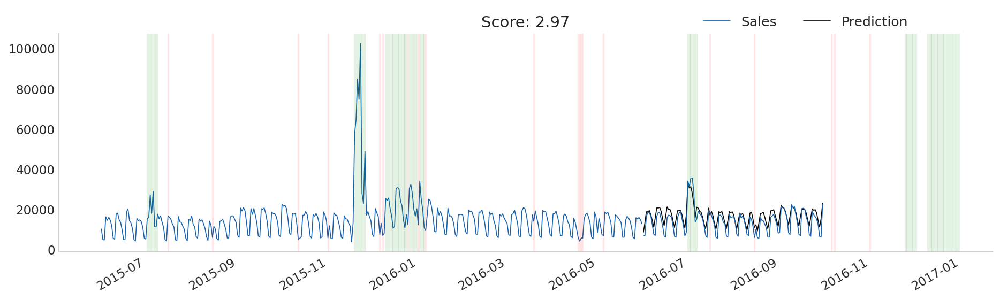

In [ ]:
my_prophet = MyProphet(
    X_train,
    X_test,
    holidays,
    regressors=['visitas_normalized', 'categoria_uno_trend'],
    validation=True
)

my_prophet.fit_and_predict()
my_prophet.plot()

/Users/joanboronat/.virtualenvs/ds/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


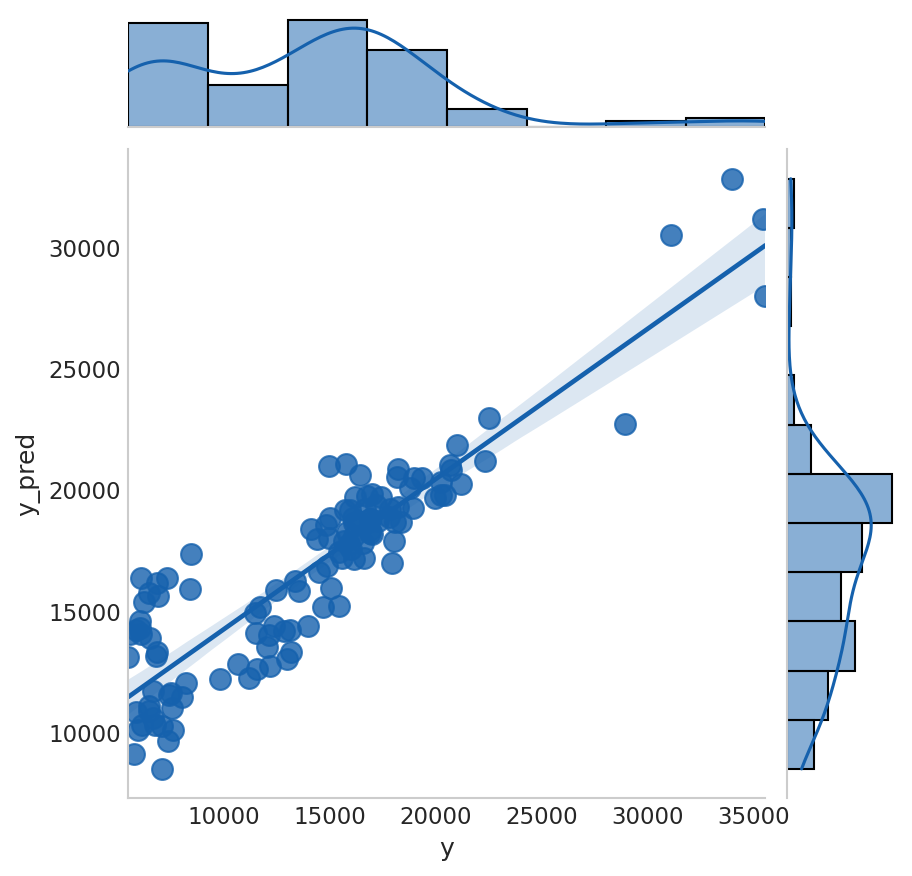

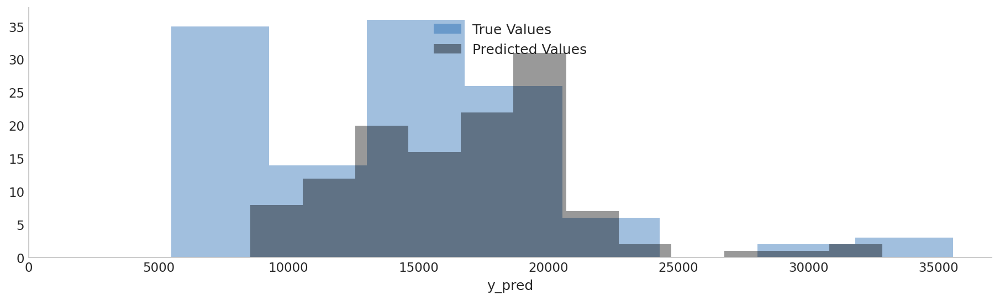

In [ ]:
my_prophet.scatterplot_distplot()

### <a name="prophetTest">3.1.2 Prophet > Test

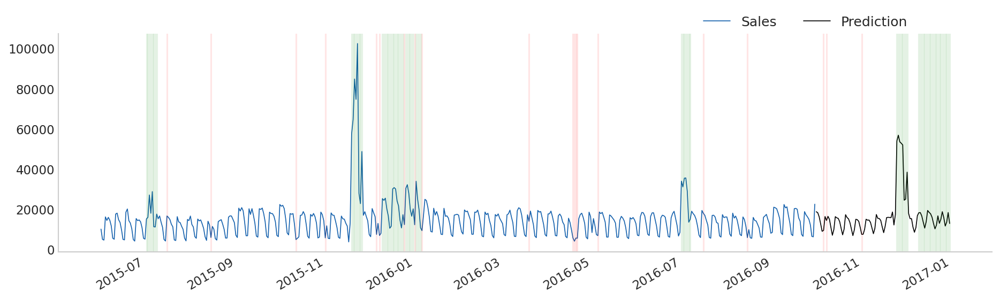

In [ ]:
my_prophet_test = MyProphet(
    df_aux,
    df_test_aux,
    holidays,
    regressors=['visitas_normalized', 'categoria_uno_trend']
)

my_prophet_test.fit_and_predict()
my_prophet_test.plot()

### <a name="xgboost">3.2 XGBoost</a>

In [ ]:
class MyXGBoost(BaseModel):
    
    def __init__(self, df_train, df_test, numerical, categorical, holidays, validation=False):
        
        intersection = set(df_train['fecha']).intersection(set(df_test['fecha']))
        assert intersection == set(), "Train and test not well defined"
        
        self.numerical = numerical
        self.categorical = categorical
        self.features = numerical + categorical
        self.train_index = df_train[['fecha', 'id']].copy()
        self.test_index = df_test[['fecha', 'id']].copy()
        
        super().__init__(
            df_train[self.features + ['unidades_vendidas']],
            df_test,
            holidays,
            validation
        )
    
    def standarize(self):
        for feature in self.numerical:
            scaler = MinMaxScaler()
            self.train[feature] = scaler.fit_transform(self.train[[feature]])
            self.test[feature] = scaler.transform(self.test[[feature]])
            
    def encode(self):
        for feature in self.categorical:
            dummies = pd.get_dummies(self.train[feature], prefix=feature)
            self.train = pd.concat([self.train, dummies], axis=1)
            self.train.drop(columns=[feature], inplace=True)

            dummies = pd.get_dummies(self.test[feature], prefix=feature)
            self.test = pd.concat([self.test, dummies], axis=1)
            self.test.drop(columns=[feature], inplace=True)

        for col in self.test:
            if col not in self.train:
                self.test.drop(columns=[col], inplace=True)

        for col in self.train:
            if col not in self.test:
                self.train.drop(columns=[col], inplace=True)
        
    def fit(self):
        self.standarize()
        self.encode()
        
        self.model = xgb.XGBRegressor(
            objective='reg:squarederror',
            colsample_bytree = 0.3,
            learning_rate = 0.1,
            max_depth = 5,
            alpha = 10,
            n_estimators = 200
        )
        
        _ = self.model.fit(self.train,self.y_train)

    
    def predict(self):
        self.y_pred = self.model.predict(self.test)
        self.y_pred[self.y_pred < 0] = 0
        self.test[['fecha', 'id']] = self.test_index
        self.train[['fecha', 'id']] = self.train_index

### <a name="xgboostVal">3.2.1 XGBoost > Validation</a>

In [ ]:
df_aux = df.copy()

X_train = df_aux.loc[df_aux["fecha"] < "2015-11-01"].copy()
X_train['id'] = X_train['id'].astype(int)

X_test  = df_aux.loc[df_aux["fecha"] >= "2016-06-01"].copy()
X_test['id'] = X_test['id'].astype(int)

In [ ]:
numerical = ['id', 'visitas_normalized', 'precio', 'antiguedad', 'categoria_uno_trend']
categorical = ['categoria_uno', 'dia_atipico', 'campaña', 'day_of_week', 'month', 'week_number']

In [ ]:
my_xgboost = MyXGBoost(
    X_train,
    X_test,
    numerical,
    categorical,
    holidays,
    validation=True
)

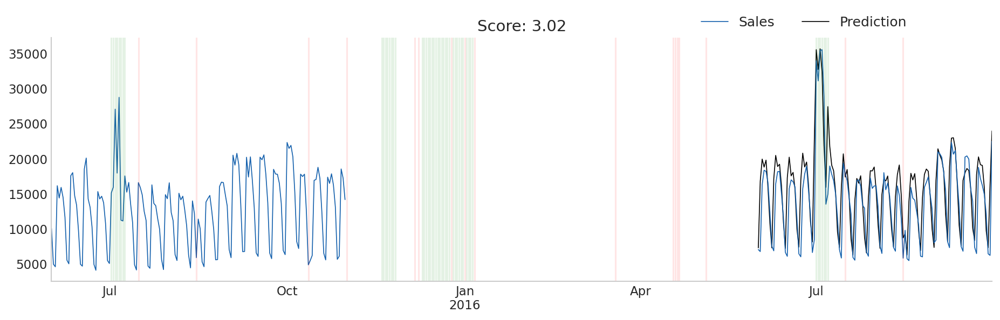

In [ ]:
my_xgboost.fit()
my_xgboost.predict()
my_xgboost.plot()

In [ ]:
explainer = shap.Explainer(my_xgboost.model)
shap_values = explainer(my_xgboost.train.drop(columns='fecha'))

shap.plots.beeswarm(shap_values, max_display=20)

ValueError: This reshape error is often caused by passing a bad data matrix to SHAP. See https://github.com/slundberg/shap/issues/580

/Users/joanboronat/.virtualenvs/ds/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


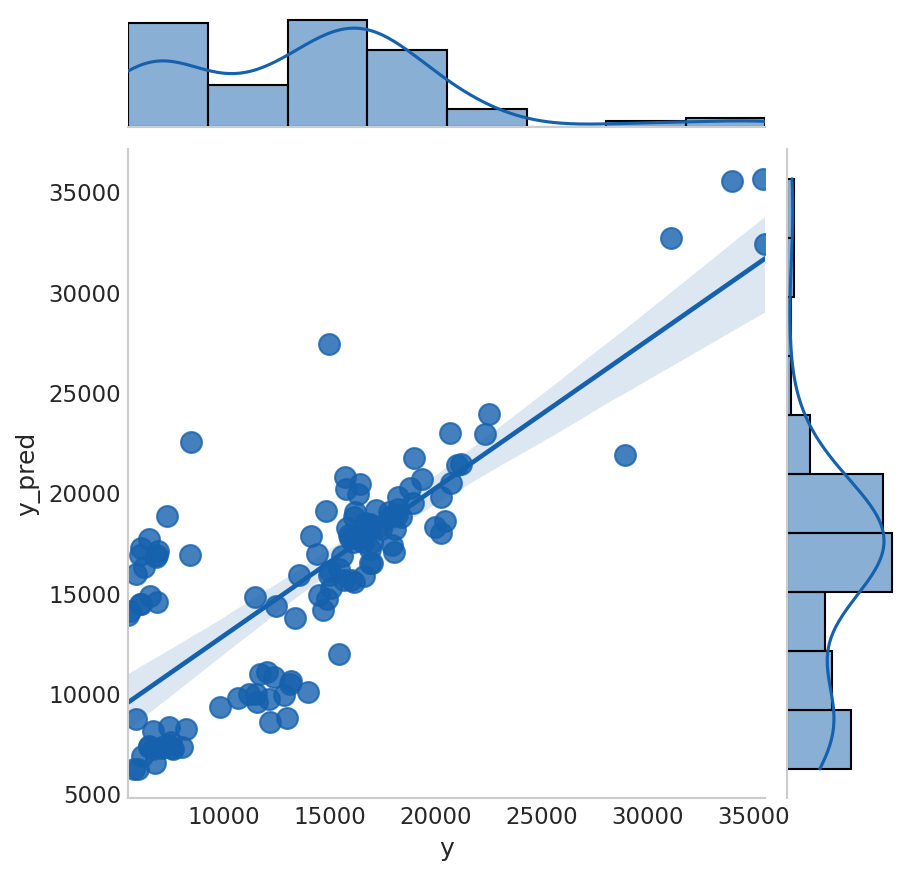

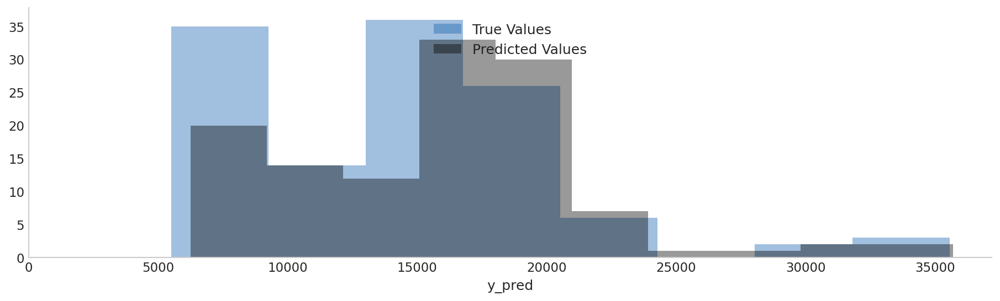

In [ ]:
my_xgboost.scatterplot_distplot()

### <a name="xgboostTest">3.2.2 XGBoost > Test</a>

In [ ]:
df_aux = df.copy()
df_test_aux = df_test.copy()

X_train = df_aux.loc[
    (df_aux["fecha"] < "2016-01-01") &
    (df_aux["fecha"] >= "2015-10-01")
].copy()

X_train['id'] = X_train['id'].astype(int)

X_test = df_test_aux.copy()
X_test['id'] = X_test['id'].astype(int)

In [ ]:
my_xgboost_test = MyXGBoost(
    X_train,
    X_test,
    numerical,
    categorical,
    holidays
)

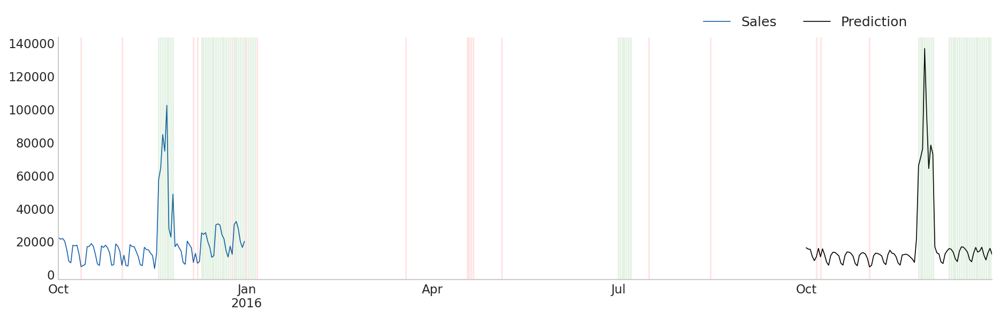

In [ ]:
my_xgboost_test.fit()
my_xgboost_test.predict()
my_xgboost_test.plot()

### <a name="CatBoost"> 3.3 Catboost</a>

In [ ]:
class MyCatBoost(BaseModel):
    
    def __init__(self, df_train, df_test, numerical, categorical, holidays, validation=False):
        
        intersection = set(df_train['fecha']).intersection(set(df_test['fecha']))
        assert intersection == set(), "Train and test not well defined"
        
        self.numerical = numerical
        self.categorical = categorical
        self.features = numerical + categorical
        self.train_index = df_train[['fecha', 'id']].copy()
        self.test_index = df_test[['fecha', 'id']].copy()
        
        super().__init__(
            df_train[self.features + ['unidades_vendidas']],
            df_test,
            holidays,
            validation
        )
    
    def fit(self):
        train_pool = Pool(self.train, self.y_train, cat_features=self.categorical)
        test_pool = Pool(self.test, self.y_test, cat_features=self.categorical)

        self.model = CatBoostRegressor()
        _ = self.model.fit(
            train_pool, 
            eval_set=test_pool,
            plot=True
        )
    
    def predict(self):
        self.y_pred = self.model.predict(self.test)
        self.y_pred[self.y_pred < 0] = 0
        self.test[['fecha', 'id']] = self.test_index
        self.train[['fecha', 'id']] = self.train_index

### <a name="catboostVal"> 3.3.1 Catboost > Validation </a>

In [ ]:
df_aux = df.copy()

X_train = df_aux.loc[df_aux["fecha"] < "2015-11-01"].copy()
X_train['id'] = X_train['id'].astype(int)
X_train['week_number'] = X_train['week_number'].astype(int)

X_test  = df_aux.loc[df_aux["fecha"] >= "2016-06-01"].copy()
X_test['id'] = X_test['id'].astype(int)
X_test['week_number'] = X_test['week_number'].astype(int)

In [ ]:
my_catboost = MyCatBoost(
    X_train,
    X_test,
    numerical,
    categorical,
    holidays,
    validation=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.156157
0:	learn: 12.6546334	test: 15.6231733	best: 15.6231733 (0)	total: 891ms	remaining: 14m 49s
1:	learn: 12.3161699	test: 15.1268819	best: 15.1268819 (1)	total: 1.68s	remaining: 13m 58s
2:	learn: 12.0473021	test: 14.7525836	best: 14.7525836 (2)	total: 2.31s	remaining: 12m 47s
3:	learn: 11.8380961	test: 14.4696287	best: 14.4696287 (3)	total: 2.97s	remaining: 12m 20s
4:	learn: 11.6587814	test: 14.2736706	best: 14.2736706 (4)	total: 4s	remaining: 13m 15s
5:	learn: 11.5060545	test: 14.1229836	best: 14.1229836 (5)	total: 4.61s	remaining: 12m 43s
6:	learn: 11.3976930	test: 13.9982753	best: 13.9982753 (6)	total: 5.2s	remaining: 12m 17s
7:	learn: 11.3042659	test: 13.8760117	best: 13.8760117 (7)	total: 5.98s	remaining: 12m 21s
8:	learn: 11.2076528	test: 13.7988509	best: 13.7988509 (8)	total: 6.82s	remaining: 12m 30s
9:	learn: 11.1320850	test: 13.6711264	best: 13.6711264 (9)	total: 7.59s	remaining: 12m 31s
10:	learn: 11.0707654	test: 13.6118340	best: 13.6118340 (10)	tot

90:	learn: 9.9173849	test: 12.8829285	best: 12.8829285 (90)	total: 51.7s	remaining: 8m 36s
91:	learn: 9.9120094	test: 12.8826457	best: 12.8826457 (91)	total: 52.3s	remaining: 8m 35s
92:	learn: 9.9066098	test: 12.8818710	best: 12.8818710 (92)	total: 53s	remaining: 8m 36s
93:	learn: 9.9062701	test: 12.8819124	best: 12.8818710 (92)	total: 53.6s	remaining: 8m 36s
94:	learn: 9.8979771	test: 12.8772254	best: 12.8772254 (94)	total: 54.2s	remaining: 8m 36s
95:	learn: 9.8886585	test: 12.8679958	best: 12.8679958 (95)	total: 54.7s	remaining: 8m 35s
96:	learn: 9.8882260	test: 12.8680072	best: 12.8679958 (95)	total: 55.2s	remaining: 8m 34s
97:	learn: 9.8763491	test: 12.8500424	best: 12.8500424 (97)	total: 56.1s	remaining: 8m 36s
98:	learn: 9.8685766	test: 12.8429063	best: 12.8429063 (98)	total: 56.9s	remaining: 8m 38s
99:	learn: 9.8581123	test: 12.8425833	best: 12.8425833 (99)	total: 57.6s	remaining: 8m 38s
100:	learn: 9.8554067	test: 12.8432978	best: 12.8425833 (99)	total: 58.3s	remaining: 8m 38s


178:	learn: 9.5982223	test: 12.8464857	best: 12.8144236 (132)	total: 1m 37s	remaining: 7m 28s
179:	learn: 9.5941558	test: 12.8436709	best: 12.8144236 (132)	total: 1m 38s	remaining: 7m 27s
180:	learn: 9.5939614	test: 12.8437180	best: 12.8144236 (132)	total: 1m 38s	remaining: 7m 25s
181:	learn: 9.5865569	test: 12.8411778	best: 12.8144236 (132)	total: 1m 39s	remaining: 7m 25s
182:	learn: 9.5859798	test: 12.8410544	best: 12.8144236 (132)	total: 1m 39s	remaining: 7m 24s
183:	learn: 9.5823178	test: 12.8390074	best: 12.8144236 (132)	total: 1m 40s	remaining: 7m 24s
184:	learn: 9.5780457	test: 12.8384636	best: 12.8144236 (132)	total: 1m 40s	remaining: 7m 23s
185:	learn: 9.5718826	test: 12.8346800	best: 12.8144236 (132)	total: 1m 41s	remaining: 7m 22s
186:	learn: 9.5712989	test: 12.8345504	best: 12.8144236 (132)	total: 1m 41s	remaining: 7m 22s
187:	learn: 9.5678288	test: 12.8357653	best: 12.8144236 (132)	total: 1m 42s	remaining: 7m 21s
188:	learn: 9.5648080	test: 12.8371065	best: 12.8144236 (132

266:	learn: 9.3942450	test: 12.8578536	best: 12.8144236 (132)	total: 2m 21s	remaining: 6m 28s
267:	learn: 9.3902608	test: 12.8581248	best: 12.8144236 (132)	total: 2m 21s	remaining: 6m 27s
268:	learn: 9.3866025	test: 12.8598452	best: 12.8144236 (132)	total: 2m 22s	remaining: 6m 26s
269:	learn: 9.3864367	test: 12.8598214	best: 12.8144236 (132)	total: 2m 22s	remaining: 6m 26s
270:	learn: 9.3846013	test: 12.8613949	best: 12.8144236 (132)	total: 2m 23s	remaining: 6m 25s
271:	learn: 9.3808785	test: 12.8567282	best: 12.8144236 (132)	total: 2m 23s	remaining: 6m 25s
272:	learn: 9.3807490	test: 12.8567818	best: 12.8144236 (132)	total: 2m 24s	remaining: 6m 24s
273:	learn: 9.3763739	test: 12.8576452	best: 12.8144236 (132)	total: 2m 24s	remaining: 6m 23s
274:	learn: 9.3746214	test: 12.8580729	best: 12.8144236 (132)	total: 2m 25s	remaining: 6m 23s
275:	learn: 9.3738265	test: 12.8592893	best: 12.8144236 (132)	total: 2m 25s	remaining: 6m 22s
276:	learn: 9.3737135	test: 12.8593730	best: 12.8144236 (132

354:	learn: 9.2170806	test: 12.8290072	best: 12.8144236 (132)	total: 3m 6s	remaining: 5m 38s
355:	learn: 9.2170595	test: 12.8290344	best: 12.8144236 (132)	total: 3m 6s	remaining: 5m 37s
356:	learn: 9.2159184	test: 12.8309395	best: 12.8144236 (132)	total: 3m 6s	remaining: 5m 36s
357:	learn: 9.2153133	test: 12.8316937	best: 12.8144236 (132)	total: 3m 7s	remaining: 5m 36s
358:	learn: 9.2130651	test: 12.8298744	best: 12.8144236 (132)	total: 3m 7s	remaining: 5m 35s
359:	learn: 9.2120205	test: 12.8301041	best: 12.8144236 (132)	total: 3m 8s	remaining: 5m 35s
360:	learn: 9.2119844	test: 12.8301546	best: 12.8144236 (132)	total: 3m 8s	remaining: 5m 34s
361:	learn: 9.2111920	test: 12.8313479	best: 12.8144236 (132)	total: 3m 9s	remaining: 5m 33s
362:	learn: 9.2087073	test: 12.8372993	best: 12.8144236 (132)	total: 3m 9s	remaining: 5m 33s
363:	learn: 9.2083818	test: 12.8375143	best: 12.8144236 (132)	total: 3m 10s	remaining: 5m 32s
364:	learn: 9.2041111	test: 12.8372667	best: 12.8144236 (132)	total: 

442:	learn: 9.0648375	test: 12.8552541	best: 12.8144236 (132)	total: 3m 51s	remaining: 4m 51s
443:	learn: 9.0516955	test: 12.8548468	best: 12.8144236 (132)	total: 3m 52s	remaining: 4m 50s
444:	learn: 9.0510430	test: 12.8549754	best: 12.8144236 (132)	total: 3m 52s	remaining: 4m 50s
445:	learn: 9.0505326	test: 12.8550952	best: 12.8144236 (132)	total: 3m 53s	remaining: 4m 49s
446:	learn: 9.0497275	test: 12.8563419	best: 12.8144236 (132)	total: 3m 53s	remaining: 4m 48s
447:	learn: 9.0496203	test: 12.8527974	best: 12.8144236 (132)	total: 3m 54s	remaining: 4m 48s
448:	learn: 9.0487665	test: 12.8530521	best: 12.8144236 (132)	total: 3m 54s	remaining: 4m 47s
449:	learn: 9.0457626	test: 12.8535189	best: 12.8144236 (132)	total: 3m 55s	remaining: 4m 47s
450:	learn: 9.0453767	test: 12.8534706	best: 12.8144236 (132)	total: 3m 55s	remaining: 4m 46s
451:	learn: 9.0412715	test: 12.8537341	best: 12.8144236 (132)	total: 3m 56s	remaining: 4m 46s
452:	learn: 9.0384179	test: 12.8540793	best: 12.8144236 (132

530:	learn: 8.8924551	test: 12.8733642	best: 12.8144236 (132)	total: 4m 39s	remaining: 4m 6s
531:	learn: 8.8918950	test: 12.8738718	best: 12.8144236 (132)	total: 4m 40s	remaining: 4m 6s
532:	learn: 8.8892407	test: 12.8736071	best: 12.8144236 (132)	total: 4m 40s	remaining: 4m 5s
533:	learn: 8.8889432	test: 12.8736449	best: 12.8144236 (132)	total: 4m 41s	remaining: 4m 5s
534:	learn: 8.8861285	test: 12.8734791	best: 12.8144236 (132)	total: 4m 41s	remaining: 4m 4s
535:	learn: 8.8858178	test: 12.8739516	best: 12.8144236 (132)	total: 4m 41s	remaining: 4m 4s
536:	learn: 8.8843085	test: 12.8733888	best: 12.8144236 (132)	total: 4m 42s	remaining: 4m 3s
537:	learn: 8.8833516	test: 12.8753428	best: 12.8144236 (132)	total: 4m 42s	remaining: 4m 3s
538:	learn: 8.8730495	test: 12.8749742	best: 12.8144236 (132)	total: 4m 43s	remaining: 4m 2s
539:	learn: 8.8713187	test: 12.8751481	best: 12.8144236 (132)	total: 4m 43s	remaining: 4m 1s
540:	learn: 8.8708018	test: 12.8754144	best: 12.8144236 (132)	total: 4

618:	learn: 8.7922408	test: 12.8873893	best: 12.8144236 (132)	total: 5m 29s	remaining: 3m 22s
619:	learn: 8.7918728	test: 12.8872495	best: 12.8144236 (132)	total: 5m 29s	remaining: 3m 22s
620:	learn: 8.7910325	test: 12.8875864	best: 12.8144236 (132)	total: 5m 30s	remaining: 3m 21s
621:	learn: 8.7895559	test: 12.8860253	best: 12.8144236 (132)	total: 5m 31s	remaining: 3m 21s
622:	learn: 8.7875817	test: 12.8816095	best: 12.8144236 (132)	total: 5m 31s	remaining: 3m 20s
623:	learn: 8.7869444	test: 12.8811954	best: 12.8144236 (132)	total: 5m 31s	remaining: 3m 20s
624:	learn: 8.7865518	test: 12.8812847	best: 12.8144236 (132)	total: 5m 32s	remaining: 3m 19s
625:	learn: 8.7845220	test: 12.8794980	best: 12.8144236 (132)	total: 5m 33s	remaining: 3m 19s
626:	learn: 8.7842509	test: 12.8795766	best: 12.8144236 (132)	total: 5m 33s	remaining: 3m 18s
627:	learn: 8.7840158	test: 12.8799861	best: 12.8144236 (132)	total: 5m 34s	remaining: 3m 17s
628:	learn: 8.7833578	test: 12.8799866	best: 12.8144236 (132

706:	learn: 8.6622627	test: 12.9055000	best: 12.8144236 (132)	total: 6m 14s	remaining: 2m 35s
707:	learn: 8.6609492	test: 12.9050351	best: 12.8144236 (132)	total: 6m 15s	remaining: 2m 34s
708:	learn: 8.6606617	test: 12.9019256	best: 12.8144236 (132)	total: 6m 15s	remaining: 2m 34s
709:	learn: 8.6601374	test: 12.9020829	best: 12.8144236 (132)	total: 6m 16s	remaining: 2m 33s
710:	learn: 8.6588998	test: 12.9016692	best: 12.8144236 (132)	total: 6m 16s	remaining: 2m 33s
711:	learn: 8.6576390	test: 12.9027703	best: 12.8144236 (132)	total: 6m 17s	remaining: 2m 32s
712:	learn: 8.6569773	test: 12.9028371	best: 12.8144236 (132)	total: 6m 18s	remaining: 2m 32s
713:	learn: 8.6564923	test: 12.9030397	best: 12.8144236 (132)	total: 6m 18s	remaining: 2m 31s
714:	learn: 8.6550573	test: 12.9031034	best: 12.8144236 (132)	total: 6m 19s	remaining: 2m 31s
715:	learn: 8.6523182	test: 12.9040083	best: 12.8144236 (132)	total: 6m 19s	remaining: 2m 30s
716:	learn: 8.6515614	test: 12.9045646	best: 12.8144236 (132

794:	learn: 8.5383667	test: 12.9240666	best: 12.8144236 (132)	total: 7m 20s	remaining: 1m 53s
795:	learn: 8.5379845	test: 12.9247170	best: 12.8144236 (132)	total: 7m 21s	remaining: 1m 53s
796:	learn: 8.5375996	test: 12.9246502	best: 12.8144236 (132)	total: 7m 22s	remaining: 1m 52s
797:	learn: 8.5375549	test: 12.9246226	best: 12.8144236 (132)	total: 7m 22s	remaining: 1m 52s
798:	learn: 8.5362384	test: 12.9242100	best: 12.8144236 (132)	total: 7m 23s	remaining: 1m 51s
799:	learn: 8.5356434	test: 12.9236518	best: 12.8144236 (132)	total: 7m 23s	remaining: 1m 50s
800:	learn: 8.5356085	test: 12.9236655	best: 12.8144236 (132)	total: 7m 24s	remaining: 1m 50s
801:	learn: 8.5344989	test: 12.9227681	best: 12.8144236 (132)	total: 7m 24s	remaining: 1m 49s
802:	learn: 8.5340276	test: 12.9233646	best: 12.8144236 (132)	total: 7m 25s	remaining: 1m 49s
803:	learn: 8.5334748	test: 12.9225090	best: 12.8144236 (132)	total: 7m 25s	remaining: 1m 48s
804:	learn: 8.5327331	test: 12.9228977	best: 12.8144236 (132

882:	learn: 8.4591673	test: 12.9369011	best: 12.8144236 (132)	total: 8m 8s	remaining: 1m 4s
883:	learn: 8.4589278	test: 12.9369897	best: 12.8144236 (132)	total: 8m 8s	remaining: 1m 4s
884:	learn: 8.4588978	test: 12.9373870	best: 12.8144236 (132)	total: 8m 9s	remaining: 1m 3s
885:	learn: 8.4573725	test: 12.9392300	best: 12.8144236 (132)	total: 8m 9s	remaining: 1m 3s
886:	learn: 8.4558261	test: 12.9391353	best: 12.8144236 (132)	total: 8m 10s	remaining: 1m 2s
887:	learn: 8.4549382	test: 12.9402790	best: 12.8144236 (132)	total: 8m 10s	remaining: 1m 1s
888:	learn: 8.4546325	test: 12.9401523	best: 12.8144236 (132)	total: 8m 11s	remaining: 1m 1s
889:	learn: 8.4546084	test: 12.9402268	best: 12.8144236 (132)	total: 8m 11s	remaining: 1m
890:	learn: 8.4539975	test: 12.9432196	best: 12.8144236 (132)	total: 8m 12s	remaining: 1m
891:	learn: 8.4538177	test: 12.9433248	best: 12.8144236 (132)	total: 8m 12s	remaining: 59.7s
892:	learn: 8.4533900	test: 12.9426592	best: 12.8144236 (132)	total: 8m 13s	rema

971:	learn: 8.3691651	test: 12.9283372	best: 12.8144236 (132)	total: 8m 56s	remaining: 15.5s
972:	learn: 8.3689161	test: 12.9282913	best: 12.8144236 (132)	total: 8m 57s	remaining: 14.9s
973:	learn: 8.3688154	test: 12.9278369	best: 12.8144236 (132)	total: 8m 57s	remaining: 14.3s
974:	learn: 8.3684812	test: 12.9273201	best: 12.8144236 (132)	total: 8m 57s	remaining: 13.8s
975:	learn: 8.3683951	test: 12.9295567	best: 12.8144236 (132)	total: 8m 58s	remaining: 13.2s
976:	learn: 8.3673564	test: 12.9293761	best: 12.8144236 (132)	total: 8m 58s	remaining: 12.7s
977:	learn: 8.3666272	test: 12.9314038	best: 12.8144236 (132)	total: 8m 59s	remaining: 12.1s
978:	learn: 8.3662838	test: 12.9304366	best: 12.8144236 (132)	total: 9m	remaining: 11.6s
979:	learn: 8.3662118	test: 12.9302183	best: 12.8144236 (132)	total: 9m	remaining: 11s
980:	learn: 8.3653922	test: 12.9333804	best: 12.8144236 (132)	total: 9m 1s	remaining: 10.5s
981:	learn: 8.3653178	test: 12.9334980	best: 12.8144236 (132)	total: 9m 1s	remain

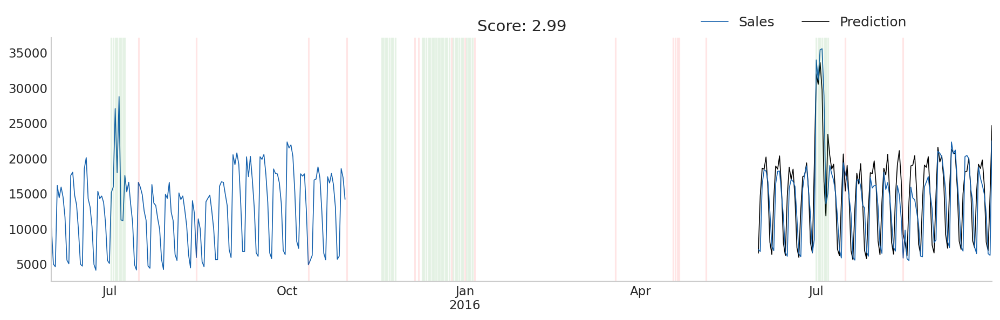

In [ ]:
my_catboost.fit()
my_catboost.predict()
my_catboost.plot()

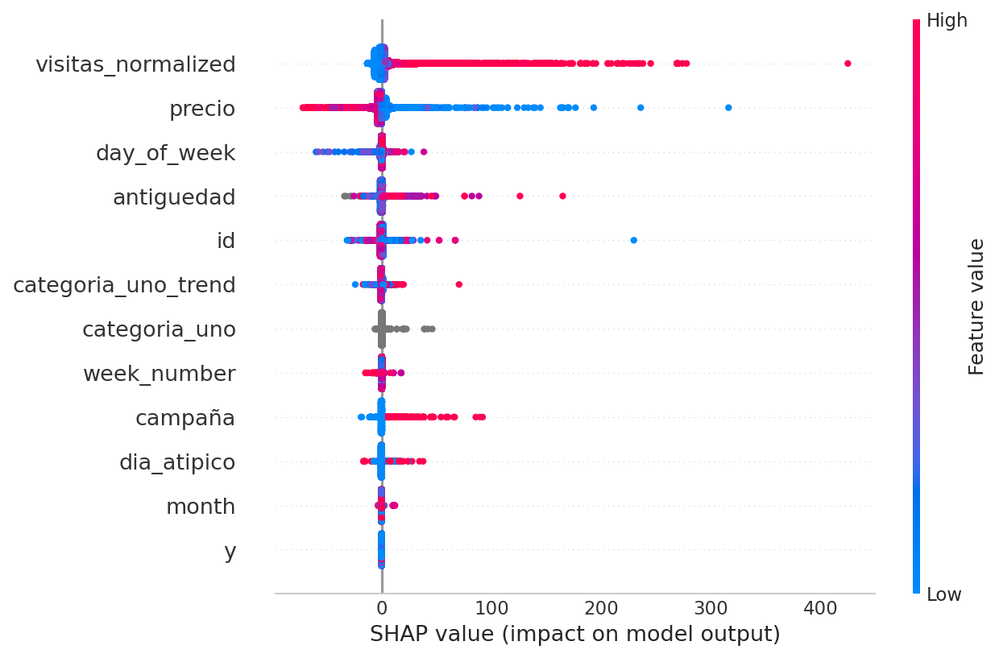

In [ ]:
explainer = shap.Explainer(my_catboost.model)
shap_values = explainer(my_catboost.train.drop(columns='fecha'))

shap.plots.beeswarm(shap_values, max_display=20)

### <a name="catboostTest"> 3.3.2 Catboost > Test </a>

In [ ]:
df_aux = df.copy()
df_test_aux = df_test.copy()

X_train = df_aux.loc[
    (df_aux["fecha"] < "2016-01-01") &
    (df_aux["fecha"] >= "2015-10-01")
].copy()

X_train['id'] = X_train['id'].astype(int)
X_train['week_number'] = X_train['week_number'].astype(int)

X_test = df_test_aux.copy()
X_test['id'] = X_test['id'].astype(int)

In [ ]:
my_catboost_test = MyCatBoost(
    X_train,
    X_test,
    numerical,
    categorical,
    holidays,
    validation=False
)

In [ ]:
my_catboost_test.fit()
my_catboost_test.predict()
my_catboost_test.plot()

### <a name="LightGBM">3.4 LightGBM </a>

In [ ]:
class MyLightGBM(BaseModel):
    
    def __init__(self, df_train, df_test, numerical, categorical, holidays, validation=False):
        
        intersection = set(df_train['fecha']).intersection(set(df_test['fecha']))
        assert intersection == set(), "Train and test not well defined"
        
        self.numerical = numerical
        self.categorical = categorical
        self.features = numerical + categorical
        self.train_index = df_train[['fecha', 'id']].copy()
        self.test_index = df_test[['fecha', 'id']].copy()
        
        super().__init__(
            df_train[self.features + ['unidades_vendidas']],
            df_test,
            holidays,
            validation
        )
    
    def standarize(self):
        for feature in self.numerical:
            scaler = MinMaxScaler()
            self.train[feature] = scaler.fit_transform(self.train[[feature]])
            self.test[feature] = scaler.transform(self.test[[feature]])
            
    def encode(self):
        for feature in self.categorical:
            dummies = pd.get_dummies(self.train[feature], prefix=feature)
            self.train = pd.concat([self.train, dummies], axis=1)
            self.train.drop(columns=[feature], inplace=True)

            dummies = pd.get_dummies(self.test[feature], prefix=feature)
            self.test = pd.concat([self.test, dummies], axis=1)
            self.test.drop(columns=[feature], inplace=True)

        for col in self.test:
            if col not in self.train:
                self.test.drop(columns=[col], inplace=True)

        for col in self.train:
            if col not in self.test:
                self.train.drop(columns=[col], inplace=True)
        
    def fit(self):
        self.standarize()
        self.encode()
        
        self.model = lgbm.LGBMRegressor() #Next best params: learning_rate=0.003, num_leaves=500, max_bin=300, max_depth=30, n_estimators=900        
        _ = self.model.fit(self.train,self.y_train)
        
    def shap_beeswarm(self, check_additivity:bool):
        shap_explainer_lgbm = shap.Explainer(self.model, self.train)
        shap_values = shap_explainer_lgbm(self.train, check_additivity=check_additivity)
        shap.plots.beeswarm(shap_values, max_display= len(self.train.columns))     
    
    def predict(self):
        self.y_pred = self.model.predict(self.test)
        self.y_pred[self.y_pred < 0] = 0
        self.test[['fecha', 'id']] = self.test_index
        self.train[['fecha', 'id']] = self.train_index

### <a name="lightgbmVal">3.4.1 LightGBM > Validación </a>

In [ ]:
df_aux = df.copy()

X_train = df_aux.loc[df_aux["fecha"] < "2015-11-01"].copy()
X_train['id'] = X_train['id'].astype(int)

X_test  = df_aux.loc[df_aux["fecha"] >= "2016-06-01"].copy()
X_test['id'] = X_test['id'].astype(int)

In [ ]:
numerical = ['id', 'visitas_normalized', 'precio', 'antiguedad', 'categoria_uno_trend']
categorical = ['categoria_uno', 'dia_atipico', 'campaña', 'day_of_week', 'month', 'week_number']

In [ ]:
my_lightgbm = MyLightGBM(
    X_train,
    X_test,
    numerical,
    categorical,
    holidays,
    validation=True
)

100%|===================| 637195/637704 [17:13<00:00]        

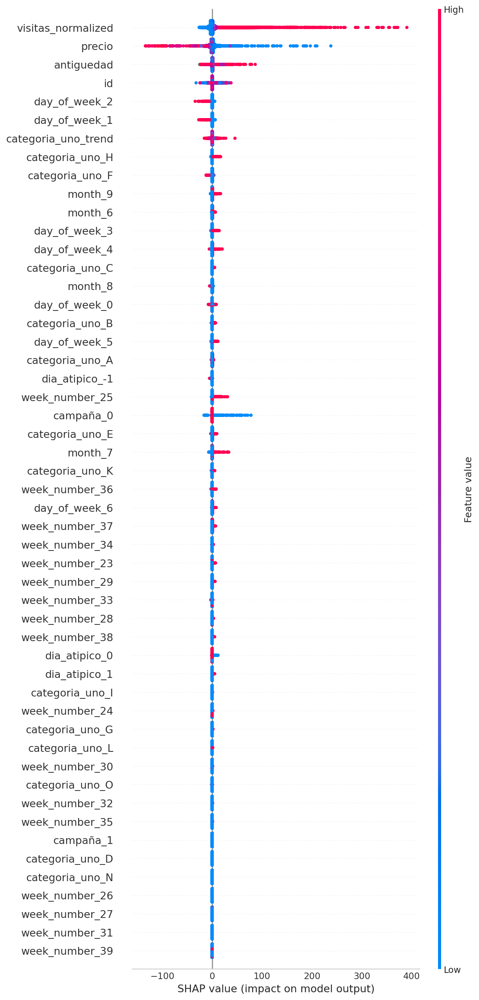

In [ ]:
my_lightgbm.fit()
my_lightgbm.shap_beeswarm(check_additivity=False)

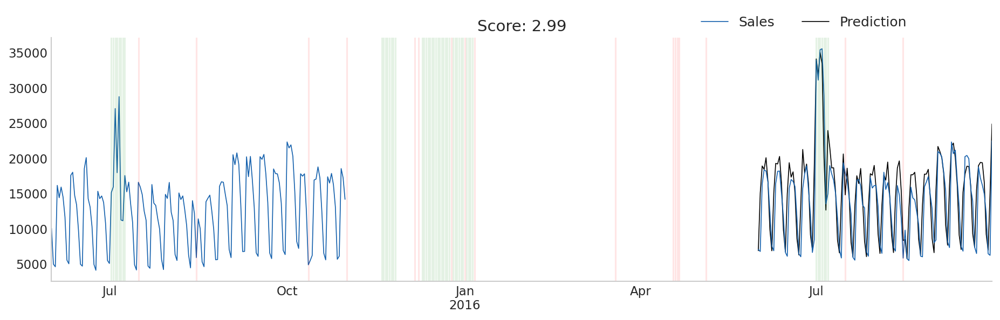

In [ ]:
my_lightgbm.predict()
my_lightgbm.plot()

### <a name="lightgbmTest">3.4.2 LightGBM > Test </a>

In [ ]:
df_aux = df.copy()
df_test_aux = df_test.copy()

X_train = df_aux.loc[
    (df_aux["fecha"] < "2016-01-01") &
    (df_aux["fecha"] >= "2015-10-01")
].copy()

X_train['id'] = X_train['id'].astype(int)

X_test = df_test_aux.copy()
X_test['id'] = X_test['id'].astype(int)

In [ ]:
my_lightgbm_test = MyLightGBM(
    X_train,
    X_test,
    numerical,
    categorical,
    holidays
)

In [ ]:
my_lightgbm_test.fit()
my_lightgbm_test.predict()
my_lightgbm_test.plot()

### <a name="blending">3.5 Blending</a>

In [ ]:
class Blender_all_models(BaseModel):
    
    def __init__(self, df_train, df_test, numerical, categorical, holidays, validation=False):
                
        self.numerical = numerical
        self.categorical = categorical
        
        self.features = numerical + categorical
        train_aux = df_train[['fecha', 'id','unidades_vendidas'] + self.features]
        if validation:
            test_aux = df_test[['fecha', 'id', 'unidades_vendidas'] + self.features]
        else:
            test_aux = df_test[['fecha', 'id'] + self.features]

        super().__init__(train_aux, test_aux, holidays, validation)
        
    def standarize(self):
        for feature in self.numerical:
            scaler = MinMaxScaler()
            self.train[feature] = scaler.fit_transform(self.train[[feature]])
            self.test[feature] = scaler.transform(self.test[[feature]])

    def encode(self):
        for feature in self.categorical:
            dummies = pd.get_dummies(self.train[feature], prefix=feature)
            self.train = pd.concat([self.train, dummies], axis=1)
            self.train.drop(columns=[feature], inplace=True)

            dummies = pd.get_dummies(self.test[feature], prefix=feature)
            self.test = pd.concat([self.test, dummies], axis=1)
            self.test.drop(columns=[feature], inplace=True)

        for col in self.test:
            if col not in self.train:
                self.test.drop(columns=[col], inplace=True)

        for col in self.train:
            if col not in self.test:
                self.train.drop(columns=[col], inplace=True)
        
    def fit(self):
        self.standarize()
        self.encode()
        
        self.model = LinearRegression()
        cols = self.train.columns.tolist()
        cols.remove('fecha')
        _ = self.model.fit(self.train[cols], self.y_train)
        
    def predict(self):
        cols = self.test.columns.tolist()
        cols.remove('fecha')
        self.y_pred = self.model.predict(self.test[cols])
        self.y_pred = np.ceil(self.y_pred).astype(int)
        self.y_pred[self.y_pred < 0] = 0
        
    def save_predictions(self, filename=None):
        
        if filename is None:
            filename = datetime.datetime.now().isoformat() + '.txt'

        solution = self.test.copy()
        solution['unidades_vendidas'] = self.y_pred.copy()
        
        assert solution.shape[0] == 212841, 'Carefull! Something went wrong!'
        
        solution.rename(columns={'fecha': 'FECHA', 'id': 'ID', 'unidades_vendidas': 'UNIDADES'}, inplace=True)
        solution['FECHA'] = solution['FECHA'].dt.strftime('%d/%m/%Y')
        headers = ['FECHA', 'ID', 'UNIDADES']
        solution[headers].to_csv(filename, encoding='UTF-8', sep='|', index=False)

In [ ]:
class Blender_regressors(BaseModel):
    
    def __init__(self, models, df_train, df_test, numerical, categorical, holidays, validation=False):
        
        self.models = models
        
        self.numerical = numerical
        self.categorical = categorical
        
        self.train_index = df_train[['fecha', 'id']].copy()
        self.test_index = df_test[['fecha', 'id']].copy()
        
        self.features = numerical + categorical
        train_aux = df_train[ ['fecha','unidades_vendidas'] + self.features]
        if validation:
            test_aux = df_test[ ['fecha','unidades_vendidas'] + self.features]
        else:
            test_aux = df_test[ ['fecha', 'id'] + self.features]

        super().__init__(train_aux, test_aux, holidays, validation)
        
    def standarize(self):
        for feature in self.numerical:
            scaler = MinMaxScaler()
            self.train[feature] = scaler.fit_transform(self.train[[feature]])
            self.test[feature] = scaler.transform(self.test[[feature]])

    def encode(self):
        for feature in self.categorical:
            dummies = pd.get_dummies(self.train[feature], prefix=feature)
            self.train = pd.concat([self.train, dummies], axis=1)
            self.train.drop(columns=[feature], inplace=True)

            dummies = pd.get_dummies(self.test[feature], prefix=feature)
            self.test = pd.concat([self.test, dummies], axis=1)
            self.test.drop(columns=[feature], inplace=True)

        for col in self.test:
            if col not in self.train:
                self.test.drop(columns=[col], inplace=True)

        for col in self.train:
            if col not in self.test:
                self.train.drop(columns=[col], inplace=True)
        
    def fit(self):
        
        self.standarize()
        self.encode()
        
        estimators = self.models
        
        self.model = StackingRegressor(
                    estimators, 
                    final_estimator=MLPRegressor(
                    
                        hidden_layer_sizes=(32, 16),
                        activation="relu", # avoid negative values
                        batch_size=64,
                        solver="adam", # stochastic gradient-based optimizer
                        learning_rate="adaptive", #  keeps the learning rate constant to ‘learning_rate_init’ (def=0.001) as long as training loss keeps decreasing.
                    
                    )
                )
        
        cols = self.train.columns.tolist()
        print(cols) # new
        cols.remove('fecha')
        _ = self.model.fit(self.train[cols], self.y_train)
        
        
    def predict(self):
        cols = self.test.columns.tolist()
        cols.remove('fecha')
        self.y_pred = self.model.predict(self.test[cols])
        #self.y_pred = np.ceil(self.y_pred).astype(int)
        self.y_pred[self.y_pred < 0] = 0
        for i in self.y_pred: print(i)
            
        self.test[['fecha', 'id']] = self.test_index
        self.train[['fecha', 'id']] = self.train_index
        
        
    def save_predictions(self, filename=None):
        
        if filename is None:
            filename = datetime.datetime.now().isoformat() + '.txt'

        solution = self.test.copy()
        solution['unidades_vendidas'] = self.y_pred.copy()
        
        assert solution.shape[0] == 212841, 'Carefull! Something went wrong!'
        
        solution.rename(columns={'fecha': 'FECHA', 'id': 'ID', 'unidades_vendidas': 'UNIDADES'}, inplace=True)
        solution['FECHA'] = solution['FECHA'].dt.strftime('%d/%m/%Y')
        headers = ['FECHA', 'ID', 'UNIDADES']
        solution[headers].to_csv(filename, encoding='UTF-8', sep='|', index=False)

### <a name="blendingVal">3.5.1 Blending > Validation</a>

#### <a name="blendingVal">3.5.1.1 Blending > Regressores</a>

In [ ]:
X_train = df.loc[df["fecha"] < "2015-11-01"].copy().reset_index()
X_test = df.loc[df["fecha"] >= "2016-06-01"].copy().reset_index()

In [ ]:
estimators = [ ( 'xgboost',xgb.XGBRegressor() ),
              ('catboost',CatBoostRegressor() ),
              ('lightgbm',lgbm.LGBMRegressor() )]

In [ ]:
my_blender_regr = Blender_regressors(
    estimators,
    X_train,
    X_test,
    numerical,
    categorical,
    #['xgboost', 'prophet'], # ,'lightgbm'
    #['day_of_week'], 
    holidays,
    validation=True
)

['fecha', 'id', 'visitas_normalized', 'precio', 'antiguedad', 'categoria_uno_trend', 'categoria_uno_A', 'categoria_uno_B', 'categoria_uno_C', 'categoria_uno_D', 'categoria_uno_E', 'categoria_uno_F', 'categoria_uno_G', 'categoria_uno_H', 'categoria_uno_I', 'categoria_uno_K', 'categoria_uno_L', 'categoria_uno_N', 'categoria_uno_O', 'dia_atipico_-1', 'dia_atipico_0', 'dia_atipico_1', 'campaña_0', 'campaña_1', 'day_of_week_0', 'day_of_week_1', 'day_of_week_2', 'day_of_week_3', 'day_of_week_4', 'day_of_week_5', 'day_of_week_6', 'month_6', 'month_7', 'month_8', 'month_9', 'week_number_23', 'week_number_24', 'week_number_25', 'week_number_26', 'week_number_27', 'week_number_28', 'week_number_29', 'week_number_30', 'week_number_31', 'week_number_32', 'week_number_33', 'week_number_34', 'week_number_35', 'week_number_36', 'week_number_37', 'week_number_38', 'week_number_39']
Learning rate set to 0.123203
0:	learn: 12.7393278	total: 64.8ms	remaining: 1m 4s
1:	learn: 12.4619818	total: 123ms	remai

139:	learn: 9.6373550	total: 17.8s	remaining: 1m 49s
140:	learn: 9.6301342	total: 17.9s	remaining: 1m 49s
141:	learn: 9.6280053	total: 18s	remaining: 1m 48s
142:	learn: 9.6243988	total: 18.1s	remaining: 1m 48s
143:	learn: 9.6229469	total: 18.3s	remaining: 1m 48s
144:	learn: 9.6195582	total: 18.4s	remaining: 1m 48s
145:	learn: 9.6179685	total: 18.5s	remaining: 1m 48s
146:	learn: 9.6148731	total: 18.6s	remaining: 1m 48s
147:	learn: 9.6141016	total: 18.8s	remaining: 1m 48s
148:	learn: 9.6113492	total: 18.9s	remaining: 1m 47s
149:	learn: 9.6068843	total: 18.9s	remaining: 1m 47s
150:	learn: 9.6027748	total: 19s	remaining: 1m 46s
151:	learn: 9.5964431	total: 19s	remaining: 1m 46s
152:	learn: 9.5957306	total: 19.1s	remaining: 1m 45s
153:	learn: 9.5914322	total: 19.2s	remaining: 1m 45s
154:	learn: 9.5878028	total: 19.3s	remaining: 1m 44s
155:	learn: 9.5838620	total: 19.3s	remaining: 1m 44s
156:	learn: 9.5832010	total: 19.4s	remaining: 1m 43s
157:	learn: 9.5764915	total: 19.4s	remaining: 1m 43s

295:	learn: 8.9987444	total: 33.7s	remaining: 1m 20s
296:	learn: 8.9964124	total: 33.7s	remaining: 1m 19s
297:	learn: 8.9937562	total: 33.8s	remaining: 1m 19s
298:	learn: 8.9922505	total: 33.9s	remaining: 1m 19s
299:	learn: 8.9862608	total: 33.9s	remaining: 1m 19s
300:	learn: 8.9833240	total: 34s	remaining: 1m 18s
301:	learn: 8.9819907	total: 34.2s	remaining: 1m 18s
302:	learn: 8.9815329	total: 34.3s	remaining: 1m 18s
303:	learn: 8.9800579	total: 34.4s	remaining: 1m 18s
304:	learn: 8.9796282	total: 34.5s	remaining: 1m 18s
305:	learn: 8.9767271	total: 34.7s	remaining: 1m 18s
306:	learn: 8.9748260	total: 34.8s	remaining: 1m 18s
307:	learn: 8.9744542	total: 34.9s	remaining: 1m 18s
308:	learn: 8.9728552	total: 35s	remaining: 1m 18s
309:	learn: 8.9712535	total: 35.2s	remaining: 1m 18s
310:	learn: 8.9659004	total: 35.3s	remaining: 1m 18s
311:	learn: 8.9636804	total: 35.4s	remaining: 1m 18s
312:	learn: 8.9626548	total: 35.5s	remaining: 1m 17s
313:	learn: 8.9603861	total: 35.6s	remaining: 1m 1

452:	learn: 8.6017346	total: 48.9s	remaining: 59.1s
453:	learn: 8.6000093	total: 49s	remaining: 59s
454:	learn: 8.5968961	total: 49.1s	remaining: 58.8s
455:	learn: 8.5923829	total: 49.2s	remaining: 58.7s
456:	learn: 8.5919505	total: 49.4s	remaining: 58.7s
457:	learn: 8.5907907	total: 49.5s	remaining: 58.5s
458:	learn: 8.5868107	total: 49.6s	remaining: 58.4s
459:	learn: 8.5849484	total: 49.7s	remaining: 58.3s
460:	learn: 8.5833997	total: 49.7s	remaining: 58.2s
461:	learn: 8.5811894	total: 49.8s	remaining: 58s
462:	learn: 8.5805703	total: 49.9s	remaining: 57.8s
463:	learn: 8.5791383	total: 49.9s	remaining: 57.6s
464:	learn: 8.5776254	total: 50s	remaining: 57.5s
465:	learn: 8.5766240	total: 50s	remaining: 57.3s
466:	learn: 8.5752675	total: 50.1s	remaining: 57.2s
467:	learn: 8.5737158	total: 50.2s	remaining: 57s
468:	learn: 8.5717540	total: 50.2s	remaining: 56.9s
469:	learn: 8.5706127	total: 50.3s	remaining: 56.7s
470:	learn: 8.5696421	total: 50.3s	remaining: 56.5s
471:	learn: 8.5673439	to

613:	learn: 8.3050175	total: 1m 4s	remaining: 40.5s
614:	learn: 8.2981081	total: 1m 4s	remaining: 40.5s
615:	learn: 8.2967663	total: 1m 4s	remaining: 40.4s
616:	learn: 8.2945802	total: 1m 4s	remaining: 40.3s
617:	learn: 8.2727268	total: 1m 5s	remaining: 40.2s
618:	learn: 8.2700520	total: 1m 5s	remaining: 40.1s
619:	learn: 8.2690613	total: 1m 5s	remaining: 40s
620:	learn: 8.2678560	total: 1m 5s	remaining: 39.9s
621:	learn: 8.2669738	total: 1m 5s	remaining: 39.8s
622:	learn: 8.2660614	total: 1m 5s	remaining: 39.8s
623:	learn: 8.2653661	total: 1m 5s	remaining: 39.7s
624:	learn: 8.2646750	total: 1m 5s	remaining: 39.6s
625:	learn: 8.2645279	total: 1m 6s	remaining: 39.5s
626:	learn: 8.2624617	total: 1m 6s	remaining: 39.3s
627:	learn: 8.2620193	total: 1m 6s	remaining: 39.2s
628:	learn: 8.2607337	total: 1m 6s	remaining: 39.1s
629:	learn: 8.2598875	total: 1m 6s	remaining: 39.1s
630:	learn: 8.2557205	total: 1m 6s	remaining: 39s
631:	learn: 8.2543095	total: 1m 6s	remaining: 38.8s
632:	learn: 8.25

771:	learn: 7.9809029	total: 1m 16s	remaining: 22.5s
772:	learn: 7.9798028	total: 1m 16s	remaining: 22.4s
773:	learn: 7.9796940	total: 1m 16s	remaining: 22.3s
774:	learn: 7.9784800	total: 1m 16s	remaining: 22.1s
775:	learn: 7.9767561	total: 1m 16s	remaining: 22s
776:	learn: 7.9751381	total: 1m 16s	remaining: 21.9s
777:	learn: 7.9608700	total: 1m 16s	remaining: 21.8s
778:	learn: 7.9595558	total: 1m 16s	remaining: 21.7s
779:	learn: 7.9586857	total: 1m 16s	remaining: 21.6s
780:	learn: 7.9578776	total: 1m 16s	remaining: 21.5s
781:	learn: 7.9570514	total: 1m 16s	remaining: 21.4s
782:	learn: 7.9563829	total: 1m 16s	remaining: 21.3s
783:	learn: 7.9558604	total: 1m 16s	remaining: 21.1s
784:	learn: 7.9555604	total: 1m 16s	remaining: 21s
785:	learn: 7.9552879	total: 1m 16s	remaining: 20.9s
786:	learn: 7.9552524	total: 1m 16s	remaining: 20.8s
787:	learn: 7.9530432	total: 1m 17s	remaining: 20.7s
788:	learn: 7.9512773	total: 1m 17s	remaining: 20.6s
789:	learn: 7.9496330	total: 1m 17s	remaining: 20.

927:	learn: 7.7957693	total: 1m 31s	remaining: 7.09s
928:	learn: 7.7952372	total: 1m 31s	remaining: 7s
929:	learn: 7.7820340	total: 1m 31s	remaining: 6.9s
930:	learn: 7.7816254	total: 1m 31s	remaining: 6.8s
931:	learn: 7.7809018	total: 1m 31s	remaining: 6.71s
932:	learn: 7.7798334	total: 1m 32s	remaining: 6.61s
933:	learn: 7.7796096	total: 1m 32s	remaining: 6.51s
934:	learn: 7.7672255	total: 1m 32s	remaining: 6.41s
935:	learn: 7.7598007	total: 1m 32s	remaining: 6.31s
936:	learn: 7.7590549	total: 1m 32s	remaining: 6.22s
937:	learn: 7.7588705	total: 1m 32s	remaining: 6.12s
938:	learn: 7.7581700	total: 1m 32s	remaining: 6.02s
939:	learn: 7.7578550	total: 1m 32s	remaining: 5.92s
940:	learn: 7.7570232	total: 1m 32s	remaining: 5.82s
941:	learn: 7.7455137	total: 1m 32s	remaining: 5.72s
942:	learn: 7.7449742	total: 1m 33s	remaining: 5.62s
943:	learn: 7.7433136	total: 1m 33s	remaining: 5.53s
944:	learn: 7.7424250	total: 1m 33s	remaining: 5.43s
945:	learn: 7.7411417	total: 1m 33s	remaining: 5.33

88:	learn: 9.8545793	total: 4.41s	remaining: 45.1s
89:	learn: 9.8477984	total: 4.45s	remaining: 45s
90:	learn: 9.8354740	total: 4.49s	remaining: 44.9s
91:	learn: 9.8286596	total: 4.54s	remaining: 44.8s
92:	learn: 9.8240649	total: 4.58s	remaining: 44.7s
93:	learn: 9.8179781	total: 4.63s	remaining: 44.6s
94:	learn: 9.8122010	total: 4.67s	remaining: 44.5s
95:	learn: 9.8056080	total: 4.72s	remaining: 44.4s
96:	learn: 9.7949686	total: 4.76s	remaining: 44.4s
97:	learn: 9.7896501	total: 4.81s	remaining: 44.3s
98:	learn: 9.7777165	total: 4.86s	remaining: 44.2s
99:	learn: 9.7710069	total: 4.9s	remaining: 44.1s
100:	learn: 9.7620394	total: 4.95s	remaining: 44s
101:	learn: 9.7572829	total: 4.99s	remaining: 44s
102:	learn: 9.7513570	total: 5.04s	remaining: 43.9s
103:	learn: 9.7480395	total: 5.09s	remaining: 43.9s
104:	learn: 9.7400881	total: 5.15s	remaining: 43.9s
105:	learn: 9.7346285	total: 5.19s	remaining: 43.8s
106:	learn: 9.7301938	total: 5.24s	remaining: 43.7s
107:	learn: 9.7235544	total: 5.

247:	learn: 9.0444579	total: 11.9s	remaining: 36.1s
248:	learn: 9.0426882	total: 11.9s	remaining: 36s
249:	learn: 9.0220398	total: 12s	remaining: 35.9s
250:	learn: 9.0165456	total: 12s	remaining: 35.9s
251:	learn: 9.0140160	total: 12.1s	remaining: 35.8s
252:	learn: 9.0120318	total: 12.1s	remaining: 35.8s
253:	learn: 9.0095177	total: 12.2s	remaining: 35.7s
254:	learn: 9.0064499	total: 12.2s	remaining: 35.7s
255:	learn: 9.0037357	total: 12.3s	remaining: 35.7s
256:	learn: 8.9999109	total: 12.3s	remaining: 35.6s
257:	learn: 8.9991652	total: 12.4s	remaining: 35.6s
258:	learn: 8.9806042	total: 12.4s	remaining: 35.5s
259:	learn: 8.9797672	total: 12.5s	remaining: 35.5s
260:	learn: 8.9767985	total: 12.5s	remaining: 35.4s
261:	learn: 8.9657426	total: 12.6s	remaining: 35.4s
262:	learn: 8.9636819	total: 12.6s	remaining: 35.4s
263:	learn: 8.9629106	total: 12.7s	remaining: 35.3s
264:	learn: 8.9624710	total: 12.7s	remaining: 35.2s
265:	learn: 8.9361150	total: 12.7s	remaining: 35.2s
266:	learn: 8.9330

407:	learn: 8.3909304	total: 19.6s	remaining: 28.5s
408:	learn: 8.3902985	total: 19.7s	remaining: 28.4s
409:	learn: 8.3882748	total: 19.7s	remaining: 28.4s
410:	learn: 8.3849027	total: 19.8s	remaining: 28.3s
411:	learn: 8.3823759	total: 19.8s	remaining: 28.3s
412:	learn: 8.3811577	total: 19.8s	remaining: 28.2s
413:	learn: 8.3796325	total: 19.9s	remaining: 28.2s
414:	learn: 8.3783269	total: 19.9s	remaining: 28.1s
415:	learn: 8.3760868	total: 20s	remaining: 28.1s
416:	learn: 8.3744002	total: 20s	remaining: 28s
417:	learn: 8.3722236	total: 20.1s	remaining: 28s
418:	learn: 8.3663431	total: 20.1s	remaining: 27.9s
419:	learn: 8.3607448	total: 20.2s	remaining: 27.9s
420:	learn: 8.3591561	total: 20.2s	remaining: 27.8s
421:	learn: 8.3580500	total: 20.3s	remaining: 27.8s
422:	learn: 8.3568154	total: 20.3s	remaining: 27.7s
423:	learn: 8.3365846	total: 20.4s	remaining: 27.7s
424:	learn: 8.3355393	total: 20.4s	remaining: 27.6s
425:	learn: 8.3323737	total: 20.5s	remaining: 27.6s
426:	learn: 8.330922

568:	learn: 8.0482960	total: 27.2s	remaining: 20.6s
569:	learn: 8.0469176	total: 27.3s	remaining: 20.6s
570:	learn: 8.0463874	total: 27.3s	remaining: 20.5s
571:	learn: 8.0456380	total: 27.4s	remaining: 20.5s
572:	learn: 8.0447239	total: 27.4s	remaining: 20.4s
573:	learn: 8.0404928	total: 27.5s	remaining: 20.4s
574:	learn: 8.0396252	total: 27.5s	remaining: 20.3s
575:	learn: 8.0312109	total: 27.6s	remaining: 20.3s
576:	learn: 8.0299488	total: 27.6s	remaining: 20.2s
577:	learn: 8.0284867	total: 27.7s	remaining: 20.2s
578:	learn: 8.0270439	total: 27.7s	remaining: 20.1s
579:	learn: 8.0258408	total: 27.8s	remaining: 20.1s
580:	learn: 8.0253925	total: 27.8s	remaining: 20s
581:	learn: 8.0242245	total: 27.8s	remaining: 20s
582:	learn: 8.0217311	total: 27.9s	remaining: 20s
583:	learn: 8.0208079	total: 27.9s	remaining: 19.9s
584:	learn: 8.0199799	total: 28s	remaining: 19.9s
585:	learn: 8.0192661	total: 28s	remaining: 19.8s
586:	learn: 8.0184543	total: 28.1s	remaining: 19.8s
587:	learn: 8.0172791	

730:	learn: 7.7538554	total: 35s	remaining: 12.9s
731:	learn: 7.7531743	total: 35s	remaining: 12.8s
732:	learn: 7.7521663	total: 35.1s	remaining: 12.8s
733:	learn: 7.7516505	total: 35.1s	remaining: 12.7s
734:	learn: 7.7509388	total: 35.2s	remaining: 12.7s
735:	learn: 7.7501083	total: 35.2s	remaining: 12.6s
736:	learn: 7.7495435	total: 35.3s	remaining: 12.6s
737:	learn: 7.7483698	total: 35.3s	remaining: 12.5s
738:	learn: 7.7476904	total: 35.4s	remaining: 12.5s
739:	learn: 7.7471246	total: 35.4s	remaining: 12.4s
740:	learn: 7.7465679	total: 35.5s	remaining: 12.4s
741:	learn: 7.7460302	total: 35.5s	remaining: 12.4s
742:	learn: 7.7451980	total: 35.6s	remaining: 12.3s
743:	learn: 7.7442327	total: 35.6s	remaining: 12.3s
744:	learn: 7.7432205	total: 35.7s	remaining: 12.2s
745:	learn: 7.7421599	total: 35.7s	remaining: 12.2s
746:	learn: 7.7410172	total: 35.8s	remaining: 12.1s
747:	learn: 7.7404942	total: 35.8s	remaining: 12.1s
748:	learn: 7.7299303	total: 35.9s	remaining: 12s
749:	learn: 7.7294

891:	learn: 7.5468462	total: 42.9s	remaining: 5.19s
892:	learn: 7.5461392	total: 42.9s	remaining: 5.14s
893:	learn: 7.5450075	total: 43s	remaining: 5.1s
894:	learn: 7.5443594	total: 43.1s	remaining: 5.05s
895:	learn: 7.5437712	total: 43.1s	remaining: 5s
896:	learn: 7.5434356	total: 43.2s	remaining: 4.96s
897:	learn: 7.5419916	total: 43.2s	remaining: 4.91s
898:	learn: 7.5413026	total: 43.3s	remaining: 4.87s
899:	learn: 7.5402276	total: 43.4s	remaining: 4.82s
900:	learn: 7.5393927	total: 43.4s	remaining: 4.77s
901:	learn: 7.5387791	total: 43.5s	remaining: 4.72s
902:	learn: 7.5382764	total: 43.5s	remaining: 4.67s
903:	learn: 7.5374462	total: 43.6s	remaining: 4.63s
904:	learn: 7.5360443	total: 43.6s	remaining: 4.58s
905:	learn: 7.5347631	total: 43.7s	remaining: 4.53s
906:	learn: 7.5342634	total: 43.7s	remaining: 4.48s
907:	learn: 7.5337419	total: 43.8s	remaining: 4.43s
908:	learn: 7.5331303	total: 43.8s	remaining: 4.38s
909:	learn: 7.5321351	total: 43.9s	remaining: 4.34s
910:	learn: 7.5262

51:	learn: 10.6015927	total: 2.72s	remaining: 49.5s
52:	learn: 10.5863591	total: 2.76s	remaining: 49.4s
53:	learn: 10.5762656	total: 2.81s	remaining: 49.3s
54:	learn: 10.5574208	total: 2.86s	remaining: 49.1s
55:	learn: 10.5425857	total: 2.9s	remaining: 48.9s
56:	learn: 10.5287825	total: 2.95s	remaining: 48.8s
57:	learn: 10.5204720	total: 3s	remaining: 48.7s
58:	learn: 10.5125215	total: 3.04s	remaining: 48.6s
59:	learn: 10.5055832	total: 3.09s	remaining: 48.5s
60:	learn: 10.4979775	total: 3.14s	remaining: 48.4s
61:	learn: 10.4868705	total: 3.19s	remaining: 48.3s
62:	learn: 10.4821082	total: 3.24s	remaining: 48.2s
63:	learn: 10.4764546	total: 3.28s	remaining: 48s
64:	learn: 10.4603424	total: 3.33s	remaining: 47.9s
65:	learn: 10.4567387	total: 3.37s	remaining: 47.7s
66:	learn: 10.4501534	total: 3.42s	remaining: 47.6s
67:	learn: 10.4418630	total: 3.46s	remaining: 47.4s
68:	learn: 10.4340142	total: 3.5s	remaining: 47.3s
69:	learn: 10.4283854	total: 3.55s	remaining: 47.1s
70:	learn: 10.41626

212:	learn: 9.5717790	total: 10.5s	remaining: 38.7s
213:	learn: 9.5668908	total: 10.5s	remaining: 38.6s
214:	learn: 9.5663282	total: 10.6s	remaining: 38.6s
215:	learn: 9.5612234	total: 10.6s	remaining: 38.6s
216:	learn: 9.5583184	total: 10.7s	remaining: 38.5s
217:	learn: 9.5562934	total: 10.7s	remaining: 38.5s
218:	learn: 9.5516900	total: 10.8s	remaining: 38.4s
219:	learn: 9.5471421	total: 10.8s	remaining: 38.4s
220:	learn: 9.5453632	total: 10.9s	remaining: 38.3s
221:	learn: 9.5404592	total: 10.9s	remaining: 38.2s
222:	learn: 9.5164531	total: 11s	remaining: 38.2s
223:	learn: 9.5139791	total: 11s	remaining: 38.1s
224:	learn: 9.5071631	total: 11.1s	remaining: 38.1s
225:	learn: 9.5034451	total: 11.1s	remaining: 38s
226:	learn: 9.5029132	total: 11.2s	remaining: 38s
227:	learn: 9.5008321	total: 11.2s	remaining: 37.9s
228:	learn: 9.4974950	total: 11.2s	remaining: 37.9s
229:	learn: 9.4950166	total: 11.3s	remaining: 37.8s
230:	learn: 9.4909913	total: 11.3s	remaining: 37.7s
231:	learn: 9.488602

372:	learn: 8.9092494	total: 18.1s	remaining: 30.4s
373:	learn: 8.9074822	total: 18.1s	remaining: 30.3s
374:	learn: 8.9055847	total: 18.2s	remaining: 30.3s
375:	learn: 8.9051488	total: 18.2s	remaining: 30.2s
376:	learn: 8.8874760	total: 18.3s	remaining: 30.2s
377:	learn: 8.8870712	total: 18.3s	remaining: 30.1s
378:	learn: 8.8859148	total: 18.3s	remaining: 30.1s
379:	learn: 8.8821358	total: 18.4s	remaining: 30s
380:	learn: 8.8809301	total: 18.4s	remaining: 30s
381:	learn: 8.8789487	total: 18.5s	remaining: 29.9s
382:	learn: 8.8777128	total: 18.5s	remaining: 29.9s
383:	learn: 8.8774423	total: 18.6s	remaining: 29.8s
384:	learn: 8.8714645	total: 18.6s	remaining: 29.8s
385:	learn: 8.8699884	total: 18.7s	remaining: 29.7s
386:	learn: 8.8679324	total: 18.7s	remaining: 29.7s
387:	learn: 8.8654477	total: 18.8s	remaining: 29.6s
388:	learn: 8.8636845	total: 18.8s	remaining: 29.6s
389:	learn: 8.8615278	total: 18.9s	remaining: 29.5s
390:	learn: 8.8577767	total: 18.9s	remaining: 29.5s
391:	learn: 8.85

532:	learn: 8.5163995	total: 25.7s	remaining: 22.5s
533:	learn: 8.5144835	total: 25.7s	remaining: 22.5s
534:	learn: 8.5127453	total: 25.8s	remaining: 22.4s
535:	learn: 8.5098383	total: 25.8s	remaining: 22.4s
536:	learn: 8.5092616	total: 25.9s	remaining: 22.3s
537:	learn: 8.5078831	total: 25.9s	remaining: 22.3s
538:	learn: 8.5065807	total: 26s	remaining: 22.2s
539:	learn: 8.4938870	total: 26s	remaining: 22.2s
540:	learn: 8.4923014	total: 26.1s	remaining: 22.1s
541:	learn: 8.4917779	total: 26.1s	remaining: 22.1s
542:	learn: 8.4887021	total: 26.2s	remaining: 22s
543:	learn: 8.4849293	total: 26.2s	remaining: 22s
544:	learn: 8.4824505	total: 26.2s	remaining: 21.9s
545:	learn: 8.4808548	total: 26.3s	remaining: 21.9s
546:	learn: 8.4786398	total: 26.3s	remaining: 21.8s
547:	learn: 8.4771929	total: 26.4s	remaining: 21.8s
548:	learn: 8.4763730	total: 26.4s	remaining: 21.7s
549:	learn: 8.4761153	total: 26.5s	remaining: 21.7s
550:	learn: 8.4751587	total: 26.5s	remaining: 21.6s
551:	learn: 8.474906

692:	learn: 8.2341606	total: 33.2s	remaining: 14.7s
693:	learn: 8.2337042	total: 33.3s	remaining: 14.7s
694:	learn: 8.2321539	total: 33.3s	remaining: 14.6s
695:	learn: 8.2320540	total: 33.4s	remaining: 14.6s
696:	learn: 8.2229140	total: 33.4s	remaining: 14.5s
697:	learn: 8.2218118	total: 33.5s	remaining: 14.5s
698:	learn: 8.2206594	total: 33.5s	remaining: 14.4s
699:	learn: 8.2201825	total: 33.5s	remaining: 14.4s
700:	learn: 8.2188987	total: 33.6s	remaining: 14.3s
701:	learn: 8.2174751	total: 33.7s	remaining: 14.3s
702:	learn: 8.2167058	total: 33.7s	remaining: 14.2s
703:	learn: 8.2156774	total: 33.8s	remaining: 14.2s
704:	learn: 8.2147683	total: 33.8s	remaining: 14.1s
705:	learn: 8.2133284	total: 33.9s	remaining: 14.1s
706:	learn: 8.2113815	total: 33.9s	remaining: 14s
707:	learn: 8.2102356	total: 33.9s	remaining: 14s
708:	learn: 8.2087115	total: 34s	remaining: 14s
709:	learn: 8.2068627	total: 34s	remaining: 13.9s
710:	learn: 8.2064385	total: 34.1s	remaining: 13.9s
711:	learn: 8.2052006	

855:	learn: 7.7565784	total: 41.1s	remaining: 6.91s
856:	learn: 7.7548125	total: 41.1s	remaining: 6.86s
857:	learn: 7.7541462	total: 41.2s	remaining: 6.81s
858:	learn: 7.7516515	total: 41.2s	remaining: 6.76s
859:	learn: 7.7511558	total: 41.3s	remaining: 6.71s
860:	learn: 7.7504614	total: 41.3s	remaining: 6.67s
861:	learn: 7.7499634	total: 41.4s	remaining: 6.62s
862:	learn: 7.7488778	total: 41.4s	remaining: 6.57s
863:	learn: 7.7470610	total: 41.5s	remaining: 6.53s
864:	learn: 7.7459848	total: 41.5s	remaining: 6.48s
865:	learn: 7.7452549	total: 41.6s	remaining: 6.43s
866:	learn: 7.7444092	total: 41.6s	remaining: 6.38s
867:	learn: 7.7436629	total: 41.6s	remaining: 6.33s
868:	learn: 7.7420382	total: 41.7s	remaining: 6.29s
869:	learn: 7.7407230	total: 41.7s	remaining: 6.24s
870:	learn: 7.7396123	total: 41.8s	remaining: 6.19s
871:	learn: 7.7394018	total: 41.8s	remaining: 6.14s
872:	learn: 7.7388595	total: 41.9s	remaining: 6.09s
873:	learn: 7.7371026	total: 41.9s	remaining: 6.05s
874:	learn: 

15:	learn: 10.4523440	total: 881ms	remaining: 54.2s
16:	learn: 10.4075200	total: 938ms	remaining: 54.3s
17:	learn: 10.3596250	total: 998ms	remaining: 54.4s
18:	learn: 10.3232215	total: 1.06s	remaining: 54.5s
19:	learn: 10.2924522	total: 1.12s	remaining: 54.9s
20:	learn: 10.2569482	total: 1.17s	remaining: 54.7s
21:	learn: 10.2220215	total: 1.23s	remaining: 54.5s
22:	learn: 10.1980904	total: 1.28s	remaining: 54.4s
23:	learn: 10.1671700	total: 1.33s	remaining: 54.2s
24:	learn: 10.1329725	total: 1.39s	remaining: 54.3s
25:	learn: 10.1139714	total: 1.45s	remaining: 54.2s
26:	learn: 10.0944322	total: 1.5s	remaining: 54.2s
27:	learn: 10.0715583	total: 1.56s	remaining: 54.2s
28:	learn: 10.0440815	total: 1.61s	remaining: 54s
29:	learn: 10.0246253	total: 1.67s	remaining: 53.9s
30:	learn: 10.0061847	total: 1.72s	remaining: 53.6s
31:	learn: 9.9888000	total: 1.76s	remaining: 53.3s
32:	learn: 9.9686071	total: 1.82s	remaining: 53.3s
33:	learn: 9.9391398	total: 1.87s	remaining: 53.1s
34:	learn: 9.91782

177:	learn: 8.7294106	total: 9.14s	remaining: 42.2s
178:	learn: 8.7278444	total: 9.19s	remaining: 42.1s
179:	learn: 8.7260009	total: 9.23s	remaining: 42s
180:	learn: 8.7243938	total: 9.27s	remaining: 41.9s
181:	learn: 8.7230460	total: 9.32s	remaining: 41.9s
182:	learn: 8.6979441	total: 9.38s	remaining: 41.9s
183:	learn: 8.6910918	total: 9.42s	remaining: 41.8s
184:	learn: 8.6883689	total: 9.47s	remaining: 41.7s
185:	learn: 8.6784056	total: 9.52s	remaining: 41.6s
186:	learn: 8.6765316	total: 9.56s	remaining: 41.6s
187:	learn: 8.6729757	total: 9.62s	remaining: 41.5s
188:	learn: 8.6701157	total: 9.67s	remaining: 41.5s
189:	learn: 8.6676287	total: 9.72s	remaining: 41.4s
190:	learn: 8.6647530	total: 9.76s	remaining: 41.4s
191:	learn: 8.6338154	total: 9.82s	remaining: 41.3s
192:	learn: 8.6094864	total: 9.87s	remaining: 41.3s
193:	learn: 8.6063612	total: 9.92s	remaining: 41.2s
194:	learn: 8.6041781	total: 9.97s	remaining: 41.2s
195:	learn: 8.6015414	total: 10s	remaining: 41.1s
196:	learn: 8.59

336:	learn: 8.0122845	total: 17.6s	remaining: 34.7s
337:	learn: 8.0094616	total: 17.7s	remaining: 34.6s
338:	learn: 8.0072732	total: 17.7s	remaining: 34.5s
339:	learn: 8.0057189	total: 17.8s	remaining: 34.5s
340:	learn: 7.9987142	total: 17.8s	remaining: 34.4s
341:	learn: 7.9822909	total: 17.8s	remaining: 34.3s
342:	learn: 7.9785014	total: 17.9s	remaining: 34.3s
343:	learn: 7.9760150	total: 17.9s	remaining: 34.2s
344:	learn: 7.9755648	total: 18s	remaining: 34.1s
345:	learn: 7.9739003	total: 18s	remaining: 34.1s
346:	learn: 7.9723299	total: 18.1s	remaining: 34s
347:	learn: 7.9696053	total: 18.1s	remaining: 33.9s
348:	learn: 7.9631814	total: 18.1s	remaining: 33.9s
349:	learn: 7.9586159	total: 18.2s	remaining: 33.8s
350:	learn: 7.9568361	total: 18.2s	remaining: 33.7s
351:	learn: 7.9528330	total: 18.3s	remaining: 33.6s
352:	learn: 7.9498254	total: 18.3s	remaining: 33.6s
353:	learn: 7.9481277	total: 18.4s	remaining: 33.5s
354:	learn: 7.9445376	total: 18.4s	remaining: 33.4s
355:	learn: 7.9425

496:	learn: 7.6101642	total: 28.8s	remaining: 29.2s
497:	learn: 7.6085230	total: 29s	remaining: 29.2s
498:	learn: 7.6068535	total: 29.3s	remaining: 29.4s
499:	learn: 7.6059823	total: 29.4s	remaining: 29.4s
500:	learn: 7.6048325	total: 29.5s	remaining: 29.3s
501:	learn: 7.6033066	total: 29.5s	remaining: 29.3s
502:	learn: 7.6019508	total: 29.6s	remaining: 29.2s
503:	learn: 7.6006941	total: 29.6s	remaining: 29.2s
504:	learn: 7.5958276	total: 29.7s	remaining: 29.1s
505:	learn: 7.5945795	total: 29.8s	remaining: 29.1s
506:	learn: 7.5934036	total: 29.8s	remaining: 29s
507:	learn: 7.5924143	total: 29.9s	remaining: 28.9s
508:	learn: 7.5878318	total: 29.9s	remaining: 28.9s
509:	learn: 7.5859118	total: 30s	remaining: 28.8s
510:	learn: 7.5845271	total: 30s	remaining: 28.7s
511:	learn: 7.5824958	total: 30.1s	remaining: 28.7s
512:	learn: 7.5817274	total: 30.1s	remaining: 28.6s
513:	learn: 7.5806878	total: 30.2s	remaining: 28.6s
514:	learn: 7.5797925	total: 30.3s	remaining: 28.5s
515:	learn: 7.577929

659:	learn: 7.2906201	total: 37.3s	remaining: 19.2s
660:	learn: 7.2894041	total: 37.4s	remaining: 19.2s
661:	learn: 7.2881083	total: 37.4s	remaining: 19.1s
662:	learn: 7.2872162	total: 37.5s	remaining: 19s
663:	learn: 7.2865809	total: 37.5s	remaining: 19s
664:	learn: 7.2857309	total: 37.6s	remaining: 18.9s
665:	learn: 7.2839642	total: 37.6s	remaining: 18.9s
666:	learn: 7.2828091	total: 37.6s	remaining: 18.8s
667:	learn: 7.2813728	total: 37.7s	remaining: 18.7s
668:	learn: 7.2803267	total: 37.7s	remaining: 18.7s
669:	learn: 7.2769406	total: 37.8s	remaining: 18.6s
670:	learn: 7.2761042	total: 37.8s	remaining: 18.6s
671:	learn: 7.2754359	total: 37.9s	remaining: 18.5s
672:	learn: 7.2741544	total: 37.9s	remaining: 18.4s
673:	learn: 7.2711442	total: 38s	remaining: 18.4s
674:	learn: 7.2679842	total: 38s	remaining: 18.3s
675:	learn: 7.2669621	total: 38.1s	remaining: 18.2s
676:	learn: 7.2657969	total: 38.1s	remaining: 18.2s
677:	learn: 7.2651944	total: 38.2s	remaining: 18.1s
678:	learn: 7.264408

818:	learn: 7.0987018	total: 51.5s	remaining: 11.4s
819:	learn: 7.0982456	total: 51.7s	remaining: 11.3s
820:	learn: 7.0974371	total: 51.8s	remaining: 11.3s
821:	learn: 7.0969043	total: 51.9s	remaining: 11.2s
822:	learn: 7.0963301	total: 52.1s	remaining: 11.2s
823:	learn: 7.0952418	total: 52.4s	remaining: 11.2s
824:	learn: 7.0942475	total: 52.6s	remaining: 11.2s
825:	learn: 7.0917581	total: 52.9s	remaining: 11.1s
826:	learn: 7.0905526	total: 53.3s	remaining: 11.1s
827:	learn: 7.0895855	total: 53.7s	remaining: 11.2s
828:	learn: 7.0829559	total: 53.9s	remaining: 11.1s
829:	learn: 7.0807241	total: 54.2s	remaining: 11.1s
830:	learn: 7.0803457	total: 54.4s	remaining: 11.1s
831:	learn: 7.0779994	total: 54.7s	remaining: 11.1s
832:	learn: 7.0773463	total: 54.9s	remaining: 11s
833:	learn: 7.0770093	total: 55s	remaining: 11s
834:	learn: 7.0748016	total: 55.2s	remaining: 10.9s
835:	learn: 7.0743307	total: 55.3s	remaining: 10.8s
836:	learn: 7.0731668	total: 55.4s	remaining: 10.8s
837:	learn: 7.0710

976:	learn: 6.9166689	total: 1m 13s	remaining: 1.74s
977:	learn: 6.9160966	total: 1m 13s	remaining: 1.66s
978:	learn: 6.9159865	total: 1m 13s	remaining: 1.58s
979:	learn: 6.9154699	total: 1m 13s	remaining: 1.51s
980:	learn: 6.9143645	total: 1m 14s	remaining: 1.43s
981:	learn: 6.9134284	total: 1m 14s	remaining: 1.36s
982:	learn: 6.9128436	total: 1m 14s	remaining: 1.28s
983:	learn: 6.9105401	total: 1m 14s	remaining: 1.21s
984:	learn: 6.9103639	total: 1m 14s	remaining: 1.13s
985:	learn: 6.9095299	total: 1m 14s	remaining: 1.06s
986:	learn: 6.9091412	total: 1m 14s	remaining: 983ms
987:	learn: 6.9087173	total: 1m 14s	remaining: 907ms
988:	learn: 6.9085818	total: 1m 14s	remaining: 832ms
989:	learn: 6.9069522	total: 1m 14s	remaining: 756ms
990:	learn: 6.9061388	total: 1m 14s	remaining: 681ms
991:	learn: 6.9055928	total: 1m 15s	remaining: 605ms
992:	learn: 6.9051234	total: 1m 15s	remaining: 530ms
993:	learn: 6.9046726	total: 1m 15s	remaining: 454ms
994:	learn: 6.9041317	total: 1m 15s	remaining:

132:	learn: 10.1686388	total: 9.43s	remaining: 1m 1s
133:	learn: 10.1618651	total: 9.48s	remaining: 1m 1s
134:	learn: 10.1602970	total: 9.52s	remaining: 1m 1s
135:	learn: 10.1589089	total: 9.56s	remaining: 1m
136:	learn: 10.1508041	total: 9.61s	remaining: 1m
137:	learn: 10.1443552	total: 9.66s	remaining: 1m
138:	learn: 10.1271124	total: 9.72s	remaining: 1m
139:	learn: 10.1208551	total: 9.77s	remaining: 1m
140:	learn: 10.1189311	total: 9.81s	remaining: 59.8s
141:	learn: 10.1159377	total: 9.85s	remaining: 59.5s
142:	learn: 10.1132785	total: 9.9s	remaining: 59.3s
143:	learn: 10.1090865	total: 9.95s	remaining: 59.2s
144:	learn: 10.1036101	total: 10s	remaining: 59s
145:	learn: 10.1010769	total: 10s	remaining: 58.8s
146:	learn: 10.0965078	total: 10.1s	remaining: 58.6s
147:	learn: 10.0934115	total: 10.2s	remaining: 58.4s
148:	learn: 10.0918022	total: 10.2s	remaining: 58.4s
149:	learn: 10.0885212	total: 10.3s	remaining: 58.4s
150:	learn: 10.0837728	total: 10.4s	remaining: 58.5s
151:	learn: 10.

295:	learn: 9.3335118	total: 18.2s	remaining: 43.2s
296:	learn: 9.3320652	total: 18.2s	remaining: 43.1s
297:	learn: 9.3295635	total: 18.3s	remaining: 43s
298:	learn: 9.3273332	total: 18.3s	remaining: 42.9s
299:	learn: 9.3264656	total: 18.4s	remaining: 42.8s
300:	learn: 9.3220310	total: 18.4s	remaining: 42.8s
301:	learn: 9.3205239	total: 18.5s	remaining: 42.7s
302:	learn: 9.3199878	total: 18.5s	remaining: 42.6s
303:	learn: 9.3130614	total: 18.6s	remaining: 42.5s
304:	learn: 9.3125691	total: 18.6s	remaining: 42.4s
305:	learn: 9.3106137	total: 18.6s	remaining: 42.3s
306:	learn: 9.3086138	total: 18.7s	remaining: 42.2s
307:	learn: 9.3059294	total: 18.7s	remaining: 42.1s
308:	learn: 9.2991272	total: 18.8s	remaining: 42s
309:	learn: 9.2911283	total: 18.8s	remaining: 42s
310:	learn: 9.2901230	total: 18.9s	remaining: 41.9s
311:	learn: 9.2871192	total: 19s	remaining: 41.8s
312:	learn: 9.2859000	total: 19s	remaining: 41.7s
313:	learn: 9.2837634	total: 19s	remaining: 41.6s
314:	learn: 9.2791926	to

455:	learn: 8.7989978	total: 26.1s	remaining: 31.1s
456:	learn: 8.7973174	total: 26.1s	remaining: 31s
457:	learn: 8.7957523	total: 26.2s	remaining: 30.9s
458:	learn: 8.7946620	total: 26.2s	remaining: 30.9s
459:	learn: 8.7925403	total: 26.2s	remaining: 30.8s
460:	learn: 8.7904167	total: 26.3s	remaining: 30.7s
461:	learn: 8.7672899	total: 26.3s	remaining: 30.7s
462:	learn: 8.7639283	total: 26.4s	remaining: 30.6s
463:	learn: 8.7623683	total: 26.4s	remaining: 30.5s
464:	learn: 8.7588360	total: 26.5s	remaining: 30.5s
465:	learn: 8.7578553	total: 26.5s	remaining: 30.4s
466:	learn: 8.7565319	total: 26.6s	remaining: 30.3s
467:	learn: 8.7558899	total: 26.6s	remaining: 30.3s
468:	learn: 8.7551722	total: 26.7s	remaining: 30.2s
469:	learn: 8.7521587	total: 26.7s	remaining: 30.1s
470:	learn: 8.7504813	total: 26.8s	remaining: 30s
471:	learn: 8.7488948	total: 26.8s	remaining: 30s
472:	learn: 8.7270604	total: 26.8s	remaining: 29.9s
473:	learn: 8.7242163	total: 26.9s	remaining: 29.8s
474:	learn: 8.7204

616:	learn: 8.3830491	total: 35.2s	remaining: 21.8s
617:	learn: 8.3823541	total: 35.2s	remaining: 21.8s
618:	learn: 8.3809294	total: 35.3s	remaining: 21.7s
619:	learn: 8.3793325	total: 35.3s	remaining: 21.7s
620:	learn: 8.3738844	total: 35.4s	remaining: 21.6s
621:	learn: 8.3723644	total: 35.4s	remaining: 21.5s
622:	learn: 8.3706247	total: 35.5s	remaining: 21.5s
623:	learn: 8.3695436	total: 35.6s	remaining: 21.4s
624:	learn: 8.3680461	total: 35.6s	remaining: 21.4s
625:	learn: 8.3673537	total: 35.7s	remaining: 21.3s
626:	learn: 8.3658433	total: 35.7s	remaining: 21.2s
627:	learn: 8.3657987	total: 35.8s	remaining: 21.2s
628:	learn: 8.3634045	total: 35.8s	remaining: 21.1s
629:	learn: 8.3623299	total: 35.9s	remaining: 21.1s
630:	learn: 8.3613743	total: 36s	remaining: 21s
631:	learn: 8.3604072	total: 36s	remaining: 21s
632:	learn: 8.3584572	total: 36.1s	remaining: 20.9s
633:	learn: 8.3576768	total: 36.2s	remaining: 20.9s
634:	learn: 8.3556992	total: 36.4s	remaining: 20.9s
635:	learn: 8.355165

775:	learn: 8.1635200	total: 55.2s	remaining: 15.9s
776:	learn: 8.1532525	total: 55.3s	remaining: 15.9s
777:	learn: 8.1498351	total: 55.4s	remaining: 15.8s
778:	learn: 8.1484526	total: 55.5s	remaining: 15.7s
779:	learn: 8.1464038	total: 55.6s	remaining: 15.7s
780:	learn: 8.1445086	total: 55.7s	remaining: 15.6s
781:	learn: 8.1432150	total: 55.9s	remaining: 15.6s
782:	learn: 8.1427459	total: 56s	remaining: 15.5s
783:	learn: 8.1413506	total: 56.2s	remaining: 15.5s
784:	learn: 8.1405661	total: 56.3s	remaining: 15.4s
785:	learn: 8.1390770	total: 56.4s	remaining: 15.4s
786:	learn: 8.1371402	total: 56.5s	remaining: 15.3s
787:	learn: 8.1354625	total: 56.6s	remaining: 15.2s
788:	learn: 8.1336404	total: 56.7s	remaining: 15.2s
789:	learn: 8.1330319	total: 56.8s	remaining: 15.1s
790:	learn: 8.1324422	total: 56.8s	remaining: 15s
791:	learn: 8.1318943	total: 57s	remaining: 15s
792:	learn: 8.1311580	total: 57.1s	remaining: 14.9s
793:	learn: 8.1305163	total: 57.3s	remaining: 14.9s
794:	learn: 8.129917

937:	learn: 7.8612881	total: 1m 10s	remaining: 4.65s
938:	learn: 7.8590706	total: 1m 10s	remaining: 4.57s
939:	learn: 7.8585459	total: 1m 10s	remaining: 4.5s
940:	learn: 7.8575821	total: 1m 10s	remaining: 4.42s
941:	learn: 7.8567942	total: 1m 10s	remaining: 4.35s
942:	learn: 7.8537470	total: 1m 10s	remaining: 4.27s
943:	learn: 7.8515419	total: 1m 10s	remaining: 4.2s
944:	learn: 7.8508775	total: 1m 10s	remaining: 4.12s
945:	learn: 7.8497292	total: 1m 10s	remaining: 4.05s
946:	learn: 7.8485103	total: 1m 11s	remaining: 3.98s
947:	learn: 7.8482035	total: 1m 11s	remaining: 3.9s
948:	learn: 7.8477396	total: 1m 11s	remaining: 3.83s
949:	learn: 7.8469049	total: 1m 11s	remaining: 3.75s
950:	learn: 7.8453613	total: 1m 11s	remaining: 3.68s
951:	learn: 7.8447113	total: 1m 11s	remaining: 3.6s
952:	learn: 7.8435830	total: 1m 11s	remaining: 3.53s
953:	learn: 7.8426773	total: 1m 11s	remaining: 3.46s
954:	learn: 7.8420059	total: 1m 11s	remaining: 3.38s
955:	learn: 7.8416569	total: 1m 11s	remaining: 3.3

95:	learn: 9.5834715	total: 8.1s	remaining: 1m 16s
96:	learn: 9.5749834	total: 8.18s	remaining: 1m 16s
97:	learn: 9.5714557	total: 8.28s	remaining: 1m 16s
98:	learn: 9.5627698	total: 8.53s	remaining: 1m 17s
99:	learn: 9.5479021	total: 8.69s	remaining: 1m 18s
100:	learn: 9.5408899	total: 8.78s	remaining: 1m 18s
101:	learn: 9.5335304	total: 8.85s	remaining: 1m 17s
102:	learn: 9.5283368	total: 8.93s	remaining: 1m 17s
103:	learn: 9.5256541	total: 9.01s	remaining: 1m 17s
104:	learn: 9.5183168	total: 9.09s	remaining: 1m 17s
105:	learn: 9.5157034	total: 9.16s	remaining: 1m 17s
106:	learn: 9.5045765	total: 9.24s	remaining: 1m 17s
107:	learn: 9.4992584	total: 9.33s	remaining: 1m 17s
108:	learn: 9.4924843	total: 9.48s	remaining: 1m 17s
109:	learn: 9.4822438	total: 9.57s	remaining: 1m 17s
110:	learn: 9.4726714	total: 9.69s	remaining: 1m 17s
111:	learn: 9.4692415	total: 9.85s	remaining: 1m 18s
112:	learn: 9.4611262	total: 9.96s	remaining: 1m 18s
113:	learn: 9.4567940	total: 10.1s	remaining: 1m 18s

251:	learn: 8.7137895	total: 22.9s	remaining: 1m 8s
252:	learn: 8.7112584	total: 23s	remaining: 1m 7s
253:	learn: 8.7087850	total: 23.1s	remaining: 1m 7s
254:	learn: 8.7055647	total: 23.2s	remaining: 1m 7s
255:	learn: 8.7037420	total: 23.3s	remaining: 1m 7s
256:	learn: 8.6998746	total: 23.4s	remaining: 1m 7s
257:	learn: 8.6980031	total: 23.4s	remaining: 1m 7s
258:	learn: 8.6920215	total: 23.5s	remaining: 1m 7s
259:	learn: 8.6895156	total: 23.6s	remaining: 1m 7s
260:	learn: 8.6855148	total: 23.7s	remaining: 1m 7s
261:	learn: 8.6844784	total: 23.8s	remaining: 1m 6s
262:	learn: 8.6801295	total: 23.8s	remaining: 1m 6s
263:	learn: 8.6763988	total: 23.9s	remaining: 1m 6s
264:	learn: 8.6748661	total: 24s	remaining: 1m 6s
265:	learn: 8.6715449	total: 24.1s	remaining: 1m 6s
266:	learn: 8.6645089	total: 24.1s	remaining: 1m 6s
267:	learn: 8.6612077	total: 24.3s	remaining: 1m 6s
268:	learn: 8.6587749	total: 24.3s	remaining: 1m 6s
269:	learn: 8.6579629	total: 24.4s	remaining: 1m 6s
270:	learn: 8.65

410:	learn: 8.2259403	total: 42.5s	remaining: 1m
411:	learn: 8.2243504	total: 42.6s	remaining: 1m
412:	learn: 8.2212002	total: 42.7s	remaining: 1m
413:	learn: 8.2199264	total: 42.9s	remaining: 1m
414:	learn: 8.2156055	total: 43.1s	remaining: 1m
415:	learn: 8.2097764	total: 43.2s	remaining: 1m
416:	learn: 8.2088798	total: 43.3s	remaining: 1m
417:	learn: 8.2039906	total: 43.4s	remaining: 1m
418:	learn: 8.2000953	total: 43.4s	remaining: 1m
419:	learn: 8.1761779	total: 43.6s	remaining: 1m
420:	learn: 8.1721701	total: 43.7s	remaining: 1m
421:	learn: 8.1711662	total: 43.7s	remaining: 59.9s
422:	learn: 8.1706208	total: 43.8s	remaining: 59.7s
423:	learn: 8.1700797	total: 43.9s	remaining: 59.6s
424:	learn: 8.1685223	total: 44s	remaining: 59.5s
425:	learn: 8.1669636	total: 44.1s	remaining: 59.4s
426:	learn: 8.1635516	total: 44.2s	remaining: 59.3s
427:	learn: 8.1619080	total: 44.2s	remaining: 59.1s
428:	learn: 8.1593604	total: 44.3s	remaining: 59s
429:	learn: 8.1576689	total: 44.5s	remaining: 59s

571:	learn: 7.8608675	total: 57.7s	remaining: 43.2s
572:	learn: 7.8598188	total: 57.8s	remaining: 43.1s
573:	learn: 7.8587091	total: 57.9s	remaining: 42.9s
574:	learn: 7.8568234	total: 58s	remaining: 42.9s
575:	learn: 7.8554823	total: 58.1s	remaining: 42.7s
576:	learn: 7.8543408	total: 58.2s	remaining: 42.7s
577:	learn: 7.8527380	total: 58.3s	remaining: 42.6s
578:	learn: 7.8511858	total: 58.3s	remaining: 42.4s
579:	learn: 7.8509719	total: 58.4s	remaining: 42.3s
580:	learn: 7.8496160	total: 58.6s	remaining: 42.3s
581:	learn: 7.8487381	total: 58.8s	remaining: 42.2s
582:	learn: 7.8455528	total: 58.8s	remaining: 42.1s
583:	learn: 7.8440607	total: 58.9s	remaining: 42s
584:	learn: 7.8429686	total: 59s	remaining: 41.8s
585:	learn: 7.8413704	total: 59s	remaining: 41.7s
586:	learn: 7.8403165	total: 59.1s	remaining: 41.6s
587:	learn: 7.8391606	total: 59.2s	remaining: 41.5s
588:	learn: 7.8375207	total: 59.2s	remaining: 41.3s
589:	learn: 7.8364219	total: 59.3s	remaining: 41.2s
590:	learn: 7.835060

731:	learn: 7.6163249	total: 1m 9s	remaining: 25.4s
732:	learn: 7.6147389	total: 1m 9s	remaining: 25.3s
733:	learn: 7.6125235	total: 1m 9s	remaining: 25.2s
734:	learn: 7.6119629	total: 1m 9s	remaining: 25.1s
735:	learn: 7.6111053	total: 1m 9s	remaining: 25s
736:	learn: 7.6085612	total: 1m 9s	remaining: 24.9s
737:	learn: 7.6075515	total: 1m 9s	remaining: 24.8s
738:	learn: 7.6067329	total: 1m 9s	remaining: 24.7s
739:	learn: 7.6059651	total: 1m 9s	remaining: 24.6s
740:	learn: 7.6051051	total: 1m 10s	remaining: 24.5s
741:	learn: 7.6036101	total: 1m 10s	remaining: 24.4s
742:	learn: 7.6026457	total: 1m 10s	remaining: 24.3s
743:	learn: 7.6019566	total: 1m 10s	remaining: 24.1s
744:	learn: 7.6005509	total: 1m 10s	remaining: 24s
745:	learn: 7.5998372	total: 1m 10s	remaining: 23.9s
746:	learn: 7.5991506	total: 1m 10s	remaining: 23.8s
747:	learn: 7.5986661	total: 1m 10s	remaining: 23.7s
748:	learn: 7.5980853	total: 1m 10s	remaining: 23.6s
749:	learn: 7.5973896	total: 1m 10s	remaining: 23.5s
750:	l

888:	learn: 7.4170770	total: 1m 21s	remaining: 10.1s
889:	learn: 7.4168192	total: 1m 21s	remaining: 10.1s
890:	learn: 7.4159742	total: 1m 21s	remaining: 9.97s
891:	learn: 7.4145018	total: 1m 21s	remaining: 9.88s
892:	learn: 7.4128309	total: 1m 21s	remaining: 9.8s
893:	learn: 7.4113540	total: 1m 21s	remaining: 9.71s
894:	learn: 7.4110469	total: 1m 22s	remaining: 9.62s
895:	learn: 7.4101162	total: 1m 22s	remaining: 9.54s
896:	learn: 7.4094875	total: 1m 22s	remaining: 9.45s
897:	learn: 7.4078482	total: 1m 22s	remaining: 9.35s
898:	learn: 7.4065705	total: 1m 22s	remaining: 9.26s
899:	learn: 7.4054291	total: 1m 22s	remaining: 9.17s
900:	learn: 7.4047266	total: 1m 22s	remaining: 9.07s
901:	learn: 7.4039702	total: 1m 22s	remaining: 8.98s
902:	learn: 7.4028249	total: 1m 22s	remaining: 8.89s
903:	learn: 7.4016663	total: 1m 22s	remaining: 8.79s
904:	learn: 7.3998197	total: 1m 22s	remaining: 8.7s
905:	learn: 7.3986452	total: 1m 22s	remaining: 8.61s
906:	learn: 7.3976335	total: 1m 23s	remaining: 8

29.176830390565488
38.01903815349942
13.237719526917449
10.759494399829082
10.202818159608611
7.054083406346936
3.4020091851513437
2.7789930702344607
6.23936081813773
8.172401620507884
5.365490385931153
7.539581743832979
6.277431225861448
4.035048896436243
3.6826386947473813
13.171495280931865
16.702541393778052
30.540484342312013
40.23334182848682
20.71019936668406
12.8753641502667
11.536531225590887
20.261524280873417
28.18555340090026
28.343118706020082
34.64540709852757
28.10879312584451
19.372716844110954
9.634654533961564
17.27107642695143
30.588805137060174
21.95907663690324
39.3647207642865
20.981984472801543
16.266635380549975
10.010761124385281
18.766661122546722
31.776505111886205
39.216406882266796
22.739046203795482
10.58497766797604
12.427074522716795
10.67337151821941
18.390035858701893
33.692390010952614
38.12632571534259
46.85426753595314
34.81971468274298
35.40400351901871
16.61510773781339
30.63496223413001
31.14074709981481
31.44057470811782
40.28937529530728
26.319

2.315492425979211
6.455563189007635
7.607171146342939
7.625927105269389
8.489768164933857
3.999224176606398
4.913006666178238
2.258759836087734
6.959701119295889
7.332094373476866
4.8101291006798155
4.979825128244446
3.636680060845216
1.5361187191574186
1.4449581882802216
2.4012377791337576
1.7496099823618785
2.573178497098571
2.2543324032235503
2.070035173460102
1.5553304336702434
1.4972590751804766
4.807996811608227
2.2607866637004426
4.296612959714336
8.88231899589048
7.1479281111731625
5.593212046200021
4.744560399853952
9.982259323817805
11.01168262823244
9.712816207837063
6.982698216431069
3.856929794132758
2.3597736128341174
4.2771993283099405
7.706632438179736
7.5053472773262335
8.896176154676235
7.228484225475065
6.142357101145855
4.278885477714
2.3083841870263084
5.5441173614135355
9.216012539310492
6.905262024728154
6.895319380841666
6.704210421520231
3.731887934137542
1.666158798429291
2.226275159430002
2.2214851600537955
0.10070721135630589
0.25194243207988554
0.9270462738

1.4408066997658706
1.3707677850572337
1.3214652511142013
1.2938678127856231
1.324060923560082
0.8883611314074206
0.7879833738635155
1.4382159917495747
1.3562562989399334
2.3516502020775443
1.4264627212782242
1.2575575332085616
1.0676843695172757
0.7845763844887212
1.4050265202044239
1.388213679463889
0.8967424744854293
1.2128681355874755
0.9904409023108487
1.4412057966173561
1.5067976926648554
1.7002318966754246
0.6467151119483274
0.3133785676159666
1.7547472684520626
1.853860328028596
2.1868165980676073
1.9956186883770302
1.2507570135514823
0.4641537159516893
0.3885957201040877
0.8540066896722946
1.4942847208315575
0.7955468374650527
1.2188103047193188
0.9768711579613965
0.6352289597199734
0.9124611819172037
2.2508416809318867
2.5382118086597765
2.1117523256854955
3.0839458352404536
2.011242203929293
0.6901574302162994
0.5072992359124908
1.2915318986888844
3.799785997936742
1.4448485254955206
1.6537489463715507
1.3825003672952731
0.43677553168696126
0.26340206474965955
1.0348419741982

0.33075045497247135
0.1900332126944797
0.5320563220299699
0.35057336873549105
1.7138529014573818
1.7848396067114876
1.3489858675413116
0.8150194093945641
0.20323589433036582
0.016196171055480324
0.48877292274084394
0.19564379263760467
0.35388260154211637
1.1491200779555388
0.6727205701973009
0.1171298401696994
0.0
0.19733422864862127
0.3309234175049456
0.3806979507258177
0.34597282952280817
0.6158029922981096
0.0
0.0
0.8122409656138749
0.9737746790258038
0.0
0.7405154338826933
0.7798577619831815
0.37160472927384425
0.18413316654548928
1.432749122016355
2.753279571948916
0.7550878579780314
0.23255789417420725
0.30675531221062813
0.1455095049720676
0.13703723424210246
1.4723990910056626
2.100478384411861
2.4029743590064303
0.37001978907180444
1.0733096937671163
0.341399091048187
0.0
0.3884777924912004
1.3000869631591931
0.387250712311346
0.7701612213892617
0.6860080658000614
0.0
0.0
0.2497641005795732
0.3695244222651275
1.222382909880619
0.6008303589924257
0.055125133396374704
0.0
0.0
0.

19.90483386219217
17.624936137546946
28.08380327524906
35.67938215105368
34.475986510134874
31.802080656712157
30.85652300071473
22.23255233502411
15.122614319273836
15.100596924423714
17.734360312661764
17.42625056828573
22.0241429012875
8.065484408912624
4.364384349553507
3.754430919868522
4.897380141654296
12.253745004789838
13.465989023937793
5.811066332119483
1.5876811780465663
2.2971224043505227
3.384869057706319
3.1182274470447733
7.121307304094708
5.059900052156947
4.349075873502491
6.14923008663159
2.496838969711406
1.8490735367838194
4.540149847710085
5.1176386297893375
7.430548238324761
4.4533701065065605
4.482654253852543
2.6762907202232706
1.8747861080978332
3.3899245829681908
6.323410085832861
5.406725808214488
8.005467230622537
8.522782813547648
5.080810465354154
5.059729048076418
6.85126290370682
10.894994962681572
10.890229140686836
12.018378405073983
5.786450339441656
4.826004196572321
3.7109484634827012
11.454682252536376
12.984518839303428
8.868309502084287
8.686552

16.622152772939664
13.985233537020685
33.480858213008794
39.23251501382325
32.575445719339555
26.348752165680757
26.839382021061436
22.14741665053474
21.223181567244854
32.34273322624815
34.25847556265092
20.196053620452084
18.022661508492252
14.930812692338923
13.243663756862096
7.3362542882658675
17.446858686454107
18.013842755031238
15.236391121026656
13.771222355255803
16.191030476463887
6.247967582853177
5.492431940832466
11.606120216147648
15.238974434929498
16.843646786574332
15.138841055313817
12.680948239000601
4.666817690471435
4.188406973640465
12.777503007399126
18.47186405322835
2.9402604526185874
4.642410588787173
3.478172717530491
4.177805559381331
4.148729950140513
4.074977007612338
2.099405203331484
0.8816998736245936
2.872391430610028
4.424529141377257
4.485873459016447
6.005220798254368
2.7640163716344306
1.4840522590139722
1.29737765944548
3.784998259677221
2.9596380338276456
3.2052929254166465
2.7041497034159017
2.243862568545937
1.0320608934174604
0.93314643841334

0.4439042808097311
0.3685826828929939
0.28423316523521325
0.32980731266593155
0.5312155407868564
0.9369510135178102
0.5223639269123714
0.48076394059911776
0.6163832764546353
0.2214738085666268
0.24908133363149831
0.5909758243600554
0.6773200444781539
0.6352503927766306
1.3292804657414838
0.6429500056950576
0.3051928851538459
0.23702563742527194
0.5324026799124761
0.8038454939156908
0.8791879903110966
0.6506573181910493
0.7263160522285766
0.32802828512253623
0.09280804514553953
0.8634322261925063
0.6144487107441716
0.33688779021435944
0.13940016870773597
0.030577535322453553
0.13718554221042978
0.0
0.19673090197406817
0.44897785310401894
0.35322616364559556
0.36195441602223144
0.23901977511496786
0.06836732000079193
0.08528712842649022
0.400069215897052
0.4617892048477008
0.19081288785145412
0.8901816155223018
0.8066725633354415
0.203544763366174
0.0
0.4996171447251285
0.38967857106151205
0.6265864417062846
0.463871047897072
0.39363845513106344
0.20229210820660004
0.07142035894565191
0.

0.2922472094436628
0.15858932320137908
0.0
0.0
0.34209109275774785
0.2977729822688031
4.6675898296655305e-05
0.250009212238131
0.14858534732661433
0.0
0.0
0.33058981657781694
0.2841596686563683
0.27500597972880714
0.23031339809628015
0.1498201625294413
0.0
0.0
0.3367786582593666
0.28639916860157033
0.2897942393749693
0.24502140924089177
0.12706122382379492
0.0
0.0
0.2995518916070199
0.25812457511582854
0.2528493212461411
0.20437389886671875
0.11967480834957378
0.0
0.0
0.3016988014202957
0.25894240081577613
0.2536671425170607
0.2049070287299668
0.0
0.0
0.0
0.2907282252473953
0.2534529034369759
0.25039894565784127
0.27227368744398617
0.11968212196690775
0.0
0.0
0.3008576809654131
0.258910337959505
0.25259218513153514
0.23716611855996028
0.1402605200688969
0.0
0.0
0.4727888762108987
0.41900355734732475
0.41181122682305893
0.4095279473833271
0.44791691584140336
0.014549181732403271
0.0039938641333556735
0.6510624318387599
0.5787067564013575
0.5685715060264411
0.5493989154699959
0.270605685

0.0
0.0
0.0
0.43245482923765444
0.33466129089781615
0.4054755203501168
0.37625504122679754
0.24740767641172612
0.0
0.0
0.41739278564983384
0.38295372683874174
0.42997977601791426
0.38972233234265086
0.28926662311568396
0.0
0.0
0.6704043758071577
0.5522393922073903
0.5952422538529853
0.5526511384706914
0.6125799689939785
0.2187399679960973
0.22935271338513852
0.8860530714443589
0.7501404638864859
0.7717832932762151
0.7293387335019957
0.43752820442267737
0.07901807093354596
0.09842265779054249
0.7391277425259705
0.5784427805773757
0.7040767501883918
0.5458017532631669
0.47594933684863117
0.08274846727517704
0.07869570381445512
0.6946661774800341
0.5752554162783905
0.6759716415668706
0.6167669210296581
0.40984289634197646
0.0806414103094184
0.06995849802688392
0.6595965399011572
0.5349166048835119
0.27312244317474743
1.2942972383085496
0.9121783851980977
0.769020978143262
1.9248865742866066
0.8674279051442397
0.3640122901609557
0.18399858176532136
1.4554872791991336
0.8913167321852926
1.6

29.32764711405037
19.807277889597867
7.610642347058164
26.088180558885597
23.24163366298113
28.303002843056895
34.87890837804257
33.0223443733662
20.387989492319246
13.15620954302489
22.610715343646216
33.36795939010388
0.0
0.14213038621391583
0.1311697872708375
0.13707443333036573
0.07288140915332875
0.025887762721010343
0.0
0.0
0.20542984726065328
0.1677129189616391
0.19896606728384736
0.13134850770630568
0.0
0.0
0.0
0.1384812116627432
0.12475899046035877
0.2834297409046307
0.0699492860014792
0.0
0.0
0.0
0.11632235661562995
0.08161742239087144
0.07712698612392566
0.035377408481395145
0.0
0.0
0.0
0.10767598050983018
0.0201753412501795
0.02557882835283376
0.003833427146949564
0.0
0.0
0.0
0.04679981048098747
0.021793154093076694
0.03944315372898277
0.0
0.10127616160096631
0.0
0.0
0.08146495640778939
0.0711807166764975
0.0
0.03871727279581827
0.0
0.0
0.0
0.08708079702739568
0.06411654648123233
0.07008021776576867
0.017932345204353828
0.0
0.0
0.0
0.11177043624668492
0.08042127905097063
0.

13.28185065237735
10.6903379099382
8.712889162256308
4.1961116478387295
3.752191708885376
9.747212774920966
7.9260562372658505
8.862186460036172
7.779258936951701
8.781655576406731
5.574020259387011
2.5552546770748563
6.415748488846664
6.84915911275591
8.060966336708757
6.6723389162372415
5.401459957798747
5.250578730988169
5.730213791348597
9.542859202827799
12.063819563957193
6.694685495237875
8.840777870925818
6.115242610990233
2.3850256523450635
2.281576347437526
5.2730802178023435
6.842775936741645
5.787934173081532
7.576688583483267
5.292603573952921
3.9592763375720006
2.3344394727026927
4.699404768593138
6.650595270535574
5.697630960110663
7.24824036242644
6.610279007277013
3.1699238824988605
1.6517384418850343
3.8094004083651614
6.500896298223088
4.584675535287934
4.923190514819151
4.15286410567848
2.5845555927210073
1.7066953356581012
4.586594197777476
5.627074267348477
4.288449244760232
4.13377197617958
1.21637459567709
2.040661234832325
1.168354658931082
2.2764380040196333
7

1.8642504523102277
1.368344728242612
1.067950299455932
0.13564614714461887
0.0
0.6435088067359442
1.2800750421008638
1.8774079758500664
1.7095719770606301
1.2312515186740844
0.8866571463334139
0.13479877946846175
1.4568008289020193
1.5362853696097576
0.8943775768101605
0.651673980111235
0.3979712911339226
0.5361813019687249
0.0
1.3802583962555204
1.2171514391654576
1.5391622854193623
1.2579518982223727
0.8774959189163694
0.7113145003283003
0.14515457709709434
1.483688480793457
1.8578352238261067
1.160516449918069
2.385519032748375
0.9894776340960714
0.5762228679538717
0.13250179798328787
2.4919787590015767
1.5602117547554304
1.4440097937723917
1.6042921764246403
1.8512539190199095
0.11662341555860944
0.27890126532780646
1.383581174694478
1.5998129214621866
1.6345844122167388
1.4671124119848118
1.0832262267908128
0.2723559947731238
0.06097566661719034
1.9253048912866533
2.02728767773099
1.1771962642936988
1.5982425221054237
1.0144413221753816
0.05215485769415551
0.1049675210638561
1.812

17.481768039944694
15.427185315149705
7.949231697063295
6.529818333458895
12.245814836483909
11.978317660204649
15.97644959431038
20.02911606551891
27.457400913812876
15.56224181241515
13.869905578279532
22.049665271435956
22.706579617990677
21.851138560114975
34.38432397848795
19.553041247895425
13.190312057471003
11.545264399295004
19.645892387730097
16.459536057938156
14.108528458755703
36.36157983801641
15.376438357298785
10.422129571170343
7.275780864045553
12.25640083380529
18.32385957405583
0.025546097439984816
0.5388094445501865
0.7484388867069949
1.0807379044538348
1.0311197830068914
0.8904983565203597
0.44886663323922193
0.28535824397820164
0.9643748944752939
1.0602363031610051
0.8822912597310064
1.011733264589544
0.8802116844894365
0.32712779796187297
0.02995349902933908
0.5300287832781427
0.9034741197382693
0.9371447337074468
1.3122077917902857
0.8973222941918628
0.3015411156621728
0.03189730723905715
1.0220908996017473
1.0767383891249485
0.9501258357146081
0.91088761274822

0.2980792440366984
0.11024260200976088
0.16745855108817143
0.3050563771319146
0.06864822591787934
0.08696832591482573
0.016139881170850856
0.2973129227691247
0.08227396723617453
0.29991870015324396
0.3505080251921693
0.0
0.0
0.0
0.2234798557931954
0.17863770536222678
0.29680368228224285
0.0
0.08137772655867193
0.03184351215207282
0.004675798011905874
0.33565436522250924
0.004432772603744084
0.3294418041396572
0.36087489339971435
0.3527449854362399
0.06094242962757024
0.06359309188965012
0.3910445152496005
0.47006541610649455
0.25867748256830825
0.29646946502453364
0.17147441640071803
0.180295863233078
0.12774582533538115
0.5535700346436128
0.45117838937178223
0.0
0.3812154521336162
0.15846221550355666
0.34384263756943656
0.28774496344241607
1.3891309237472846
4.005021843333373
4.2023783264562
8.057198250355036
4.634702200113881
2.1892721430114293
1.4243292422511002
4.248684243099704
9.914987209002389
6.148245978451547
6.347786754403783
4.754410731795399
1.3208165956204194
1.45601661412

0.11513482982435419
0.0
0.07473736757477867
0.019027641514256288
0.0
0.0
0.15163569550976264
0.11890373391016218
0.10445007333581469
0.06478551192352722
0.13540638852979447
0.0
0.0
0.16549226512969661
0.12437539688054522
0.1352140774667714
0.04994879490280146
0.03276197636924838
0.0
0.0
0.1299880547531873
0.12078345149368297
0.11772067459557256
0.058453100414871395
0.03611062463812176
0.0
0.0
0.16274840394209833
0.14584667393350648
0.14571698041245473
0.10576261555870814
0.0
0.0
0.0
0.1359004269577393
0.13187336694194896
0.13095145807375186
0.1674067551726357
0.026600646799037175
0.0
0.0
0.15443947618027565
0.14506055955727848
0.14830359063135234
0.0871573165841193
0.10193195920665632
0.0
0.0
0.3474115642843616
0.20827690849216784
0.1938862351307804
0.14424020828843886
0.07449581390922577
0.0
0.0
0.22871645480292702
0.20421313519993856
0.1976141941672831
0.15240904204918215
0.0841803517352564
0.0
0.0
0.23984011163194574
0.22102562030623596
0.29831471612729055
0.16872732973024918
0.0934

2.93282398839386
4.076687903865047
2.8157359937978996
2.0088954416456204
0.5719848555353111
0.7125598587189907
1.2406518916227653
1.657358345343385
2.27582180299426
2.2984357429770457
1.9284548387376648
0.9980664509387033
0.4357484543112926
2.543056540810105
3.611977498021589
3.594693204045101
2.957854682486818
1.5049334666862724
0.8557351790263934
1.1882900814565982
2.377481601712332
2.2880270065078117
2.8861646103746312
1.8323018584523982
1.8351994466951647
0.6724807583063113
0.4844232507843509
1.4553175126722786
3.038201677994223
1.8087317081632914
1.5024407229028984
0.763673794525608
0.9259705596163462
0.4694032112419917
2.2979669250289287
4.099652833160286
2.282710262498548
2.8152871676003413
2.0643722343705186
1.356693431841335
0.4867539033274433
3.143383541800384
4.072953026523179
0.6704008635493005
2.6907130083928728
5.76221052907494
3.1088700753279426
5.150480051184938
4.96321308998791
1.6358204922575523
0.6929304229443427
3.109925508859596
4.423282283151858
2.4220824587512575

2.250296609093299
1.7792252136170839
0.6645737942351428
0.09871400994641855
0.0
0.6149593822205164
1.2927679946523276
0.7573967996451022
0.9956807444339217
0.859264134505414
0.4551639337473783
0.39064340841811185
0.3285848886114904
0.29774781037193776
0.15281452849436428
0.45426055058047754
0.36030050150553583
0.6151293003385896
0.702250036160443
0.5225851878274046
0.29892454562650417
0.1779982000154443
0.9611653813010219
0.5664371301050521
0.6725654871322411
0.9376492438450159
0.8514728383927748
0.23603305705103828
0.1838459011574083
0.5874009142266703
0.7025903866936247
1.4159491304114717
0.44961059494193956
0.7050861991420352
0.21142784988702212
0.17241775441829565
0.5380394405672992
0.44332775972917426
0.3674686989942235
0.316261333012928
0.24246828894319883
0.10437177999863345
0.0824536532866682
0.3318462960021049
0.396286130826055
0.39260413291748364
0.2548342636200709
0.21443101814390286
0.11292528230453058
0.006146865832344028
0.4485657719940217
0.3800104802546156
0.03587108414

0.375233100179895
1.2735192550860952
5.287839034237419
2.577520100150881
1.8950810403033613
4.113236498314631
0.7328500007897387
1.82163760853719
4.748847017436646
1.6545960110138354
4.952806428632682
2.2496398829999915
1.9699698091019715
0.7048935818538575
0.45525503388781163
0.8313844357038849
2.1638334162074053
10.389987746766417
1.9386669743127545
2.4159148159634536
0.9307952026331191
0.4012688933120916
0.8100262791743599
3.0338394351271836
0.731566872936079
2.8195296194780832
1.9676701592415702
0.6882671141996346
0.05387262877297028
0.8546894315544185
3.9672367974775584
2.2930115217580767
1.2797842676953888
3.967843111379847
0.3819802608010936
0.5402151477640718
1.3376092471309953
2.16744457061603
2.262340765753735
2.3948550685481838
1.794621345329265
0.04311836816619552
0.6593642498667068
2.057016968839724
1.2145497880469556
3.624038127012043
1.290313071482038
0.37837073776544483
0.8681507107112366
0.02378472431023515
1.2977539888485632
1.1640782505090785
1.3819137829622594
1.924

0.863409133745298
2.778622462806703
2.7574630042598214
1.365882667965397
3.7647665486012842
1.4971132659620843
0.5147527601038779
2.505766247051992
4.133803705802017
3.1421792366479036
2.429570531501313
0.6144250289565271
0.734499698901139
0.4806182818917548
2.6112689024661915
3.2751912253163944
5.045030841038632
2.9706363435106486
4.397117175517677
1.8703986987005141
0.9503689684810517
2.8614411523734624
4.749715166081921
4.054669256213215
2.9217641236141203
3.833647807063949
1.9362010317726575
1.314464478439028
3.3357337412680055
2.742214103472114
2.5515079487738115
3.198679710745331
2.486076340396715
1.1122610261124737
0.9926054294238602
2.4481393942351914
2.430783229874495
2.5333563896422078
3.4808470932734314
2.609576387617813
0.8469143774833026
0.9919225683072547
2.57083601196236
3.2417629666479293
2.555007624655081
3.1615698703884685
1.6202660425336106
1.5625245638843466
1.7515438041340654
2.2992639824309413
3.9116256155084512
3.3031145348630777
3.2240802554700503
1.748631392253

3.3390470002035686
4.082094004204014
3.335648215115481
4.898565047599983
3.581101110807086
2.0488976115211575
1.2636080974515456
3.0316185010853296
3.002929106649663
2.8934199198235566
4.395398382190888
2.7854227558769846
1.7520595011214684
1.355691830166505
2.111828546315009
6.246575752558668
5.343652878870529
1.4763250519998914
4.727696832378877
2.2281178041942318
1.551432858770636
3.192551902097105
8.55583315256519
0.4146071816320074
1.1848788149066585
5.476517108031086
3.3752636709101225
2.1884608426524936
1.7092031793257432
0.8566088721929497
0.0
2.004336698081645
1.2105868499611927
4.517247401454003
2.2381566305477367
2.2439771187390516
0.39227397982340295
0.19040957688370086
4.535556440274156
2.0065150034818533
4.309104653406605
6.460446728990655
3.204343051047991
0.4381932596204461
0.11795905459709721
4.485208330095957
3.4798679759175064
6.187156909369979
2.871760204578841
3.652064556195098
0.9171036403473907
0.0
4.53505980468874
4.22347005616067
3.379728291206013
5.61262103642

0.34887346252811113
0.16532862981808782
0.6833870394597332
1.167504291402249
1.213422217794901
0.888677812700787
0.6771655658592148
0.20201870604337446
0.06222170442149344
0.8309603215640311
0.532034239806545
0.9229862833934163
0.7123515671179579
0.6979825800378874
0.10704650441692865
0.12327605273224584
0.22146467648079682
0.6399303084656711
0.9364201219935591
0.8250368912374927
0.35531526152602155
0.2996141829239083
0.20958228264935252
0.7644750714077204
0.904632087092474
0.887337767276368
0.6413898495053375
0.6333986271672234
0.25891787806868516
0.12550753191729447
0.3741938206619724
0.7462736912209029
0.15583809792877812
0.7278564946729126
0.5805716432088863
0.30989736625876985
0.04647368193265655
0.19066671108625233
0.83372603003315
0.8364805319388333
0.8042019232144149
0.601460821078633
0.287140052719562
0.21966165298852602
0.5255195102996968
0.8492531304220798
0.6705010758260379
0.7154992481454936
0.38012261678078185
0.14990247013521696
0.07447922377545879
0.7607646976176958
0.4

0.0
0.0
0.016580879015824834
0.023758220643284478
0.0
0.0
0.0
0.0
0.0
0.09559058411111532
0.11248477750422259
0.07670216171621203
0.05941241393149199
0.07532967409968871
0.03283782305107574
0.035229269211863645
0.17099073942565646
0.1695540390251975
0.1150615859999704
0.10221270591691489
0.03411181659494544
0.0
0.00805593985801778
0.11512125758970737
0.123973274932349
0.1106825330980119
0.0717150553002357
0.008141953146777237
0.0
0.051378178563413535
0.1354819532658198
0.09096060261022831
0.06603640355917983
0.0484745067019956
0.040033417808315486
0.015890853070589683
0.0
0.09351615625824672
0.09782314172804774
0.450218400903434
2.6637243212123063
1.7332186308538955
3.066053248139743
0.8636873146589898
1.3900364078997858
0.3186212276282687
0.19565541918714535
1.1537350271521443
1.2695235291548808
1.8720726696477392
2.072560382042939
1.0238558985129385
0.2856789902417609
0.21170054073831235
2.0501840197582695
0.8932521255863595
1.872372491782627
1.2074748547244816
1.9450369764216018
0.4

0.0
0.05766083242558384
0.559657493247006
0.8279271379950368
0.13591172947436014
0.5872059145540736
0.7037237457844607
0.855819047478924
0.8100600009749266
0.6150542246332391
0.3285587653680322
0.30392500662911504
0.7605221840651535
1.1163816106339908
1.0914986475512405
0.642466455844571
0.7027891254793456
0.3819370642609905
0.30385390971415904
0.882493295178503
0.7030969660994433
0.8603688039710564
0.9113499517947345
0.5586519888544823
0.3361306199046685
0.2209646615071883
0.9603857492374999
0.6688355630780192
0.8107840480499123
0.7959087422118567
0.5859067877207724
0.48187723999805643
0.35065836641676595
1.02392671073062
1.2545502876026586
0.7884595978628146
1.12429246643948
0.7373210808258137
0.2512694186962994
0.2043300830024135
0.9417016346342928
0.7662141178791908
0.8961160323499293
0.6604988725733296
0.5715792672307054
0.29080313305199357
0.2519610385141935
0.877698625642436
0.8256750205900851
0.054049637982308996
0.6232919960910915
0.7934745158229762
0.22929576677647612
0.03586

1.9943717962605985
1.9574627045463013
2.1367331076876557
1.7131830949414286
0.867182635382294
0.3323067930468979
0.32521091820350523
2.409030382457312
2.3708186514161715
1.9765601585565533
8.176633598170724
11.413019950638104
8.685269922301744
6.209724228485815
13.461818666996221
9.016584802393572
5.900006931418811
5.242505268428126
4.504325738954622
2.8780999306656763
0.9900308979202875
3.3558180717323327
5.905090959329092
4.593372508507163
4.994035969597942
3.761629368594403
2.169748642280247
2.3033127794829897
5.959864194412947
7.984127555986785
6.860982403638079
9.973481988775458
7.502073049258472
3.9718436758942026
2.0288857919893655
5.345186628641542
9.791048308966884
10.464597217957326
10.08312448647681
6.773776248951192
4.015347651763404
3.1473226062582116
8.564431383678137
10.809868077004863
10.498443979754517
10.43465159718276
8.598923558911773
3.7691489668988094
3.0852308128726897
7.399135169636552
10.6820211589246
0.0
0.27373933468140565
0.25596247620329593
0.29299974434724

0.14961868824510205
0.055481408006427424
0.11931928383654133
0.0
0.12411513204083913
0.1256847724418544
0.11691774641707342
0.22847646926234622
0.287539435848972
0.0986642052393909
0.02720201929728505
0.3846632155859657
0.546323894225428
0.4390892247256304
0.18622372587890945
0.12624004559902668
0.23444123257595884
0.0
0.009225050875518281
0.19333819242866634
0.08436433998925308
0.14665886742603873
0.01706513528028708
0.016676011823220094
0.0
0.12041616689630663
0.026471503319255074
0.1016366117014551
3.659173821339216
2.648654804403499
3.5028098866854513
3.055792130554834
6.752444558892249
2.163402143891038
0.5168441842193421
2.6473927131405643
3.2842572966894754
8.086270115061135
6.973156018988481
2.883943488985085
2.54745934634444
0.09855946937642779
0.6471061142142713
2.1280126768049477
4.342113080552993
7.043363411469773
0.7674773333482339
0.04229778325856337
0.49355167488015006
2.9975411203750504
3.570417649924007
4.883439470949029
19.13059250357046
4.606787721491309
0.9162726956

31.466395607339894
27.4713828308732
59.7433664850129
61.7010569159317
0.09116436161443908
0.5426742828277284
0.4224175265656731
0.3716056878270493
0.20429622344646692
0.26316288249868003
0.06288298880845344
0.005414025313889015
0.1956411479473319
0.25155722511267475
0.31971936797828127
0.2005635305823259
0.14608528737054205
0.0
0.0
0.28125443334692446
0.38290799470071546
0.38277572225805656
0.32007027154670986
0.2729460507613326
0.1511292595025584
0.009769701059534563
0.0
0.19153515563141865
0.3674758852509743
0.04698713233747265
0.0614905332756166
0.034201628777720705
0.0
0.1461110713354341
0.0
0.05778341491469696
0.0
0.0
0.0
0.0
0.0
0.022910483449822383
0.0
0.14524304063469629
0.006097900272465262
0.0
0.0
0.0
0.10828107937096254
0.0
0.058988572137079975
0.0
0.0
0.0
0.14619493658646077
0.04195980733895044
0.0
0.0
0.0
0.053871291950164046
0.0
0.03505528401675395
0.0
0.09186674677817264
0.2342233317764637
0.03142597115596968
0.0
0.0
0.010566585337187906
0.016569524003413383
0.1870675453

6.746942418061818
3.631251327443552
7.836582403620584
15.342069080604526
9.954956579371903
4.332994385337905
1.8413694183584233
0.5723823981970944
0.30773088746088884
0.7353387600493754
1.2812358437802092
0.8462017732838473
1.0382168754396017
0.537006308399947
0.5384296997335547
0.4182014929179285
0.7511076822296568
0.7794207011294187
1.001580032969025
1.617278821676567
0.9588653564112627
0.608269926609059
0.4603805023334633
1.2113695633877215
1.5760468998772414
1.2258423048091773
0.9795546677799636
0.7714897006900955
0.4889881462114518
0.21507068805976903
0.5284192951368409
0.6456725994751731
0.87805288310374
0.9427826897434743
0.7642119365442547
0.31232268281593
0.28432185718939396
0.6721771494406386
0.7148112411422751
0.9815009501975598
0.6776725807360774
0.5441403866799479
0.40742668634215407
0.15725587205641345
0.4259167715856609
34.00590373890691
4.935956068804837
9.444328858359643
13.710279791569768
13.118152987926852
21.45125635162224
12.388020624300836
10.25640325177976
7.7121

2.8944392853460377
1.3061662983103457
0.8087094737246918
0.7442968687417721
1.3245271791376
1.4294797437944005
1.3384417653626142
2.2269400484418975
2.235562922073705
0.655844405782263
0.2228228161242376
0.5471123623497094
0.8575025123372325
1.0165066659890987
2.3791803381218326
2.2031010454103663
4.333082006862377
4.860868422784206
3.851261828967959
2.4256125081260484
2.412209483779635
6.111412626895526
5.049546616743071
4.374957336768184
4.9500001188223255
4.526084683302272
1.3337776021583907
1.0361029104720583
3.8282927840035974
1.8204122086517585
1.9311037065488303
1.6600104744458195
1.1018661551063855
0.5307317107565848
0.2373154613691062
1.2301584792824527
1.7429317226298902
14.755721355636542
3.5903536306028565
2.026735256052136
0.8567757067796311
0.40286661309088156
1.590469694417735
2.253456821363476
2.2159894461875327
2.0338004668055194
1.9181982723571949
1.093351378808748
1.2479748937265092
2.253465329955329
2.1836457219226055
2.4684426980443788
1.3372732313435192
2.04843601

1.3757816125495959
3.120898348511986
4.726155838351292
1.2543493578604903
2.2692502753676003
2.351208290470213
0.1857612660874508
1.3695661905297225
1.8791086363459353
4.036226681812535
2.3852454757261166
2.4345687796147835
1.529793491699119
0.011756508832943657
0.2187121659035567
0.5632875421343153
1.158512101025188
1.4158538296239271
2.3878327128563583
0.9996311380512779
0.014962803596984875
0.06461148458185995
0.7163208405578377
2.3843730477453455
0.740970969958695
0.9812972043177487
0.5408140934043222
0.009711940831526489
0.05588266408764819
0.7176591076908093
2.2636123236181316
0.0
0.1873625821520679
0.17813683696009153
0.1765247721621992
0.12481505445257324
0.009465688763101499
0.0
0.0
0.1757490779046207
0.1610753727127776
0.16350344082149726
0.10836918771136617
0.04487713773595203
0.0
0.0
0.1837134076008955
0.171726040149613
0.1705994482905544
0.1218829313007237
0.03353673538240565
0.0
0.0
0.18403134990782366
0.14365112574567296
0.13446148962171067
0.10978785113468059
0.03465138

4.806140433177724
4.825668051827702
4.240139602150656
3.7264305095520607
1.508057481964217
5.10310449319709
5.886469252450724
3.2679518704594113
2.816169068960633
4.7957874836981
0.7394404228284975
0.8198587091560364
1.868337053510765
2.376176378815741
3.3936466990926837
2.0273651141537674
1.515675309398792
1.8598688663203835
0.44882735431718856
1.8444136543421372
4.621410517950019
4.82791798859581
2.7639246713757206
2.3751315190195346
0.3426292204254622
0.16744769340046384
3.139821641838118
4.97090470143252
4.737413591707359
5.019665309410838
3.699419789630527
2.080861676729711
0.2704212777585293
2.7319042427044753
9.9318560279296
4.5355831443754955
2.4405624003527997
1.8219048892763907
0.12475400707558282
0.028409695343206476
2.0410460837429154
2.1752482786323637
1.1074156254712675
3.6029745808122726
2.2823467047463786
1.4659462804759265
0.5798392294943879
1.5927568527485096
5.363517857532839
2.1823112515355714
4.581865072248583
2.259682352115923
1.5968068071341306
0.2125242026267846

0.3961256828856048
0.6955934339887282
0.8018631183130114
1.076663731208283
0.2959397187034032
0.0
0.5055307680188048
0.3648053433824827
0.8626643725822638
1.2913037165266648
1.4083295644413203
1.2812651868055636
0.27472572395687767
0.6618864203243715
0.4531875924352986
2.2927248638164794
1.6741234976833363
1.0250845693473778
1.0564057078134832
0.6354735649223014
0.4462088498428616
0.24551219498066934
1.825193101206663
1.8707643941318048
1.224582534508912
1.2543439848782225
0.9676744031749341
0.7458917958274236
0.18287497673732078
0.700609136789917
0.8174253642391244
0.40526328517429455
0.39321547115107003
0.46912016454751226
0.3663042811469295
0.6202591562992855
0.9087694167405247
1.189838529529674
0.5020567949972625
1.2695044593174962
0.363025947164898
0.7522076125925082
0.49177135289046525
0.765920310158442
1.153256916032105
0.8983359001144806
0.8210091890979051
0.451032671586854
0.12398484961355494
0.5940297410335753
0.614636003437937
0.8630826856988421
0.008489622860200718
0.288800

0.7768574342971173
2.1647107662756024
2.1521281404656483
1.8254597457298631
1.1234489536220247
0.2777252475926193
0.075723455962184
0.7620018131295271
2.7254451751372626
2.2597549450045418
1.7345582716200145
2.5275990101579713
0.15320995802570025
0.0
0.8035253921804912
2.1833132138717692
1.8922584337394963
2.1112467509011976
1.3065629656854032
0.5175218539187432
0.508284562792229
1.0069671374767504
2.507525472499233
1.5925029345557506
2.4358681773069453
2.319122675075634
0.7583927782429527
0.1611597926516668
1.1100010338225024
2.5025449616932613
0.0
0.5048479016979963
0.7773206544283706
1.1000015919806887
1.0099018602035015
0.9553057870249693
0.5463428477682972
0.14658853656039939
0.8767222986973222
0.609734274426871
1.0516944568473678
0.5433172953424446
0.43446155626607097
0.0062771063609554645
0.0316996479958378
0.8738835495635152
1.7646238069713411
0.9109806837164117
0.7043362053344666
0.8149588221178994
0.22616356620264622
0.4408683677546099
1.1743431221904863
1.387618355502645
0.4

8.253750203151025
7.788453655019096
3.271682066652538
3.9231467822684225
8.36173715988638
10.815178206459974
10.448714283439067
8.81129297934653
8.197138047757578
2.7007992117694988
2.9985538721262657
7.622702422789982
13.162993674273066
8.971476477444035
12.659082233105151
7.792019470941784
2.4393899572155426
2.583856090582072
8.553247986776412
12.779554443852184
11.573523211185911
8.822667355551838
8.652092502732454
2.137238826515455
2.76917643945315
10.455388295222951
7.374339030631593
11.394103372556641
12.45436123621853
8.62784036840275
2.1857352790550078
3.8186305946559616
6.803486684403535
7.598474212293536
9.003086658808215
6.813812849508126
9.713043358656908
4.143082630297867
2.745506107692794
9.373945825346876
29.885244801896675
1.0384474939269748
2.3319765574632636
7.703981531902242
8.609970381761004
6.751072637480547
6.470638379166123
2.4470068118403305
1.702512414486146
2.8210567190912625
4.203270227905473
7.047156133233784
6.057123294217005
3.902184854947264
3.27065619811

0.910686869845047
0.8318123663361803
1.8063148139752538
2.0589230073208515
2.484005028869635
2.23718377900866
2.0855655182952817
1.0330822565048638
0.8593524186692832
2.3706916899945565
2.269539588355263
1.5992280381943018
2.473365029404146
2.0909362569335883
0.9944221757809939
0.7359191613597018
2.172433641102347
1.7338185488471751
2.6294645428419314
2.0648756199831704
0.5217675657228336
0.9674116757914206
0.5987773953769747
1.7720421850055452
2.3394899919004413
1.6573371857950658
1.1340979636102198
0.815592289124963
0.8361498384526012
0.3301390467289329
1.6111228035790779
1.938044397221005
1.7907174928880445
1.4386447236806805
2.323801610542361
0.4919411742733564
0.8226983895333673
2.705519555498027
3.0265692634903925
1.8685535940903382
4.592679627543058
1.3976237381489656
0.7867578387329498
0.4810033290475322
1.9394927537211137
1.6540925018603128
1.704226929176755
1.7765074715021845
1.0632335198657403
0.4539287307979005
0.5156821955534714
1.8497561633389572
1.3370477544465187
1.0147

0.2905473806190817
0.3262587969325004
0.09698412694874148
0.03878498610815195
0.0
0.0
1.0165640206907134
0.48829544235938394
0.26725006265466633
0.21658994729195236
0.1657822298530225
0.0
0.0
0.30990385792603026
0.45263390040624096
0.28284266733182095
0.23439582497145928
0.12635372603215633
0.0
0.0
0.27965698175272147
0.43110713197686423
0.2469159365058089
0.22018644349455108
0.11996163539433646
0.0
0.0
0.24955220358652852
0.46195877185340883
0.39963136495748874
0.5407933900250321
0.13737771020732348
0.0
0.0
0.4102356576926969
0.2564027332839427
1.3029712857301248
10.572087189351729
11.337412573860698
10.015151022935099
5.146584197785092
3.2410353027856162
3.362663277632205
1.3895575107219362
6.619925161857105
7.106116112943517
8.144515787574761
4.893068777979246
8.17552773967113
4.564607097974773
2.717442540799762
3.750758131067254
7.630976270344354
2.940469506120853
4.652452698457235
4.461434026336258
0.45247100092675363
1.061389908151337
5.02592269155491
10.731247054202477
4.1957992

0.6677447011487603
0.5752823499110944
1.9245102660959277
1.9794710813623766
1.1460482853927707
1.6525913287800016
1.0400942084512899
0.8371425825331782
0.45215137688460394
1.556907978520719
2.198301092054841
2.0800306749152915
0.9723107411676473
0.5288873647153052
0.42421887366522704
0.3173829981883729
0.8900004180968072
1.3045321450209335
1.863446298620457
1.351015871512104
0.9428634134398397
0.5298643496609916
0.45228705569822947
0.990595784788358
0.864048926053782
0.7549834117391145
0.98769621825191
0.7829696663903459
0.4503112538538723
0.2630091943858226
0.814943102685112
0.9294921701944678
0.933879591271546
1.0053870355739631
0.8747037426007116
0.5955853251905336
0.4937805229152028
0.7440187082865356
2.449006855154557
1.0228430857083322
1.8801276324543919
0.6847623151913382
0.6055173442827826
0.44480444615274806
0.6341198858029817
1.3052159067138789
1.0167863251882676
0.9992021621599461
1.0646195343480727
0.7047767911767187
0.519399110967627
1.392599070983319
1.0309437302013555
1.

0.3736136872194107
0.14715669280572974
0.11697891019543283
0.07224809835085577
0.0
0.17073313381569455
0.2747145758723639
0.2959440810774092
0.11436669765744978
0.030634000153995533
0.0
0.0
0.1746415053132726
0.2776077138649302
0.6491956265290932
0.1661598070521213
0.0
0.0
0.0
0.16292812206860807
0.281264392581416
0.18030158238313265
0.10589880196798296
0.019463285676995623
0.0
0.0
0.15150062051295698
0.15327902483068123
0.24320546208330196
0.09646105568620866
0.12874749909134708
0.0
0.0
0.7539995348630886
0.45068553796438193
0.4563078753083929
0.23291694811303532
0.21616138918414518
0.230406394390001
0.18563173588582815
0.32492957011612766
0.5077243962647233
0.3710772787143011
0.9319686318739907
0.17190205452860163
0.20164737078063788
0.1651974387029962
0.3066338835929683
0.32838795724519376
0.34713671609323526
0.2650234974786989
0.14022467865213173
0.01099406066579034
0.0
0.44857431131642733
0.284290338246419
0.3069292689504006
0.22427044962370268
0.25344802025421864
0.01195590437954

0.9043659366358532
0.27169232699868706
0.263006259045677
1.3298058084715922
0.9960718617320513
0.9726210040692971
0.8202619458250937
0.7120971022914977
0.4157045112330131
0.49211630626273606
1.3739446868651912
1.7517930102660362
0.0
1.3473210938492148
1.5183315490755844
1.1000353731713246
1.9397942346250963
1.207035250938767
0.5257688211352196
0.11837484061655879
1.7081260103855531
2.3159366343343324
1.365519030088519
2.245529502967717
0.6055700392527181
1.2475489308541303
0.20133343407531834
0.8841042651228896
2.3144517225230175
2.3055960177182397
1.7200550158660866
0.7408359974368581
0.45879818794657146
0.25865572014947547
1.8747237859271941
1.7182994614486529
1.5080041686540273
1.5168722063253788
0.6263652296912987
0.2686919200686997
0.40260653513761624
2.214751400819544
2.622234924057523
3.105525641651293
3.510154812798574
0.6971606231421983
0.0
0.06486711372142051
1.3042437199179349
1.984051862736244
1.0971220403826718
0.7241118992742859
0.8947826925517997
0.0
0.030662106369867326

0.2421772703900913
0.21022976843790642
0.39615056217714995
2.662974490474923e-06
0.1769158890307243
0.9185374021715331
0.3054386409088583
1.7069254050077531
0.14313656955673282
0.3826821654889727
0.016284745588854177
0.9118886052434874
1.5818675301679357
0.2933045486236834
1.4065680429018161
0.7110378169122922
0.03850038824181756
0.38488181951303857
1.1026884724143713
1.8612680023952013
1.0156234485111169
2.451630287088505
1.5269777423906863
0.05429607125959257
1.087136913717832
0.5287618676135797
1.0929547847786245
1.549680521514845
1.6733954145852459
0.29989504707626025
0.9635053639408113
0.04596600247505278
0.3366188997266708
1.0954536243098927
1.0859288422838744
0.9835248484769357
0.16143390291941984
0.09491704218246233
0.02265968512859362
0.5285034352794986
0.3675722972227582
1.0716159247867156
0.2691841662974406
0.30634785549486465
0.5077016205134708
0.044117089165050416
0.32089426999729076
1.2220692955798387
0.07251381109417387
1.0042703244265432
1.8767868385550133
0.97489247981

0.5026528732928017
0.017288923946221058
1.0766011220810716
1.7414247545273884
1.7001830983404815
2.04838247985731
2.0886843294767163
0.3485804260598071
0.3600923006295451
1.0192141973937954
2.6769832960159325
2.5466516482343486
2.027217215196473
1.3681806525689324
0.16671670569262997
0.10711037373060939
2.1237781404740135
2.178588759130483
0.692266158555153
1.7163660012793183
1.0518398445016541
0.4387080699354462
0.060107551760293365
1.5257620372331204
1.2413332862942887
2.140882941711997
1.636917303255367
1.5736411104089068
0.11531565986000114
0.0
0.8155495663783274
0.6760448664474322
1.322124160845711
0.5189522395859021
0.5613411405193636
0.0
0.0
1.736493671031316
0.5591761486880078
0.6039902959512602
1.465866149828602
0.9126410560238809
0.10321621652606194
0.0
0.37284504794441853
1.1500387530794067
1.1009925052105165
0.5963976076821595
0.03331851302959299
0.0
0.0
1.046559412510479
1.5245252611392508
0.698322480796469
1.3096815536225568
1.0812979610793165
0.1453964640871599
0.0
1.120

5.443003083023521
6.419373510488878
1.3944777884820643
2.234494530229756
0.8817328184364281
1.2676113914296456
1.6508538914452937
4.579874601626456
4.850142794002877
3.469398739361057
3.3015821914024404
2.806677432344009
3.274995290257455
5.212934885947754
2.877435456723285
2.727664780312893
3.56237354226034
1.5080904005494076
0.9514430791937764
1.3383363479965094
1.3703042104962095
2.707950836635815
2.179423512958652
2.1192687594807387
2.234337998655862
2.772402585625221
2.8404045028964555
2.004866617797454
2.3146202038974053
1.1976999026263142
4.543582742546096
3.630258715675712
0.8368219337724291
0.8799683081801717
0.9633983112684639
1.355859239647991
1.2988626626397122
0.8806638303253942
1.4144931522655888
0.383590373277066
0.41072444443587974
1.0591242409868664
1.5992347286971287
0.39327944391776537
1.1971612577862505
0.7976346143338204
0.5853245521686417
0.42076777825679557
0.6177201126413053
1.0981513331181465
1.1587462574707597
1.2265260662289064
0.8645933703692665
0.4591551070

0.7796218364912966
0.5994851774289105
0.2972586381211322
0.21591275764800466
0.5653296287040013
0.5852742542087226
0.5741744897255945
0.5151410759865305
0.2739188193084161
0.33038330834664875
0.1838672607942058
0.9374914564057879
1.7546877062983932
0.9740588675062278
0.5288522456658804
0.0
0.3249324019011044
0.19717649371090973
0.6992019235888169
0.6054234230352842
0.752393783242691
0.6674942925944745
0.5215243882203227
0.2942960283383922
0.10374487222151885
0.5842681241916343
0.7527366850557918
0.5601202788425079
0.9117478631550481
0.47589661856685983
0.3429741558782853
0.21418401352447103
0.6852990839739068
1.3014796527116501
0.880690572755486
0.6049548453055574
0.7940895397760159
0.5447056982847058
0.4510473185653663
0.9961389019374871
0.8898219833055158
1.0922067179919606
0.778180585847571
0.5293481626424372
0.382271198192502
0.17133951219276056
0.5389635838917521
0.6740307354615083
0.6600209897800093
0.8650710118117028
0.7192299595182876
0.34414474294706876
0.07813475346711063
0.6

3.3408440869677887
1.7245243210181365
0.5752143553388163
0.4112768573182741
2.4217718152831473
4.117110849117637
3.0948925794107374
4.104151092503905
1.1030882477145254
2.2178099896489694
0.3862385650493452
1.554511770510166
2.344715928382862
2.3291380783264213
1.4582043974000718
1.2131626311455603
0.907088690690931
0.15510135671997416
0.3492386778406209
0.8586676995567796
0.6689349607002406
0.633882919250746
0.9082582036717535
0.6457360236649742
0.5170065023477861
1.0786208493658638
1.4596617921195938
1.0588275666632243
0.8128772464012963
0.8317079311098645
0.132584410963281
0.0776335541270039
0.342977818963925
0.6893697298999748
0.22339704144013806
0.46711955681916373
0.4828695611255187
0.39671536789952744
0.575617770388799
0.3023089856076988
0.1813171971251517
0.00018472237659339363
0.36882515738199806
0.19203071117866477
0.46428880902905934
0.6974434438661117
0.45044637466026494
0.26983640334236214
0.0
0.1899375357601154
0.5762180554131819
0.37239812447441945
0.44706398878961484
0.

0.0
0.09995043405266046
0.10057418022733144
0.0960739684894314
0.04769206316875141
0.0
0.0
0.0
0.05408910975616643
0.06027111931014484
0.052774378483557705
0.004612311908967159
0.0
0.0
0.0
0.05661070648237709
0.06146362749399947
0.09965912197543236
0.005520128685150505
0.0
0.0
0.0
0.04526546997071046
0.05018183984875768
0.04171699057518463
0.0
0.0
0.0
0.0
0.036971298501471406
0.06522243961928531
0.0340936328978072
0.15753009939406737
0.0
0.0
0.0
0.3782549807247866
0.1615264417069262
0.15264841482359603
0.14870709227681633
0.09654024746440748
0.0
0.07637612049835374
0.2165237853381241
0.21968637971534588
0.19349730253695352
0.18963654857488765
0.05550177071301943
0.0
0.0
0.16670347683015163
0.17012592292875217
0.17638731430651644
0.11584198569528414
0.0228336533840634
0.0
0.0
0.3310987802889356
0.1586964248823164
0.14989198129886772
0.14343374736725645
0.019969661357354784
0.0
0.0
0.18465542096662424
0.1577134124773394
0.5962996245344441
3.2272449657175293
1.3414315094274971
2.107040477

6.793960172753896
4.428658387291121
0.8193327731085166
1.7423357864403757
1.5340834221447035
4.620962251595857
8.020749280760537
5.470651156650552
6.725587372218972
13.806579952246729
2.3282021713634258
8.776253887884957
6.788025690170169
5.341755355444491
22.901962516731068
10.078702809453743
4.031287040361527
2.2697695443488057
4.308724375101174
7.129736112300018
8.218483197832187
9.048656465809987
2.9382978266949094
2.555700779650372
2.692086855205818
6.979438638870352
6.942138082987669
5.306758131477013
5.931898451095548
5.6958670236061115
2.090310674007978
1.3648612578673258
5.482072030095469
7.683330209119166
7.829779919672378
8.85097347145491
4.249207572169739
2.694848068028798
2.873764411714202
4.962187792757087
7.503317248321742
0.0
0.11297470887228944
0.10740445657718767
0.10689314967185037
0.06766063721017823
0.08328254382085709
0.0
0.0
0.11001028516877831
0.10576883917214763
0.10784480097574689
0.05958807861953419
0.0021983983790037076
0.0
0.0
0.1106238101513739
0.106605510

0.0
0.18415098509770855
0.1749252352240147
0.17400974160812277
0.12217520130326576
0.014792956374267474
0.0
0.0
0.1655734084413265
0.15089969856776486
0.15402433785848535
0.0987652621531232
0.035721543950027135
0.0
0.0
0.1805018105465359
0.16851443841353575
0.1680844177364771
0.11924307815141644
0.029650107853881114
0.0
0.0
0.18081975285346408
0.14043952400959592
0.13194645906763358
0.10714799798537311
0.03283600747259929
0.0
0.0
0.16096310685941928
0.06117147542043888
0.04966266375487005
0.014766734509932045
0.0
0.0
0.0
0.057108039317463
0.05908121571036351
0.0579927639026141
0.04096723736718566
0.0
0.0
0.0
0.12868664835080312
0.10863469054349739
0.0
0.07390136392157243
0.02518215536174573
0.0
0.0
0.15747717767404512
0.12474520905186859
0.11098812200037966
0.07119873799286203
0.015678966942823447
0.0
0.0
0.16426109912881715
0.12314422385708923
0.1346794779661742
0.049112791249595444
0.01637356014433644
0.0
0.0
0.1315768375539439
0.12237223429443955
0.12000602623747025
0.06061362946153

0.7222099385166909
0.3286721752829833
0.23695944691104098
0.36671710885358366
0.4194325105532253
0.7932355175325692
1.0074740327134482
0.7412165936654678
0.6086553041757321
0.5886579986536249
0.9480622527963194
1.0837271904218322
1.7334905327707868
0.4351185307898118
0.5657203905514854
0.5248911634748936
0.32777569082432345
0.5258131571466977
0.8924955366564221
1.1339001509493067
1.056280653058338
0.798735992960638
0.19003586518139048
0.1894639627733552
0.7730976616441456
0.5121895913547803
0.15757215470729946
0.7236901651233028
0.3492576821590665
0.5946975518171059
0.20230993985737555
0.35769330134020216
1.1070052044917391
1.0760227908244486
0.5752372954980294
0.46447215973435907
0.35054767500838113
0.1672045306844756
0.6307217117632843
0.5611755464839334
0.7288538608440123
0.6445665514799498
0.19063251428528005
0.32852332935412565
0.14043857770841206
0.26541307124871305
0.7384854902219724
0.27955453123263396
0.39978899980383087
0.6251642710307092
0.0599875780025656
0.0908851448533545

0.0
0.0
1.2606909556730856
0.43654987633862397
0.7005892466982953
1.046911752000706
0.29018449273589697
0.0
0.0
0.536758459011685
0.7434903734748426
0.7964229503840694
0.38583196251891283
0.24308232292467769
0.16426717102443766
0.0
0.4312722657027026
1.024601962044576
0.43373036336716675
0.4774611088171081
0.25642773355752824
0.17313446301706703
0.0
0.638533150940449
0.47608962070256755
0.4931567241632988
0.5290405993523313
0.020426391629909002
0.22436646587677633
0.0
0.42522547378997433
0.4127098305088335
1.0522746572224142
0.3231235728864952
0.36033593274223197
0.0
0.026617995916076165
0.5933766480713039
0.5511922710114967
1.8071614831596343
0.29564760381731525
0.24914707521413115
0.0
0.0
0.8562943703068407
0.5506297261316926
1.3363021136282764
0.4416002746595331
0.36764415672250217
0.0
0.0
0.8707567255232445
0.5421340220806847
0.5751071078550862
1.1649326585893973
0.367158134176957
0.0
0.0
0.8825885719580854
0.831497422100005
0.5865684682470638
0.43108511486491596
0.3104887798226496

6.687885685488038
3.329607379384275
1.5137319988045488
0.9179070561373125
0.9756009916632077
0.3591482848504368
0.22843201356527776
1.164328516199038
1.853616795484046
1.3509621152337852
1.8414605572870948
1.6162153205233598
0.3724283813311664
0.07514699058012897
0.9964923903992877
1.2118536116719385
0.852758343509207
1.2828811215251243
1.7411868332181961
0.3023702281832541
0.0
0.7872513097999638
0.9557153816069557
1.544875060200512
1.3701419125838243
2.0354909977110185
0.09083998712417718
0.012282825196217928
0.6353721955100374
1.0426867374956692
0.8241092573003428
1.8101483879840221
0.48958879028036195
0.11125219038303036
0.10212773165034927
0.50850317596556
1.028344216297876
1.18820331758325
0.8204811772172778
0.11875909954342201
0.151454354656142
0.0
0.25631166965197827
1.1304111324199373
0.51992493676512
1.2711232867141915
0.44600071022544063
0.15030137550930012
0.0
0.5717213902263063
0.5532345783538604
0.17718408221816184
0.717992600724606
0.6656769430811961
0.02167289124996996
0

0.8175090892498094
0.8507564601951336
0.0
0.0
0.5242333333333897
0.981921645237648
1.1049660138459807
1.1080131613732718
0.9510087662041524
0.0
0.0
0.4576977593955176
1.6709661386987895
1.5272126431048925
0.726379016209844
0.9719965097961446
0.0
0.0
0.4021169803340716
1.1555310851375058
1.045525371803243
1.0158480359480544
0.7841029999164798
0.0
0.0
0.39141677081791926
0.8820232482731805
1.0547752613325392
0.457818413088243
0.0
0.0
0.0
0.3500988146362627
0.8410448564325832
1.9779561882178434
0.6348371965599591
0.27213265443439094
0.0
0.0
0.43382428001322704
0.9348084601699983
0.8848374808317974
1.2449211804289793
0.7260775421964076
0.0
0.0
0.5805338544170062
1.1189743125966567
0.8565355300154716
1.402011252971532
1.3128663916913406
0.3106013872977327
0.0
0.8081288145794728
0.8213018638513903
0.9720612311884991
1.377418920157682
1.418315003490601
0.014950191301471794
0.0
0.57010222139969
1.0944922449216428
1.15206261200501
1.1775513356564238
0.9113385400706905
0.22542627973059925
0.0
0.

0.9060935513191029
0.1745602381920064
0.12542917945225796
0.7398012020215641
1.524096005252022
1.1686338983057882
1.6724462052058702
1.5102243284396633
0.2702667461839219
0.3307693933941449
1.3109709201135702
0.8847275423575854
1.019921591895084
1.922390362505914
0.9122222649814034
0.14407045285902087
0.2541765059339427
1.7655907459963789
2.007561236836843
1.4877420722353678
1.9358676506164532
1.163751540629417
0.6059164579497133
0.030177972373034434
0.7599830687678386
1.9445062913172162
1.0770957775618246
1.842101867717166
1.8703183757442958
1.0129922111436631
0.378003211596013
1.574403157154288
4.21544901468265
1.0847067377081876
1.8856134974361805
1.0530116737493413
0.2553881043681008
0.021865747295087612
0.6348773551824691
1.2248065638851413
1.648758481273577
2.109592397238142
1.5205787722677453
0.432730012830181
0.0
0.6255377449361463
1.3548052557575239
1.2809526690290476
0.8981174428485712
1.2468261473157765
0.185565744120624
0.0
1.3867700723951626
0.6224200459710247
0.8931801277

0.8664515935762858
1.6088022700558384
4.388659280711058
4.363010310465048
2.118256108975382
1.8321926630307126
1.874303269646953
0.897105660797933
2.2840545719143552
2.1900454709286583
2.236333296996163
2.658974640333267
2.0402957177570302
0.8580149493099871
0.8764017815166625
1.6196937592751421
2.165209273362665
2.401300611644022
1.4579003309988916
1.8609020985318903
0.8603705202111329
0.2784847360326954
1.0160714985097647
2.2477954589886746
2.178872786724199
1.4687172494822924
2.1102916264630265
1.0622295148339724
0.6744529852931072
2.2065155443028606
2.135383061678769
2.2392680723335685
2.1804199673534352
1.9540415400092201
0.8802484676642537
0.7435811717802432
2.1601973197277218
2.371132179824165
0.7441350170280063
2.3704905015307522
2.7283485376706365
0.8073304154730221
0.6535342885326041
1.7328299429678444
2.162107220465713
1.203388509439772
2.0085918023660687
1.3073106884641001
0.3486096046829119
0.24986901853529053
0.5811067441019084
1.5844330875348343
1.3949658257738768
1.3383

33.43359177705689
29.4814962918249
33.19423336166807
32.608246408317676
28.289041145552158
21.2697583857461
42.56375477381136
63.78610807145462
58.84834857420952
42.48369675390595
30.914718179383236
31.102978944229363
35.47151600555607
50.977092354441176
60.54834381219408
48.702769504486795
53.274719023559726
47.45873105653111
30.918919729568714
33.225439752964036
53.54858937175268
60.03465354956706
61.857739237274856
68.60517184049627
43.67660695826833
29.951209584833954
22.365949479893384
51.133323595282235
39.899639746510516
45.29472721404736
34.90786783370054
29.01529314287244
20.350005016496286
17.684442197801605
30.288339537256
32.43709892972364
36.74327453067872
36.21859789639515
29.329773482439006
29.409572453735613
34.066619700016815
35.72817375978762
40.65266170087639
44.3634761393531
39.228712242598704
31.480898644302297
19.143805822183545
24.73240128725244
32.954081209995856
35.16565145783771
29.560353697531628
31.949998772390273
36.21017478637341
22.033571955913384
19.2380

1.2232175768287876
1.4881539559097794
0.7802899820771191
1.0429567068561756
0.36767768636287523
0.17178266256335428
1.1396699250197881
1.70261500880587
1.5018477167657478
1.0171180291129007
1.013615710221163
0.5972665383303728
0.09954502771921625
1.2144251935331072
1.2176042407101506
0.8912265507292714
1.8495477840868555
1.0153005336999668
0.4475478556869794
0.14361008233109107
0.8391726572185902
1.4122990814868397
0.8879251445078471
6.966568058277908
2.503872355489305
2.6023791672366476
2.024669916177874
2.3580563089575737
0.3701604694844365
0.8808336749090012
2.3681331693998695
4.606744330331549
2.6348422694995035
2.0036219050974187
1.0697065978671625
0.9546331360772682
0.45583951873901807
1.2749249797996018
2.6063149076176435
4.626395916432423
2.6002923673483958
2.477619241224704
0.6916372958289451
0.8613043214198711
1.276927482139501
5.408866279633384
2.5772517718794865
4.869376423297269
2.6529006408940012
2.1291236901467867
1.330826051727057
5.418870271989797
8.704724301103916
2.7

0.0480454724352084
0.4415404924874009
0.954241421819408
0.5406438981085471
1.103166979706333
0.5138131089422253
0.3706126223621531
0.029476842714587947
0.9852837204879039
0.693403595720886
1.1085383381844411
1.0797384494832232
0.8906946350130364
0.432985790871659
0.3987221502778069
0.4207064242976515
1.4906110071336993
0.8875492383992234
0.7948897859854118
0.6023497190434174
0.23786156355396493
0.0
0.41077991278766923
0.9012837837316819
1.0827142279816497
1.1601223156323717
0.594803451182191
0.1900426517718352
0.26201829439356383
0.3576349019123848
1.120739785608038
0.42600382646968904
1.0494186850262528
0.7854348391177433
0.06222790009938395
0.1324833416424498
0.4033933745317855
1.0138706686503425
0.5125074526189028
0.6051414338792102
0.6692343216571259
0.260978978190642
0.03527704017657274
0.19484838943889948
0.8631252354892982
0.9751545337155814
0.7087411209580494
0.6524971429037991
0.24957473199470703
0.007046148671389751
0.4808267449788055
0.8206195372320608
0.724395901831383
0.76

0.6205051337876901
1.0522305073677618
0.8822498305004914
1.0680036436390832
0.8243466409796222
0.2355816387826184
0.27729776339488654
0.18620532169128978
0.44056077268446403
0.38754595070126574
0.4096090480979262
0.2794326319307414
0.4104948451366026
0.1841705412411876
0.0890462324425485
0.36552877139124695
0.5267980033126511
0.3573495334250383
0.5036228141119627
0.3432794691507721
0.2571737441370727
0.11711758650218229
0.5526082639996175
0.5026005602039332
0.7905170847195218
0.3917923079495551
0.0
0.25829641518569546
0.15964596990388413
0.5089133784777318
0.4172576283281313
1.054676386111805
0.44599370022414875
0.6792368394763008
0.42891749152427705
0.15924957687276886
0.5610370379970295
0.5832513040343623
1.0250375424412979
0.4578813574522642
0.3793225356145815
0.22532705889311955
0.18089870059294744
0.39199138793548793
0.34673755558770814
0.3765981206302107
0.4133755088492723
0.5256992207728526
0.3908407130042806
0.24186841366121858
0.6299686823805761
0.7645509083836367
0.7361291836

9.805023851263723
11.513630555501805
12.158588789801147
10.135050664298824
7.244191169908831
1.3460276107187612
0.9427632514940514
3.6734547982919787
3.5466568507325134
4.305712549469822
11.631020150569109
9.55391468210076
5.752697117825147
4.385204337090097
10.225201310978191
10.019831544774865
12.95339842014867
12.364256440362574
6.2415365083714045
6.93435682296408
5.499794304565284
2.334733510656363
2.3302592118567764
1.9478556513731355
2.08698009762699
1.7649106399265586
0.49552688236959974
0.6041318267243345
0.9857771826627222
1.95460038509596
1.2780261330152873
1.1142870434931873
0.9184325279739648
0.4697250192275291
0.2977403638680143
1.0550702708718893
1.950457235011363
0.6670667641831187
0.8076689112078358
2.656345453842882
2.0696146956954626
1.222825641492061
0.7372459294398803
0.844321848988426
0.5661078049192931
1.480763290386856
1.5371279684839867
1.2213857474662895
1.9990367683550565
1.2662429076675052
0.6426002187779281
0.17113688176304032
1.4233910883291143
1.9950594275

2.7792743527531307
3.1978827774879512
0.23930993714259619
1.3584751179367007
3.0504298656232667
2.995640966041587
0.80640066217305
1.3129134003057445
0.7716439588147331
0.0
1.6409240703506285
2.9591605049220044
3.276514429144571
3.946312727846597
2.323644803269268
0.46022989189976804
0.7875957503721219
0.6069201599314662
2.2712041567053705
1.150626862766319
2.56674354894607
3.2636376789957304
0.4384996300766182
0.0
0.5584804993061043
0.5653619652444961
3.5907718466765886
2.5928213344442943
3.371604875084879
1.4023791416429163
0.23565336848383311
0.6055829168900799
1.5662031817923885
0.837571751890302
2.8083898013872695
3.1514666238522686
1.4264866836899979
0.17861389900782054
1.263704220638559
2.305279600193021
1.5406593860736564
3.22512289001999
2.4384941683007835
0.0
0.07036999912789921
1.4232218795445641
2.641912579673374
3.054635278740337
2.2659070113103836
0.4708244152649157
0.25940277943274737
0.07130380485189303
0.6501820259122556
2.6092817396719212
2.6032857105367233
1.84356766

1.0267957605938893
0.30865721284418624
0.21372002155648295
1.6478609888682718
0.8566780997000454
0.8182258033853366
0.6216943133107367
0.004760914319446252
0.0
0.09306633610752302
0.780435899152448
0.35707624708679697
0.04918124430211601
1.9315002656448974
0.0
1.9795895671900618
0.8469590048802185
0.9238083688839647
0.7546639332147078
0.7077267408591025
0.6447827263923092
0.8518102940970254
0.6397752014180283
0.27961927377122286
1.777323322473537
1.3541452320072236
0.8333155614295793
0.5457497440761057
0.30609034308364436
0.0
0.15671150554061053
0.8443716280225689
0.17025856567628672
1.204706293245024
2.0247569806725148
1.0267372779486321
0.5456152558133727
1.3495135415825283
1.6389977728697187
0.6770188695365897
0.7511887707210348
0.0
0.0
0.0
0.7138002709521285
0.1686602902608474
0.16543430563710015
0.1073433540947164
0.6625631749443034
0.34627472947942683
0.37204146879169797
0.7264135451888072
0.06460603860776293
0.17679954193222258
2.0671153679880803
0.039242366589747
0.345075507843

1.3432438325947014
0.35893713882554446
0.4957331203727735
1.5444885397479768
1.2393826628573565
1.4019387282616442
0.227581624593717
0.09567470768309838
0.05001019857809563
0.16342394463566312
1.7400710358541245
0.1967261505545188
0.40970471173950807
1.3483606415836529
0.16734491670500828
0.1277447123863651
0.21966266544425017
0.6374837165182281
0.21620617259818609
0.15291165620321623
0.08023669928646648
0.16335298383736174
0.0692899419059656
0.7525120170911455
2.4034201360088785
0.5957313288707435
1.0356964138276434
0.47055891761886226
0.010063291809177421
0.17482091014489876
0.6299890939566075
0.31712628075132065
0.19295088523897697
0.687445523195122
0.986369098498939
0.23064832289043125
0.0
0.6468960627523395
0.7784035514182734
1.9595587590113126
0.28120743703438933
0.2080226543026571
0.03562290949256375
0.0
0.3601206358874649
0.34260399749487136
0.2194708328279089
0.14578572834998615
0.5918121433715549
0.0
0.10022650560626967
0.31742938932415155
0.7370896555225588
0.0
0.11785974180

0.0
0.23891960160268155
0.22230675568930436
0.3065007039106731
0.1761978161686859
0.09158990524462096
0.0
0.0
0.2599558949496359
0.24201896247616017
0.2591462259817303
0.1815989769273436
0.03721149108709332
0.0
0.0
0.2023956620202032
0.18818546693120908
0.07892777015876407
0.4538237147495088
0.4474334821471375
0.28675289865717835
0.21538548319793938
0.17306099910150463
0.0054810278402406265
0.06970669796551054
0.34447047000572173
0.3141483605191209
0.5101028890567394
0.4266645518078709
0.12883985142719068
0.018707131807073507
0.002686567146499952
0.45077789979292815
0.27473371865450513
0.2820212040628798
0.9189674819295608
0.12128204103325824
0.0
0.0
0.2861270901761228
0.4113143721381165
0.2557777857200616
0.35263272270018753
0.13560135880675284
0.0
0.0
0.43134385477694903
0.166570298121145
0.18579826001324684
0.17303278297327895
0.13309638792246736
0.0
0.0
0.20635612994879082
0.31551916174219663
0.18504649179862587
0.30941524296591405
0.10475082216242959
0.0
0.0
0.24159082776007623
0.

1.3226939256133978
1.1052654915602182
0.5316035279986411
0.28022536037010437
1.3474987256679678
0.8817371088622488
0.8153868906168436
1.5004140168918871
0.792583095898943
0.40759144004628056
0.2115059277752973
0.8851696621986481
1.0673417027422545
1.0495734527983018
0.7112400072199663
0.7311592812640896
0.488986843212903
0.12216001448041958
0.6624943175742195
1.103628675102592
0.9274385938078855
0.8126419705907464
0.628416305608601
0.513388727586434
0.16816777883488054
0.9414610476445133
0.9952714514315575
0.5024422339170305
0.8614975795243582
0.7324395661112173
0.6202168399110726
0.27136133106720295
1.0674519162451448
0.8270633216643756
0.734128268648487
0.8135013756667993
0.7377340839034618
0.4150235718402755
0.31271930711458107
0.9284183564772746
1.0446736915182588
1.0064674562923275
0.7205342147687426
0.6683184346858038
0.3963024088173679
0.6666438654274709
1.2769471518753486
1.1053997230403045
1.4838585708480094
0.9509388157075283
0.9316760860057025
0.45267007145251914
0.310617744

3.3555486515466906
1.938537725389823
1.7068144898045219
4.18798265376725
4.614476716442439
7.149826511126935
7.587167563708767
6.2667075011339595
1.9573854517568527
1.9448174867992352
3.8167979402772367
4.020573846587874
4.265365127631788
6.25101072682473
4.2980040973742835
1.9187748520783787
2.720189485206523
4.773232642579679
7.143689021186703
7.407341983997462
4.729628796326873
2.0264038271032856
2.3428897111513005
1.7693877945166607
3.62972719137168
4.925331702560058
4.288039669501117
9.087852499351689
5.735476402454382
1.944313334845104
1.8444487389270185
4.671557327602126
4.75744904002763
5.4250749105844
4.434644524470739
6.861364340138121
2.573902692167384
4.553382132672893
11.09182055325229
10.706813224581857
6.869196052229189
9.19150810837724
5.021644888387533
4.262468435699634
3.062661626922619
10.734992746604107
8.922860873039058
9.32345559927579
5.979456509827657
7.025264532163297
6.5582177255073
5.0963928927391065
13.149554150157496
13.710468718101295
12.711931089362693
9.

1.4960334057520934
0.664153152126675
0.3454503507914748
0.9441611912529474
1.2298899077780934
1.3020665951016939
1.8099296111316066
1.5570286765207797
1.018357931708404
0.2872506046325236
1.473232668545441
2.3518031390534384
2.3956847601684066
2.1244861911037454
1.0679782146593926
0.6889789012964758
0.29549891317221344
0.9856836067047872
1.7787208455759385
1.064524708302352
1.3405159907914221
1.0998936095718037
0.19398526728289056
0.3082618220206297
1.0136892881202662
1.291831523175731
1.4845292690895366
1.8492118022593313
2.0965268056931983
0.6822242220964438
0.1371020147958446
0.9743431558385252
1.7626972897012214
0.36769567074614984
1.016411497851402
1.5106630918276238
1.4666478059872916
1.8640886201679483
1.128898840716324
0.3459837396015748
0.2909230130755769
0.8745636868899498
1.3454786568668313
1.488791638217938
1.267414953909289
0.7108779911544103
0.3148527274992017
0.24658087051038824
0.8838638972030766
1.7679124704334914
0.9422608859783221
1.3959872243993448
0.836545464332330

1.0420176910787349
1.3207078291465155
1.234402500968176
0.642806642919461
0.2591308906745946
0.8194449537271786
0.7975016264913954
0.8402682696450645
0.9909526326263474
0.7121488830186244
0.44313365440179653
0.4838567165003702
0.47077991560111143
0.9941680902934379
0.5450612149263845
0.4892569294133571
0.7183236473177306
0.2752348052886786
0.19532649432721283
0.3761804919541951
0.5900442701945099
0.8337588652592562
0.7409547959450196
0.6345309734819048
0.35071450269892424
0.2552803669996262
0.8262622018268464
0.9942229236250251
0.8247042536625093
1.0151934769561393
0.5759207361291039
0.2927517832048945
0.14002170738785336
0.6836399787155063
0.793304232030705
0.8118498474717637
0.6959674089259154
0.29826433389653895
0.2613147255627202
0.0
0.41078991979143775
0.8715407634270675
0.19510887283565492
1.0422839206939176
0.399101981917132
0.15377590905077798
0.0
0.5400378107007959
0.5234688721261438
0.5653596488020667
0.34144948484129056
0.4036985784448144
0.25002734442677954
0.01169566132283

0.215309796158494
0.0
1.3663548408959698
2.0340249781231017
6.025333592477919
4.062036095352208
3.2828468309879826
4.293386306277783
0.06800352586705882
0.4766633233725124
2.1193652530758893
2.243795595386878
4.060893113971768
1.9649860810164337
0.6147772918349783
0.031427027236847094
0.11801880900146267
2.1707163465506807
3.6480141429809807
0.0
2.021158065701388
3.7152983320010335
0.0
0.804976941387991
4.611400756172228
5.269557771494327
2.0154255293343253
4.0800371460552
1.5161817157058093
0.0
0.11522235634086164
2.077885111289299
2.1851027596738204
3.415331327764193
4.038035889121965
2.4436806752400444
0.003730442300379222
0.0
3.4750461580066228
2.984966096124325
3.5296113629671924
3.0218279347483588
0.1129295534413306
0.0
0.0
1.7429966755208832
3.815573959419143
1.6276004670752773
1.5117862220243192
0.0
0.0
0.0
0.0
3.7258956882594942
2.762355196849154
0.9240971676171188
0.6046002586614627
0.0
0.0
0.24243694518708336
0.77488067620415
0.543421379835541
2.8055362890677022
2.4434088427

0.0
0.49625434419467074
2.4415313370658067
1.9620921089393604
0.7890928213960675
2.2510295334543438
0.1478798509532686
0.0
0.8222137709436887
1.4659764696164175
0.9245238271795111
2.375373420571261
2.9910459895326467
0.0
0.0
1.2512250626695782
1.0229838413486667
2.080359896919683
2.990068409827064
5.7089857898070635
5.507248604465894
5.610763956626424
4.923127234177948
2.0250151695108123
1.747522968204139
2.4459628784514034
3.084123941761714
2.9767662499398106
3.3006986180190516
3.682856682529275
2.573962054607855
2.290439219095742
2.9901911620409836
4.962747164624829
4.540037345072202
2.753783431025239
2.946494347796598
2.5618208571163996
1.3857748356586836
1.074993279552611
4.848359476103161
3.215969537636311
4.589442735093943
3.6255370381592806
2.3830279311960023
1.1904814963155494
4.118513193436446
10.368376093186328
7.769270699946923
6.609306059861611
2.71107517913031
2.8108968424151906
0.9885132806752482
2.670980515774284
2.485155188979015
2.535550911674626
3.5905805683300107
3.1

1.0023099496557408
1.249454272953275
2.4102076118514226
2.687321464858413
2.1239380046316456
3.397496373806578
2.8969853552347606
1.2898797560061066
0.0
0.8988611519666283
2.5976375706458925
3.875204972290108
3.211974893417092
2.9460331828724233
0.7802922268999237
0.24583360166268697
1.582445220359605
0.5793618865287689
0.9324491704790157
0.8254017180327153
1.2105507413338066
0.0
0.19993348477168094
0.7320552499159829
1.1457386930216114
1.1931358984896994
2.1238853356515683
0.5163680517089466
0.32788580802724177
0.0
0.5229759920387287
1.492083298389211
2.1904570241221593
0.4437510385545389
0.0
0.0
0.0
1.2075166764616887
0.6463224982795734
2.3117431703907894
0.5999873816451969
0.29346846961013884
0.0
0.0
0.47938185946615586
1.0972511806177638
1.1280418776885068
1.0345656625161426
1.2084041242610415
0.6789552030492123
0.1986688341364149
1.0399233678173365
2.908318425729837
3.7718005822704788
1.609983476215738
0.9481093295957479
0.22945983461867647
1.1208809509224942
2.634472526927979
1.0

1.133066122389883
2.461584787835676
3.635354377714245
4.351935063524373
7.753724797407375
6.054104941143
2.29487630998803
1.8374821689786875
4.113522456240085
4.239787221010237
5.765255597529592
7.711058556731456
4.312296992089075
3.4363649942461567
1.8930375814987983
3.759565136595765
5.903305849867889
3.621414790823736
4.241110247521247
3.6309627021550925
2.1823730351323585
1.50415094920396
2.2475013269308888
3.622425402204443
3.606661788670526
5.230108675674694
4.04064310259609
1.9310675018116437
0.8583419411573595
4.026337222391517
6.559045898114625
6.030615181375738
8.370249711451926
4.897824017296049
2.8411063525755718
1.970960265961046
5.460032110222802
5.008086770775345
5.450261742049227
3.89142698417003
2.6827108332406118
2.060339106417099
1.3354530332188594
3.066435981210071
8.11299734163756
4.243363984719009
8.79761785747251
3.590607941308108
0.5154763429297671
0.15191736059487604
0.856161705825206
0.7790530020838091
0.8817911108659102
0.6361532789479412
0.7584484387230369
0

5.778595921610631
5.333050956794148
5.2537994412546825
6.942163658603866
2.2633524946115964
10.143162577271287
7.579706365402889
14.873252335627654
14.612511528775261
13.951077049620475
11.846328959775372
3.5131807085826825
15.084491393885427
4.259854185478805
9.302872214262306
14.093115266160773
6.626779199682778
2.979983097937822
3.567005571684537
4.200664221246651
9.293503597913856
9.206885906414787
6.1594398678899696
4.934162837855576
4.19150731105169
2.812768535579536
6.012914419842642
8.811649639504406
7.224798027422349
8.372961469759662
4.1408007831501275
2.1493498491428884
2.791927862905462
5.6963034901084795
4.8989776387091295
4.906769049059804
4.729385049849158
6.21499945177896
4.008662039982002
7.690743459196762
15.58320202920543
6.6133785562729965
7.3407227275795295
9.163225134421381
9.20708495545076
6.110172979452523
2.124666538467981
7.860067373387615
10.103965720565702
6.304833295475602
9.734906806451809
5.298964841684067
2.10801426727057
2.742208106268479
10.53235363349

0.020147539347290078
0.03208569022268626
0.04064049929917868
0.20702729187888402
0.02908851820309244
0.0
0.010118484880918377
0.007152575152974849
0.12632639149041114
0.14735021297660467
0.0
0.0
0.0
0.0
0.0
0.005428804586746994
0.04939769149577633
0.04889087038807127
0.0
0.0
0.0
0.0
0.05156132479075004
0.10316040827915862
0.05856733040103723
0.03491603934565468
0.011091380964508568
0.0014511220775004219
0.04481325980304551
0.10444047603290607
0.07252323344637412
0.05936600729755681
0.1871338961789173
0.01929920228212767
0.11300377108642778
0.0165258470256735
0.06044225591008945
0.06592587237198733
0.03682872097144374
0.03141249882509256
0.010780894378933148
0.05493369758664057
0.006165911217328013
0.05105325174271358
0.09319058546341474
0.2006012781534574
0.02544538582407596
0.12760385926848938
0.0624553128537888
0.0213534105868729
0.07209761794037273
0.08975515529326916
0.3780351069403258
0.7265566004713079
0.859441145641106
0.9664998922219457
0.8916149098848913
0.6125047247611026
0.3

1.1657207537944387
1.9925822191472342
1.4644719644892694
1.414708457368461
1.6510098757145433
1.417107784458602
0.983605878091752
0.7137220459773295
2.1393024285577873
1.5039255834886416
1.737644242215051
1.872250085285852
1.5113064789159116
0.7619906128130434
0.7361937351934831
1.8890998305965745
1.9961180916218406
0.0
0.018435499992264237
0.024566726964149854
0.016779524752554176
0.0
0.0
0.0
0.0
0.017038674752684724
0.022686919983821774
0.017545002072281157
0.0
0.0
0.0
0.0
0.016957786314079515
0.02241427210178837
0.02087343178186507
0.0
0.0
0.0
0.0
0.019931994547633503
0.02499289488485812
0.021030731511099132
0.0
0.0
0.0
0.0
0.015771913081019884
0.010951490071351655
0.0021191262412476597
0.0
0.0
0.0
0.0
0.000389319361894902
0.663377293553115
0.7397299228301188
2.6743898688385066
1.269796528951752
0.5427436394020975
0.22514996453947478
0.8614178401343819
1.0139366174843034
0.2412785733939553
2.422177376248241
1.367072524699755
0.5438263999721185
0.2722899835981991
1.0910021396751188
0

0.6962402701639634
0.32739292572859924
0.21934035367225668
1.1874858607065053
0.8275340163437395
1.130371918225605
1.604700581991279
0.5585741279082461
0.22941085684698903
0.37412015561601075
1.0597220115935615
0.7743500118070905
0.9011820494210754
1.2389928355413797
0.5860047091621328
0.26743171637053664
0.12160742844912398
0.9538486057911322
0.8700951689095978
0.44039446702541385
0.8391721902079419
0.2518655550229236
0.3466612570797152
0.1369227109554254
0.8577548986616592
0.8586177968074165
0.27985298621014487
0.9227408789612841
0.49921297701602096
0.2653852893364128
0.18870929323543684
0.9131913561611642
0.7632972858830309
0.8527064879081057
1.0237378892735716
0.8343033134695144
0.18223757128155538
0.06016644293338569
1.167977500429543
0.8178625234391648
0.8784200755230208
0.8769792975129908
0.7706876513199038
0.23198442597115965
0.07604850251498863
0.8331311864103064
0.5286769875172102
0.9877250584642983
0.5647322727039363
0.8830574735009278
0.2949989852157624
0.13731352384735152


0.9205273694229292
0.21238851512492984
0.032480626917442246
1.968943513320771
1.831830392852249
2.3553253110351813
2.296309325521102
1.0837772894285218
0.40738443138046865
0.016081273001783192
1.3698410088536308
0.35120624867304007
0.7370715550570791
0.2694989363008371
1.0954831718759803
0.08332476002551559
0.0
0.7369256490378828
0.5744367123608349
0.24344353897896953
0.6588498681197292
0.0
0.0
0.0
0.5266582039430776
0.5443492372126011
0.7161973477501709
0.1672530471653375
1.021232419007887
0.06453811525725373
0.015442944855507568
0.1981185035629498
0.5373260508131275
0.5311244515500921
0.16108495491074826
0.4072178246241205
0.050454608281623514
0.01280027677372253
0.48648940004924457
1.991295270906426
0.5018584399023087
1.2031829994853047
0.46274474535558396
0.05011836611564413
0.11369446156737428
0.4409880275399449
0.6381400110941818
1.2362068200336616
0.9466544487897848
0.7344025756778721
0.31210347574468744
0.08093722907337297
0.49733034083158123
1.6033703717792354
1.31858593959398

6.472105025211509
5.853477839343474
5.4042578879982
10.340187704214111
12.067397509522712
13.283203792839982
13.793459439930814
9.862751675445379
5.601477911813358
1.9549469033516085
9.14196540832745
11.36657387529532
13.372025067704596
12.97262431160502
11.252437951188817
7.581234943790768
3.7084147840086423
11.022143196335815
14.5774867117054
13.147500418475945
10.578777849605551
4.855164914254838
4.857127377806694
3.0769469047681683
9.815909259979058
12.591993781281372
13.37604125842152
11.952540925263868
10.926339826637335
3.811671941245856
2.3231494867171536
6.235429609402503
12.252321416162046
13.795600120334784
10.737007227634836
7.834151405995738
9.075612362668469
3.5238390591031985
11.970094193574548
14.837429467253967
15.101783104515821
13.920118994044271
10.923312128196478
5.838908896957065
5.0810580447427185
11.954383444992118
10.829264416338143
13.922908613056482
13.14758098465242
5.242141447823551
5.16365322732954
3.2555559419866373
10.411847968159554
12.293893218306566
1

1.3201704410593056
0.6433257337365424
0.4046271187043404
0.13856615460963218
0.7013990253775408
0.723502231086361
1.3956807825474167
0.7549931643788667
0.0
0.16598269733078674
0.526360881726937
0.9955926506880373
0.8603869289697074
1.0373716805635926
0.6073364965585392
0.5395525997474835
0.21120296059979338
0.10119101046176326
0.6495142846027409
0.6361072788249448
0.38722912675472543
0.8257573963266971
0.632474627135716
0.2571946934472704
0.4416261021108696
0.605714579698106
0.8125357163532214
1.087787780917591
0.6595562426490553
0.8319878707620818
0.273997127050422
0.3789841191036265
0.6529316628714665
0.9870010580081539
0.9516434123333535
1.1673962315697886
0.7533869384920377
0.4092728804620358
0.21542015264233005
0.34182764685740663
0.7798910140708322
1.1759717183663583
0.7945071294839343
0.1997926567163364
0.28930951200272026
0.38751127983204703
0.8564740823750562
1.0959133205890668
1.0152083102226992
1.1574391645196955
0.6361740805779106
0.4924421540691084
0.2967252509149587
1.147

0.3872643307654431
2.273366278541987
2.5643138826732907
0.0
0.06336204674839108
0.5540856517636377
1.2524604081466466
2.677572005402487
2.8491877773508554
0.008849275893112463
0.11362388066656148
0.6273731384448622
1.322132305029054
3.95583361855977
2.7078957275969224
1.1261349544335322
6.183778435613639
7.547627220647243
1.406429439402979
0.21113840038931952
4.753121309253956
5.574489947695899
1.6633312341527804
2.4561695871757943
1.3432438325947014
1.0125237035020387
2.6798598186586204
5.603532504235264
1.7913033628279273
2.2106927301210466
0.7467257989179292
0.773601483759284
0.24208561288972508
0.6117953614391886
1.177591863670726
2.2636719955535836
1.4435176797015177
0.7554670601132522
0.03279459887065683
0.4430922565811788
0.6336302248952765
0.6374837165182281
2.603315709952216
2.8116916573119743
0.8509271104324749
0.16335298383736174
0.0692899419059656
0.32343385300338756
2.8022413472112557
1.7567362520820324
2.955494554071106
2.976708805341458
0.3769721132138244
0.3049199280490

3.1361066132479962
2.2472370771951056
0.18732772836917566
3.8069735409789613
4.58375462204501
0.8013872463594268
1.2760963643962753
2.941993944231181
0.8642817741406654
0.1650186963230813
1.376444903938904
3.021792572024943
1.2065538824650286
2.433303909628057
3.1006935513021476
0.3255204139711696
1.094419057666721
0.6273871343438053
2.3724537068928404
1.3729032618169388
1.23283460288314
0.474616956312778
0.0
0.15681158142728302
0.504678098517191
1.4291006377823472
0.4816745773939175
4.378326109316222
0.4826087855584211
0.2511953793604518
0.15901301151876446
0.7002275490398955
2.2352898849150575
3.102391299846232
0.41751759118713716
0.286481368187016
0.0
0.0
0.6670922755975749
0.6117459379718804
1.0736681879006644
2.0999348818333705
3.1838173328813277
0.23173552887777338
0.0
2.1852376575105117
3.51870325846573
0.6148397158946974
0.38265595012086195
3.839294019393507
0.8356110858903207
0.125403417063775
1.9286990704797646
3.5883481001764013
1.9427131500575126
3.3981516442301483
0.914223

5.337317643365724
7.612898193943486
6.549289020574515
1.9245836104538554
3.9678933671728966
0.9890370392966821
2.010829026564746
5.0183060107006146
2.069614763164413
1.2174996028694296
2.4264450837985336
5.614414656561737
0.994001340302128
1.8840838944147835
5.205568398435596
4.633503129088768
6.455403313225368
2.4341696542794
2.269075925264038
1.1151018292237467
2.0560231811214793
2.0786201801087794
4.338976455215309
5.736613027624649
2.4278882534339377
1.9931500297050597
2.317462431996621
0.016064310692627926
0.673699050008336
2.472485651057583
2.492724286803812
2.1161626182565163
6.134504963950363
0.8502805673641023
0.7307019697066475
2.21948515302552
2.0430213353296587
3.5257755040124517
8.127754272094089
0.34774363815235954
0.3708385570855408
1.1295718442431517
1.3652459033616458
4.251104874468951
4.613998047340968
3.8532837444547194
3.658822047937014
2.3424797170241645
0.9516850671213306
4.133996877440006
7.08822067399772
6.338155655578019
3.873024669668699
1.3839663682433532
0.8

0.2360263265490241
0.48414919048853133
0.303135811003159
0.0
0.07081840459787636
0.22422494368555346
0.20637131632201489
0.0308458004043477
0.15594885567955385
0.10398440441603496
0.0
0.06413403409185814
0.21891793814758853
0.18946609535853876
0.20485717029291894
0.1796112127120979
0.17232422785505674
0.0
0.06376585604633056
0.21389984189465672
0.23082546833123607
0.18774606142324246
0.47146768562630625
0.009973636894013982
0.0
0.0
0.09487213003809813
0.09765549514880911
0.07885709215613379
0.20523461704257984
0.008547217691107445
0.0
0.0
0.09102919449970592
0.09398325555654963
0.07518485256387519
0.038891582787232926
0.0
0.0
0.0
0.0949749856961919
0.0946415336662918
0.07053895180440772
0.04776991657625529
0.03627169582219136
0.0
0.0
0.0750883671804281
0.12319077913487053
0.09672050010071254
0.22177828864239313
0.008148916848795817
0.0
0.0
0.3194927008074071
0.3201932260059608
0.2570132137399097
0.22090754408171032
0.21811832288119315
0.015111316054243096
0.1322825560483354
0.392837158

11.79808834966722
5.751521869260298
8.032225438958488
7.3743656133928
6.179977574401514
20.974983502167504
0.7013472167109369
1.8304225092365605
3.8262551402236005
1.9650774350578293
3.364979298187545
3.424172578756895
0.7323966820730528
0.5244366042473954
1.8371097649808363
3.530903067042215
2.2296363062101543
2.3876929135941887
2.1916832230960193
1.195229789353553
0.301293514008937
3.089638148029937
2.237315289253067
1.8442605906210128
1.5499957886994495
1.439295543486389
0.3771841452041349
0.5686278363781347
1.8269388993001154
3.139399765233931
3.506470531183222
2.1653569933795938
2.321197597878567
1.3856540665402628
0.38782804283029937
1.9614826245857893
2.891644695881089
3.47315989519557
3.243415063305573
1.4201334356797917
0.5945202248998862
0.23957599859408396
1.6979386625918624
4.854954799667021
2.2863971504557385
1.8085936555329392
2.00477054181651
1.0642276571611307
0.2697452439045134
1.5068899777117712
1.738982584300615
1.9935118274538515
4.089695278108029
2.5960308548757567

5.5671712737607075
4.1005064428220495
1.7517789907716093
0.9674422799147984
5.3664385589926855
6.978884176953032
7.903659264468672
7.330354227895422
6.684338354559226
1.8756380765967475
1.4569230579240866
3.361003338873367
5.232564994896706
4.247221764935186
7.028687045356744
4.395305952209669
2.3389241450439897
1.01762459012033
5.311247166834678
12.012296170686767
19.182373758907193
100.22602366699486
33.43365594920788
30.997473609288008
7.3984343072954895
27.602949940824136
13.535779075149259
9.336567905866126
7.270829809729582
7.255638749813413
1.7292936558010439
2.196345812305311
7.20205155999306
7.351949515770645
6.591152591226029
7.436959265711128
6.4789997355463065
1.6368488809212087
1.1643621084019737
3.0075451281782843
7.153392823007316
6.999043579267108
5.783891665143165
6.5020397686372835
1.7363401707454664
0.5268964663425635
3.3908019130652787
9.203872110012046
8.665800192100415
12.704125295826719
5.953987314210728
1.6540335604794567
0.8921080469281171
3.8546997058374552
6.

2.6353439072286875
2.7427774210155222
2.7091828405307794
2.4963228813211598
2.345246585073775
1.4382710665534495
0.7120937084381272
2.745328537133201
1.9420967777951552
1.4965015812079332
2.141533683777526
2.0464747972228885
0.6360298053605729
0.6213011993658184
2.1798520573401072
2.70793599453046
0.0605939204803605
0.3458092510528632
0.3350101913326162
0.1722478418696758
0.14538585605818444
0.006277065331179221
0.0
0.0
0.15041008867344097
0.20003286423222888
0.17838648976833804
0.08889960752482695
0.29157196698346133
0.0
0.040085699928512186
0.16717278417349646
0.37116994230371847
0.16014142242484497
0.1394247679338565
0.0723733777253579
0.0
0.0479832856730702
0.34444142017782453
0.3172890619572113
0.19149281434334608
0.11615019040298047
0.03931525380892342
0.09110328871437612
0.042124146661151274
0.20433242907670301
0.1258378958480586
0.14197258278767033
0.04914212208023527
0.08171574930787928
0.051925721897333466
0.04320713038455981
0.16576884042944728
0.27335963237746097
0.28976496

0.2811825423828527
1.8747756250627166
1.029050807653972
1.9607431358666014
1.6357437724376935
1.419535847807892
0.27777781676995694
0.2974771141160477
1.8736453425620494
1.0728529788678949
1.9621900679006195
1.4925356838698864
6.7927533818493115
0.1914300440468848
1.5778944502362178
4.672732288466264
17.130156548384303
6.843805038439027
8.1265074953946
9.492930809724944
2.0425147708350213
2.6921002558746023
38.558933471179245
11.294508079421853
10.289991055324526
13.289308678856438
3.0029441220342394
0.9828309145795573
1.9037330446885894
14.813580329554535
11.01226385582202
9.159973951339504
12.92371128608208
2.015058382844302
3.8245729588571304
2.7929368675077386
22.4107246716938
10.842236539085455
18.675777552990326
18.700422154533655
14.309067810765043
5.280311423838227
6.245628214219495
32.65873006852594
14.808949291142769
10.122107416892467
16.029495854317226
17.00773508747299
7.7779192291073205
9.426052860165337
38.55618004944885
16.4534122060338
25.24575529612832
20.675286094866

0.4188058299159769
0.33981203342113675
0.24614602013525655
0.18662044749878848
0.2100254278046525
0.7398059186929764
0.5882664959910135
0.5009844792024651
0.35306662177033177
0.17126241721608548
0.11917909789093084
0.41737425418216345
0.6601348988028086
0.34495820935746146
0.7055016850291282
1.1140492014682986
0.7095948169081889
1.0431872460246363
0.49444679124651403
0.41703568441899574
0.24324540317494225
0.9060288776320913
0.873828102299057
0.7137931652541034
0.7926129617255853
0.5558002389150603
0.3859723151546679
0.5785155466086649
1.4686457845760508
1.7189233364268186
1.1079617398388626
1.1204976168260166
0.9437858969245567
0.6704864680754888
0.39827694968677796
1.5638075876668116
1.6708453771123968
1.1853430829048919
0.7499954140878217
0.5458886052829759
0.37727132938399444
0.3557681659147547
0.8042358266729552
0.9558787223548587
0.7078922978898532
0.8438622674939423
0.6655907579193289
0.3763274844289426
0.11198660458900944
0.5829230200649527
0.6118333445589128
0.653729912997111


5.4770186359968385
3.6818086691238268
13.358568582861789
15.462768771750058
14.507918255998765
9.226034684208168
9.045724857977163
4.3526494280807695
5.033282898130415
9.831454943150064
10.785836643344537
9.020035635985398
13.011904811577823
8.847000614759308
4.520680126649761
3.4684960096495137
7.158337120330469
12.437347303853604
13.40921406076721
10.1756984359905
6.603436447233983
5.47685969314006
5.1824427335142005
10.501110954698655
9.221955094354913
8.660029856968507
12.319570493281187
9.844246741615754
5.924383937853969
4.499771013611904
10.326382553730232
12.214038480976017
1.9477507911468126
5.034698676558671
4.563518290448335
5.964114160958947
4.440928117791215
5.6001262912956165
2.7083835071470874
1.3071728738566497
3.3708828690325534
4.436349257598198
3.6077975679145196
4.049581598547633
2.3710838159765104
1.7755322344925364
1.5448789649543508
4.503948480419614
6.105329533927069
5.055877274818469
5.863308567480637
5.257076906146685
2.3001818340787876
1.3216090239369964
2.03

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.11993637429426629
0.0
0.0
0.06510512967357807
0.05710072351060047
0.021150300202427363
0.13771002584862901
0.12248811408550653
0.022072396258932425
0.0
0.0
0.0
0.006557560801670581
0.028589641198782934
0.5960345948880765
0.34811326104502194
0.46996528917242664
0.2426701599756793
0.23643059684697043
0.07387600711425346
0.21952027012424868
0.2214251648770995
0.0468578986953152
0.17018854043673715
0.005042154144001776
0.09788477130905093
0.0
0.056938344990158374
0.28765602874387475
0.010254913192584425
0.1474001723396794
0.0910667047644087
0.0
0.01465436904147821
0.16180879289691874
0.02476455881816375
0.18929666214062868
0.030196555123332747
0.0
0.09224794753011345
0.0
0.029384620369274916
0.19723031213427045
0.18078799093606324
0.8332589390622365
2.672423064675184
2.5322670219839543
2.489738091123794
1.8342289784762036
0.8649010846111478
1.2847213761781222
3.4439449217705347
2.7094125301694625
3.432839590390615
3.1245709409859943
2.0932247741626178
0.857217

0.25527151382831637
1.760336689315529
0.19494137396650957
0.0
0.0
0.0
0.23673612810412537
0.7548146420627995
0.3790752413334273
0.2842695465786169
0.374684687183821
0.0
0.0
0.22734268488831422
0.3277037222404515
0.22802852943353402
0.2525465339155071
0.426794549263777
0.0
0.0
0.5312159767998248
0.5817781041024379
0.8229175173235503
0.4792042573416806
0.27865844502019255
0.1043157467457203
0.0
0.9798268780271371
0.5922659210787842
1.2030284203741874
0.7477401995454784
0.2582051355533692
0.0
0.0
0.37172420048770327
0.4309038757136756
0.5994424446480027
0.5039849498713302
0.2316786339195962
0.0
0.0
0.5238531416625254
1.5946170060322924
1.0044825714607033
0.3198246498743085
0.22598731697527108
0.3925817147279562
0.0
0.9359713092556993
0.5544809970254334
2.913537681757856
2.5199059826965335
3.9771823669823965
2.4905949891310413
4.054946244665515
3.6462036421273556
0.8839621833549112
0.6920294409291003
2.1259047817287877
0.8163850651200238
3.3467847569418647
1.9007937881680872
2.752179649327

1.6953540181141546
0.9018593527167666
1.650467272790866
0.870408418326843
0.20101804519222033
0.3263717110137714
1.666193497384715
1.093835256863594
4.158046032221591
4.457657488296481
1.9522909344318995
0.4318095864789322
0.7360922390420181
0.4070235809380234
0.6733003275572179
0.0
0.25714814370737704
0.09066852140213677
0.8751759822703045
2.426556813266042
0.15075439556696435
0.3495399760151814
0.0
0.9082910142618787
1.3660407164043398
0.7555441782194967
0.7548212069421658
0.6106487836020805
0.0
0.0
0.1078971913292679
0.9193421404559857
1.2680070242998334
0.19354845975858082
0.0
0.0
0.0
0.08072747214499065
0.18544848526596747
0.17845396720395734
1.3257743690243924
0.0
0.3010794073333487
0.5479539252697581
0.8714985228257821
0.16834631724046512
0.03164708363862734
0.0
0.0
0.0
0.0
0.046690165575960174
0.03489579956448696
0.023679456798097576
0.0
0.0
0.0
0.0
0.01849960105597437
0.017734638627310506
0.0
0.7292662636703797
0.6492730049919895
0.0
0.0
0.016179906734254956
0.1481037130238549

1.9449024522878462
2.512274366568014
1.2030648838894753
1.32348511455164
0.3402417435716856
0.10706323984024868
0.8953521435782255
2.020539985983147
0.9410048097212109
2.62388722215458
1.1684567293615482
0.44677817148729915
0.3929665343325055
1.7752261248907164
1.9863048719112557
2.043061750008019
1.7624079055158564
1.8400691961616369
0.4085005029480888
0.43684410486914893
1.3845818307809319
3.471891604461925
2.1918950380241577
2.131110978507951
2.5253613650837115
0.6308596905817281
0.4128335035751416
1.6883752352351082
2.0639411721754075
3.038948374770235
2.0672027807543594
1.4416576794566356
0.3706122386699333
0.28214602629455987
0.9876263425851424
2.0707596200825296
1.691577815709969
0.6598861891043692
0.1874684609918318
0.20922612559086384
0.10603675203026475
1.743898877765916
1.468084249904683
1.4313450509624916
1.6969331572101582
1.4807349956290874
0.3146471121775587
0.01491499490811976
0.8051640519846968
1.0542901842749781
1.0369173796284397
1.1010446460261245
0.8144082696493271

0.703605242191218
0.4363221759467728
1.183099418155491
1.1693466121963147
0.18871704142162482
0.7406324261600841
0.31040579674585933
1.2562866591293582
1.7792524849254576
4.008122850232382
2.951925519436232
3.9602165083817633
3.7769270659432346
0.6307792016635683
0.7344439498708644
0.4713290023694674
0.6438027856381885
0.9713939574464808
1.0613836871436853
1.5886945885336172
1.7750474404498322
0.7300161822940652
0.3905479592503076
0.762765985805125
1.0935802954201936
0.7455634563341287
1.3254260819750212
1.4033228110312193
1.2087635239026948
0.5972466605166018
1.3542286259007952
2.090504536093312
1.1484814980927953
1.1397807879488733
0.3425878940611571
0.286580836510137
0.5786026049662873
1.3307119759210833
1.072992622842933
1.1741719043932324
0.8696992114291282
0.9400157722314897
0.23342556453645646
0.1824730874628553
0.7233956187122252
0.6955486254779151
1.0480076975732848
0.8136438073510548
0.8337322250127508
0.32007671803322535
0.22859173127351862
0.931201980948045
1.22405342670275

1.1032277579687153
0.47425736973894805
0.35558211834495945
1.1684388360511413
1.3160969190904417
0.952391168146014
2.1303375290329996
0.7908784593333602
0.4641855132052881
0.1963765679541749
1.2792371632591855
1.1602184002466263
0.0
0.1550188665322052
0.13726775880948128
0.14314763255984841
0.0910020524314894
0.20138391545756917
0.035981754596671855
0.0
0.22051815517175144
0.17601071809309188
0.2072390941061386
0.30576912001869627
0.005972943140066134
0.0
0.0
0.15136969198103345
0.13085696199900232
0.13722230868820295
0.08806992927963941
0.007489085881473123
0.0
0.0
0.15168763428796117
0.11745928674053308
0.1108357846935808
0.07597484911359698
0.008274750507557771
0.0
0.0
0.12361415199868375
0.05697324393573422
0.0482705908028187
0.014280483661178511
0.0
0.0
0.0
0.06167618878290049
0.05350890371426109
0.051782590378372184
0.035416516620923044
0.0004540552275349441
0.0
0.0
0.08901876765220451
0.0910047845990658
0.0
0.04358197792551799
0.0
0.0
0.0
0.1054245247730945
0.09131691369979178
0

3.7183271956293797
3.714360266614576
3.4980413037830127
2.901977376734319
3.7092856884084453
1.26699709669816
1.14191401496153
3.1576111898969685
5.660500776753516
3.201328163110208
2.9113785758285156
1.4415181177493526
1.5167482000875385
0.7549446899042225
1.1155806487878661
1.037343658996163
1.825175519152017
1.7253596950859331
0.7592632418805498
0.42642237136337746
0.3444590639620646
1.4271806359038537
1.3101764045379198
0.7654974483610965
1.3973957453461483
0.8962962272333648
1.0857712999584526
0.3927241418628524
1.4123885225098531
1.7726942004658137
1.2572518284496024
2.1752185192056634
1.4985897442179879
0.8473494140057425
0.7192489272304693
1.3074427231004524
1.2410525952389455
1.6216886806614852
1.0490435633483526
0.8911567987342708
0.6332411496305275
0.36704431354493683
1.050920750458791
1.3541864304198932
1.0888143084235542
0.8350563803611649
0.8923169270980249
0.7068609678264516
0.23676470061388866
0.6967686579480741
0.8195437324329076
1.0349295368220826
1.1793832294852227
0

0.2543407076305464
0.2535347906624734
0.2784292038135645
0.022168056235563283
0.17815414165361276
0.022304898561993358
0.2650795540201103
0.20491234877766162
0.11586707262352447
0.27725870172636613
0.2024627915889743
0.12242017403521177
0.06633257106481971
0.2759356571384821
0.3435965592069299
0.460997730144743
0.322531552670245
0.3128998180461695
0.1321373054157644
0.06568394554477375
0.14102876774033146
0.1180157264393189
0.3689656343035297
0.31446395630571655
0.30212472664869106
0.182108612811672
0.09786178555886083
0.10615107243303523
0.19856553644575126
0.2709357940388275
0.15148783102236485
0.0
0.0
0.0
0.4935936019743703
0.18985382473608148
0.3042532501464972
0.14180051613360156
0.1910476816788218
0.0
0.0
0.36791973451483684
0.5288802281363916
0.0
0.36245664688582946
0.011205359940783755
0.003464000001784928
0.0
0.20560015013020982
0.5441950853568203
0.3050346194580005
0.2974649409022898
0.015270626022743539
0.0
0.0
0.20272370857074362
0.18439376912548266
0.35095062536247434
0.25

0.6809336633858429
0.13483971953494378
0.1802480591233353
1.034172006425686
0.7209389163654802
0.8089725924913492
1.0276022427900713
0.5974355789357526
0.2906216946404687
0.35477843314322954
2.811423510301278
14.473112864491469
3.7752027989417947
2.16377364396341
3.6005936315222478
2.2632484817102503
1.851408171936116
4.506283283063011
1.1457987575705384
1.4536707463135605
0.6500514468841894
0.6259584955301397
0.309633867251373
0.11499847649768635
0.7855232877678451
0.6668352095973848
0.03171963228068497
0.6634092159535986
0.36295288249038493
0.06900376818464649
0.0
0.3853366183081086
0.7598032604640768
0.6460180548046037
0.7029395596708163
0.4306744241536713
0.10310176110582825
0.1116403977006395
0.7159589371347617
0.6362547808708521
0.6381120139661098
0.681872522844641
0.5557777849639718
0.06078934603154029
0.02270695804993461
0.5073326982864781
0.8071563547370472
0.5746910469308184
0.543579884133119
0.35992165623702754
0.19794194625654837
0.12624479511487396
0.7957771441154483
0.417

4.869607911410519
4.656183179465823
4.257161083715198
2.0646196767609304
1.0326360424850742
1.1029640441212594
3.8305574087054444
5.092283656424097
3.663968547916806
5.494149913051704
3.074932935362294
0.0
1.3557232976515998
3.374055442510044
5.248366819876767
6.377330228471889
6.7291313052418085
0.0
1.564169284437392
1.3555748282487388
5.397700362353943
6.5014415099975436
5.225997090473231
1.8323684334587793
1.4392924757640118
1.3142002707300728
2.659790353542557
5.0922218388223515
7.324401319273225
4.144252469424815
4.999051924805875
1.1660623863773052
1.4433338884930507
1.31265287217765
6.607113898260481
4.652978118421596
4.813708985131734
8.489235226603562
1.501649297709603
1.6170976387571203
7.657748241206481
7.379075005718558
7.40572981685829
8.210129534138947
3.2960637551270073
1.0532178178948988
2.5293862966733327
1.8848963158267449
6.306723075394324
9.921001200409954
8.982923610898203
6.15970954719709
1.6477791381012878
2.711549060961585
6.9897191451685154
2.0066056741639926
5

4.0684720700128585
2.073556031042076
2.0789482038913376
2.273641907754045
0.3681202991615633
3.936832919304943
4.631711359447633
4.482016735223718
1.2872973171532829
3.67831183760161
5.012636532080418
1.04104700815213
4.848661594957439
6.383929065897286
4.659593931142527
3.2688365215835584
2.227190551194784
2.1134844165214455
1.9649664666163282
4.677393283620324
6.292393064951687
6.409672229635142
2.39001534457685
4.076135401064646
2.110331617116549
0.5123822084578846
4.645461993198673
4.386312390476651
1.7570970689720427
2.787319339972483
4.334797598617854
4.404278764466782
5.1944617631812875
4.367296938550863
2.1183790720359914
1.551665931414286
3.766314952857365
4.865920668312407
6.564340973216043
5.726915915590859
9.33189953807324
3.150300412953813
1.0664833338937718
4.619633965553987
6.0095302796249825
5.2327634249356105
5.569690023627716
4.800383562881051
2.4644209984170558
0.8763521665866424
2.509940964281653
4.399522925356297
4.3706612213144895
5.182345027192017
6.1164772737592

0.006893481817247693
0.0
0.25141897172017025
0.1213324295728393
0.2086397263294517
0.07601739392511764
0.008736198891616365
0.040993404457351446
0.0
0.15367457237758764
0.2016100916136272
0.11446271717195855
0.07790147638908884
0.13012432122847462
0.0
0.0
0.2435556220094819
0.1370853920123578
0.0
3.2185956332110766
2.062497001330626
0.6665808188964262
0.5542865949858198
2.0238018666192277
2.3544069727864234
0.017001754678746872
0.8605125742439372
2.9626978134594553
2.4732119283782126
1.2192321537653406
3.0342937860138663
0.7157091403109739
0.06598750390287589
1.609287549578693
3.1024396886067755
1.4905637331311707
2.4135384463318736
0.6366604791010642
0.6456653534790067
0.17055451279062073
2.206070330137733
2.2056686546595623
2.46225646537688
1.1509988934376454
2.2903724891209305
0.1697005865844563
0.8219772368176348
3.2771642292669956
2.898147604386017
1.9453415444439992
2.1654848502589514
3.0250671032397145
0.0934709505040161
0.24869196314596276
3.160630025004912
2.296265462081896
2.

3.3358780738609286
1.1500272098084467
0.6027083647645657
0.28320038957782323
1.2430501433239018
1.365096565606533
1.8861614470243335
1.5995705760622343
0.7204223971951762
2.09471435487161
1.1910230816978338
4.075421801216136
3.2493644958517214
2.176579422736224
1.251566833156892
1.2629008120738887
1.077170631519738
0.2461293352536087
1.4240930391958684
2.527272380899115
1.6558325635918507
2.363943734629319
1.0006591565435516
0.12786527293140804
0.06787126208783545
1.3141408323715795
1.4978639111242749
1.648980484206822
1.1074436202551512
1.3685470344181119
0.5082985571357364
0.1583323635609326
1.436264710345168
1.6365158019344241
3.0267582772345394
0.4637040613555996
0.3129341450391083
0.11034697024741447
0.20546136562269357
1.3125426547816357
0.32547926984052444
1.6188011080022349
1.993049174999346
1.0088474594086438
0.39290558903065076
0.5004345166825386
1.57771263708161
1.5970699311679617
1.0022817865720453
1.5081612419525021
0.0
0.07371393717314967
0.0
0.26985827640266535
1.1682088

2.602568562601906
4.105533425120833
2.6366224974606167
2.3729300047371065
1.305945746908411
0.6969654772756839
3.6888062371759407
2.980426907508863
2.0830830087850947
2.1981551959709966
2.373374571739836
0.5737966395921834
0.44855302040577083
1.8847199559519834
2.2130732670562363
3.4442041387861835
3.297129103970213
2.4396781556217157
0.767840231358354
0.8208438822872008
2.129213822860777
2.094424228971345
2.8980407104096093
2.229769653436173
2.439784725693807
0.5468866181205627
0.35201575118163
1.8462803947034172
2.60062140944017
1.9947218774675266
1.8368833036087107
0.9583616570748237
0.8971941046416598
0.6096293619032199
2.1824181787451784
2.1652683017002303
3.232440855661913
2.055942474828704
0.9866784296964213
0.38635104103822604
0.6194937257180354
2.165980910469066
3.4742904027974673
1.1998722143465583
2.0571841985512043
0.9468316661016012
0.26645188688206334
0.2407976779883363
2.043707018097284
1.4838936686912287
2.115456185871122
1.060849303563391
0.8169099319193491
0.810878625

21.863480463362386
16.59924852406875
94.52940297141193
31.599311101233557
36.89075698731641
35.621290660890445
35.38494006749406
10.405766394581528
0.8234149057313186
48.560539811257975
33.25035061982334
45.71923431381145
29.344445262318875
27.06243727460204
18.42754022884709
16.657531862032354
10.605146302802593
32.73042064234701
46.13054941342909
41.47373778891805
31.303431805159125
24.472733208353965
20.332637139592098
44.40399336870784
33.89214265827316
43.854382936983875
32.161413659177
27.212418321237248
25.465308730859075
10.181396017839836
43.05678677897085
32.39759647699492
56.5765085934565
38.19039899275121
20.619953595358158
22.362270879809795
9.530942165706753
41.95730744827483
27.2374990874018
44.61432549482716
34.7411517032482
22.594245970704996
20.21510253456168
18.151207551009357
13.2995342946893
32.55969342459925
45.798356960469775
29.45514968543953
35.787090840507766
22.59031122215707
26.45739883590454
87.21220613040518
42.95893969293795
85.06863477677125
43.185667297

0.495959164928772
0.5579442841170341
0.38775862979671927
0.42973712376583806
0.7779312693860417
0.7163312369683033
1.4389117549322505
0.42241409364403837
0.0
0.372012090586461
0.47324246969397143
0.5206965618990547
0.665442411188726
0.7413490529778685
0.6644493331075165
0.588220009995079
0.44277377941269624
0.2293220275901997
0.5865971801793493
0.5231304030981496
0.7646318992584097
0.6946781815639108
0.6116245648111145
0.42577690294567017
0.24823428395550562
0.6282325574938552
0.8528611677277758
1.073229750510592
1.11148713107291
1.184536483175578
0.49775703349535516
0.5464336511389059
1.1301742915708461
1.196688766195765
1.114039220319965
1.1210079253845555
1.106907315685157
0.9160431032180227
0.7906240150056811
2.0403518554563513
2.76184757956786
2.696803645827185
1.4487928030316684
0.873026317473375
0.5083538388444588
0.37499941607271614
1.0402954512480356
1.0512171802245482
1.269749169323153
1.062877194274498
0.8671709371878744
0.4318458115403494
0.3936481798036473
0.83389643156057

0.23364671806938908
0.3150424376193992
0.20703017124186873
0.1707204616741913
0.20448350551171823
0.0016137018606356968
0.37900009069910445
1.3571802967485869
0.40579206540610135
0.6330405965655618
0.41797569495181186
1.5276896840585104
0.17962243152642055
0.20049416485253002
0.7024548546385332
0.6185422758868155
1.492628950416021
1.464015426871409
0.22714599680078496
0.06442566186514931
0.0566359261248468
0.3643612133306555
0.5091885957477504
0.5610572187242722
0.2884696381674454
0.19259271393024724
0.08930647507918121
0.5077221355638135
0.4106429534689313
1.1355800707332335
1.5284338794246446
0.47007073311563663
0.2518227904916708
0.047981133137867005
0.012433178060060612
0.4436860697292324
0.39689266063717343
0.006486338103710132
0.1650305842165929
0.18575042124288865
0.15962607225839265
0.18477432946010275
0.027178606740269062
0.0
0.0
0.15989526247129926
0.16208550905899588
0.1490407883612228
0.11214337497634896
0.0769744257104703
0.0
0.0
0.16086928655607413
0.22144516241532708
0.1

0.0
0.002212795134789669
0.0
0.001830971361385103
0.10447299154274847
0.004147614512594933
0.0
0.014428464746568226
0.016318653759339385
0.0
0.02862258976380816
0.03433471375437147
0.12950529099671004
0.0
0.0
0.022823290965347187
0.0
0.005306706232767633
0.011521582435111144
0.062483043530930704
0.0
0.0
0.0
0.0
0.013243258153919468
0.06934974080904155
0.010945946930011052
0.05060076670200475
0.0
0.02799268755844575
0.0
0.004445124345177742
0.022094115094096978
0.8408522242246306
2.3513776097368044
2.2982676142608818
1.3284556961876344
1.2284492768818427
0.5637672985079825
0.6154450717170568
0.5435348749187536
1.5725376947183132
1.6433941420534173
2.287969374115181
3.3621331378877866
1.8668819125576483
0.8749192171407634
0.5510418267338404
2.093641035896543
1.9538087301010987
1.813922359620021
1.4740707072444215
1.619920350297419
0.7265299286927434
0.27458364649068123
1.6482667679836331
1.7079459154531098
1.754153347250068
2.258713561532078
1.5853698408720618
1.0186165144500037
0.432977

3.8307719611547
5.512562601698782
5.099553066892765
1.599217366111759
0.9454545171376727
5.801031850496214
6.265016949149914
2.2630561267867213
4.247191652963217
1.898545521845646
2.3210940868268755
0.8952512324063513
1.5846968683377152
2.3125828813608216
3.630672592435843
2.3255694083621643
2.088960327762851
1.225870180417585
0.8967919724302118
5.511825210547701
2.283380375480863
3.4290271259273046
2.4840739389155395
2.7457704770399394
1.4338068029201652
0.8941322100899042
2.1776947409731457
2.2241067087998747
1.8422745606852495
2.2100928224821845
3.6422617751890547
1.3874207873626394
0.8398237176489247
2.1779966787588996
2.224521480350729
2.130577074233094
1.5946842832094148
0.7379885581565333
1.1450015181559379
0.028361531197929057
1.2760326038502805
1.5145359851607059
1.0109786046945366
1.977400087946066
1.0741836936869127
0.22726925982973012
0.0
1.609034451574745
1.3420926935087814
1.366017933801186
2.007994090454329
0.0
0.47998627815653716
0.12019769631993449
0.6451144755906144
0

0.04298475173344474
0.0
0.0
0.0
0.0
0.0
0.09109231374912574
0.0
0.0
0.0
0.0
0.0
0.0076478200242608985
0.01329711904484765
0.28881380291168735
0.0
0.0
0.0
0.0
0.07245011931419154
0.07991178368806073
0.07049649983693151
0.022926862280995497
0.016657140181610686
0.0
0.0
0.12983295785054727
0.12205642033571196
0.11814882693182649
0.07775514260767635
0.0
0.0
0.0
0.09306628140362716
0.2151336007634277
0.15342941453590875
0.03398303320206919
0.0
0.0
0.0
0.07340625119944222
0.07939564847345104
0.20981652063341705
0.02470355875579089
0.0
0.0
0.0
0.08066686767901121
0.11747147714989703
3.6218359128419912
13.560534427048335
9.328794457507081
10.300931898338655
9.03000801855805
7.416115063503426
8.477278490238149
3.3402191929299185
9.852227360127161
10.244009398774962
8.898213041953177
5.868847342113621
10.269942413806703
5.131292962693358
6.712019351333264
9.041907770539282
12.48096416412255
12.112759706323494
13.082471951047397
11.772135479721362
8.000979443461935
6.4434416592007215
8.8953810179

1.4547973903765252
0.31055965356266046
0.4702168840942562
1.7905800840302004
1.9508351891031201
1.9396318315677368
1.367988615203703
1.3730256903338889
0.48507494958043496
1.5422683157205213
1.061470815686929
1.4274476484604774
1.1263662426348238
1.0942352578857384
0.6923507970448507
0.3044666614136202
0.24419170254720735
0.66650580930823
1.3118524024373177
0.8034567918772515
0.6945145367667027
0.3970155146836538
0.33569502437722276
0.09707242103183233
1.1701023145758622
1.2409947283952447
0.8715634057757657
1.0396922168347436
0.7824450301951094
0.27230949993663556
0.13432048285078135
0.6466519376047647
1.181641105479978
1.1403357201220838
1.24809621793806
0.5120450997201493
0.32983879541478967
0.15021535345356596
1.13044845430603
1.4715658146863912
1.4869825771912377
1.63838337390375
1.2929271740249115
0.5330029769310796
0.5483759566580779
1.464787430351384
1.8889407915541965
1.8870436152490027
1.6030029710173723
1.0142931036574803
0.5466467121573109
0.6543253023448916
1.8297407245866

0.30078714878005886
3.799050527373095
3.3113095296936477
2.69371824816624
3.442806704324072
1.5066772383440579
1.1090595915586172
1.0395637697513416
4.505466691120883
2.569950256170844
4.246124955072908
3.5056210576603615
2.3264918669729617
0.25098981932896813
0.04893585912380094
1.0803007205830573
1.9238266471797425
3.6229437280738814
1.9518708598945742
2.4641306412176065
0.8400893500123454
0.0
1.845791540429004
2.846452134988759
2.1234835426807877
1.7583365671687026
1.7773782420766058
0.8961382859861503
0.13865187871620255
4.415694590946463
3.569926676347759
1.4903711639100092
0.8483666911793664
1.2189929119064398
0.9244856012965106
0.7973220417615656
0.6921108139601095
0.9913746844817612
0.6382332791585932
0.9032139413671441
1.1630728374748567
1.4661576994762409
1.5229044030762717
1.2239247203834849
0.5217208692190953
0.49929666440419584
1.450195352114482
3.707024355261849
2.4208629712251257
1.766222230311166
2.2234106277531724
2.055835047383403
0.7951958835993973
1.1293714441317624

6.388644905833979
6.524735588659455
3.015207085074013
4.720397708069726
12.419012535366624
9.13337225418085
6.212093154915975
6.460732782152921
7.079047511014589
3.0559116345837163
6.156474855011432
12.850806223470785
8.608841509077141
6.4355100034871136
6.901197179441049
2.6970326791439723
1.3619690604016008
2.7525028392306883
6.85905039977665
6.394887886178222
7.684676015752784
7.364156826417678
4.185946129831065
2.426545664580687
5.08911805335378
7.760096722477077
8.340577987686839
8.921215765299353
6.442294324659791
4.584018650512774
2.1182770872094716
5.5753964820147415
7.643415554845798
6.770849869541007
5.7459235542843095
3.384864302416284
2.6913286993552745
1.9536589933377488
2.854806749157829
7.111541406942117
4.595221000195896
5.742439437401234
4.457149506325669
1.551246850939973
1.768877332740221
2.9123716843798197
5.311375814541475
3.0220558203267744
3.9636345970528843
3.630178990949106
2.9172667122777467
2.0160190801909557
2.4065502642982004
4.979436162302013
5.01163556781

0.22662466009105597
0.20968005513099297
0.1953838157250669
0.4255197170664078
0.46812618492594993
0.0
0.6129475230986831
0.27765934595428843
0.1921171095619465
0.0
0.3929448262416757
0.32469220517912256
0.7526563789312142
0.3342095883178231
0.3036832561314018
0.2781994862609516
0.27041472426756186
0.39752019213489387
1.3956392623533804
2.374759226506667
2.9059075817848337
1.869483768154939
1.1220731197343135
0.6483573782543819
1.8344581603687367
3.1213221450323374
3.2351600100997446
2.1177319885789005
2.510731572336957
0.750415415326297
1.0118418521660184
1.5419988177515123
2.792460095657741
2.277754782643477
3.0344490007893694
0.7314987768503205
0.8241981432460317
1.1858282314497517
2.496116970630797
2.5914487579711842
2.321062407722204
1.9922862790306326
2.0129280287514653
1.7787246275903361
1.0796596358897976
2.031062156525845
3.9591489214249274
2.709090547432924
2.2358424657656912
1.8711409710231717
1.8381133318242144
1.7963492151424725
3.2918529993193184
6.737115177084613
8.710930

0.750693945883105
0.6614262852403469
2.6394030177469796
1.9839074950438267
2.324900880857178
2.364062398836706
2.6209155518118914
1.647258422785977
0.17884781427175778
2.088605417156929
1.9162883649888376
1.545512255197828
2.6768379607148107
1.1924537335705605
0.8244974913856341
1.0858284435576044
2.194474727447489
2.4587122338754748
1.8331614913669703
1.187669273863964
2.448132561718042
0.9289366297886058
0.747068947152621
2.6476367520627093
2.612811683385839
2.677858715354118
1.6248801434888405
2.4010057401020672
0.8668789083292006
0.5678314088028771
1.7071126391937885
1.4073859824491106
1.7760470432890205
2.582983935288746
0.7409798868186556
0.08314603245358221
0.6834777739243427
2.699824129286825
2.458448932056143
1.6556757303477743
1.1909302936186847
2.572525650330164
0.573176222518101
0.558606301070752
1.5482512071559986
1.3845599230703067
0.13619206604394596
0.624331809448728
1.0343473551075124
1.2603686367867533
1.140621081343221
0.8166276245776765
0.4641902692598354
0.15786543

0.0
0.0
0.407860250876271
0.25099787117178707
0.25955208838483057
0.3480752478629301
0.1065337390252139
0.05225887059993073
0.04261764731458029
0.24551727588650207
0.4280103698316797
8.664726573501543
14.700981071746133
17.4225125582637
18.193843528694053
16.007864532527208
15.783087035291956
9.952849589777733
8.933399438135705
14.6661199308351
16.76736147261692
16.587682593591506
15.786755284008674
15.867905798809069
10.04870566494875
7.047605477243458
12.513584758320036
17.390585540459128
14.49342398432284
28.277889835007155
20.428566060017076
11.424513607133676
7.602219740357514
11.045241662086472
13.663420540167797
11.872927748966248
13.496547944395141
15.897107502274572
7.411978478815365
4.7198284891713405
12.636379249602795
18.61461094130701
14.105232121949369
17.67519741579259
15.387885095508446
9.521926166333532
5.606071473135905
11.301843249021779
11.997563861885611
9.368116890189143
7.1157768953850775
5.766732157362624
3.4107774993020517
2.6678147426900605
6.848578891247857
1

1.886130177226664
0.8484439430006476
1.816296469240167
0.011182498667012597
0.8522037373725632
1.861866831440362
0.7521193562009416
0.8493234883807388
1.5786444369406145
0.06447766165022983
0.978423770803197
0.8551838467938906
1.7765343613566567
1.749274635722958
0.7323837732146495
0.5585175475617592
0.011814684474241277
0.006180961415748865
0.7430029594026013
0.9676277815369825
0.1716530943639154
0.9567058935564976
1.343952942277292
0.033554008947856095
0.009785374186575657
0.7531816256338544
1.6151366593560483
0.9447564782793076
0.7087981515272817
0.7754656437207026
0.4429832434633789
0.0
1.67428926926435
0.7524996605299801
0.991949406025665
2.9398829124213783
0.4744060447239258
0.39033647936553506
0.0
0.6712154903346821
0.6837571406140459
1.4885620142904457
2.258619952439217
0.4580886615507318
0.0
0.5405376779083189
0.6427506068242365
0.8466224403366371
0.8725244902347447
0.7701133125478284
0.5223475034007703
0.8024171876103682
0.0
1.4228104893195699
2.1577680530575822
1.67367910823

0.8793115858993557
0.6442218495239374
0.015137855759095098
0.0
0.7184865995402572
0.7168605347061798
0.5896345063279651
1.3276791238441357
0.5794998326282654
0.14625989885449608
0.0
0.6228138675873869
0.7676203462890971
1.1936159660689913
0.5732672289980731
0.0
0.19678732304579372
0.0
0.6836832709636885
1.069869654237062
0.9671907522093619
0.8370497411589805
0.5817679534243276
0.13466690183542296
0.06313805166814812
0.7623790010997641
1.2341878462061169
0.6808247386921238
0.8169847831263888
1.0074282266037216
0.0976174982228506
0.0
1.2784161353313963
1.0745548503976956
1.1304884205409442
0.8314105831038757
1.7892071233890752
0.8404276688642839
0.0
0.7203791431683869
1.5516601818484717
1.5922004664779241
1.1914798786947645
1.1460609246041482
0.26504193648451047
0.0
0.9713663222876281
1.3594227883293621
1.2907291945365047
1.0337470897328633
1.1244980202973975
0.25883758311196825
0.0
0.5712027447779446
1.3312702918588601
0.920747398071817
0.8204643252485533
1.09478940833436
0.139369938759

4.818046634595839
2.0784313050562804
2.0176684473101445
4.749471817743692
5.750279954558073
6.790599111167429
5.472882015612381
4.377010068943553
2.3937357105704358
2.2565968844506514
6.374688791179034
6.112452792991119
5.5282945804776356
4.8542058910815795
4.269970200727633
1.835060692631765
1.9176539449260988
4.899435818022395
4.996719105157437
5.255558854578815
5.07659109465076
4.0388981343164225
1.8480903199861758
1.7669217306039062
5.230214803468373
7.123944996589748
0.6206153643661886
1.3321303667579536
2.1438585321736148
1.5905909564497094
0.9817112562969426
1.1595375446023384
0.40949498284885943
0.12262881976133078
0.8829258382081089
1.358612675657617
2.1330686092106026
0.8354386878160436
0.4296290037484036
0.25568567222302385
0.1732290473495035
0.8960742922514415
1.4510539242012588
2.1327784193173653
0.9822965105978729
1.0156746334855313
0.35970488042700843
0.14245586699436652
0.34262989029473756
1.360149095583476
1.4291360149110597
1.4625439259509831
2.133453982226759
0.97938

6.982613030146269
5.4426618442412815
5.757991024059828
4.629277092918536
3.8589936088554753
2.075912850854401
5.518215145195597
10.302781651693985
4.675711212649671
6.159440377815736
4.931397280870613
1.9067070073415024
2.0484756140648743
5.545281749449588
4.75529688821946
5.50202073252188
9.979263733242531
3.2073562856185553
2.603326220619252
2.1641070608261286
3.0489149015942605
5.8496819160833455
25.737186484857933
14.793130259628798
9.297327265187699
8.050915328287193
6.840841473753161
6.338707791095884
3.322423110157388
4.279750507050523
3.832802144959797
1.9133628693611078
0.9001915824201367
0.5406659857362706
3.014291812347608
3.2918830913378505
1.8042079253164602
3.1817140998242044
1.1584485476637583
0.7314649253874645
0.731862536580004
3.038535193062748
1.3550159053394948
1.0093751460786482
1.8464543145698475
1.118391373408481
0.5552638921552551
1.0185194458338502
2.5252159719523855
0.7435888599271924
1.9874126249390476
1.9697095878836255
0.9193085552011788
0.5498751802328554


1.7224083737593365
1.3410413042981069
1.168757425724111
0.4440224019978327
0.10717797681178953
1.198931014687759
1.1467616143456671
0.8323961025682864
1.013914530802852
1.0471082525351507
0.0
0.0
0.7067213434838671
2.585532665687687
1.3300874292190046
1.6019134659064085
1.3350929439618182
0.4132373011215671
0.0
0.8928515796094698
0.6094227714474074
1.7208355275532448
0.658012669937518
1.2255683697034532
0.4223700467781317
0.010618275427444646
0.5421143886827848
1.0976385863387292
0.662788400384053
0.8859770584093942
0.07571562910731378
0.14126200402053413
0.0
0.8161146339369632
0.664128420664233
0.7120655441283371
0.2946400081108136
0.9034767156233725
0.04293961768287935
0.0
1.104984491025204
0.8594543946517371
1.587015778268849
1.0631486289296987
0.1858116159024772
0.1111537202395736
0.1819598788734833
1.3057458562960176
0.8576182274531716
0.8834247146702988
1.3251505948495292
0.40386777834398657
0.08880181391914399
0.21304790265451556
1.7754203721876205
1.0122682789575606
1.728037514

0.09252490450481954
0.08129010138806869
0.04308422888040986
0.03123811354050865
0.0
0.10846676648717346
0.0
3.4594054538539254e-05
0.09580704850686339
0.0
0.02532522792470915
0.0
0.18597716664036135
0.9357046712053528
0.7475695134706344
0.2562579527136708
0.18530998019512257
0.018833830251038464
0.06905909493511331
0.35494779638196583
0.25061479729900316
0.08859869293726175
0.21339751893827397
0.11269191490864561
0.017547877447744664
0.006695481223594202
0.07376916211437323
0.22759727173500988
0.05249163250635802
0.0
0.0
0.003806773577976763
0.030725061770408235
0.18451380078965784
0.2971473117686789
0.1808672751467617
0.015503957460905493
0.0
0.10283966764202046
0.08105689592930654
0.04625876114801386
0.2260719328031897
0.0808219589687007
0.7967444626170007
0.7455116334970762
0.7616832142690488
0.44132266343524384
0.46140255150424947
0.09644159781476813
0.013089902307172885
0.7634117082101151
0.6249247195936877
0.792127553100727
0.35286382453964693
0.2954138610787249
0.258322230255027

0.18321760641528906
0.0
0.09316789264497105
0.03831976406876225
0.1994870992198614
0.05840785797302006
0.0
0.14122200315086775
0.14369805332118823
0.13281472974605735
0.08870582813148342
0.037654843784239445
0.0
0.0
0.35019604861511855
0.1602277049679912
0.28883371213110753
0.475369161985846
0.3639067138909138
0.0
0.0
0.48319739930965144
0.16179792711465502
0.3358642221521275
0.2440008137808043
0.18244140504902773
0.0
0.0
0.17450343392958279
0.13853549977121227
0.28708503777971184
0.08709480372953915
0.2111973698889058
0.0
0.012077234987129204
0.14941544195642287
0.09180556420123787
0.32812457789469196
0.03911564783305965
0.033339923990143294
0.06220349930154834
0.043598911454828526
0.12877405518908858
0.11039942107114187
0.31720199715627095
0.06929315772375544
0.18581776393603788
0.06574917851360551
0.0
0.15090559790535973
0.5826917297544536
0.0
0.3807487814611261
0.5946836096988923
0.1074728818448829
0.11181387876819016
0.68385835667346
0.28493645558035485
0.35124841605228596
0.23394

0.2386257576988109
0.4090156818356674
0.9423367857882282
0.35220868314081133
0.4547109692111053
0.03238816191755656
0.009866389894598093
0.41004791000058005
0.8473532702443272
0.8867861308511478
0.5537162183233444
0.30294084955130307
0.08073712299481439
0.07571523892743115
0.7116745793534125
0.7207661943218711
0.30454435909175936
1.069939880934231
1.2187594318307595
0.15341808873506002
0.20981917977797804
0.9452851424697591
0.499545444109579
1.2258188465380524
0.974199616501385
1.0125364380637873
0.21955612569529248
0.0940117786915795
1.0722693253377404
1.018088997122686
0.9380523485943981
0.6693300757002161
0.27201126570683853
0.4234390427216328
0.08015430545135716
0.6635288524622782
0.8938749609767489
0.9347514048545044
1.01692180075198
0.8753459874270488
0.3287810793317316
0.2349894137672972
0.8369977986180397
1.0771267200989412
1.135099042639004
1.111717770132269
0.32127594628168654
0.158407414323384
0.2700440008747311
1.2632449284079599
1.8010114741482979
2.0272644299044105
0.7771

1.595434704621925
1.5568998712960838
1.7052862463723022
2.8528700711116777
0.8222844469709636
0.838470968835022
0.7706995384816399
2.36211164837274
1.9745235585584098
3.8618878652260165
0.6049231313489408
0.7394865307487642
0.5598699630745279
0.985690398737944
3.25075206941799
3.1772915300202005
1.0754082891596808
1.6858008137909462
0.6463005350877111
0.2591438029610642
1.0355386464953074
0.9149892979659745
1.1173751355076211
2.609461962687525
1.6828959800193202
0.6499664117329385
0.509398325942021
0.9087751397989821
1.411963689605449
3.136234684479518
1.5113581326325487
1.4884684259323295
1.0295832997450078
0.7379523904799996
1.7592229920446805
3.8936806195104587
2.268713610698212
2.7971531753744134
2.0797149123779564
0.8661357638764849
0.4166864734130107
1.3051211151533428
1.940444069558108
2.179224339817418
3.5357320790047853
1.9303923396230576
1.6422459462873356
0.5270314499143387
1.4371433646236478
2.315304303664189
1.8399366951879261
1.776278867822163
1.369804548409443
0.99297497

2.018048267241514
3.3582513235042555
3.759049450471654
2.7272544504649656
0.9491804389486274
0.0769651582698827
0.7975562032268122
2.883675329470387
4.11014192417241
3.0294973351852152
2.7321219387810816
0.1788491098690319
0.12793192941291132
1.2463454394583047
1.8489287651023494
5.438950578448074
5.74513273900824
1.8265392824605449
0.9863468198760812
0.9228930368380317
4.31021306353783
3.202359524841179
0.25973541190171234
0.9036033517118883
0.7561976538462221
1.0042037222129863
0.7592707500634679
0.5780778199280892
0.2413124324953393
0.0940685420566798
1.0753885395213993
0.9803777480264948
0.4178531600621813
0.8096656510807114
0.580424308717703
0.2995503486900064
0.20495704483897081
0.3906028993516846
0.7896347480454504
1.0083741012603904
0.8888844099028538
0.2392916779369787
0.060222528667490005
0.021929920050211438
1.0499309324580395
0.422787456126948
0.9614711670985256
0.8993810029855964
0.5567635719030575
0.11427981870115445
0.09708314795483575
0.9150441943970025
0.91052685074313

0.10487799250922114
2.197721132913317
4.529319751134439
4.7544923536587325
0.672899128786855
1.4179665850072425
0.3637596413379054
0.1104891418262437
0.9004711873354955
15.889910545715466
0.3802235989376366
5.138857138725059
1.774217520448664
2.395961153200088
0.38367691511410595
4.642054815715642
1.4356648368096716
1.150351296701215
2.240249632445697
0.9152321745092319
0.049276056070009844
1.7080418577438303
1.1587284497969685
3.2890226156310227
2.326777035528469
2.15014076732232
1.8805797019736998
0.4957282064661803
0.6100132259762041
2.25378949438724
5.307142318978536
0.6008337058833934
6.280457489172933
0.8637274841155465
0.011428498174621993
0.08550473714150764
0.7729533340460322
1.53013262698153
0.9372876449472232
0.9740347315571425
0.7384311022190502
0.027870940218345686
0.09187657451849551
1.4242440793657998
3.462663254835136
2.2220732401165444
0.8571281703115443
0.61263671279271
0.018323784890748263
0.08267088259913424
2.736553040055872
7.315557039426181
4.686299867558419
0.75

0.1315172617782281
1.918491303725892
0.744778408676879
1.7746274583749386
1.4110840208787356
1.4931992125406857
0.27802751540894377
0.0
0.8126396460797326
1.7671572637414643
1.586713191330707
0.9393940729404506
0.5522647058564818
0.30938403232792133
0.0
0.356535218123357
1.5428870968131347
0.9981856530201829
1.5077129132652571
1.0182727206831788
0.28188420608652165
0.0
0.6337496781599519
1.4816844980179522
1.5986112575404743
1.3784458143065443
0.06793813267114412
0.0
0.09441652047416671
1.2015981074867472
0.5473660276039545
0.3240738698045873
1.1752232772327131
1.2540291781491497
0.0
0.0
0.26974577707173175
1.1199295800687161
1.3013466677725543
1.4925544022409951
0.9424017776386482
0.16370210399165863
0.030101979517647592
1.0615937341477204
2.292215153103777
1.682506816949934
1.797094021293135
0.6972307985326913
0.3655230467995505
0.024665234167882355
0.48784771049849907
0.9149191838743849
2.227843045562472
1.7878167235068452
1.7983844632132375
0.5291864003930198
0.0
0.4963727096226389

0.3021566747424882
0.5705052452421409
0.03353718282092544
0.1387936007603039
0.2817699439570569
0.015493395857959502
0.017708361625000446
0.3822897579263278
0.4765289087208524
0.32788240348456554
0.5297384589290284
0.20197741147230586
0.30616935139267576
0.13603791034166246
0.5460590530148661
0.8067784956138693
0.7921901435984855
0.7384565602533844
0.6117760381628612
0.0972670329124552
0.22630693593615692
0.5722923153013748
0.767524412358089
0.7730743316841032
0.6371119431324621
0.4436432844526579
0.3314887316320947
0.21509633481551638
0.5899324559141568
0.5150380277085007
0.6652154219091575
0.6724102901166541
0.4292691062235854
0.23527192160413946
0.03521797384733949
0.687843091589815
0.2636551895809469
0.3099222644054451
0.9639573734771649
2.5830757875780246
1.7551500490766894
0.896833856506511
1.112296729049466
0.7452035526685545
0.49444859662892804
0.9932605681020534
1.4840278288881223
1.1313952163395689
1.3706385396159688
2.251329422091442
0.8737487567936411
0.2123034539199271
0.9

0.21148487742407096
0.4387478250952872
0.6121913029834404
2.144489969533195
2.8735911980300086
3.555647045661564
2.6744642083700674
2.3704299415309062
0.7479259300578565
0.32856163949687045
1.5538336570395401
1.7065393292235345
1.0078586969145058
1.3710447535769812
1.3925722673097476
0.7644740471661589
0.3971582739095001
1.184949185985285
1.413178952704877
1.4830360627609034
2.1570244492904793
1.0550445666973587
0.4743822432858775
0.4143773114350362
1.0937185544382086
1.2267079844815116
2.0963789496953225
2.036276397693065
1.0505335873201365
0.5168850761121895
0.4220707069496157
1.2078049368261674
2.3159127286582972
10.65053623265185
43.8439688806753
15.725569163946227
9.033239682330455
6.499826845785963
7.590908280249897
2.2300538572711828
3.2780382666661327
1.2305340509130702
1.9492570444145982
0.5126938638013094
0.3731009606436835
1.4676531080678545
1.1669956050928707
1.94819219488741
3.3589529348660676
0.937629956221671
0.7164233146361629
0.36514597498574997
1.284339661139453
2.024

1.3269015785302967
0.10368202486965883
2.2138855016072423
2.9178846580572015
3.0141413311072514
4.960331805526697
3.1883159726116697
2.5685438237949203
1.2717696420890099
0.751082411191654
2.4947903436146017
1.1948562966217986
3.427622302798631
2.316716973376127
1.3731525679415737
0.6141868652367578
3.0710087161293105
5.031331874213659
3.8448693203714317
1.2445754342733157
1.8409630296060846
1.706806108265833
0.103156339159858
1.442153456132634
2.903221670024573
1.8033389536220454
2.421701213517633
2.4798557361544677
0.7465578947595547
0.6417878889510633
1.6623607183369997
2.656093456059896
3.0556664938226437
4.773723731528348
2.911126952626511
1.6482513414465387
0.08740705452118314
3.2353990458817363
3.7942153519371775
2.795396024492855
2.3826996314535887
0.814564989458737
0.3055823911083877
1.2638800881019225
2.440118269832201
4.601237534057913
2.3904428389727377
3.4021127060194782
3.247509361169775
1.37043417013304
1.9567723908917163
3.067817040869847
3.625505442119832
4.30508646658

3.9574208535053232
2.705128278209134
13.84584158764981
14.062442727744658
15.604656455167747
10.534322323993324
4.414730466436224
3.81360746184677
2.386447435794783
8.67251281747611
11.31942387217594
9.426924072821588
10.525135299301791
5.566967601800691
3.212651036656135
1.3464681509496845
5.76748815006977
8.424632674250844
7.686031328354465
6.243627122318451
8.138743332864708
2.954792779543415
1.0450075674124397
11.792881509418846
8.109621265947565
14.526332310285598
11.963658460028894
7.637225726660433
13.856372432497409
5.221283577128232
8.25406348701787
13.625735055395003
13.408735852559479
11.854584192031977
10.806312115415992
4.604683744054808
2.060706410054938
11.7677999889892
11.803162156298983
10.797875753355072
10.482238379518401
10.795153638712643
2.6229323755583422
1.0887994591876495
7.176134311130933
9.077323882635591
13.985132774770488
11.147699083973572
9.580729845940734
5.050538721300492
4.38793724879648
11.737084378683564
16.156365812780066
0.017434675830953372
0.4956

0.0
0.3387084098683444
0.28602650320105316
0.5148275181471968
0.09683301066375893
0.18890149389812194
0.042011426065152735
0.0
0.33314142078989195
0.2803647506941773
0.5206939724988953
0.09279884459248389
0.010054064907657256
0.0
0.0
0.3340176766171379
0.28212426064857765
0.18196121062321935
1.4270149196065753
1.1817152985582564
0.8984344360480716
1.0590755209314675
0.8275999374381031
0.7589196121262913
0.18579707339278984
1.6202399525352726
4.542618075671785
2.2092198293829455
1.8356901661364653
0.8818302457246778
0.470327452705676
0.2921620788427961
1.9532771996166867
1.8442723753262018
0.9597788865012415
1.5175471566426948
1.3327584982501224
0.6862078226678183
0.08211546119605773
1.4723623832015797
1.700398568495281
1.5195641947355591
1.765986354917612
1.694496471957807
0.5967059360512398
0.4513721834843838
2.0094835218208997
1.6938511011795865
1.0058084501295301
1.8088433974046128
1.2854084905636594
0.28606975561505776
0.06109542896352327
1.8031887548868224
1.9037541370553943
0.824

1.7439741548517502
2.544563615990148
2.0633745669527594
2.7232699276577246
3.6883920407183153
2.3143677894380144
2.212745766896464
1.2698138125917833
2.349565403770776
3.410602645733432
2.5000399732054035
2.6335473311207775
1.0759086921403995
1.5662658462784083
0.8903559454036878
3.4531848795052853
2.453586809395744
4.382026421122733
4.034940788373045
2.5933605939812026
1.5702922864697673
0.6068174175044612
3.3977865576532604
3.7237705438648003
3.4305385433044333
3.2029418918635875
2.956476684284044
1.9235820551032987
1.2334968650075324
2.0500578548833923
3.6517933114623666
2.551403074946176
2.3394886620060857
1.855137194453196
0.8520370669055521
0.6588611749672237
2.460067388037583
3.9753136063237653
2.429785526564414
3.8490436928689844
3.440226247224605
2.1200922823026107
0.9074766696128151
3.195224185419611
4.135340516398967
4.0872481863743495
5.266787135315567
4.8194369862734785
3.6394346186384396
1.8707573486747306
2.9612236601937054
4.840493682082694
4.042313714943686
4.627116681

0.8559762959167594
0.9344269995830855
0.6401402061860226
0.5911451694744776
1.1041807132273056
3.8382587499285385
2.1193002555965457
1.6195605416065488
2.2567292196529842
0.5250503313721879
0.5541288342788027
0.7370832460697538
2.9416946109981774
2.0012025647400407
1.3862680422437974
0.42208065822110474
0.23478144717573124
0.04208797977084133
0.13369129070728714
0.25946896696575905
0.5712607901841609
0.09700751224404747
0.0
0.0998947788918314
0.055692571899380816
0.12099546902398939
0.2504987871353477
0.08524776080372898
0.09784374484539704
0.1528259802066707
0.048212206021945425
0.1051615985205594
0.10748865568440169
0.11560436586177603
0.10399527917088913
0.060838299042128785
0.08570274042410864
0.09491426167430972
0.1336652841087551
0.2174041830041622
0.2326930875012576
0.21111422720003925
0.15732249106689578
0.0789129127551802
0.09361084118286489
0.10319405392985836
0.19665468201187464
0.36138179735639375
0.31361302617132814
0.17368245947049354
0.07110204368531048
0.107923251681025

2.985263087358864
3.439188585758549
1.5986909297214238
1.4039321597543353
3.638168065115253
3.8044140485262172
4.216421541729546
3.180600166840206
2.440534536462941
1.9091417181019503
1.315044464442579
4.48967691969328
3.969477785891838
5.594153081649115
3.709595081204383
2.433282909120268
1.516406909669148
1.3979595470902204
2.4283030752529617
3.6819098332089553
4.078975103549773
5.288293236737911
4.129800793747152
1.545593088946354
1.5487125688711212
7.619497942415414
8.580902020189168
4.439029290088461
3.8678701602954915
3.7725858364158036
2.5392190533465264
1.5288151640064251
5.302811716272403
3.828057204669382
2.7866306357702832
2.0133277160568035
1.920094925985679
1.0969065387270536
1.2753736453576985
3.169195881872862
3.9952197202636173
1.9382953781597216
2.519457204454885
2.27889730286529
1.0670130487802179
0.5738138636067163
2.0569434713328167
2.1219101604652093
2.0089558606496984
2.056301949911817
1.8162109099492367
0.6135508027862271
1.04266495544211
1.6806239362559223
1.201

1.9665877872819162
2.1214441622004294
3.302780593586765
2.016460731991608
0.9455481948966599
0.7000828798176444
1.45499580385593
3.33626548002359
3.9603644559771576
3.1402108918140135
1.0913701193626717
1.0043169091110173
0.8878220992594912
1.36885356683594
4.218300042487979
1.9550363246419216
1.2522029720266428
1.7718046583691216
0.6250145217888423
0.8592604953579178
2.291100917519076
2.189259457172777
2.523818666702862
2.215791159080787
2.3780859156456877
1.8882342688650668
1.5939267115413571
1.9766441314190866
5.531713146948727
0.7108724417277272
1.79938299065073
2.0954525223304397
1.3616952403291096
1.0799532910808782
5.3117609982260365
8.208863451883568
1.751370669059943
0.6564872680689173
0.6442582543117388
0.3786991008122187
0.26722571195295375
0.22067019970969048
0.5120554412138094
0.2693711170249724
0.40608469690034
0.32881074837420066
0.2834806535068133
0.05258448080232592
0.3680624869589184
0.7030250768675634
0.5394601820849387
0.4032296188993676
0.30396419559272103
0.280261

0.2819363013748355
0.07055543923908902
0.043283181737501675
0.0
0.02597344133604551
0.014150770733515783
0.013053986647719729
0.11649915170074565
0.0
0.02407622724405578
0.0
0.013081449223008246
0.16110130863042582
0.36278016545617464
0.1835465727943395
0.0
0.03837989337113079
0.0
0.015355634876724755
0.1850497545397891
0.14218061081335143
0.36893766038737197
1.0396005804352995
2.196575964120175
1.3382301191708745
0.23975277013321294
0.0
0.0
0.6639762421729445
0.7852018615737376
1.0283411850855106
0.593697857654832
2.3593068940628465
0.35187624808548423
0.06805909886621064
0.45754043733095107
2.0894700492579616
1.4883808752599794
0.3986478860091631
1.5789794762056446
1.1414031155114683
0.0
2.3742993127096748
1.8521255331952888
0.7898402795304151
1.327531283210987
6.090038835848703
1.0404090994467055
1.1367867772467048
5.246551972621569
6.235278559411269
2.5366081163268257
5.604408880411807
3.79338785473612
3.1633519155592715
1.0916210472731993
4.404250120521817
3.1229121070732244
5.644

29.171925069163247
36.22179319826336
54.90046152836145
21.918945288718096
20.990356704621053
24.33051983938647
44.095221807862345
1.6357014524758346
7.069268796272457
6.3588039657247455
6.811836652228212
6.608106042154448
5.293279567846136
3.6399967974262557
1.3588897895707066
7.925982828745847
6.86620803072979
7.394829699524143
6.982865754939346
5.089346147212638
3.342411299989303
1.7660708469529984
9.856436529701522
8.092713992087699
6.9326413251460615
6.971123551202971
6.572078882930156
3.0856395069743257
2.7242864995822074
7.948248657728149
7.397815298295432
7.111290349340931
6.744338687102143
5.901420155997816
2.049911819512196
2.0773761173838583
8.059946770253005
11.315592722514241
9.410808158110317
6.053944923439851
5.491208708402372
1.7866630276814015
2.1774441927526214
13.616359500187656
8.141358941523153
7.696940584193411
6.836364992721207
5.372024815873623
3.2962991408426943
1.9742771697535164
9.280976486722778
21.318311339988718
20.72844767965811
27.133787521970113
22.52898

0.8003230818220961
1.5902908481734601
3.659415247960191
3.0818568505786956
5.052354393424401
3.4808280382935273
1.1731155489984404
0.5781965394413069
2.348718990122431
3.2899738079543903
1.8238841160099555
2.626259750449605
2.004698246234832
1.198550486196964
0.7210866621911918
1.0508186686005907
1.972584601587418
2.3342688729751124
3.0807130543614667
1.6455478151990555
0.6341322591826253
0.8731323841455546
2.896465868795528
4.307340398531284
2.2812404190271316
4.209409151405983
1.3158354028334034
0.6517897414354901
0.24810089444212036
0.9232097709913227
2.4487393358572342
2.0797963770421095
2.2919522167039688
0.770091850188813
0.4463334141431201
0.513287879987653
1.2543625868656096
1.9906362453166144
0.9923296061637107
1.8205874061650298
0.9371370217316708
0.5619246791840613
0.18997283077632598
0.8695713590252853
1.0854261067798239
1.3495480697200262
1.6010940734273675
0.6870409043807513
0.4828486724081398
0.16726903711213748
0.6156577343216432
0.8704264301150957
0.915258794016673
0.9

0.13431384352273135
0.0
0.0
0.17839587379611443
0.1565261971199785
0.27363906671987737
0.22864786900582312
0.045159814521018804
0.0
0.017417989296591108
0.34116106248281297
0.6157149910437182
0.20109994624486216
0.12339484360036468
0.08283770591368045
0.15917854202569615
0.0
0.3198079339792441
0.21770629955922471
0.21310624417015966
0.14674769539999133
0.09733358929800962
0.0
0.0
0.2236689076629863
0.224337838764197
0.2197377833751326
0.15229008153829948
0.0
0.0
0.0
0.19724220996778286
0.20329324434543383
0.19822008353905085
0.14021587988553308
0.1265709927236216
0.0
0.0
0.19575086483047865
0.1933248209914784
0.2809883006798406
0.13107252223652854
0.0808344322582093
0.0
0.0
0.30301926574201143
0.29959278673142786
0.28599796431681224
0.23516672213811396
0.33304897281290113
0.03840797960204534
0.0
0.3965428697065847
0.3827515531125125
0.35854394392180344
0.30718409554355763
0.13638786295090766
0.0
0.0
0.3084257133622399
0.3030032395684734
0.34468178514143855
0.23864854321074214
0.1410131

0.4561739454823379
0.5040340196309994
0.12501011046651755
0.09492226912945867
0.5129651778239135
0.7373598151016276
0.8854775207316571
2.9517614836560275
3.6089853177785676
4.056841614042576
3.9978340775699914
2.440091160122485
1.6437597562889925
0.6120106030356447
2.860430145730226
3.908909095951871
3.4525684449544727
3.8284278869138033
3.288015423387371
1.0025472622777276
1.022203514170842
2.599446648062268
3.003122009860422
2.947890564593554
2.5238597940403613
1.8837768655720495
1.4312990412574367
0.6366528143386707
1.0468764567481803
1.4358515249133212
1.719173817594545
2.4465061134558153
1.7151234294552082
1.8272439599205037
0.6143071923530175
1.1834168831352276
2.4798082267095234
3.0109151832585663
1.7629024355881189
2.3573592627117894
0.6614577808194555
0.42637298159718084
1.4924399895615141
1.854531032077269
2.5143068137741107
1.559478720596544
1.47909932161073
0.31506572355233775
0.5268311948047126
0.9703747145774952
1.6938879318945539
1.3239989926698832
1.5880191250753515
1.0

0.325195730652978
0.3542558861563039
0.30032034284818265
0.6014594852817801
0.5573820627052528
0.608972521733516
0.341361491966125
0.24175424964790193
0.46847601637933667
0.36417354382426015
0.5745000230993598
0.04827517189809094
0.7112753900493609
0.5014178370455022
0.3450925558751581
0.275412162921302
0.7059320488153802
0.6484987696204831
0.6145653923064094
0.41073512681577795
0.45731763365249245
0.3718030542223083
0.34993965215624256
0.9601504771925276
1.4371195484597878
1.0472754493095406
2.1981348113263435
2.3335968996451166
0.5036144564654714
0.07591944831922515
0.09222258359645341
0.3994283758782877
0.5691706046228484
0.5574893239715297
0.5447461360626831
0.48607501412215415
0.04435503483381442
0.0772422908248922
0.4074702594180766
0.2469938183382525
0.3500703017009532
0.0
0.24725264875204855
0.04924662131160784
0.296237009572089
0.4900783567018945
0.08121266740273758
0.40731658531040105
0.38255155700237875
0.5938956927812911
0.23274533136149977
0.9067514841824013
0.604942801644

0.2605498733711302
2.826903694114999
6.60727255890434
2.68220183972847
4.290075508334208
2.334611082393897
0.16646607235661648
1.9658454877200944
2.1878325271649293
3.3873054524440303
2.636730625307811
3.717981701879885
1.1008723044705417
1.3474441843134821
0.0
1.3672643085941598
6.573907900159575
2.176632194093382
6.210457295148654
1.7308141804309845
0.1511467582682342
0.08732929525176036
0.8710696405360769
2.044622698425941
3.5161610891998936
4.020151096598319
3.4772176840110784
0.2348011683404443
0.14750740332533208
2.1869861323733755
0.8447833428963003
2.552372455587885
5.724819954364164
4.349585358548743
2.0203773813680552
0.05915451722029963
3.6369895790767455
2.975191589497448
5.680708341580994
3.247929416217751
1.1227913243919674
2.1195280761554542
0.18387271132374616
2.5971566436936184
2.147441671788032
1.3257371773097315
2.392832679750585
3.088044284424443
0.4273221625531354
0.0
3.938603695156522
2.4306491435241906
2.417991766186515
4.477416716224819
3.169099837761821
0.45834

2.127555914709263
2.728296093062284
0.901751060574955
3.671452472240338
3.4271613237324656
3.6654889320063555
3.531766382555003
2.59701210642164
1.9515090207135875
1.8603864003970927
2.329422777285408
3.2840345151323413
3.5043588607192744
3.648559337751582
1.6088572119062716
1.245359221428123
0.977737462221592
1.918039074870851
3.5073718884661194
2.4381074382658947
2.9141699839093054
1.7242746237822697
1.0081673280153054
0.9347833736768274
2.3589732142127735
3.4674101576593634
2.2930674477622137
3.3362352943825506
3.1030441048741793
2.3599776413001683
0.9856738331331273
3.676059750878328
2.2955126802805186
4.419648398709936
4.505212553405841
2.6618481807415404
2.399853672796544
1.5381799800074292
3.3990137294675407
2.7925157206717475
4.568089406500233
4.024387651342922
2.761484373416536
3.359319323499065
1.8176513202200675
3.732612603642923
3.0858918350325037
4.146681680932344
1.8128119296227025
1.678905660456524
1.059003280912172
1.0450662810241051
2.7259648460267654
1.713861451336225

6.618363961523185
6.731298914293594
3.700742899480825
3.4001822749747577
1.6550366504681664
0.9996570868203136
2.982477273442826
3.451147917891258
2.8341739927345095
5.722739126530887
4.115196145365157
1.4819411216825784
1.1872386693283299
5.734804422316322
3.7943771300597593
3.527884108321925
2.1864120179862234
2.315498500816468
1.4658128870476053
0.8427851151831864
2.8792350242054754
4.22210722950156
6.272750944363466
2.571881258607971
2.353471691933884
1.6816989414320314
0.9102114155284294
2.3544261916156475
3.355791177374889
4.383225918276086
3.2608542674512035
4.1465405679004546
1.8391671634471312
0.9993471523758698
4.0254274173057345
5.084057008641739
4.258480254868533
6.022342955013753
4.927941180440627
1.75939377079494
1.2963602224685977
6.584353011488265
7.848958090418502
4.186975169819776
6.293987846864631
2.3956961506772227
1.7237168455925191
1.2304794707790316
4.0901479347381064
8.161296724095148
7.341049393777521
8.432781781409432
2.9131216205753065
0.7221032112488068
0.53

30.485253608587897
26.209719480391758
14.572364604053224
8.377651102217078
20.690504294139053
18.51892591801178
18.42596019705941
15.717652681771085
7.8591464404856515
14.133302993624278
6.277716086816766
12.442631431553407
13.863929981368976
11.192711480263663
7.766436408381048
4.056244522983387
5.567900077083152
2.6179178978860955
6.927518754634853
14.000275162528887
19.195818254364045
17.66627630498861
18.95723896908092
10.6168774804361
9.506199777492817
18.54867706869801
19.446818906521624
18.856635382241336
11.008024777977457
7.2939554328396765
3.363042259146244
2.4246681242888775
9.378494711828935
14.49550252600328
17.997262485954526
10.97653843129663
15.71738888313909
9.184310814671347
7.940366107831073
12.84789604122991
11.335692128066276
16.610604486978428
15.093690707221006
10.769943412574774
4.311351328613566
3.663064247081662
9.297518792879739
8.579377980172488
10.726027120598562
15.593874349326851
10.150033607240305
4.295062390963869
3.5803545348885244
7.746532886378094
10

0.7565878102787411
2.034792242472764
1.027718781197915
0.7062946739119359
0.48609435875567875
0.26306081198968667
0.0
0.9259077286855164
1.279018126416029
0.6906543494363739
3.880729215865565
1.6702474706561814
1.2935772708995188
0.0
1.0043837981502974
2.765681555892153
2.2539550771303043
2.6161680944873558
1.2948194520339338
1.2135407310262512
0.10045892994754202
1.1537017749103602
0.9887630350402046
1.0112711731328474
1.0879446454098611
0.9260764195783151
0.7453567439378671
0.0
1.516674280354052
1.143861488735448
1.2988116401393694
2.195667534400073
0.7449641863062615
0.0
0.0
0.6736770338878064
0.9225065560414518
1.0801228287520253
0.6171998595864356
1.5938338056120043
0.0
0.0
0.6948470747379392
2.3835738070038763
0.9750263671581365
0.6356083437731408
0.6443768005756604
0.677359262596526
0.0
0.5749063608728122
2.0958612373362806
1.3308507819394233
1.2786678586333187
0.8130869831623445
0.0
0.0
0.5778092908885308
1.0277547204885626
0.4824222232536288
0.5209794847434912
0.10062846257491

2.1274114876706305
2.116257637405947
3.702274747184763
3.8400162245718192
3.319235352182447
2.284276026743116
5.457137786197741
4.126764273977616
1.2794531200756798
1.378580553042677
1.0505152072633377
0.6854834677960095
0.6941268176519468
1.2409598690819015
0.6138095367679031
0.0
0.011070174506728758
0.02020624748885491
0.010969731901145918
0.0
0.0
0.0
0.0
0.008159649039931827
0.014489711519316772
0.007227632673326934
0.0
0.0
0.0
0.0
0.009787032055269984
0.016564188354525555
0.008653319860632891
0.0
0.0
0.0
0.0
0.012281928951145993
0.014227024503993935
0.008177896067175228
0.0
0.0
0.0
0.0
0.011148265775578592
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.003757821956255958
0.0
0.0
0.0
0.0
0.0
0.009466502459140047
0.006722611938478229
0.027031915609147195
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.8260950261249189
0.23190499405089637
0.8838093689497785
2.939094025480322
2.0485626959887067
37.57232758720445
36.423180903531374
30.235713758783067
27.457359765106123
41.1008469273394

11.989555130594464
12.00715060323562
12.157962747752388
6.404391725643705
7.280123348253782
14.662188285261491
13.968595204433473
15.382747997888734
12.747501427543192
11.610403474785599
6.09952255384856
4.720112081987884
12.18397977935414
15.22424766147044
11.86889067568726
15.099824227742465
12.460436807053858
6.119809351062014
6.435452909582028
13.702171953799235
16.28878397459004
9.2779640530253
13.176899857624656
10.041119752404336
6.0159617175650935
6.04822995392479
12.054268266042856
12.989308921762396
15.086800095641426
14.716858673919623
13.990575279251898
10.273864453723746
7.908221169385745
16.318281842065616
13.38028042546633
14.98544095440951
17.657930566720655
13.469818040521083
7.627551041483766
7.79591986262502
19.734051277879676
20.274284417883486
11.061128599072608
15.288379995553198
16.386247067224318
8.738900321347
7.449186061895113
18.719045251011032
14.203075511732676
18.716671886719116
17.080023528281284
18.24714855948683
8.567841868099826
10.520698454850118
18.2

0.15428043363932065
0.14515464652961407
0.14872073085218274
0.09468647337610414
0.0
0.0
0.0
0.1018989509916235
0.1009072778450999
0.101936094663299
0.029459287342895157
0.068094691246672
0.0
0.0
0.10413690741643822
0.1017403696137531
0.10330452712521687
0.028205170962717796
0.0
0.0
0.0
0.08812993208080866
0.08808325409234286
0.0895028091360115
0.03636986958926003
0.09524777184976041
0.0
0.0
0.1334104060722141
0.1323869264464852
0.24301603597211008
0.08669482166798237
0.0
0.0
0.0
0.2369636709361942
0.19999786739232062
0.19895912879049638
0.15142603769181018
0.09033838890594059
0.0266170681438882
0.0
0.42503252580101614
0.2274684654244299
0.22785185027499844
0.18112929016590473
0.07826606884025389
0.0
0.0
0.32249614924339376
0.2026868607896566
0.27751843703516155
0.1850853413560798
0.06874763477523449
0.0
0.0
0.47238636650485
0.20707911928965417
0.220533000768254
0.18545194518836294
0.0519905222628787
0.00688785890939414
0.0
0.20971632226083936
0.192267167753704
0.0
0.007336313688605545


0.8952218360526047
0.3880243082649495
0.2456421228630199
0.20072070434109768
0.511300735032902
0.77862405661752
0.7156361859343049
0.974086134945068
0.790323951322913
0.3831780302042296
0.3099078457029891
0.9898630172917864
0.7590423224230649
0.7585069817896828
0.723682098831786
0.6472953111823112
0.5195865146240215
0.363104611819723
1.00229610917564
1.3510123658259827
25.887453410991505
28.011798002983507
15.86928241338821
11.878448501754693
7.253421406563027
12.54127620057044
3.390388494266122
1.9678956262910972
2.0101717668381314
1.5514352790143873
0.37542835677961794
0.41089541251432427
0.9924648246778363
1.5520625232497913
1.2610755461373566
2.3597017845128234
1.6959487019701387
0.6871258931850495
0.5714393893744489
1.3012008300224633
1.2583980903030332
1.9681543829971133
2.2061297792099728
2.064587009161454
0.6263382863721041
0.39319143312289295
1.6701375693888898
2.3406859945798217
3.06395238089691
8.885301431086557
4.86745800393398
4.5725389320284195
1.7332973494630344
4.068078

0.8069942686226625
0.3717840460181574
1.0205124439737754
1.9458379309417186
2.125381620939038
2.0124721914481825
1.7863826730779635
0.4699864073246427
0.3273976967667409
1.851892552005766
2.4821516601718177
3.1139973777865064
1.890123433739764
4.5422249265147805
1.3090927337492657
0.32489635332738453
2.3960448781468235
3.7910068476258756
2.30353619039069
2.9034372905425223
3.634979650029937
2.700739615038724
0.7462862710023984
4.207425723255158
4.573670731523884
0.16834441309022763
1.308057949829122
2.1664434336910334
1.111994623911922
2.0146243817159166
1.7560189785400753
0.6602882631042921
0.16445209773788827
1.7049389301223277
1.9161012608514376
1.286318270637993
0.784271847940176
0.6762949747276804
0.342270934562678
0.2526926484800882
1.4240713393718705
1.1603515496200734
1.202678498954535
2.4337265685861453
2.3916235156396155
0.18769026244272968
0.511356279134584
0.8586255835123623
0.5882021386425593
0.6873167875434854
1.4276531191938724
0.3581114498060507
0.0
0.07822442461527968


3.842598839827841
1.9288208321713112
1.8335673652309472
3.0564632772341103
4.336293507610375
3.34247863119687
1.7989084764686019
2.2606761670029507
1.7359527299191342
0.9355371744099562
5.181683847908242
3.5018862118098157
1.947941660809609
2.491347433651406
1.8237114563710795
0.7061865171088646
0.6715948255453195
2.89695928826952
2.451076061124994
2.672524146644518
1.9172052118236858
1.708333617995736
0.746806170281799
0.8190016444364197
2.86375263156207
2.6503265890963856
2.0642786150799415
3.238765317057986
2.4076580274569914
0.9359983230645607
0.7366894820561138
2.2769796755089224
1.9692157567559625
2.811821981601865
2.9807148607693374
3.413640034400358
0.6732525806769301
0.6304434488262931
2.072077469322985
2.5677334774319123
0.34103112852561135
0.9688674887418312
0.6417955213018611
0.8005840352631948
0.9503241132051008
0.6440435641213786
0.3090497788035529
0.22614161685327905
0.789980237529032
0.5875649083566754
0.5388919479904122
0.39726617213138726
0.4942300678285625
0.18739165

0.4747889899209803
0.32218631275970044
0.5322263116540566
0.5099155647295959
0.6046848904485276
0.16787152045445763
0.8843901072042405
0.0
0.0
0.09696312817177244
0.1819342840396636
1.616177882102435
1.049294442417919
0.3412649310101359
1.2941765022884566
0.2937862239029343
2.2205353018452274
2.556665358411459
0.44325594716850847
0.3802997933811496
0.0
0.0
0.0
0.9655290555504765
0.49014095100158084
0.04955888336787728
0.41935122002604985
0.48612146323635685
0.0
0.5791307758315447
0.9797172712225946
0.07804283469336082
0.41657801498882185
0.5381707818747852
0.0
0.0
0.0
0.6338031785842839
0.08791748406392652
2.389311254386712
0.39089167352539356
0.4410443252799605
0.0
0.0
0.0748178430146822
0.4708915917243579
0.4122022222385522
0.49678352563199635
0.033025289443337824
0.10312625390120167
0.0
0.15685711270534863
0.6014308517505218
1.1313649789388251
0.35557733295708416
0.3760453454969672
0.0
0.0
0.05607384831885742
1.5858317522231822
0.1262508702682028
1.0388523367556073
0.043287240625411

0.6808783501350426
1.0099942162157007
2.210969087531862
2.452378432272166
2.440414035364573
3.019740893696151
5.199410674543723
1.8524495084631596
1.608389635183561
4.969630948229759
4.142583307123499
2.8270971520294363
2.8390003402209905
2.7749140724570527
2.1979649693174466
1.7653934528023765
1.519303816204213
1.8411981007427527
1.5154863031935053
2.3338934476544897
2.1384713109581193
2.6346295956339323
0.24623841689624437
3.45381412448278
3.9570837674390615
2.384668476362119
2.0085448558202486
6.04223427060025
0.7321925491332657
2.0537807154640544
3.2727705440084467
3.018734157898241
3.09809520343749
1.85463188411325
2.2551715797367335
2.1577776055059235
1.0948968251956679
0.808864973596439
3.3245734498891406
3.2821612110650333
2.4591288151463715
2.532532544192139
2.0489819232746784
1.1046687451100194
0.38635759830682415
2.83981563758897
3.4745182149904847
6.248293253090512
1.3778999480646863
1.0267958765470362
1.6254061959255508
1.4768284726723078
0.9287232696248522
1.7911484566005

0.0
0.3652396705712635
0.3282092563017214
0.11028702984277072
0.2815914324062627
0.06256725410531949
0.0
0.042493415926450284
0.18810342786313905
0.4798846930574423
0.6195671868696568
0.3635166603234423
0.3207539182932919
0.0
0.06770023382459689
0.14646680403968682
0.12086477909408067
0.3687495711761817
0.20858559385379705
0.20072913745439713
0.0
0.0
0.27995015457145667
0.3166704341504285
0.3079120245078393
0.15050009121735708
0.12543675994814696
0.004864344971201806
0.0
0.14987005656188113
0.2236044025577535
0.3939140741882403
0.8019553049117878
1.0421446091687927
1.1393323495238727
0.6445605116565591
0.7084650579647995
0.49320924369536256
0.22286470719721896
0.671246343826893
0.6694035221616881
1.0129392838318854
0.8324506095735161
0.9346062585579187
0.28512980094524454
0.19909965904987015
0.6613086899450684
0.9296356238488841
0.8001321420101981
0.8765119386777187
0.7100248134041485
0.25833694044570676
0.017835662618401527
0.576969724181432
1.574529776681272
1.00991530010323
0.860444

2.1413704448824604
1.8118353931469162
1.0608174553560108
1.8326992177375367
2.2805611947304794
1.6444623025766016
1.416943572880027
1.4997582557999254
3.80778323139673
10.65608840898298
0.5715102390393856
1.4974837001861228
3.64571292331905
4.518596695571412
2.7634411458503165
2.07284263999589
1.144654734366697
0.5722670643214873
1.6544343250188434
1.6174763807000576
2.179160558408497
2.091024805555427
2.0538582163331363
1.0792629480694675
0.49745796034859935
1.4954170699289666
1.1627351668593964
1.399033600109483
2.087237688676251
0.8929738423528761
2.2547020704785377
0.8167998865542865
4.397953419213226
1.310473995302048
3.346167807723108
1.2042776853780912
1.1924234868708807
1.0743503896082034
0.8348157317172402
1.358295962161949
2.297498693090955
3.997768197139944
3.336423401759694
2.74908212398383
1.455303823631479
3.7460527667463026
3.378157309048183
3.652813991806825
2.4297915039960825
4.7627373236173804
0.9949776217175308
1.058167544652271
0.4957933874908367
1.5940240549484996


1.7965182521157486
0.36504712526720384
0.3374104960300637
1.9707846955221546
0.8341419164720094
1.7391189441262367
1.9013227277575262
0.9357483415110392
1.2309931299738772
0.0873159032658073
1.386958859739286
1.972053910171104
1.3148781066099984
0.7278034203515458
1.6391348140029547
0.14129163676756895
0.502265670806161
1.205898256532609
1.9714908620842053
3.7464434258298613
1.0682028257786393
2.0356585859352365
2.3014530603419088
0.24668958544933228
0.7628302358319528
3.8924361673861814
2.3012856165854707
0.9834059700285243
1.5609720102628826
0.8013255026753279
0.3129420000137979
0.7727964417835906
1.747340833789854
1.3069041100833698
1.1841342318025498
0.32062306266304663
1.236887531640925
0.2822767447433365
1.0459765115447759
1.88078421191142
6.807760465998612
4.177375939726039
1.995681681438978
1.0248931546580846
0.20976350809487943
1.0358789344477206
2.172356796487085
3.4088304150186506
1.63887460884995
1.7185398803757619
0.805645577321028
0.9651861335480989
1.8964387093230282
4.4

0.0
0.006736466591129808
0.003486756992444162
0.3013516899753954
0.21216657714123355
0.48216914180665693
0.5553023579392486
0.45427005482171
0.12818578999360697
0.020134419519148183
0.6114641271545618
1.4259422449913894
0.6015333783956952
0.15716253162282778
0.0404677941051681
0.031010579747184686
0.0
0.18097075008166286
0.9651350822639828
0.5118696912854828
0.3705428074833137
0.753007470389734
0.16016051493165984
0.11703638274619688
0.4841365317906783
0.8896528118808493
0.7300487704577471
0.18806942751035338
0.5776433733796769
0.3857549642718694
0.0684725659680796
0.1554778475520815
0.48571061750615185
0.722275373600428
0.4437024978717854
0.6660667256019652
0.0
0.15376330486188983
0.1784669988024361
0.2760356819437346
0.2659685022666045
0.4334713846251319
0.5370902221455303
0.20797471877523366
0.08396778125178384
0.2874925385397171
0.6793682159670462
8.808525524689115
21.220477425936853
34.02732253567624
24.17267489936069
22.601625573192013
19.248565534200146
11.95031812854553
5.80294

1.6614815788022832
1.2653442368451098
2.082691646590606
5.457409248279491
5.539602287870608
7.748469093749805
4.89890746785867
3.473189425502821
1.222464205163662
4.698711638765603
7.842886578694834
8.221085277469763
23.991820794638638
13.250495349797815
17.823670681828876
9.096827886219067
14.17239485682652
5.623716781771723
4.885076443278396
33.595814040149705
15.72819111518435
19.547257212708896
6.720706921143309
12.99399967761335
7.01644565709942
8.074301330092092
3.757838048362184
22.736528685116152
17.14849735061853
12.490259852818701
13.000850670781212
1.0357363066998644
8.05408950584584
55.992990741095426
27.93006449866213
12.420329306241815
10.833632944063606
12.463908861446894
6.720289918766544
5.071722012496258
4.173679727382416
11.98618630164783
15.711213885338717
10.979904144778216
8.646263083794807
4.873202466024713
3.128189805073291
23.309493398360928
10.538525793338646
15.340538490706352
16.170818971814306
1.087021813181329
2.8007787507182806
5.0713537991272855
12.89552

1.7425413235357607
0.9559091368211303
0.7802454198329172
1.0106118104901838
1.1589327910190734
1.3657558354816133
5.881972159784472
3.2668093817746495
7.7768508187490815
7.774840655016851
1.1347841171772364
1.6236657866236301
1.639657973656475
1.2643088459730136
3.2493578174438382
3.8192465166083682
1.6519202460198072
1.0798860937508554
0.543771617953777
5.149513609402226
4.398755325977164
1.1083830243961401
1.8504668426025754
0.8628339654334736
0.41283149765562954
1.028406759700943
2.023128481066508
1.4583379840460569
1.9909956737827832
2.856569873845037
2.247820643383894
1.3900210820144165
0.5210413914180263
5.525063441824849
3.0535552031780755
2.9980919498587717
5.6962440871444855
2.699598572661476
2.872422693210609
0.4277886529582897
3.6807295969711644
1.9991660628078676
2.126995365201087
5.723785781036723
2.0731550241585595
0.9054520550729439
0.9372823466912668
5.257993609529404
1.9925056878249223
4.253650017901162
1.6790676946774266
0.5122636013501232
1.286367798877421
4.04820393

1.7733032668358422
2.193070743232166
0.887184828433667
0.43157200942809637
2.333184030234706
3.1671602698898473
2.5776065419444114
2.5183567782619423
2.054551624238637
0.6049274987359232
0.5832096882216324
2.3395795822981142
1.6681822583619277
2.4109127701827227
3.0171676416514015
1.8757592554234561
0.972752599670844
0.5948016259138839
2.6496498553476187
2.4610189485759633
3.381403412533576
2.394512680877073
1.6043124494059076
0.9047476201357243
0.6799612869391093
3.0639914655659304
2.3184743603204385
2.5002344807634693
2.3671147901250524
1.4572672000653673
0.9674281651153536
0.8718413585332927
2.5318840513956906
2.4947831463531913
2.4839298660293547
2.424069156054453
3.046120766702411
1.0792139422023954
1.0509786129687726
2.954131748370601
4.127020895048693
3.0566730998521323
3.7526343109687925
2.312036749837418
0.6612482761583205
0.6848563888819572
2.2994648410124605
2.499012463905925
2.9051386607001985
2.0845588045488124
3.102989698092582
1.251667180760652
0.8582013266743727
3.02634

1.2160462165915713
0.5629381625341303
0.24019738532349444
0.622369560124576
1.5596723200370337
2.2181594413734755
2.2052659079265733
1.9482632878567385
1.0548446301639594
0.21646665232733842
0.11078359188075093
0.9857638153305677
1.248118398758594
0.8773759143670079
0.6293143961356434
1.5693116345630993
0.2068723708247131
0.11097162547573713
0.7683247680913996
1.230898016995442
0.8936551149136331
0.7221736544974704
0.28055529215954755
0.0
0.17217502847269572
0.7569429376940653
1.0952088463463008
0.0
0.055781798922249326
0.06241368581449325
0.05616377528686134
0.021864277122945586
0.0
0.0
0.0
0.05381280066051208
0.05925482754579048
0.05676334918870651
0.02344488679708112
0.0
0.0
0.0
0.05389781563978868
0.059332846935187256
0.060257682316172456
0.025126689806569624
0.0
0.0
0.0
0.057278293477619036
0.06124792684469371
0.060414982045406296
0.023815079453452848
0.0
0.0
0.0
0.052280511271106
0.046834706630201506
0.041131569829701675
0.01808135563120672
0.009964295792178612
0.0
0.0
0.03773385

5.051078766740887
8.384942043341916
5.10107033709661
2.3178275525717873
2.135636911074387
0.4117415888661773
2.435174278727856
3.853843881946439
6.814754415833631
1.148108307825228
4.226387139851471
1.132160674363722
1.6738236803377835
1.0679461597186801
2.459509431943676
8.881702540848334
2.111394416784498
2.2556636524501736
1.1793201956349033
0.38758049575496445
1.094867662586698
6.25693616458731
4.266053899880231
6.198775988098628
2.2258371812196813
0.9638263509507229
0.7549583110134732
2.8555036958162807
3.424372157054286
1.6978109427659498
7.6024798135016205
3.6987190065982922
0.34255777875439186
0.48930172841787956
3.1006527118212412
3.4180033680522364
1.071122872368796
2.081535690403679
4.621406553542415
1.0301321613521695
0.2955880588731443
1.712825130336578
4.338485358973795
4.550460872035335
0.9848940553035493
2.287067501301017
1.5592103550593226
0.3222498718413136
2.3110556240624955
3.5313799103918644
2.749927011189265
6.414023933776942
2.062307158426369
4.106711571793595
0.

0.18636895054658753
0.0
0.0
0.0
0.008592903071699354
0.0
0.0
0.0
0.3188595105888117
0.0
0.0
0.0
0.0
0.0
0.30496225944447075
0.10986410451429363
0.27041901560047554
0.0
0.002514688969594614
0.0
0.0
0.0
0.07336203710105815
0.0
0.0
0.0
0.0
0.18018363732831033
0.0
0.02201523036399533
0.0
0.0
0.06465399060472432
0.0
0.20683615176151826
0.061616038677849705
0.0
0.0
0.0
0.04766818768075942
0.0
0.0004465397309914021
0.009085567323457555
0.006396087694234831
0.06051977222826177
0.007801825008228125
0.0
0.0
0.011227698749488146
0.02805811854816942
0.03330757753305558
0.0
0.07104338784040287
0.07083780459168643
0.0
0.05498364624277685
0.0594402730777539
0.1934355896568929
0.12034096826342866
0.003125332956643856
0.0
0.01776394348944632
0.023020125768436595
0.026515179276587197
0.014900938609153647
0.0
0.14960174990513275
0.0
0.0
0.024692821572438683
0.014058822014420658
0.00821069209994274
0.08557262971702095
0.0
0.007586289321176887
0.0
0.015852281439957983
0.1899571284922288
0.28715594917799714

5.508309987777097
6.636900153097216
3.15277492029064
3.382820915350572
1.4825179195904203
3.6974611874489156
5.4415782825750165
5.947813454616259
6.582857542678392
5.873309444380851
2.0281899222113777
2.844113905282354
4.783543788419969
7.624665497014488
7.426627442668126
4.0470705007990135
3.8838333792835344
1.5785384342343758
1.7417960274344364
5.765361550429489
5.219584661287479
4.690169990440282
4.553849073759576
1.9384967809214877
0.9453428015957286
0.46521355558174915
3.449815283469366
3.7127451037127477
3.232488439269363
5.9345163385946105
2.631087485237849
1.899084242397741
1.25155331352049
4.208439012651136
5.558842248514038
4.221631002673894
2.799264922318299
1.9238217532593271
1.0346930364883407
1.2595307844718935
2.5036110125650417
4.967836416517735
5.777893001996229
10.913632691799211
12.48885590580011
13.789210638633218
15.437792548392538
12.863192146921968
8.250048265368072
6.031543027945329
12.763583501148348
13.204309098071937
15.920931943795447
18.9513023231887
15.038

1.7937911709394083
0.6950205006384464
0.9274539644771432
2.133703444534034
0.391303960835512
1.196088431106019
0.7318704844303642
0.0
0.11187210591193653
0.34472499074021545
0.23378085387615233
0.25992350217311144
0.10379817122567747
0.08406319593627387
0.0
0.2453256172337892
0.3044263390848838
0.2967423573999357
0.5410183485928384
0.0026254863989596533
0.026725411105488206
0.0
0.1170180690103173
0.24745401909845266
0.4305514318781878
0.14858296379857427
0.10643153084923052
0.014420941959807587
0.0
0.12127483095401015
0.23351889911865586
0.1851439939889572
0.056195863932553713
0.0
0.07865277286025307
0.0
0.08751511167690706
0.17992957568962376
0.04869601861045059
0.4224101425117708
0.026015020308501224
0.0
0.0
0.2365828353860897
0.21640828398147827
0.08125633991240933
0.044349381430630386
0.0
0.004240841959033181
0.0
0.23431355594701775
0.32831331428835453
0.0
0.1708576413001508
0.19912371299529097
0.0
0.0
0.09205287030339204
0.16691595192510778
0.3357316853044652
0.341728131248771
0.0

4.984060376201641
5.594568752795817
2.8641223158808913
7.06949033606854
3.161515874486313
3.54643897375702
2.260624068744444
4.5200347749594
7.195695788241022
5.970229844498045
5.1192439878342
4.834632845191186
0.41683323349757284
0.4515955872585238
2.228073140874023
4.338125100044305
4.651579237501129
4.386092051568538
3.525886141847349
1.7190578017162919
0.9056018739167226
3.8020123687622576
3.804887529956366
4.439883946122645
6.457377890505702
3.7980971753604713
2.079617634549109
1.488597865231811
7.72764097952929
7.845675280200385
7.325221182263778
9.628930612319374
8.359221366366269
6.155479683917318
1.6666952069332819
5.389364721533187
10.7532446253002
7.350146729595991
7.944547815425466
6.071898503310359
4.693942895077657
3.262726915873098
6.0127508451217295
7.016659188840522
9.653911922253464
5.274465446401297
2.6092663646083523
2.618238583265406
1.6686750257332026
4.268349926305169
4.561368887814634
7.999973948147846
7.086166389814985
4.679936509120303
0.8024650144179376
0.522

4.549906248603815
11.797311776591942
4.5354779266876
5.397486815268106
1.6591244237051634
3.397266834621168
2.9136902646059184
4.306372311920376
3.5812301543283285
5.988699171195539
7.728964451946202
5.046862754574154
2.9316503667333906
1.6215827803331466
2.84534483982584
3.761710333188451
5.324633072717181
7.500212860476321
3.045120282579514
4.209343575694472
2.650329467582929
4.395489018979366
5.295950353766501
7.935167458048098
7.602623425413745
5.541270400125706
1.999401550692853
3.7176332570322073
7.337167254235963
6.507073367009372
6.155769764620444
6.080224753856225
4.678581768205391
6.897307194634042
2.065052537730616
5.401760258729307
7.193249486740989
6.975091699594317
11.79364135586118
3.908448808528189
3.792393911902379
3.3125355180168734
4.819259197648871
6.156693658574191
11.015281707461703
8.323493062060079
4.266599197392765
3.6479435968344376
1.8777982637088915
8.377209493434599
6.320013353671754
3.5249075353504953
3.3219046182710104
2.1758703716577386
4.701098580861901

2.369073046241529
2.4859517160085445
3.8701949629940344
1.5325830743453348
0.8276370562666626
1.0847404298491832
2.223875250594801
2.4252021431345896
1.7874244911222936
2.028352311466282
2.16804111833994
0.8637744590652283
0.6183155114968452
2.3483293220581145
2.2343933296018395
2.184718158786491
5.450257406192873
1.65938395826814
0.9065091733220758
1.4002366020669712
3.0044361746161954
4.620231440867645
1.9060108368686906
2.7470152429772527
3.986093942288644
4.668999769237645
4.621693009365198
2.6456797506785987
2.313547648138293
0.48636139079484453
2.248035421584028
3.8594684805483324
3.1510881569402804
3.1919190460998674
3.137091353366624
0.7206280174498004
0.5298007224154706
1.8154454908692284
3.997341522631812
4.641927439301405
3.878082469145193
2.4037700360505436
1.5727713441539486
0.8833011745729176
1.5891766677032568
2.997348852182607
4.094635220402713
2.172190879863405
2.69193583810158
1.9469132919445444
1.9224741031990216
3.367115847400155
8.96414036313183
4.791238350929118
6

0.45085862994171566
0.3356186886323276
1.3758161655917402
1.1244276467901604
1.5369360763046356
1.4485955709855391
0.8674473785480157
0.7277459566313147
0.3422632761911999
1.1034697989307098
1.07816200988221
1.0544425307675067
0.8725531126426778
1.6267036288711638
0.3708344860267847
0.320166949735081
0.6719524658991254
1.4241009002098886
1.2018809077860035
1.0012802694695293
0.5848508143692706
0.21107059161407316
0.09158011531475618
0.451069972218771
0.7622429531603594
1.2028619799528346
0.9315477095008922
0.46656912997887323
0.48368391233016217
0.23355286847978984
0.8609768878893381
1.6476726611111743
1.2628191518017124
0.7853863599638287
0.895261371289082
0.2400950719067978
0.1949372750001419
0.9452218490466396
1.1159270022431402
1.2256972480384152
0.9586005051790921
0.8609603647227043
0.9069576960375632
0.21131302749539538
0.5279177959944141
1.063483540146644
0.8339357541632537
0.49356966431820526
0.6444114488973413
0.2647968258558653
0.24451671757748672
0.7647129891504073
0.5606946

4.585429164930321
11.713098970420171
30.017374838335517
17.385475033317427
38.692159455351366
19.100738356604356
16.466749028973844
4.744469766660401
10.991445420181401
31.44965276807223
31.998020957613996
26.854512045600895
9.860921696793696
16.570027061068114
5.4126978751112675
23.397278470617575
29.651362550664135
26.494172354971898
32.70832415985945
24.64156393910489
11.981462021556547
4.579695484569661
10.81118480170135
19.747563865406683
16.378622234199156
19.474508772738172
5.795481866250545
11.169742405540042
4.347065968924326
10.197687548514473
31.933663754415136
25.926684399764742
35.582167185476784
37.79775762151792
15.594801942762881
17.66144809294408
20.49775734920643
32.43167302196901
24.897985669636775
25.473537892297056
26.598918494286604
15.989231362872417
5.1054231377887875
27.59726046643496
31.533476917533438
40.21172935445138
34.47014923647749
26.75706289384166
20.205196414682923
9.353853790984505
21.604175107302286
34.74346984938621
39.618396458653464
23.3225822083

0.0660044713675556
2.4667535191928796
2.4317586312705144
0.612624627990314
2.3603370864909334
0.48739834181539576
0.1310542197742799
0.6322489390275452
0.5221639150203927
1.5382237713426563
1.9055855852758667
1.7586171804117146
2.162454147406129
0.716562658180817
0.05755575246461886
0.9079548873953719
0.6048684196750322
0.9045766659868527
0.8421342691309025
0.8285327401311918
0.38226573324361124
0.03764552231521057
1.5546212037154141
1.0330170031137227
3.9592472493725124
2.2105014296751193
0.8234835790983651
0.047418936540893686
0.039845846149013875
0.5318575362845721
0.851655337241624
1.0395315923322723
1.442488651546205
1.233794712145303
1.5043042329501242
0.15884289363012827
0.38671235411885574
1.5676913870092444
9.505908195007821
18.3968318490951
18.107656819606046
22.894404703884483
14.928494162291612
8.233519426003028
3.245254226726613
1.4159944672525975
4.211232780576957
9.087022687134452
9.155241470010491
10.285771277765194
5.516847973063307
4.828365705839166
5.5715852002792605

3.619083205526324
5.661247811108981
0.226544020174696
1.0667220844128134
1.8695242275826363
0.6572961916381231
1.8308804708260258
0.45561347674892705
0.21692790657628125
0.3540230320009048
3.4639317742765936
1.4867562560355425
0.6426064178467321
1.46462931494417
1.2518294508734757
0.21308004187653018
0.2109880582242809
0.6673672665757804
0.9768780470967893
1.5050509121411357
1.477412370545021
1.3304756380231235
1.005142960122088
0.39281835616651684
1.078822265873416
0.5387480228520081
1.9337491451935342
0.6569166613371904
1.2414135352276205
0.2292789787640308
0.22217567760343782
1.0211760204217972
0.9127155111018688
0.9539101211196048
0.8534963984796674
0.4115977289388528
0.37057011952234453
0.1959774243982051
0.6484257905628189
1.4238766118527773
0.9756209105757125
1.4191506525601256
0.7571358174175798
0.3656607561262597
0.18805223338055632
0.6249928337338548
0.5860781883472523
0.20560412791834137
1.7544959640750195
0.49772652245732796
0.22421923338805372
0.22959692145198218
1.0777456

1.8243278804533927
0.7854214341112902
0.0
1.1523666057928004
2.1853937229096267
3.2145647194136755
2.8470415765574746
0.734187160825471
0.0
0.0
0.6502602279112202
1.7314674714874023
0.8209924081832379
0.988563638629347
0.6907109453393441
0.20912002468018764
0.03659988911061696
0.6225352711500305
0.8045143322960087
0.9498607266832069
0.8913229125280592
0.7392563743595594
0.20557245720049133
0.0
1.561388663828398
4.066898032081748
1.6005917360986748
1.4780944086261258
0.9678903040669494
0.0
0.0
0.550653231520021
0.5267627858149357
1.2931528246733413
0.7310698146564545
1.2075129808351492
0.15925984673352223
0.019035038344615396
0.5535561478467672
0.712553991483444
3.4018907137773544
1.1611644664542276
0.10067192516443102
0.0
0.0
1.520869236385645
1.460463271264667
1.5679414874880968
2.4345464382071524
0.3353475126614873
0.13844426916430508
0.0
0.5097441103248384
0.660518842760137
1.546261714172668
2.2567274816072294
0.364964615841743
0.15216813927035888
0.012409239578583975
0.806511065708

0.29677657909156796
0.7469249831896139
0.755100903347762
0.9032908583998372
0.8661592469046566
0.7462082356225219
0.36482258589053074
0.29131538888713293
0.837422408384229
1.0642694417732153
0.9643321870313495
1.3766244362807551
0.9322215973561341
0.519462816394443
0.14177616820628125
0.9781525952601814
1.0927876374608212
1.6354150205966
1.3113757263911512
1.1774952462769477
0.6663907221432153
0.4767925052019679
1.059390300286754
1.550726728521171
1.2452287487418683
1.2878830300357347
1.3631115312693416
0.3513354834749882
0.3348582583523845
0.9838525541470731
0.9221378090702494
1.0610631755014222
1.0131488445321315
0.7410878103478724
0.6289853749789229
0.14407643139732196
0.8929094175565421
0.8867727005301548
0.9087895451667681
1.1881322004843262
0.7862789837701201
0.532440078497322
0.22962753853938844
0.8942470069618467
1.2759356836677704
0.0
0.3332736880439042
0.1948975653492686
0.1526779802226732
0.10903749782490313
0.03030448738101721
0.0
0.0
0.187539437549898
0.15920600352924041
0

0.2767402094840461
2.5560537749353682
3.294696773384303
2.6484090372214144
2.3895665830742745
2.4043905397162044
0.16736601512948046
0.24873535259351498
2.6945419322808952
2.653691317429039
2.236774972636912
2.1730932397048655
1.9800783677343254
0.9028123154604649
0.5359672298524509
2.9389289809813226
3.110854593602651
0.0
0.7937093146037141
0.5358095364751068
0.695424535336316
1.350602524877647
0.6470668571748629
0.673582645311056
0.051614251953840506
0.8685609380261947
0.8179700856446479
1.0016143165632134
0.8516454237285787
0.890934661905779
0.0
0.0
1.29671920610392
0.9733530110515556
1.2700805441451786
0.6948464908739092
1.0863664321060502
0.07657062740191511
0.1208592525705312
0.4844629784231105
0.7759046185246414
1.2450699962914447
0.6913076544505325
0.5024230215562788
0.33033533133737825
0.1488711715854869
0.8427596074323281
1.0339405829796675
0.9548058374286923
0.6901843675646817
0.8921213150327723
0.11894718346756283
0.0
1.6348137714854167
1.2691191081748
0.9672056100194069
0.

1.0737855866736867
1.428619286625541
1.2044461487475822
0.8130621467537942
1.5530621254856074
1.7344347407826692
3.3211663034047465
3.3570922756494497
1.383956642993075
0.6677851383356053
0.8748819868348077
1.9261895503884845
3.2149360759016212
1.5725155494555647
4.247939738071142
1.367253769538192
1.037702882953532
0.8875639712184562
1.811134669262347
5.105820238136501
3.919587873024687
1.915806107853256
1.4603584014534285
1.2604089678816097
0.9666873137878903
1.5155113784276075
1.8726392498050353
2.8032405743517392
2.443466029696445
2.7331648345406467
1.3539788255065526
0.9606553011618496
1.8835216851697942
2.1132344195767763
1.974647691249702
2.039287341068444
1.5338204381962797
0.846398918097708
1.1576914171194355
1.6863235243502632
1.4769929572954807
2.466736032899438
1.6155793497923492
4.471062112392391
1.3907247106243625
1.262993254839024
3.1317950148975937
2.0581132229804613
1.439317718116515
2.9348141692553997
1.4869477172621446
1.206470005191429
0.973458611038277
0.7800645871

0.7134121967671747
0.3886391719860638
0.07046253427796745
0.008061377094788602
0.6475233800790785
2.2708786780656016
0.6086882945351819
0.4873492195527118
0.32504251848864896
0.6412886665020396
0.0
0.7348951017992132
0.686865851312165
0.7001633513207317
0.4009052677605731
1.7769240786749763
0.0
0.0
0.5322467688771098
0.5622159492999241
1.9917500142627742
0.4436845290391105
0.0
0.012090154845674439
0.0
0.7046627412613968
1.1427956638050838
0.48262181101869595
0.5439130573034465
0.28791302274770514
0.2736208431002958
0.0
0.4901789938758774
0.4712436624734979
0.4645160246405018
0.980292279670401
0.3315520561119869
0.6504896161025169
0.0
1.6058161726778168
0.9485109975787136
0.9471699282933359
0.8311545302060029
0.7933548344992873
0.16745729422154
0.04225422030761439
1.8712741912541204
0.6943666036959928
2.166870105333757
0.5945690612967794
1.2796148440262383
0.1595106677307072
0.3353630776017966
1.0230374877198738
1.594860298124995
0.8112492359393678
1.3052396090508196
0.6916805512089481


1.1942131199063124
0.9003155027059804
0.5854257589720455
1.4692648704935247
2.477459821203305
2.328644377362888
2.3813399125202213
1.3994879289638713
0.49987196293896186
0.12666099510169904
1.253027504714219
2.3131016411323637
1.0547644754263656
0.9737115067394879
1.076275699705954
0.5857918382254363
0.1978366687783455
1.5843339449659175
2.174341013565025
6.4088269610685344
12.385310566963188
14.790221772600642
14.735449459500488
13.304700515042411
12.534263334994495
4.976942024726055
3.4997157870285722
9.072053037723222
13.254781619367686
15.288782972545466
13.333363287993192
12.905801334079884
8.322555680663065
5.981609187098047
13.10992935865356
14.12382236123383
12.430132499377349
12.140614560390707
8.807334375715461
7.1931621707589715
3.9432355642865495
10.008932921108018
9.13593889751401
7.800381159824905
9.88072032696399
7.814472933464655
2.326165772866596
2.39414849560652
5.465468491920464
8.047560331747052
6.952522243880185
5.5109747483113845
4.879912565235717
2.38797896001217

0.201942824769894
0.15557435746181203
0.025349597933706836
0.0
0.0
0.12409427821521124
0.19617771445168097
0.11912762165603352
0.09045162333182533
0.040698984644185865
0.0
0.0
0.1237652674631009
0.2051338242367109
0.42475343385940634
0.07268780524149898
0.12417875125191791
0.0
0.0
0.1283491001494197
0.10354035942706274
0.24173526768637932
0.07503413152183724
0.03180501721529083
0.0
0.0
0.09214244766623958
0.07410550020347939
0.07969743041302846
0.12049198515490023
0.0
0.0
0.0
0.08693957363115934
0.08079376893855761
0.14966577127952885
0.14629816443166943
0.0
0.0
0.0
0.17144407496480696
0.1501654193980142
0.0
0.10722247784670369
0.03802322308766026
0.0
0.0
0.21099073880938435
0.2639394223333973
0.4657297771351454
0.05256356003853302
0.0030133377877694656
0.0
0.0
0.16474464371966224
0.06677807120483581
0.08489688451344835
0.04065724052303876
0.0
0.06292198519338243
0.0
0.06999554684197151
0.16183675251463137
0.06692747768811658
0.020186096537958553
0.0
0.0
0.0
0.06651235149515178
0.04135

2.713535497277694
2.3145510633356547
2.7436071092476286
2.0323362593697545
1.2940272875729448
2.779601575965507
2.8347882799854127
1.1168878276025596
3.0375506191173365
1.0639639236261358
0.39790495479402077
0.0
0.7978026440262319
1.181241714545343
1.1695940311111435
3.5572921487720155
2.1007764306516634
0.06816134823924225
0.18208936393357988
0.5303628841623846
2.200630306874544
2.7601329643888404
1.9020771684268267
1.6955669679567777
0.6309649924124656
0.0
0.9853189408027359
1.7968115896002643
0.6901383957596872
2.0021716151029083
0.8900904295947146
0.21697719882888844
0.0
1.7743979024187448
0.5502315051603623
1.8680989769150718
0.9731842816811194
0.32024826475420887
0.0
0.0
2.0400579893848656
1.5247825572335603
0.9254693098401603
1.721631434256445
0.7109806230193096
0.013912745682826078
0.0751167464732787
0.40138593496268116
2.536889817099075
1.7425954753445851
0.9466019232358936
1.704685709079531
1.1838030103322912
0.0
1.4462674695683466
2.1059775349960335
2.728614762461989
2.07694

0.051779358802318765
0.020993138173853954
0.015186713564038445
0.027827909025760045
0.11494190171304597
0.11827819890930158
0.0
0.0
0.03343067868587846
0.14885313735678585
0.06677613161229634
0.03716227693232166
0.07264746125861832
0.01450829377144025
0.0
0.06099569150442674
0.061885344794730957
0.0
0.037507067849566145
0.08433574743422856
0.0
0.0
0.16107904463760359
0.13303829207514117
0.0552388171671101
0.014087705195873212
0.0
0.0
0.03698713878519477
0.1638279253471644
0.004463333538831549
0.010672155231381542
0.010635250007260177
0.006639560045982096
0.0
0.0
0.0
0.006671903288716141
0.19416078030322237
0.0
0.0
0.0
0.0008257238813220713
0.002863468596584706
0.007327119470016852
0.022608944471770975
0.00100040355763098
0.0
0.0
0.0
0.007374057955025437
0.014913670724824524
0.0026403975557440784
0.08537430483817987
0.1494725726202697
0.0
0.0
0.0
0.03647543698040567
0.023741015449401548
0.10422412829888494
0.0
0.0
0.03661985764556852
0.4251600614318798
0.09522932320397759
0.288333605546

11.414684495024067
8.498701007775926
3.9785782190667076
2.4261508301038273
6.7267618036671735
8.487305692515422
9.312033100148314
11.940427173766833
5.9351297940733705
3.294078463193178
2.1510510625454202
4.821335083027174
9.48692053056191
1.3286461026033107
3.52148596105883
5.906754720219774
4.42219053736644
6.875004482917779
3.965333826323974
2.870661783002317
2.381393188936809
2.7809422410139444
5.044724992670138
5.780257367454362
6.2769356597745105
3.9014378325913137
3.4415061380653498
2.5204583347727536
3.506618487078862
5.671039008303632
4.986519408836897
4.865514347309828
3.869654499845228
2.7020435792818405
3.140743382877176
4.981935405150006
6.291026083580356
4.836445394802152
9.09384510145716
6.9727975563466735
3.521428872784594
2.368917832877132
5.021843453807897
6.065595677747081
6.359285058851406
8.284391352795193
7.230455648813203
3.3583033111821434
3.376594575160661
9.262419248561391
5.355384163100156
7.150963528113858
8.301283314553988
4.976663481157527
3.37169024537919

0.4896155511897826
0.6315564497941829
0.8824395066122019
2.0065832740673395
1.891919350038342
1.1436328094778836
0.10429603197604198
0.0
1.897336168257453
0.6615905212766517
0.628586169118436
3.223199067333149
0.575208652756483
0.4476141861802898
0.058712823122163416
0.5631052035749977
1.5689744453624714
0.7751950839348498
1.23660340152102
0.9378568327337153
0.4505171093515221
0.25032368831489427
0.5660081199017444
1.324353686307691
1.3643553476840726
0.8136356655917067
0.2344900710712563
0.05495637049294544
0.013738741499016216
1.6781800238016011
1.9485703392377554
1.6500788585260904
1.7973095069501497
1.3337862576260284
0.40733534043408315
0.015421325351508752
1.8811697624786012
2.2189989190711525
3.379166943005764
2.165849658985831
1.1105963806368027
0.5546034828153696
0.0
1.2194141884955092
2.297658309327393
3.009588133653888
3.2570481912771982
1.5027027924453762
1.1535792194229584
0.8115018523750688
2.1159126671504955
2.0274622238369693
2.234122404396057
1.5002751670707695
1.22283

4.032016892906382
1.0094223829484261
0.35910864145539745
0.6612320387879919
2.524558093501737
1.9106847632990884
1.8500098332730888
1.7845981262194561
1.4018924972421676
0.7091818187730634
1.5158012317852751
1.5899465616982074
0.9987184847805692
0.7992560858637892
1.4234881159299082
2.328543643098496
0.5874136791551325
0.9213416626484177
2.0266363781055725
1.6898436080005848
1.855863071144293
0.7355373420471657
0.8884679814726344
0.7480656431298464
0.8415642490149449
1.059606647323815
2.02963066552293
1.969701080682091
1.8440493749368745
1.7419453333992259
1.2535491061273003
2.5552436141787016
4.503238010960039
5.326389005996292
4.961146333482426
3.9785872190458553
2.2202201711900424
1.5331929196008809
2.551372544108719
6.260335564599169
0.19442067504128846
0.9110215334205136
0.7189220282336417
0.798596787685858
0.6991241352261388
0.7337857256824851
0.2761044290858543
0.0
0.5922062699131936
0.8563748123415194
0.7941971231542333
0.9754996437582937
0.1684439302746883
0.058658545466624856

0.0
0.16294860438398673
0.02247135199317185
0.009541194216975635
0.0
0.0473457762352103
0.0
0.0
0.01968181882192299
0.1385633269037767
0.22261879630444037
0.22332497091809755
0.2432660685278818
0.0
0.0
0.13434766366754358
0.020027959700707587
0.12410396132901602
0.1865709149801129
0.1009241211977343
0.0
0.0
0.21704467790756832
0.09081373127381265
0.2073558147239163
0.1575616878626238
0.0
0.024681767048760017
0.0
0.05914905973119544
0.08218800442778273
0.0015366702183383651
0.0
0.06086569956283561
0.034447426525758384
0.0
0.027679680754772784
0.02350263991275714
0.0
0.07199863928202022
0.0
0.0
0.0
0.0
0.08476133628260141
0.0
0.0
0.04297011200811984
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.10197600096492554
0.00037770432772754603
0.0
0.02411694564242084
0.0
0.0
0.006172493876245522
0.008442750570609947
0.12959831911955488
0.02477165732874065
0.0
0.013787820166046405
0.0232620817850957
0.0
0.023031374333155163
0.0
0.0
0.04459756280665239
0.0
0.0
0.0048981514927068925
0.0
0.09960520910749

0.0
2.9083769540629634
2.0677565503563238
6.8014643234891645
10.505685852897892
11.181989845233266
12.693146970255993
19.184644990973048
11.950451416656358
15.611420318270362
6.75706218775692
11.371826187423205
19.7544780257183
12.94917593140893
16.11488388650432
15.864502927225002
11.54994556523449
5.190621651469373
7.8501166793284645
10.306674450075784
6.201384774798331
9.345724405311662
5.4315603790854645
6.1876739765872095
3.2741017435393127
6.8198359442549545
9.494903385655723
8.941679913643316
9.295222097582847
8.338010372018852
17.83616436053512
6.19124771885153
12.01114259379017
17.67233585425687
11.833659992480078
12.061184970341467
11.877531587395227
9.00125738106502
4.659020214266841
9.33001091670691
8.874641206793104
8.171461150645293
7.774732137393241
7.787468594202338
4.922676451887367
2.877520104049438
8.407126728872651
8.361375362514416
6.149636977126505
11.835254801310894
6.47977240126566
3.745534654975245
2.874844461223854
4.409476558734251
10.895892379892876
9.572944

0.0
0.05302670287553002
0.8022203867526086
1.1647678744224728
0.024776907213741373
0.2562653296577455
0.10039811136801191
0.0
0.0
0.5166537754837437
0.41646773950033
0.566169904417295
0.632907264213503
0.13538885883002405
0.0
0.0
0.42778622130099486
0.2440303312845924
0.28977832508193413
0.19105458791947916
0.23705830128753624
0.007120821801221977
0.0
0.1928918734763443
0.3789749455260718
0.5766390621407946
0.14456389823825022
0.7445810658415108
0.009567127723328905
0.030488443286869282
0.22186820171076027
0.3872437253210237
0.5868299505191816
0.566108605586302
0.0
0.06183165399911483
0.0
0.17895221886830437
0.45503417022638804
0.4515796554994935
0.3101796737299052
0.27589539517720496
0.0
0.0
0.1994567277779924
0.18243037279799013
0.5299622488367159
0.9695993822085249
0.24128640117844657
0.05811544217739617
0.0
0.6035308746938265
0.905065496284073
0.535115995234335
0.49297531125321314
1.0295851584477775
0.46799068829634494
0.0029722479913349975
0.4460488542299359
0.8863073313140375
1.0

89.0782316976332
155.70462278900496
128.45881134686778
89.92753178451115
74.94758455001454
73.73994719776084
100.06487323974771
100.19425714424928
119.47405319636725
162.763637197528
114.48855234241695
94.37035289923503
86.86867266847918
118.00655992731109
363.08786695243225
0.33710447922978837
1.2147352083052247
1.4794513788865054
0.689340890217647
1.0905443439013105
1.108765114413114
0.38876062005859313
1.9995059462630222
1.4320055898648278
0.8574184181097128
1.9207156779982828
0.7674644505332644
2.991711318179434
0.6053471226155069
0.33936736835806025
0.8656330575615507
0.6920072458393463
0.6763476355582279
0.7754067702003695
1.7076270297052107
1.0900632351452058
0.2809491934204267
0.6570771778702866
0.6754123096141383
1.3975925461095855
1.0651462068481987
0.4857498237534623
0.13026768372836783
0.4931444516032515
1.0692216533695942
0.5259026537765301
1.043397714306098
0.4211697292574641
0.8058710911920274
0.6112702384156858
0.011115073133386
4.133793644652018
2.3304909087140837
1.57

2.0628199411267283
2.3320915014858565
2.0841606604013223
1.4754631078669895
0.6830802190474774
3.442772495397426
3.8911095295541207
7.2142278126864285
9.044773521272758
6.747290519812808
1.6754922046739256
1.6501613044123582
1.8156269902130244
1.96228421350329
7.849912471590803
3.9606492757613507
0.0267521039062546
1.6705493620515632
1.6008713346044912
1.7944911381739264
3.120344948579734
1.9293192198700237
1.8704138149385483
1.029192167635269
0.36562607811430814
0.0
1.7690094670395846
3.6800149759634238
1.297352921929693
1.7009160760837374
3.9481765766833554
0.9281991530637569
0.04307564628749905
2.132095708322571
4.433627456100663
1.6229891622502242
2.381205845903572
1.8886187745203573
0.15188639795667425
0.22474058483173454
2.198185973671105
2.8509954989816793
1.4404351058102405
2.639998274345147
0.7856133724127536
0.1048260932624312
0.0
0.8581292521561799
4.7052353051156866
1.9921152086750562
1.5394458583726869
3.1478643008674156
0.2987562347936057
0.0
1.4973586057049404
1.68681860

31.101789159780388
17.880227837440568
11.660969517997769
21.029340752768192
31.27118102945731
9.538312088131079
9.109619773198494
27.803145004568727
3.4129488192689346
8.501964019219013
50.730768335342724
40.16736558111814
59.870309878957436
24.90697351281642
17.306362914814923
11.883000111115836
19.642235368926215
22.592871846642748
43.53287101932561
35.31616491748663
25.18581630601375
14.719608490357013
7.515804096115728
15.791581764287045
20.305258316186524
22.016675123984214
21.84058856395973
21.33354129127034
8.715173549416212
7.619609879500913
16.7338611397516
34.10983699682536
22.7889526697248
21.87536002757022
46.43825009281628
11.837502423025663
6.9448508532535405
11.83836347191861
63.28955628407684
0.11945675987213722
0.6886166265011351
1.4874851346399742
1.610537361344003
0.9739567823467525
0.5894715113303017
0.11864599640335527
0.10154555810892574
0.5442724338332738
1.0919856118390645
1.6490997544430868
1.4512004510589134
0.4921150169951678
0.1771717047030097
0.107673141853

0.8809175928536861
1.2725866147070342
0.7916822753689429
0.550846899846366
2.141528734085427
1.2284502930948067
1.2068612775892753
0.8956984099425573
0.16182595828561808
0.007574852078308325
0.056253402939351105
0.633497545343616
0.37608716328125524
0.36990938713434796
0.9702735402705724
0.846672151114422
0.3131677550537324
0.06174884395363289
0.6369128017725263
0.6361668054118153
2.733302442677209
4.9775641128677215
7.102133670530541
6.606539816243321
9.807819273106446
6.832167001113962
3.683638735757736
1.9259658293254798
7.629031032122461
8.23835869115383
9.993384532825425
9.826750869251777
6.115582444881918
5.048943298390111
2.8964468751218684
6.902156708990309
7.205008000634126
6.696107609139256
11.101802267775303
7.064760630134464
2.978330951108457
2.4733129891936105
7.869959152351121
7.434156257618647
3.926910364999096
6.887078796932712
5.021014596466492
4.483046274893728
1.887475039949575
7.848915369780013
8.547373006199305
8.579813597335539
9.661453541603079
6.524082857988995


0.22510782383530215
1.698872871175369
0.47006991755536665
0.42946805762478935
0.8574146367865707
0.4202692749708321
0.2550724071132273
0.47617530017464293
2.0861306482746906
1.3267989417314863
0.8797731092303702
0.2843177109663375
0.7327366683747236
0.10832962901760013
0.1946743232323518
0.9525027252665572
6.521966830575923
9.649720431039507
12.600958022327704
14.35452329961492
12.967566927072196
8.862761973782579
9.335745095811058
8.570979340620942
10.145863411387296
15.309143424911221
14.171446448246797
13.804004619753721
14.471771798177489
7.671856043664615
6.456895362786907
9.891611009612504
14.039620186690685
16.45757624724227
16.323716555311844
12.739656397364225
9.108566239771198
4.81851322671885
10.885654388983307
17.716899232594393
13.321274639365633
14.157066586104456
13.358540842241029
6.780947544205555
5.881092257987218
9.540531945066672
15.700412469340824
12.66564632087731
15.96167947232855
12.794353831207246
10.346572478060901
8.684351196002881
14.681538342007617
18.08356

2.196693808536902
3.708946414640079
2.2546504200510493
2.1310225781679484
0.9315830282186355
0.3475677188723971
1.6325078106204824
2.8982929070717036
2.9920582640915194
2.721473578594641
3.475244265153605
1.0280578923816508
0.7598210330114212
1.2389630067677553
3.6660754997403906
3.6060226609077013
2.202149550345612
3.4689915487927605
1.4384346472632872
0.5150191394036754
2.081175537978954
3.887501850394936
4.657126461463041
4.714642364147545
3.025979228559012
1.2018436204985428
0.3980110222692581
1.899574104539537
5.408974261644812
3.5979280848178483
5.003609690525121
3.6491429502251966
1.141142235869823
1.2627583454862379
4.060313591798067
5.122730684374853
3.516330138928962
4.152117164336425
4.894732055123321
1.2157057220006486
0.5351749952531522
1.9971777941713433
6.594186794753272
0.15926450616715004
0.3506687810442659
0.38435446057541856
0.3655010435886672
0.31041316069357605
0.20639296359944814
0.1002975670455939
0.12924527577605094
0.3397755870542616
0.3766653269376312
0.357292

3.1111588274090725
0.4737687461356568
0.33834725767894125
2.531420401690389
2.604151045658247
1.0116548168766841
4.310374456269298
2.2868501857938996
1.555076877136269
0.33666081838215023
1.0270966555822023
3.5146984328384536
2.3115623635650175
4.870904107366216
2.9964724344884024
1.9529937744506083
0.34008170352624356
0.6809890132459813
0.669141809442892
0.9469071794088935
4.431748394652404
0.5081262884899984
1.1017808230949198
0.8357495439167284
3.8856656326726826
3.4126695565015055
3.6398293487646374
2.3841097040600125
2.425635397171144
0.9212618144761711
1.25980594988713
0.6608323567337058
4.599571117737892
3.534842815481535
2.2831720390632038
3.6086548423374776
0.9173450113722472
1.1643894312216299
2.2973906025194166
3.4260978275850613
2.4204719086266566
3.8224068107369
1.0447734556496058
0.6412748895233444
0.13373400759974552
0.4968452281037692
1.2213053562665341
1.5311704906034893
3.9229354337891955
4.862502416865554
0.69756245947387
0.19447689732419882
1.4577871003528737
4.2527

1.2939612446324704
0.18513767224836553
1.4902235475615238
1.985425228518959
1.3589502691428148
0.5926455754268207
1.3111277957845262
0.49207066149362433
0.38477101031367944
2.3780213365060225
0.010304019767096939
0.5200519984006511
0.5577636871413656
0.9433846731764165
0.2276669998668912
2.3070191645866327
0.40451953377262884
0.016628995211993347
0.5275101309079331
1.7066922264029563
2.4996108948562683
0.30928832340851664
1.5274198571188151
0.4702601998675249
0.6665426575789233
0.5033423589706267
0.273279701769632
1.30392956996969
0.5627862014198803
3.81286476791941
0.30005453325838993
0.0
0.4069106295049527
1.552744054666014
0.16005264463178048
0.7476229886195782
1.0658849938141748
0.024149921666281937
0.0
0.0
1.1400446502499202
0.11757920613241524
0.12562954036608565
0.061105949758941014
0.31731953952759717
0.0
0.0
0.22807006867804702
0.4329415181997458
1.4986987725665628
0.11399407505839165
0.0
0.0
0.0
0.11897133642237057
2.20917747612339
0.13126412612874594
2.138246705391584
0.1412

0.08732360449657994
0.017572347376141995
0.439585100781825
0.8626049474531852
0.5534275861405573
2.0092493522840242
3.744645901991439
4.284489096083585
3.4647862891749894
3.1223351238581225
1.5606322777643982
1.0689503088468089
3.18808921939232
3.108879486377465
3.446458646085438
4.139784925332084
3.737962914213357
1.4578344157187793
0.4185323709459594
4.346763890999172
3.660097784278184
4.217213766820997
4.435797489709296
3.141165194943926
2.429534823938682
1.1657192862177777
2.341040911352247
3.6362405404675764
3.6340059631512647
3.4481899049479026
4.366649530803389
1.995836711175504
0.7991681506513968
5.214436131895462
7.829375916317662
3.2982455813873766
21.012736692651863
71.65405624094443
14.379077508675746
9.734740962884805
17.09695206372768
9.083054136131443
9.363520233109982
7.754862187515511
5.902204083911451
2.5716139969389156
1.2059573602130982
6.791333191953304
12.018910380088572
6.75518076394361
4.4078526844376755
5.153080000933249
1.4912057100930396
1.7812487857756498
3.

19.921422364039167
22.195703527634503
14.27063102584756
15.056999406688371
1.5506766746807161
6.729090414210427
25.862788134321523
14.723558600787387
20.22073808987559
19.71548532459978
16.78978460663135
4.447745992868417
7.995496927502197
23.304219269032824
18.974295002988733
17.034818573427298
21.90165579848383
10.171130547377137
1.3271102114876048
6.780747185231724
15.82282614957599
22.553355942700613
21.8087241681869
14.485012461841993
6.606038500225904
8.15176959957074
5.5932641686473215
12.480886330032261
11.287835811063582
27.948644363652384
20.491783258039096
15.294160531023161
5.770341302122306
5.326759411533562
25.568727202244226
20.1788604524032
19.67584541046803
20.50839247721411
11.636696590438989
0.7237818051514259
10.141622835113631
10.715319144697212
21.35155703669131
15.08021769260539
2.8170503726694913
6.929052176151714
0.9302159485685512
12.92136930209036
23.969146975522683
15.01046327583415
14.92329621490847
14.019205009453055
6.952598744995023
0.9582621445058448
10

0.1236089463703034
0.04311625095943361
0.0
0.0
0.47180351707734647
0.23116786162270686
0.4220915049805367
0.155062160579029
0.0
0.0
0.0
0.8109422226793221
0.4872525478246943
0.17984758760188235
0.25334619732053487
0.0
0.0
0.0
0.12961938926186822
0.5187643230131562
0.3246467212029003
0.07204906304745862
0.2168802284453546
0.0
0.0
0.4576102793633847
0.34585133288197256
0.3384691829792683
0.19711591745072732
0.20385704760120427
0.0428468921782319
0.0
0.6192476009582817
0.589268590465233
0.4309667545933007
0.30190370269323963
0.3608365111077674
0.0
0.042490082716441835
0.2595033078167426
0.3909077707949751
0.33835330325748325
0.24633639770457294
0.1316051647394798
0.0
0.01721906699666298
0.9117528309752962
0.2911960275957932
0.27687598982295114
0.22141919444393876
0.1997965409204303
0.0
0.027324591187394942
0.2472071837062566
0.2992270040649554
1.7503423162251663
4.273556892651108
4.3618386825086395
4.080456623182267
4.478463037976989
3.874484844727549
2.323316193428157
1.865450537459689
3

4.104351493442338
1.6976585543939573
4.4152159958363635
2.5710114287970782
2.945779763311375
4.194571293685354
1.0595837459642623
2.8951319072147834
4.088333300443174
3.2864529794588915
2.643582904348518
3.4705449801841404
4.330472694822245
6.191172385039778
2.493793632091365
2.302029794282248
3.0530575659887695
3.098005564453512
2.8231981908734918
5.9966138345329
0.0
0.299374341121329
0.3025004556503086
0.29305922371964344
0.24804888854712637
0.1677125805518347
0.0
0.0
0.3041746231106608
0.3064629685057074
0.2997423670621733
0.3653269140272464
0.2795335525938316
0.06469188388114255
0.1424351079647459
0.2982860294078591
0.41335185976808964
0.4060254486237256
0.3595113930401108
0.16801339535155013
0.0
0.0
0.3027413064572204
0.3150717862942385
0.28857565856014156
0.24524668597881694
0.16772868897125837
0.0
0.0
0.3424011982822013
0.40773935926821503
0.2927311683206515
0.23551262688044017
0.18078246446875212
0.0
0.0
0.3657981452264536
0.3951004550614734
0.2741430181327291
0.220632285008107

8.370610248956512
1.571249687646726
4.109705096912544
0.5768147892058548
0.7504459813902099
0.35659828871588006
0.7998693666303898
8.614289508445914
1.3472240112017397
0.8713264091005629
1.0463712740874798
1.4424070160140638
1.202168365999966
2.2397190033145455
1.8409081594221166
1.7992833136855932
1.3444660095158296
0.9529909543430488
1.4363222677119034
0.9182755518288289
1.5254834622815183
2.0952740956441804
1.8198450472234893
1.1939915060079032
1.2961043763104796
0.4869221557695458
1.4871544633122298
0.9632063514188238
6.566077770739763
1.6137651208680168
1.3126319578451962
1.5778917269557942
0.46716466311696125
0.8060433858157197
1.4748601619531458
2.087676228040748
1.5703405727131206
1.205292794269024
1.4963874791224188
1.2685840972166926
0.7517166394407201
1.224931333362692
1.0731282588871927
1.6035853218770084
4.665330734767344
1.1120298285369763
0.5407149501441411
0.6870530293265035
1.4660949574219564
0.9813837438225552
1.4604764705610132
1.0008569721053784
1.0875622392843176
0

0.7710644796563092
0.24152513745341064
0.04030577848308914
1.549331852867844
0.359521360424534
0.0
0.1265320337537854
0.8522181236462725
0.12786539896078097
0.17597614071863066
0.5476475302307076
0.0
0.8360090811461527
0.7201405557485914
0.7644038067753747
2.0222844846020367
0.6174006352354349
2.075333445165591
0.2674546041766812
0.31232645523452573
0.7036611742530081
0.7573244114486193
2.340036444602622
0.0
0.15230749773913055
2.418382533390944
1.2705023178320456
5.560545212959383
4.818556692571408
3.099788151810186
2.9206865404728592
2.0728514792045063
0.2783379736163101
0.27338847290644464
0.7776072704950254
1.5997851357045536
2.6483839470633925
3.882167121890652
3.529032666254821
1.0269799018851213
0.3566781083663253
2.033490239159841
5.913758495220313
2.958035731715703
2.797424950050047
4.652955735383019
8.179286324721044
1.3210759787212258
10.53355815676988
10.16840745865842
15.491609474394153
8.753217430854116
8.689743549911478
7.97286262160639
2.27554602599485
6.499018991886222

0.5364920615490354
0.5830566905099976
0.5188598330764913
0.1426224775083127
0.23811794005143327
0.7320729579082927
0.3424094740092767
0.7655309015301459
0.34985181441672353
0.6397645846444775
0.3325384424486728
0.1552001015795632
0.8409560889166703
1.6528455779265436
0.41056842055822385
0.9791806104585243
0.5785396704958932
0.6779540500447163
0.19450249394422103
0.33311581671417145
0.5840250314158317
0.7778222152874266
0.7186198963550152
0.4334053500690249
0.450519894326888
0.28625593488897705
0.3812268460853099
0.6871455981057679
0.9827602055997819
1.0494795589103667
0.42981601673259484
0.17286519526165045
0.19914386975564646
0.37764614293649834
0.93926506974307
0.8402191006690078
1.8587531115654448
1.7852749887834918
1.8974911069379918
1.7518418176672266
1.7841689341192974
1.002092955872087
0.7854118730453319
2.11423380969967
2.009523236254543
1.881287951858975
2.007216798586106
1.4645328445703598
0.9374441344728417
0.6740173433670256
1.8555186573304017
7.808820440830483
2.7940850191

22.297050390155263
21.473884437546225
34.355270055870015
40.37476119947702
44.880576999668726
32.44806055339644
20.965510205468895
6.749594223252432
18.343322113817816
18.210838175415574
40.361240378165924
45.05839928759452
32.16666144071665
5.579882393824803
6.017851169499809
16.870673311572933
21.16906465732371
26.071806825479115
17.550964848518156
37.3328784500502
22.16397119533537
20.338469134553684
34.354427217458124
35.14310519950653
36.79386694991983
29.148406955407058
33.97353365342258
14.395918775441837
16.603979066964627
16.117443452223817
21.142993315628186
39.20321683355587
38.45993995542537
33.85640361363257
15.972476579526866
7.529821792187749
14.005832365946356
28.459739356683464
24.511804603483917
19.03181362319631
24.204364932993553
9.846916402607139
4.964980227180414
18.00305220997863
15.134788891526997
17.046384805800283
17.516396127176243
19.63977716629511
4.148206196529211
13.306958764985389
25.265541298032993
17.049638859262917
16.031251091508036
16.53722879733087

0.2947386050440022
0.5239083955396897
0.5465777765683002
0.24718646522008214
0.1866396559435899
0.04630419626697213
0.0649202396505546
1.4004760087447168
0.7352747059023028
0.1756882598936551
0.7518364468762571
0.9103301849365608
0.0
0.008311420489578225
0.7251882841131954
0.37887048804050694
0.42006541333807657
0.2718564771792986
0.6411679360923759
0.03612594140215153
0.0
0.5439375450203894
0.38816544305925604
0.6112718841633002
0.31055399115075444
0.181392552654569
0.007079311099442931
0.0
0.23626517323445384
0.2712023813856501
0.32097489164475324
0.5658477773217352
0.13611194362949797
0.0
0.0
0.4558917167817962
0.53771933734978
0.2597792454207666
0.4004341112865244
0.10843547043142698
0.1612868453415559
0.0
0.2257442981736444
0.8678600848287539
0.3169348623932109
0.5653542077650984
0.5872622692206872
0.0
0.0
0.9117767401411296
0.9673669812941332
0.26774788385274806
0.16514158955569758
0.12726219422181217
0.0
0.012555973663491038
0.3555830449798416
0.6985574446608935
0.93506616708186

40.99882735046051
48.62502476172326
48.413146920556564
46.01141537416917
35.12944248004664
30.130609679101124
27.924555817901712
47.66392481270128
54.92701323989643
47.899919873430655
28.40961646227384
33.8082919655057
28.29756745816056
26.419396284808204
38.93979790038962
50.84481164684463
47.9916627059798
59.363608844642584
50.86366432300884
29.503043559179066
20.852093878981915
30.59580694076526
53.072919285730485
46.2305293932768
54.29744980561478
52.875112479166035
72.72886921408967
55.392414352459774
92.90775215870244
106.45037670501836
102.98646194070096
127.29146963318526
84.91774439910698
63.56204741797544
54.31841979747873
60.6465617244007
90.91388608076926
89.84395312935862
84.14860179090346
66.67395067585687
49.6713566785302
42.418347911692564
45.55153551054484
70.5645815103874
71.17241435203697
78.90024989256028
47.814805067781165
26.516718959724646
9.127492338866727
15.960000246207201
16.93427463457962
0.5145301640708844
0.5309251553392909
1.4408402214422615
1.26877525458

4.617532379437195
21.5409347274339
4.9371175922505035
1.4593922346165247
3.3917278585082764
18.775311610523406
10.114903871441133
22.522680801504162
30.10563396762843
4.757257085762495
15.737705765286195
4.609274301345725
3.4972582277708586
9.899488111277865
6.092223861600787
0.0
0.2825733566567068
0.3051786165070296
0.2946691505082182
0.20380033667550235
0.32808530777659306
0.0
0.0
0.47916887479554937
0.2643191903856479
0.25795915509873724
0.1499013110031837
0.15963284067103967
0.016448907994009776
0.0
0.9647622725741452
0.22584168478981104
0.18137696888497157
0.09587088480445471
0.09766764073056433
0.0
0.0
0.2513134804652708
0.08457332511238014
0.22573300090077364
0.1360135031367744
0.10138139943809832
0.0
0.0
0.2714941393187371
0.2014482663824777
0.23162619475059
0.37764071586517267
0.10929473278609847
0.0
0.0
0.42784137837087033
0.21736904185223427
0.21205952691929264
0.1041747035009879
0.0
0.0
0.0
0.13983031186757855
0.09194068587392379
0.0
0.08762399005624921
0.0
0.0
0.0
0.114271

1.7522760028991915
0.5625355408640025
2.991868187758878
2.6535689877353894
2.060615603529621
1.0750601189002742
1.8771062357329438
1.9293338703086271
0.5091039488601428
0.9300048859027131
1.6009404793576398
2.136649329632289
0.970807379640827
1.0983025956054062
0.8511698816326295
0.3591887616329723
1.4886436962879517
2.045741227181068
1.780451085792432
1.646516853316017
1.2026922807977907
1.7089577545854562
1.4985873785710468
1.738861021250822
2.1919402893393203
0.9439431597425849
1.977036354214964
1.8255104974979002
0.7140188167474466
0.49384732475172766
2.044241885046882
4.579866474801778
3.611085321025138
2.386675916141093
2.26315775393414
0.4816285761996679
0.5106841613201853
1.172801325787611
2.5490989618624558
2.6569218311522578
3.4372244732122885
1.2562715977248082
0.6880380244824378
0.304393030537804
1.3159145118064546
1.937496931791249
3.3420772365190077
2.118782286690175
1.83637901218861
1.494185695060144
0.3092320935732258
1.3149497372382704
3.3647481837458146
1.643276415602

0.0
0.12620692081502227
0.12341141751715612
0.11893039799681038
0.07074688346059155
0.0
0.0
0.0
0.07784467301153453
0.08374515510840874
0.0762675976413203
0.02830390413507855
0.0
0.0
0.0
0.08036626973774474
0.08493766329226338
0.07746011468323033
0.029211729769318184
0.0
0.0
0.0
0.06902105980024564
0.07365587564702158
0.0652102185910024
0.01884501289838525
0.0
0.0
0.0
0.0607268617568395
0.0661073084809416
0.057586860913625415
0.012941790236229878
0.0
0.0
0.0
0.17910166935386784
0.1850004863632464
0.17614165612649813
0.15870922315826608
0.1183416229076164
0.006303333093793384
0.0
0.24027937073863148
0.2431604110845822
0.2169905349818
0.17028433071888416
0.0591495407790974
0.0
0.0
0.1854759672277504
0.18861685486605229
0.17052474173735943
0.1345505050636271
0.046326881399881614
0.0
0.07725106543842464
0.17912434089973162
0.2049545476780663
0.17338522260177003
0.1534358782487053
0.04346288937317322
0.0
0.0
0.17725807436759933
0.18118745713365958
0.0
0.01752837788822159
0.02383737660014495

31.80578050954394
37.63709014820695
40.1081411557853
37.71562531280599
20.130656275636245
10.83411897535174
14.034743390489778
26.226653032179964
28.90879486457674
23.221616177536422
21.28381042661368
16.154827389045405
18.24506276929672
25.251642195971836
31.05882288257122
33.62764788210413
26.15284657433298
28.70572078173017
18.81951381984533
13.354232133601935
26.551759097369
21.71775519190923
0.18066865458475356
0.518608601765435
0.4830006187298521
0.5331973719627188
0.5077822769018758
0.39145894529834235
0.0971444765977647
0.1712913612417042
0.24560832613175876
0.6089154974372744
0.42685482522957896
0.29338763037437143
0.3941617044194483
0.09999287792189748
0.0236945199184031
0.3623774237948272
0.5770814269900602
0.6274960814379497
0.35975556725730873
0.21281733160720262
0.22990390009334827
0.0
0.3356845200693954
0.6549758568937205
0.4746661261590155
0.47924863204448354
0.42162508336832016
0.18349664756055972
0.0
0.48895947764383396
0.2904746753393437
0.5508150913002849
0.42868884

7.068950837943193
3.41636666701023
1.8849350631227209
7.219478536746374
11.997441284159024
9.59788782975682
5.754415858475795
10.611112352890121
2.071246086071977
4.256996877408269
10.387157865618814
12.851336783362006
4.26764608761048
8.812486265887705
1.8815150942789853
6.045338347493502
2.262744866808183
6.666135601019523
8.966877048862125
8.470256651970757
5.756247139607903
2.729023190238755
0.5220287252390907
0.8090288985268314
7.272004350287606
6.888363656769822
2.9146757724494172
4.91651156798673
7.045823956759674
3.943053101381624
3.6976084638637623
4.021961807502343
4.995689182075773
2.8532822127787227
4.811302917035081
5.092105139020162
1.0097256722368435
1.9975534978489038
2.344292364447326
6.77326385256272
6.230927236173383
7.408424548136049
2.931461710986902
0.5139642124724815
3.4951366118726854
6.632980810034803
4.809107283391295
7.797551196518866
2.0518358545211455
2.0251106685515667
0.8847506198833215
3.799519137229784
3.2633127902910806
6.726172354046268
2.594030186917

0.0
0.0
0.10707135768170128
0.35283397756985213
0.0
0.13126766791709832
0.2058710340146046
0.07928450359739281
0.0
0.10593937185370872
0.0
0.07482970778891262
0.05931899555510989
0.0
0.8377169154299454
0.2640715699726879
0.9252679146172524
11.767391453815614
12.069736020770113
21.729608503532024
38.2462469572248
7.989146892381185
3.3552868189379614
7.6249077347342435
11.659055740691176
11.858743763771368
15.892812796572493
11.144834996204102
7.752435231147963
3.6001234213597204
7.09430394955281
16.21537441625067
22.23720875819993
16.571139508381567
6.9493172535190695
7.15273075520153
5.159936177364501
11.431138045923829
20.315023051054496
27.324366348737055
26.960337296102544
13.567648176322688
7.600226048737586
4.613390701612711
10.97093904600135
13.962344500829468
12.040566284684274
11.947955254423782
9.362970839057366
4.996424239834792
2.644878639560087
8.281575773493433
18.54297217209589
15.99035351867309
18.03174051270325
14.364990007521495
6.987703275506572
7.374670618949807
11.1

2.6537583742543296
2.623169431070419
1.012530956936878
1.8014788365026322
2.8113162385206305
3.494341987685356
1.665133776857295
2.601528084849038
2.5908232667607995
0.8313137703655682
1.8197530653022436
2.8604866963076043
2.9032219969179875
4.013414227536445
1.5300481516821318
1.648808061265525
0.8860969021623464
1.7816421104745626
9.287065044046273
0.468373294233688
2.219749044495341
2.2331138244223343
1.9411707808454017
2.309030439131103
1.6639452004094168
0.6258282498218228
0.40668656966418926
2.044787769026815
2.0943399016100757
1.706021662113566
2.0055288421212456
1.6410903556899394
1.1793411316149645
0.5024994385010066
2.358508167170138
1.9505303912743632
1.6909671645169
1.8492662516791247
1.313921343905463
0.7050636727538927
0.2993086744069371
1.821258376009608
1.6366586517775703
1.6313333877729366
1.0760783357919765
1.890940859494798
0.44894345531617597
0.3967080104868097
1.8468847458003177
2.272896062811725
1.357910746583603
0.9856302124662931
0.9994531302696967
0.57933131034

0.024109512233351227
0.0
0.49620271704505825
0.34733439155853363
0.599408359758935
0.4533302691998349
0.19630506712285967
0.022190925703256426
0.0749856502994799
0.3263948303299975
0.3836556022560713
0.0
0.11759119148567732
0.09804285985639205
0.08709698165702218
0.07433756838154282
0.006730951416174857
0.0
0.0
0.12369615119265287
0.07557452470659376
0.10528700053472773
0.10585398447295025
0.0
0.0
0.0
0.11527152978352362
0.0911446103940936
0.08068420513355701
0.053999551810808066
0.0
0.0
0.0
0.0881018105992466
0.05749322229709697
0.050856062582769423
0.06025563080125251
0.0
0.0
0.0
0.0699121176618267
0.03000547223761396
0.026145391827921527
0.0
0.0
0.0
0.0
0.03357839362342485
0.8154425683069735
0.0310537952523533
0.0
0.0
0.0
0.0
0.022908822227915238
0.02042015801795083
0.0
0.0
0.029137126494167775
0.0
0.0
0.017574540089546398
0.01725646973219508
0.13701046891825408
0.0
0.0
0.0
0.0
0.03779738909019992
0.01894644859430028
0.013488690518017377
0.0
0.0
0.0
0.0
0.04118309268336651
0.0224276

0.5775352172087806
0.35674373777380297
0.27197524156201625
0.6409369756194526
0.7106827248475671
0.8727641512197635
0.9449623971312131
0.798610802818708
0.7384400268334803
0.3983601143662998
0.17819057753910483
0.4200694816810904
0.948616635862378
0.5418586675152943
0.8191668910440821
0.5487388680455711
0.17869458007339034
0.1571231730683198
0.6912326337583727
0.8615892970983082
0.3464995183059252
0.785125627314774
0.32612274159314336
0.23227483033916796
0.0
0.3716384542320077
0.39794549601865215
0.4779807898290154
0.3962337281902242
0.10690802661722176
0.16716823810901804
0.08816410212544468
0.38357724686003425
0.5227970126531627
0.5654780424690067
0.36349172899325244
0.22102960017292017
0.06998782048777841
0.0
0.20566182003932854
0.6881936974989948
0.6358408688517261
0.3919486041627367
0.3569323217265561
0.2669980573407902
0.005962789078483466
0.29253638195453213
0.7621748330776101
0.6977980163339335
0.29230240214645153
0.0
0.288158267925678
0.09339594998064249
0.45537669470499864
0.

0.0
0.06568724114122126
0.06120836815498887
0.0
0.007925019832225377
0.3585544433367822
0.1419194473732419
0.046094269009318234
0.04050459701616105
0.0
0.0
0.0
0.17485092065425767
0.009141048511934091
0.1256041042745586
0.0
0.0
0.0
0.005336216021427198
0.009825002838204977
0.0051867764873534394
0.06424225310261389
0.07217289263189364
0.0
0.0008360178145114805
0.12857953339360506
0.3837745793572769
0.0
0.0
0.0
0.004361619159981567
0.0
0.01984542929951849
0.20429851170103364
0.0689619949690512
0.0
0.1264340189165143
0.0009952849549461629
0.0
0.09747392797433041
0.17455091335242945
0.09278104462306835
0.12323216598610709
0.053737034819441476
0.04288663050598096
0.0
0.2569554917021064
0.07289371581515014
0.07640063142530096
0.027144056790312288
0.0
0.0
0.0
0.01879967603748023
0.20122066374607228
0.021270485668304584
0.0
0.0
0.0
0.0
0.2049890161110055
0.2843017725468142
3.574655964127307
5.931246772623608
9.097015315748457
7.952808436857072
8.902546232094613
7.067137788656375
4.200941223138

52.288017140235105
35.15501087752161
37.93957624010681
44.644638683960494
47.47912600896723
49.646066929909665
50.02487652505217
50.211720205435554
37.27252211767966
25.3320886625017
31.646031754823884
45.41293029516748
41.25937920927743
45.32661522843212
52.23976076475714
33.313717951478715
31.03294444692185
40.709438719822955
44.9264243497767
39.648970169285114
48.26593382183564
40.32454440516105
33.24789715423369
15.414110903662733
27.814505771480405
41.98284432471999
0.39915266692793905
0.7865559615635906
0.7594896481335458
0.6414653815086827
1.6832522359741942
1.7009730403206744
0.7935268943774034
0.2655874285316764
0.8464550680176711
0.8779930377507987
1.1467737347855638
1.455847828236621
0.8515472413415668
0.5448196243320105
0.4123913528866998
0.47555944978983855
1.0201839417822982
0.7652455864301244
0.8407347209081479
0.2074478610194912
0.0623934207802086
0.09898691376671143
0.6394540315608909
0.7085815780296956
0.9366234857830841
0.9199064751482318
1.3053709155367224
0.4371518

2.112197061267209
2.228728748865944
2.03904097930377
1.0042252668889937
0.341367784572852
0.3702799023539074
1.135131829698493
1.8956511582982851
1.1504852229330174
1.124992827852887
1.1974858308242662
0.5849630423200605
0.2896544015841007
1.1781901310772986
1.5083088809018905
1.1968098285772997
1.663967069832525
1.204590606634477
0.47540559114232983
0.4993800835547615
1.1592149395815725
1.3920754652404252
1.646726254125546
1.5940248741481167
1.3798719504841483
0.3135147551077304
0.23307706620100244
1.3192655607608281
1.266591613059238
0.9039792015420771
1.212798317821765
1.1390235269940243
0.3062591448800087
0.16924428863165208
1.0505955690708821
1.5034494615272669
0.9561656842123858
1.220123097947519
1.0518933165624946
0.568586528603771
0.16289405672139257
0.8438311219927831
1.0582523435649567
0.9181711907168298
0.8177425437005115
0.5612148421966918
0.3300567042428175
0.13358317202224912
0.8442661837244522
0.8518538467957102
0.7675163800426281
1.0005539806985126
0.7273571232503011
0.

0.0
0.2935647346454009
0.0
0.023974022658544536
0.0
0.060760942083966096
0.2731426633445644
0.3506381554395517
0.05466569815906719
0.0
0.0
0.0
0.0547316922275638
0.03347581005300282
0.04850487580086149
0.33237963207532806
0.0
0.0
0.0
0.03218950334415149
0.020670933850970297
0.03950483391281856
0.0
0.0
0.0
0.0
0.01463475769335898
0.16975822201989166
0.3123051222685156
0.0
0.0
0.0014736692007482066
0.0
0.3126385572267032
0.03950572133135055
0.029120928842877314
0.0
0.03020231194412948
0.01825144595739081
0.0
0.0025812523912078777
0.0071372836402481266
0.0026247406513859595
0.25778104823013326
0.04675618414146254
0.0
0.0
0.3196131807125049
0.09689896731773207
0.10965835425751158
0.04299382757706538
0.19377021464936206
0.5781731184161945
0.0
0.17653721805588374
0.9181847945457382
0.3548840552625532
0.23344041091813073
0.15577146416961796
0.0743350232488833
0.07009246428477045
0.1352383757010427
0.4099881790486113
0.12806882408056763
0.09612619326821514
0.0
0.06924293007252147
0.0
0.1075716

0.0006061337114771082
0.0
0.0
0.018516893071704787
0.0
0.0
0.014110835062783211
0.0
0.0
0.0
0.0
0.0
0.0
0.1463900368683697
0.0
0.0
0.0
0.0
0.0
0.021158231255617332
0.10784070688476355
0.025341193425172825
0.1286939906141098
0.0
0.0
0.0
0.0
0.0023762537353333446
0.0007587527846295572
0.0
0.04705830380697096
0.0
0.0
0.0
0.006424412485197539
0.06543215336527797
0.09283241189784897
0.13417576583748736
0.01052176898445678
0.0
0.06823237848249053
0.09472666960929277
1.2080712158783649
2.626451927282706
2.0631651929605845
1.014236483954195
2.437300779166298
1.6336060392474938
0.7236502125916886
0.5176457077835652
1.7607336754930272
2.504062801278984
1.765677763991826
2.045020527201308
2.3834813355824513
0.7351089123653884
0.8713547966057877
2.118318896231715
1.8448545014375246
2.118525853150581
1.6131339556221205
1.3999851686694282
0.6153688714255748
0.4250991017230774
2.0851363688939375
1.7485704817197476
2.039973179080426
1.924645181098768
1.1589231456945348
0.4074463917042195
0.46312467770

5.37001035429819
7.104329743675503
7.029733068076008
4.000233612939725
2.3994718698483166
2.6750226223971065
3.7960391364751978
4.105239058654965
4.611611258255138
4.528594901832835
4.308406947312688
2.635790917916724
2.4219123293288733
4.689615241974332
20.51225890319684
6.790578531926992
5.24774702446379
3.281140030691125
1.3220633276981872
1.0373061927059832
2.0886357363794583
3.33718160615423
3.3505977323814093
3.269898770829289
1.570303311491685
1.1513129371694855
1.840177970928481
4.181187193218683
6.878547485765698
8.496533346275413
22.19642211282204
26.93672664638943
41.973626063124264
31.150171770394284
20.47034614787844
14.755342622389598
9.952839511944495
44.97825304142085
48.29256738734456
27.968140899603803
41.17250600867501
39.6700395041843
9.322171704883285
12.942533912727589
24.839154327431817
27.086160443662088
49.72311521781501
47.24323352504932
7.386800921868735
5.068875866422467
3.9088314193025084
10.719070553565654
27.52722018634355
28.62114104788796
21.91990217039

3.3130874779588586
3.1137367186713805
2.986658041938358
1.0053977471870632
3.6230089552805005
5.606260687332238
4.274831565546412
5.325380951571927
3.6408278368976426
2.6008761070120716
1.9099478271760075
3.353993979965554
4.053365269590417
5.527416261276391
3.839941910882998
2.6381919042466055
1.8867190375534368
1.1413373175783983
2.8878069915828393
2.7824031023766636
3.9256501706786056
2.711819163538353
2.6343507909590445
1.8858689444113352
1.7594563153404277
2.5903103099582543
4.052790363898963
2.495830760820423
2.435531854295596
3.9615442943682835
1.3554375786686217
0.8123542206607914
1.2732038823357081
2.502150710932609
0.6358457895251539
0.7689031595740037
1.2324050582723816
3.3041938423620287
1.124544184537919
0.9767449499237517
0.7274747931809835
0.5368796917943881
1.9182495653371616
2.2938340919582503
1.8610085454576482
2.468498658194587
1.2049526261374834
0.6438270154691441
0.4761008389909416
1.5265513663380341
5.144540085425322
9.262052730940065
14.156542884897592
16.1673968

0.2976181466045795
0.25103475011844023
0.8489405759952322
1.2051891308311458
0.09222207565493212
0.7216766423940428
0.5746026970498868
0.11158058076613364
0.11227640061944921
0.7780281983309529
0.7052480774599771
0.6377965420964824
0.666626470856159
0.46502849406828983
0.17797453963495324
0.11410526693332046
0.7847126343149047
0.7738056649627909
0.7536829303365287
0.880321181861861
0.6345381961889205
0.08627722272224259
0.11366491022787661
0.9171380678578549
0.682205774165281
0.6843268589024163
0.6950051080793367
0.6292970432097984
0.2468850544072958
0.2011885097074495
0.8111971753814824
0.6680764688714536
0.8591503690878706
0.8072417248838237
0.013282540584904412
0.13330828843276987
0.03808407696606353
0.4149573217413389
0.7961729949587373
0.46494217347172007
0.5895179854795467
0.6639760147547435
0.17308037176947932
0.07793742172088614
0.5603309821519917
0.9061191721470676
0.8046919924145467
0.766596672583095
0.4911610420140531
0.17663610139905894
0.29822197968111896
1.057881384585367

0.4494055519253646
0.29103488109895626
0.1137510376467763
0.44194082024285786
0.5898542004943867
0.5771850687055959
0.5366507190709644
0.42032131771675685
0.27259409211673735
0.042098103322756764
0.7492032141929952
0.9727051535673177
0.7431888812756295
0.45488940520093024
0.21836773313467428
0.16461952474838992
0.28714250912854355
0.39436958241581843
0.5416116394997312
0.7414528555315631
0.682150826802517
0.6634770727932102
0.3069985470453198
0.424360533259313
0.5693036455100087
0.6974300865952374
0.7456636341023154
0.4746682692181261
0.0706894845458188
0.2585792558999749
0.06359901109787591
0.5572639465231777
0.5437405079580082
0.884335512786115
0.4827208893549204
0.3278062628287277
0.6094380983375185
0.19166546512683857
0.5102315058280227
0.5549564303827121
0.5322632220751244
0.6007590073503465
0.544982685050776
0.3073589336403464
0.5773103925294156
1.8058382575739178
1.0108566887309582
0.8109555827066498
0.6984888272400436
0.7950367895098918
0.8027500551314337
0.4707630650818353
0.7

8.019880776764074
5.612487894894367
2.3753634186709505
4.736945141564392
9.401083556182007
9.30172234408419
4.751285347697663
6.676005184781411
3.5231586843199176
3.031863244029428
5.510628821098289
10.19432912984671
4.935586382118449
10.83250933469125
2.854259904491618
2.1564428429500424
3.04533912623438
7.63713544212783
6.806495115323792
3.356333009783657
7.040766613865162
3.764105628995628
0.8924713019699548
2.7508564131453124
2.823381773064358
3.787195607172822
4.322279639779863
6.356082176867685
7.11742613289568
4.107131346051109
0.9149669511333796
4.599713435908246
9.026434167621309
4.54495538479344
4.3056385808898465
5.333109179045928
1.9438865568679065
1.085037413880713
3.471478064265656
3.1577797344423737
4.325632896436292
3.6037425415785425
2.3793307761682962
1.693090435644147
1.0548823407263885
4.237569847784299
9.318600801096741
7.104205297639286
7.804981615023233
1.6731932375326197
2.005902970882027
2.665733096051831
3.563483386826439
7.0110604719746945
5.665139322222644
5

0.21474172030336613
0.8274973687982456
0.0
0.5386621726656837
0.0
0.02297485884635031
1.1188634688580552
0.7669722927660556
1.5148096059481635
0.4257375232465934
0.4506683202207009
0.00997062940798088
0.3854794000663837
0.5842559756997077
0.9013200437428508
1.527395174196529
1.8625355199565612
0.456527105161163
0.08949176269258508
0.7407265032981629
0.5079964865097546
0.6739654901862262
0.4448813982294697
0.7327708228255965
0.4277168866410437
0.0
0.4698793733931148
1.2445692764014424
0.6553836710735207
1.0211501461363304
0.9314235039994658
0.20456519354266445
0.15212629082954443
0.6124801924611225
1.7837241784544544
0.9989699580139695
1.11354764920179
0.5991429137178301
0.6725136406633163
0.10858583498938246
0.7004944519650612
0.5674336436474643
1.0135046685917941
1.0844943172640713
1.5220233146223243
1.0394448864595254
0.8287082531942191
1.302885368524478
1.3125733196383818
0.5656201025063208
0.7214301367607971
1.7273302411867402
1.5318108342283354
2.595216100538071
1.1976299792712455

2.715620347470205
2.230321195582241
1.7057138801030804
0.6085905338283653
0.4241780635845429
1.8796214216172806
1.1249582620772058
1.832263223716219
1.434280258727909
1.7030678846808347
0.3750182249200755
0.48125437994520603
2.2897633472751804
1.4426558830528444
2.1694305870170787
1.9496388332590067
1.5691967152581565
0.8204291534613635
0.536939742810149
3.3758362082324656
1.9404911467056931
1.5848735905090585
1.4350405479877875
0.8764381185762269
0.7988473423409379
0.35512948828571367
1.3291389138659253
1.2900295517998295
1.3849787002616587
1.4460722923711238
0.8520333332155626
0.7189134761464003
0.33284657353117586
1.5644079917863734
1.6675891229645958
2.008669523628604
1.7133721829740347
2.2980571937736505
0.9446787827401212
0.7832546068047508
2.051371942942372
2.70976906632316
1.0133351287869996
2.8923201490037638
3.0729317241036807
3.983311382379325
2.7819870202401624
2.418400969363677
1.631681047812774
1.0313636938342223
3.5903916173948964
2.6893390273375215
2.6432884358392394
2.

2.13300117319712
0.40310820780748546
0.002658998768963139
2.575253308388829
3.366383476988185
0.40700485552515975
0.7070778522711705
0.6846211625325269
0.6995230800528347
0.6336897523157075
0.4816706249015388
0.018923227036614643
0.1931500693944781
0.18206650605745645
0.5434172987995787
0.6907819148867231
0.5748257170540652
0.29378776006927554
0.18492222756294185
0.0955998873821613
0.6723952666628265
0.38072908793083915
0.6898610724003209
0.6326399862193174
0.4545421189847807
0.23136904141933456
0.015357553122850032
0.4825643509552455
0.8648176613090632
0.6119090360382414
0.4749938631128414
0.32164748857858005
0.3126997810768437
0.09989578246462583
0.5767128784516211
0.49971297698537875
0.5605448556095065
0.5265421159845669
0.7491404081813109
0.1418574381223625
0.05944327205564459
0.4885149212668165
0.5703622040543985
0.602358808659283
0.46280579747160044
0.38534320771554254
0.14367281563463719
0.06990481253350644
0.3651016039923174
0.4413167834002767
0.01633411409575891
0.448830296714

8.395561649370782
10.485900578282806
10.948271085350479
8.195486909057784
5.771339427689869
1.349705997429874
0.9557148121626391
2.67581447917272
2.0528362962741236
4.355608421304328
3.4718231589726622
2.49387555251005
1.5316026321673368
1.5912546200495996
3.487378826471815
3.4125463109335414
3.3743001597914706
2.732079301879579
2.5532289540968565
1.4844564731035468
1.3175856106086403
4.265620178967658
3.3657422808526736
2.609616132067992
7.3411212333274545
7.664126107991889
7.384260027373376
2.2966212561336925
5.176752564127007
10.95939043034075
0.0005065679214923957
0.6279886099039892
0.609227338137623
0.6092754845520284
1.2924079738396488
0.62047517551785
0.07017489962022339
0.005503074360795557
1.5744196124696601
0.9022294568742015
0.9182214931169933
0.5266008556823432
0.4437988735120253
0.06353080172800785
0.03871599614310095
0.6647320326654067
0.6433491821093529
1.5154461223524611
1.6831348417663852
0.4373077780397925
0.4214062532067129
0.03496663393570287
0.9646712300015767
2.28

2.2901970875277753
3.6467050188169505
3.7273928834065204
4.305888708711069
3.7378396760194565
1.178397174531795
0.4599085686103308
2.1422524911696144
4.39625776528568
2.491346351358103
3.8300189232021307
2.3078601738901714
1.2337017431950716
0.24633731569750306
2.8002579971552346
4.484605853258159
3.0665512396225036
3.150107432947316
1.2394237370061036
0.9014142345253153
1.2288134173630407
3.072658053233564
3.285721741937013
3.6483159844231103
3.540204572653531
1.33438194659888
1.0654931105897183
0.9161637181598106
4.121488756169561
2.3773755876833165
2.8563244978866686
4.2863010668357076
3.6637522160065696
1.0177998281980436
0.5608187535061888
2.2305974205547137
2.9903091231600145
2.97263598880767
4.8904717733092395
2.4571352329303866
1.1198471386024398
0.8938127212666831
3.7945389105483596
3.5168083217732904
2.2377972196133658
3.608616009274435
3.1070143156249275
0.9575589080980699
1.7161909792670027
5.195308920426295
2.8045104624420185
2.079042496977239
2.8354659405463103
3.11718543

16.698056162640153
8.672658663950617
7.16764336572411
2.3203658189153873
5.856842707692942
11.257538847867346
8.285577026823507
5.0332743975264185
3.998106720014861
3.1518195271229006
2.296007767143988
3.6202160416480025
4.008655603514902
6.05470427093957
4.414753277888241
2.9474478473604355
2.3163286139229387
1.3869889780916864
3.8950436180815347
11.567211935752542
11.124467627292276
5.885044554851193
4.364572373396388
3.1555346150713257
1.2095053900852362
3.132711049705285
3.5556804532692814
4.579786416974162
4.279036371336955
5.355014590902338
1.7805019582355421
1.403095899728852
3.209364888084017
7.056489362008011
4.632596509721732
5.980423356912279
4.766917117788944
1.7293221035440314
2.334594840484418
6.4559393350982415
7.731479699975623
5.657755816090097
5.8099122039011855
7.410471149481069
3.9908082458715253
2.3862846357536345
4.089356242742015
6.891996932193776
7.930858967509195
8.840605272764368
4.341593775620007
1.2396991381630431
0.7353157492345701
0.8793960298157609
1.1527

0.30291548235521426
0.01126819938521506
0.1847590999297648
0.6923886076310365
0.6299438227629098
0.30574963022087753
0.28586961462330773
0.06551199668857643
0.12332904432367986
0.06366618428647097
0.7511751315921216
0.7909868025748951
0.3744123054142301
0.8810050197209143
0.7871295495303203
0.1939536731074858
0.09656486096153993
0.7471526709904555
1.1826372669891072
2.3215113751202208
5.099101335493073
11.954309834993916
11.93880408088806
8.659058295602964
9.185256381111373
8.269356854128773
6.808530412605157
4.575878681419531
8.164804651374173
9.724666337428673
8.645130994663228
12.335239411900465
1.6954794510555677
2.311728582065615
11.843205596741717
15.270189822494931
16.10449612309439
15.003149844879204
16.03883462616245
2.404007361193976
5.573734260549674
6.907479855998231
7.314811250464631
14.193292282557325
9.545549419415797
8.875030435564454
7.290874544230397
4.356770265305542
4.832134477713384
9.323723443754163
11.212008376067267
10.162655991209304
7.319904803458735
7.7685726

29.12813824406242
38.787717886624634
0.046987202904688496
0.2543896153822933
0.2621591391701654
0.2523305365421875
0.20669179371463553
0.11331298042621096
0.0
0.03765975166569957
0.2388721549454489
0.24119371873345274
0.23540524901208748
0.18634197078402948
0.27036714480146506
0.0
0.031995492232789635
0.24100752158632743
0.24455168551544992
0.23475386175023694
0.19046765030375834
0.11824785248540137
0.0
0.03496882494890907
0.2717578681757571
0.22743069410232053
0.22828787027915132
0.33428996987054327
0.1265677844106281
0.0
0.10006078409210617
0.2425748828491736
0.13736336769106794
0.10897555267132031
0.06474996370908115
0.014643374573455104
0.0
0.0
0.11352792224490793
0.11357317918532939
0.10937839681662109
0.09852687452303255
0.027167591399032576
0.0
0.0
0.159780113940873
0.3722710534095026
0.0
0.10650031651366065
0.03332217578454655
0.06534513573339429
0.0
0.1641895764569825
0.16138380609964553
0.1585566550540638
0.11019888043031445
0.026834250754223854
0.0
0.0
0.1566175341922873
0.1

2.289755915822291
2.1729760248364425
3.213030887769898
5.744939874350084
3.8559950352226178
4.150457252901272
2.682968731277031
30.589446617224485
4.604472771971498
3.458023448117772
6.088466822581916
3.9121938358890924
27.039266811347982
3.8438063872215755
19.241515076985806
2.3343015755531766
2.8696837259543297
2.9990452132233925
1.1481624578419731
2.3481439497446344
2.258115148724369
1.00130330784413
0.7921904030789295
2.020910354933051
2.69732780875729
0.3578518691836674
0.4645865003627414
0.8160731796823099
0.4626605315776675
1.091591195421708
0.26582278790683755
0.14472556856536278
0.24373849130336045
0.9115112968064721
0.7176322227412243
1.3602931520653225
0.4144127318822799
0.3487906484937
0.3822916683170121
0.3266049447159687
0.7835935367932608
1.3937151581090321
2.5581615518642473
1.260169126553142
0.3471315110764406
1.3460439890908664
0.32717331132319427
0.3832393796249116
0.8901132097302773
0.7931616406936249
0.7688339886426284
0.3477903780376457
0.379803972725413
0.0407382

1.7325655569821152
4.488672898562321
2.6958388040623715
3.9688902423143873
6.240117883702895
2.9200201909539416
2.6207061495139286
1.0971872750215563
4.232997063597837
5.157054951596693
4.5294757734660225
3.3518710417264668
3.327377560851879
2.420977682079946
1.6292234124188016
2.4751931267494576
5.029190695433272
0.0
0.1433900007696225
2.0856264342532196
1.5467803615263447
0.3228340635085387
0.25795261972312566
0.40474507874095567
0.023168778055885353
0.14119308062537672
2.064165341906782
1.106434312086935
1.9156243841024265
1.9105669638917204
2.170711162578157
1.365935858897601
2.8924949502544974
3.3621184875675842
4.790955090928579
4.28359634994243
2.9300163036454263
2.4838463045312644
1.3069739271133791
2.037358357526922
3.4004227293469524
4.611684389162631
11.685735293121203
11.488898190165456
7.8480548571548265
6.289064465982046
11.66394479508257
24.000560647092765
20.992940541392187
24.82073396647739
22.345595586425652
12.12257937476824
5.357805023707155
17.91348854440144
19.084

0.14292033460505627
0.3929270262235254
0.17954358372044554
0.19995428438669927
0.03247854874382394
0.0
0.0734415814352507
0.18414978222573808
0.1304395519221575
0.18878751943676697
0.0
0.0021053425361299283
0.0
0.003972322598497113
0.011852765050885727
0.10034633856884079
0.12960971893851636
0.14494249956594318
0.0
0.0
0.45369100387920613
0.26461672396976743
0.9788903801620721
0.14699198795645674
0.9074293125357544
0.3070271743782489
1.5557462510014068
0.33991770354139206
0.012706381167271408
0.060801560454303294
0.533046408709329
1.0173960934033657
0.36307386941585773
0.2852987493391028
0.1496252525506918
0.3775999039429032
0.0
0.30019673810867986
0.8597736213194433
0.29611806377797745
1.6853979539110762
0.718635637115279
0.3182805899072756
0.851296838829194
2.565020944049704
0.8589302894256411
0.7436105772521517
0.1875194227893502
0.7355398173869346
0.8543683071525014
0.0
0.12417754937276615
1.9155497918321576
0.7172054660187035
2.300896402434275
2.532325591513022
0.27475487238660756

0.3418258122943687
0.21444699930516942
1.9423088278399412
1.4717522382034054
1.6030738954533323
0.0
1.2857013923821508
0.2008643813083837
0.23212942218762667
0.1592362708385635
0.0626443582426024
0.0
0.0
0.5660476446190403
0.330948070823025
0.20360003669659021
0.6912419930373925
0.07697300664894846
0.0
0.0
0.1974286546450652
0.19157756253980884
0.343400961220941
0.1447755031755733
0.06685288470273809
0.0
0.0
0.1829278470143263
0.16316899040533883
0.739216023794052
0.10381177132890573
0.04748361462044892
0.0
0.0
0.31061930952319283
0.1786424530905686
0.1697985467659322
0.10090703516075417
0.027072109347117124
0.0
0.0
0.15851139678231085
0.16086666467801614
0.0
0.11040988492568049
0.01090154748885519
0.0
0.0
0.15317710125029138
0.46851326315033104
0.26525462743077566
0.4213650461320717
0.016500668740856428
0.0
0.02364216837961841
0.1583126411984801
0.4875551268439131
0.9546507343735852
0.21387763673410176
0.0
0.0
0.0
0.12152318201809464
0.12439094943344142
0.13253414794219265
0.154406920

2.8373996217080935
2.164031077737965
1.0712991983730804
0.8081084913443026
0.8406880343727392
2.035794015031502
1.8857694886295826
2.3214115164014233
1.8659872877703405
0.9272785616265511
0.302837941169241
1.1546686780214306
1.8394011481981423
1.1073786940018095
1.1368726937162896
1.079561084096563
0.7676813107716071
1.244641746033428
1.4724403104353267
3.8976929320147393
1.9278337110069754
3.7572281755960644
0.7234269651886738
0.25212742604550975
0.42672832277400263
0.5965584073456982
0.7167583306978824
1.0176102050176137
0.7400588145990803
0.4100852014119041
0.4706354951601166
1.0707025501866958
4.043512414554632
2.872470089416984
3.4690775644997514
2.7096899977786295
2.060338766817304
1.8339547557746112
1.836428247336254
2.7576035181855874
3.3270295297097987
2.775509252858262
4.165519464314302
2.4267070524860976
0.905927848917255
0.33413467499496385
3.359450909799622
2.241191343399287
4.466748553328815
1.3444837398854725
1.3379873319721645
0.992614262327192
0.2944429726711597
0.9135

5.2025420619866205
3.3586270899763275
4.994429783312731
4.148372032004616
0.28744071633429913
0.4404072402253949
3.4612835437576512
2.8701895025469284
1.1784047844118426
5.258467032449934
2.5040991250156095
0.2612141564317687
0.3571126566886609
3.203453087609081
2.8254417610640967
2.0437805021208413
1.6277583431173097
2.982716094107643
0.4103253051841662
1.454153784162011
2.1302426669095973
3.022100636852996
3.745331328645859
2.8335574650674014
4.72896782915661
0.19484757441324296
0.22498621082625947
1.6898388073141937
2.325847461623216
2.2830081058557052
1.3156517974094832
1.2884893805545001
0.14774166692635515
0.26160216070184483
2.279191691616643
2.2789024663026574
1.874843692795037
1.8338807259525254
0.38689538605432805
0.10235673021269553
0.16296909851056185
1.4744045313422007
2.878960613918255
1.6756384614507152
1.1396024733528958
1.6607803090997721
0.15838704811905857
0.20115981912619407
2.140207104044628
1.6108278935078524
2.2199692439505383
1.7011859860203988
3.40385843424884


1.6397654612064798
0.33499294543438385
0.0
0.0
0.27672292156779
0.47787810724778756
0.33119866494817485
0.45073846281165575
0.1447855105717526
0.0
0.0
0.27552364992746603
0.2812498006422004
0.31097525372412416
0.23871729293829813
0.18759399353803086
0.0
0.0
0.27833294439933676
0.2798743189325916
0.30714678382096516
0.2848011703346509
0.14695381443384714
0.0
0.0
0.29239339301993716
0.26733540744251294
0.24794527070740835
0.1952991501285739
0.10718061904194154
0.0
0.0
0.2586871959094337
0.2857771201417585
0.2567730339337351
0.2207893798618099
0.1127788091896278
0.0
0.0
0.2422058054242835
0.250163913293445
0.0
0.2134242049744144
0.10874356181705713
0.0
0.0
0.24245815997767006
0.24273432774043568
0.24049224423373738
0.19269328296849708
0.11050785626331705
0.0
0.0
0.2435132075175559
0.2440990327138972
0.23682820122197845
0.19192421758966471
0.11077889359423643
0.0
0.0
0.20320327576566455
0.20882753463782833
0.23746296765553931
0.15353152745486964
0.11815652851817715
0.0
0.0
0.20653915348141

0.0
0.0
0.9885965600563955
1.08375596535331
1.0565550597020859
0.8761668771970597
1.0529100307025074
0.0
0.012956409441688521
0.8216601049580721
0.9030270244952731
0.8692011518273344
0.8443094459722189
0.955237565466778
0.09292902907128475
0.03536181094791613
1.3973197502832284
1.1513730562763516
0.679659166513785
0.3186973844872043
0.9632293878679343
0.017188168633877288
0.0
1.0950650636874912
0.4328095534714276
1.2081023406978812
0.7005188852550022
0.0
0.0
0.0
0.6067983360916632
0.3629590770665565
0.3476852701784743
0.3054512785904029
0.44457948851036266
0.009146170066562487
0.0
0.6189805244974045
1.1254436533795367
1.0016188627511575
1.1371450173335051
0.7659260747336628
0.0
0.0
0.8401201032369476
1.1228882291305502
1.0197119083166006
0.3536792687247996
0.4368307837497436
0.38806252391506857
0.0
0.5943220939473212
1.1304687321040219
0.8965970072190588
0.7688236138375525
0.3965659885352759
0.0
0.0
0.41912044755307765
0.5553970497982703
0.3882378533219297
0.30070432486569243
0.2005853

4.4013546881228995
1.502992287789394
2.7641744205837
4.736666985984117
6.956908666309804
6.185577549448455
4.103090732232877
1.8815234649462824
1.8029480139798433
3.9313821067551613
4.611312003243072
4.28454999097535
7.214170175693709
4.221188034438766
3.9836135280073712
3.177373740121973
7.562293560568319
8.183163882341399
7.363578039866762
7.8829583991018195
8.07666977548371
5.376044403457027
3.2351876408257763
10.458661738965128
7.953612348883451
7.755799121124823
8.502030164520379
8.280679786166438
4.166252023727067
3.4559307141890185
10.241612839518057
9.248549380532307
7.157982349768758
7.9664142407223535
5.9238289692832
4.291907026452506
2.908534387407399
7.840450350871035
6.762499530429548
0.0
0.36969103920119184
0.3625943789477808
0.19552796968548392
0.13942531819093884
0.09362533078198787
0.009337418384977925
0.06817436177378977
0.27157950009356924
0.2382839809032966
0.25916297588778736
0.19808706130774656
0.052408529977439056
0.0
0.0
0.9456743197295585
0.18891561780156585
0.

1.420713383959955
1.0764239980889894
1.1869236778508248
0.7760459357421715
0.47335312965356247
1.1543680144879673
2.577862522113027
1.2664685971210066
1.4111409316646657
1.4839410618535926
0.6880659111390179
0.7301782489624962
1.2049698455940794
2.151430646001522
1.7613110111745593
1.5882753906377072
1.2781431190755614
0.9062257828143219
0.2679010021060815
1.7283798272357118
1.7447707250161932
1.4999733065964027
0.8191608585397663
1.0274792079998534
0.5251251286216119
0.5591457307981051
0.812630257651165
1.3075437580760623
0.7870232975411597
0.5491531446371949
0.6966954674256187
0.6679788933967732
0.4601354734350991
0.5278362298359436
1.0925234923328777
0.6563010958219418
0.7466940390510606
0.5146807262783619
0.5693534941463059
0.44340103938030206
0.7696478952589473
1.1130436546643934
1.0029372988810805
0.9473868798424061
0.6072759835946722
0.33772177299391704
0.22629021650953574
0.4658569673734767
0.6448276460992538
0.531111478664998
0.5524009467153119
0.40177185421201167
0.5628022482

0.15615750031296827
0.14153703632949433
0.13642559297265677
0.07678097243022663
0.0
0.0036110508431603794
0.0
0.14824196609961215
0.1483871409191695
0.14523294761647998
0.08631523576102484
0.024814413499574695
0.0
0.0
0.15164989386685468
0.14919267748049725
0.1366363314335981
0.08486263725293086
0.02834351529527246
0.0
0.0
0.2365870064761202
0.23451400725072813
0.21514158405355466
0.16405050979259195
0.0971476008741905
0.000772551222419926
0.0
0.25061286999882904
0.2330312506324812
0.2214505597640395
0.1748003602273165
0.1012979269603993
0.017141816766071738
0.0
0.25915551015386584
0.2472627190647967
0.31528827264106973
0.18853763123440204
0.10980799662511087
0.02520062006454893
0.0
0.27139938030986754
0.25802280413982226
0.2605108697752301
0.18593017193287098
0.0648808395125613
0.0
0.0
0.22749444802535312
0.21525484235937342
0.06305334057967205
0.32856011486133285
0.5180195708208699
0.9954952770733874
1.4699768774355892
0.7745252003402208
0.18807319351262963
0.16781453930340118
1.0270

3.009917443969699
2.7619502967795224
2.8687835962157755
2.71023806523921
0.1668835864111473
0.5312244708616614
1.5423499062933756
2.6170528553461763
2.643439546618465
2.9738933466183592
1.415844189987709
0.16221072538172732
1.6922339096608723
4.141293032124134
1.4375904871063914
1.5982609513572426
2.775210239628968
0.40910735826111466
0.14123610725410174
0.41867123563373876
2.135942052156123
3.057658025165903
3.168845335700239
0.6870679064039598
1.719291115415914
0.6848142560706565
1.2028980864276475
5.317122830027548
2.2885788352999756
6.812140512531973
0.42423490035082345
1.2795918258728074
1.5499012489298314
1.3303750725836903
2.5868875527682906
0.9930583350005303
3.2311782387724213
2.6731822745062193
1.4979960414154037
0.559419879488994
0.11667606552046883
0.6471036922491898
2.7481575583344737
0.939578202213911
2.890490381030216
0.39239544041274677
0.47560568514537427
0.13729807974608232
1.6206477481006765
2.790214790468217
2.8805353998498635
0.4965665471254883
0.5410874181934169
0

0.5040250616244208
1.7613012067732046
1.852308900648648
4.267871530424868
4.307581476446202
3.140956888591936
1.9699454898761792
2.2921978490364925
0.7581504274255453
1.1416050601077417
5.154980766682891
5.224017027093374
4.195982551801477
2.009527588627467
1.7460941018300542
0.8728301663240081
2.021879663744138
5.791475737978077
3.9691232475912885
5.644208409602775
5.193839717346255
4.111583339340164
0.8889035720659364
6.449814766918643
6.464556202100959
6.142010791221299
6.049550886199624
3.666662554885189
3.2750755455691243
0.9994312229710844
4.168041390273728
5.86772867595057
5.971915615548146
3.828932574304601
3.024940855506043
1.6978745760430363
0.706019714556656
6.111165322561409
4.294760861310072
6.178568727205302
4.982642932980386
4.633522376714152
1.8120753306679116
0.963052679580564
5.17949077395307
4.4555857847738425
0.06379450004587994
0.2508336763599144
0.28115517488828035
0.2617252814719617
0.22835837203132292
0.047322440996547144
0.016173812264532517
0.03666288337891954

0.4237996921140663
1.3208527595225161
1.0152100327404152
0.9134767420101164
1.8907846005702265
1.770688978248894
0.8270134665147366
0.7309115293123359
1.2863663566470782
1.964411066507783
0.6398176914164561
0.2766468037010408
0.22817897156854894
0.21774701005125663
0.10084843572524527
0.8720525642043448
0.2668597580802212
0.38360478085564886
0.2139685701113465
0.503982436323122
0.15382260102179957
0.16860870761402835
0.24986389534552544
0.36774666095254926
0.5675526400813797
0.5867737430499349
0.16047309849782976
0.20498078050307167
0.18028765556085546
0.34907388787598026
0.43841955249696385
0.41341175404814545
0.36262176752613984
0.30066723245515625
0.11689013618822752
0.1207117430739979
0.4302207427583018
0.4119039036423422
0.32200828857612573
0.33335754821099517
0.31139532996775454
0.12793840103354137
0.0
0.2643779142027767
0.41274853077772833
0.05654617055897382
0.24930264596421425
0.237886687020048
0.2286034193020532
0.6214717339106084
0.3008856190543039
0.0
0.04392507887695429
0.

2.2244935507395662
2.2230679325790845
1.7305691490102637
2.7477162978190592
2.2834842637929387
1.2255055992942845
0.5336607474150401
1.9197526466872423
3.7471332839515785
2.065104855092584
2.0426172058264753
1.2808089887157736
0.3450817775906734
0.5658082639009687
2.330844178583561
3.2889911206015032
2.303983704307705
3.1204101096126466
2.5958468823816956
0.8122107132982049
0.33196884611243505
2.113511766818062
2.763303489965385
2.0658454311293957
3.001110244419614
1.7022097330878747
1.211824195620822
0.18661292907689098
2.2095328323074144
2.440827288102625
2.4205584375122484
2.1023473467931844
1.6810739734157751
0.7520647503233646
0.6723157443443507
2.057360575696488
2.0786480531772975
2.067911609008233
1.8393638396181715
1.6225453175800966
1.1204160262017677
0.6813987093226792
2.24112441531709
4.313895146256893
4.254833601320471
2.1657685102241926
0.6508269185919056
0.6777876117584041
0.5093609605141716
2.505875043998039
2.058022474211671
2.166574357445352
2.7057351787008512
1.639735

0.7318901486136361
0.6149787603741751
0.10197696508989806
0.007085371174007982
0.27417156711101986
0.3496281003345214
0.5803687573937248
0.5273509702139019
0.43646573320159576
0.0926893671525697
0.0
0.26913590884519145
0.526521648535734
0.6085071542508504
0.447431179577074
0.1782865369330442
0.09626606155019046
0.0
0.27116871480357174
0.5879611513008505
0.2855094502693887
0.25552620882729427
0.8955974965806959
0.14368643420453786
0.1423732303502645
0.38976697745035493
0.3607430752187011
0.6763469022158606
0.5098102235784963
0.29225443082721214
0.0028370182782762043
0.010158955014365034
0.28736124905778304
0.30607751407912764
0.4779406150151171
0.41499114766934575
0.21640931150526077
0.0
0.0
0.22642269599546738
0.24855633863503246
0.0
0.4667621981331689
0.33056842615300286
0.028335781082959866
0.0
0.22182998915325802
0.22366437807225892
0.5010754666233093
0.22223912227565212
0.3972986290492728
0.0
0.0
0.2657286609222369
0.22576344258434755
0.570768227773208
0.561100421165988
0.346288787

4.862256758255701
4.084943351842515
5.758607793682868
4.633975559333173
3.316215348996093
2.744613752826697
0.6735976956958969
4.813139467065582
3.0254945258369434
2.7203648205716293
3.8920597565771002
2.1920351190090055
0.5128392486682729
4.547665858923937
9.537632097448341
3.789165846863482
4.774752546420658
3.510881988539179
1.3447138553190827
1.439821191272532
1.627285785537612
7.221760989294915
4.162443935842962
11.376247432381874
6.1786496731882545
3.1989349418633646
3.314303849740952
1.245187822812869
4.702025242795951
12.810859671604517
5.211025657025476
2.5094995732285446
4.3232158513674595
1.438725479699397
1.6229057475320874
7.206028638690654
4.0565007825061805
5.4111386117285125
2.7204614772534743
0.9760008805163989
1.1335435119000918
1.8375633333163894
3.1548085190492414
2.3899729294641094
3.25344220241445
3.2575337711983714
3.950117121842168
2.9699071847638487
1.3088333753645818
5.41836059709725
6.705416227081033
1.2769821099116745
2.3979531029926604
3.6035594264995225
2.

9.3792481912137
6.819168353264665
6.1828900297762726
3.47162360832583
1.3648243266325824
0.48980860571923324
2.21161165566373
8.758499034819312
6.445010619902709
4.528241765885332
4.105070240861754
0.5265058256830746
1.23914350444109
2.132398793623535
6.279409284502341
3.975638750058688
3.3704600171865176
0.7445509337214139
1.7572331887296282
2.611535843161361
5.091979382570432
6.4811683056008
6.336926637380335
6.209086358555409
3.8766575351324626
0.0
1.9625279811511986
15.875625741966926
8.557489687725168
1.4950484071382801
8.303612452760786
0.3184567697997249
2.282510187208233
0.3809940659447606
0.6820420263834448
4.727392026792509
5.712012050551845
4.495172418264793
0.016141720861406306
1.1924238752540974
0.0
2.9259925625424574
5.845745791841129
3.3535660264510554
5.314727928070298
5.142785317307719
2.601665215713369
0.43586813240984257
1.7991998134025748
4.647534171960593
4.707986658352246
4.433915825315338
5.4370942832561795
9.943975808800051
1.6801452208471048
2.290283542542948
9

2.3428111806611143
4.154096180642598
0.8996187027925948
0.10137893680817989
0.11747987716105723
0.20732538854742844
0.9658122092757754
5.067229176500368
3.238055684821371
2.604072912621711
2.1625794022281384
0.013199552826080208
0.03896535492338282
1.5424380191995577
2.661219725857531
1.6019109994487568
1.719078461780267
2.2021493129379053
1.067250427390156
0.12525780838129696
0.6397897262249774
2.709481439990766
5.09141877936453
2.6500729362403046
4.914204373947916
1.4822870644266397
0.3286645980817464
0.9876698162571069
1.4146805555570579
4.047998889301746
1.8437578337051561
2.040356279175742
0.5152451571474856
0.7216840847546742
2.2598180624191695
5.199033580052846
5.412414135064639
3.4178015102631276
2.970889430474428
0.08914162497197875
0.6399136260499828
2.2452763841033674
3.4270412634157066
1.5308465241315876
4.893221134588218
2.3694395137720514
2.8825004822544074
1.2227707230766582
1.3460523841609975
4.4371933366416565
2.0720058638591756
2.9973159153874454
3.735739777172485
4.7

0.0
0.5196792814517714
0.7455903907964332
0.942486519889099
0.6629036479313763
0.7136677124620479
0.0
0.004459515449095397
0.6519094915061785
0.9310338078563077
1.6870110305474773
0.609718341800213
0.4896689826799472
0.0
0.29868383307997526
0.6562624031749142
1.0410813152489562
0.9138208036993741
1.484634314375262
0.34206104195601816
0.4696864389359059
0.0
0.8900884278439323
1.0224048611179957
0.13603650059480588
2.209335954066626
1.3481006285395343
1.9039101881786156
0.8609428714428047
2.136028009229917
1.7022748677504262
0.13604381138978816
1.9748027928740983
2.095526254336268
2.138459683293652
2.056780545459862
1.1046007065778074
0.8341646762411313
0.30891026066387406
1.5849540313206794
0.864238779282379
2.138013776677469
1.8210375186409395
0.6564556559985454
0.76384255410606
0.2740491263620113
1.5147068074989432
1.748000933431936
2.7041396510365
2.137999107511088
1.9685291690766018
0.34926357027979926
0.6252119127465212
2.6684590927022986
0.6536397642022517
0.7251482324655003
1.189

0.020316549856086663
0.06597329178643108
0.09707644754979561
0.012642680439734377
0.020582571998694066
0.467924269948927
0.2472490549822468
0.3244144108687168
0.03663860775388317
0.25321934806149793
0.0
0.18043170994964353
0.38910457050054204
0.18025096354574432
0.13357490190543841
0.07120717410362465
0.011020945954894446
0.0
0.01159957780380294
0.19165580530259763
0.14487511124922836
0.0973500224466517
0.0
0.061593183535221696
0.0
0.019603172439672356
0.2565760666365495
0.02743981002060991
0.0
0.3588199473574507
0.03384299877689134
0.16442508914420784
0.26480097593891627
0.004457897201114225
0.005313373385937181
0.19976347449105925
0.0
0.016566602325335467
0.020823094363062733
0.35613503842283567
0.007954750983242054
0.0
0.0
0.005344705010498441
0.0
0.0
0.0
0.0
0.0
0.0
0.02854073280791125
0.0
0.0
0.08565849584244001
0.08888270530516862
0.12156183356355199
0.04507702693189963
0.025410412817222117
0.0
0.0
0.08719244137323545
0.12417955401130198
0.08535504897108637
0.0
0.0
0.0
0.0
0.0710

1.4694784936801364
0.5912228099717394
0.14172423994528205
1.6576956738478645
1.7425968180661227
1.8083435405481887
1.277853146271959
1.2789276378900718
1.100843276070554
0.9777866520500915
2.3585193027346865
2.4579934546543907
1.3966023803082965
2.3079193854214446
1.3622621222900708
0.6358752948064927
0.4023163477785965
1.3701408376726887
3.1572011241425297
1.89840733676701
2.4235120091931597
1.4499313987309856
0.6778912002056074
0.9747713092915327
3.17754028901088
2.475435364332267
2.788452880348233
2.3520223126313913
2.2606086594963
0.6528532200607002
0.9890175944505784
2.1693346708022583
2.3253050435137026
2.809759405814389
1.9663010651175161
1.4380559569243077
1.0316829227894786
0.954389072204654
3.031465291168276
3.852694057691534
4.060434412026992
2.206433026726008
0.7249533065829694
1.1327584962189772
1.0391629135711817
2.129195988260707
1.6659928445467203
2.205394183148725
2.2535964836657234
1.7519505002817974
1.403139311702794
0.9332335350029723
2.5443013503441416
3.4773121664

0.07056077128650595
0.0
0.0
0.05220153926130067
0.3096295848171007
0.08019634487072547
0.03478564734605638
0.0
0.0
0.0
0.04519806565412132
0.16843041386731694
0.038830073148043764
0.006878778663998553
0.0
0.0
0.0
0.047793981213619885
0.0413379451387057
0.15582819051422359
0.009000954441007458
0.0
0.0
0.0
0.26586394205967356
0.26025287805252795
0.13401955104220908
0.07788670468294856
0.17862831189974004
0.0
0.0
0.15987925699675487
0.1762541438523353
0.2844351260433111
0.12324784220303253
0.0183868438023973
0.022796032852549386
0.0
0.13004119288460414
0.13285354354948375
0.13293832689825358
0.20974744368717602
0.1325407517040269
0.03211516516923796
0.0
0.5744065841951707
0.41140571128460346
0.11570989481660177
0.2494639763828348
0.01881124238444465
0.0
0.0
0.26249226019523775
0.2783370939443308
1.2678527821163195
2.9235523827809713
2.9416594394340096
4.284609866638817
4.036862611401755
2.0973746418707533
1.880411105824873
3.3978694186937215
6.059937852159533
9.114083746667534
7.267008268

0.9847977077772346
1.8905425793085175
5.619603090255053
7.8769879311684665
6.65332725441407
3.006046053502388
4.513650139857973
2.6674991212098185
1.3994668807926827
5.023408093234098
7.956878570515911
10.819344191387442
10.364365307093488
11.179522712623145
0.9633690431609612
3.137075782933671
9.29639599282074
6.831537916993508
0.0
0.16344064484544174
0.16725450056814517
0.15551008118875553
0.11146559097981323
0.027806605536074835
0.0
0.0
0.1588145920617341
0.3251284241422343
0.14913514099018
0.10556801148787409
0.029274885574067655
0.0
0.0
0.16145411173022328
0.1644967629608307
0.1527579612798191
0.10883967772996983
0.03055865294642368
0.0
0.0
0.16727684291830225
0.18406680437239875
0.15318525171470854
0.11099318589947349
0.06774820907099355
0.0
0.0
0.16505239686265205
0.13890693996928904
0.13360682374976207
0.08258183556955512
0.007702484682636124
0.0
0.0
0.13895790405286856
0.13752745947310907
0.13000300153651412
0.0829385049425031
0.007924961751252457
0.0
0.0
0.14210743968459516
0

3.2472455020343665
1.3246998104832766
1.0421970919896706
0.2781414376909308
0.2461673132529314
2.1566503129604975
0.8283699210772699
1.2931808156141482
1.2944220913355768
1.6463041954504458
0.2274248807288355
0.1970692294261045
2.1574682071497624
1.6272191180305486
1.1450522815327426
0.9567283848955879
0.8009283940526535
0.16024185238271937
0.13164747792801945
1.2480254030565734
1.0610347621072298
7.531941800041053
1.0779714538418088
0.8484818852169573
0.1667387254070094
0.1374033764332594
2.0582512123802816
1.0414490865421269
0.405326027772128
1.1019669835723631
1.4946354461296432
0.15956351128619572
0.13185331508567688
1.2712431851790174
1.014778468161924
1.151695199336486
1.7387755706148231
1.5422732205285223
0.16866962309431854
0.1376279230079498
1.3140041312003767
1.0594886702691744
2.7652894278191704
1.0549083060204287
1.2157175465137195
0.9248672393287092
0.06429748412659375
1.12172641983203
4.045762646406754
1.6789441744989677
1.4484627702537738
0.7293094943493492
0.11902564442

0.028916988511546782
0.0
0.0
0.0
0.07918601600563346
0.09881090663865222
0.22967280532081502
0.22778964478439634
0.0
0.0
0.0
0.08050989658407737
0.053034040593399556
0.06567014574412355
0.012037922568711279
0.0
0.0
0.0
0.05761039415469993
0.08156583626753577
0.09366699076685081
0.02629826532276791
0.0
0.04991803385324922
0.0
0.07262799935961728
0.04473539307594665
0.03488644977864941
0.01012615475537304
0.0
0.0
0.0
0.04440616273220033
0.03888066465938467
0.03950216833402198
0.004987799745659105
0.0
0.0
0.0
0.16342804231979202
0.13760926299864318
0.14960634459189603
0.10844624361550448
0.05505976761774889
0.08530656901032008
0.011994533448665523
0.16850853346204597
0.551770813992404
0.18279785546173177
0.2773193883675078
0.012884784149017836
0.0785104955269984
0.0
0.13782458072441295
0.1611787838147245
0.1252102196382887
0.11185072049441058
0.04787277855896077
0.06386253399725716
0.0
0.4413073633286313
0.13354811278248313
0.12303957459508541
0.1025230579131362
0.33046243105464734
0.1410

0.0
0.0
0.0
0.0
0.0
0.0006590151718408599
0.4392559510014711
0.13163368737929937
0.0
0.0
0.0
0.13831230999452293
0.031891534363321705
0.3229537539562479
0.0
0.0
0.0
0.0
0.0
0.14493644230757408
0.09935442738463762
0.0
0.0
0.0
0.0
0.06616037122428553
0.010997793728575456
0.002098571380841463
0.0
0.04392277043600323
0.014092049402282703
0.0
0.06620317185026692
0.016153233681613033
0.4416166932027952
0.8067070886565366
3.7657751807193547
2.7718168088741106
1.4646290762265965
1.619133391546542
1.1451035541194194
0.1400119916537823
2.038039699501805
2.3817453245914977
2.575121386510684
2.3106433349340123
1.0331933541018958
0.8767999438179992
0.0
2.048973459806124
2.3804635256530133
0.8961516066340334
1.1632092240998466
0.6840514429105997
0.6216888457545318
0.2867248451227875
1.2605376797328833
1.921249587769572
0.867122805556584
2.5081806124640167
2.4033382261105087
0.18076999234918967
0.10149490379968373
0.7433944952606792
0.7199584780926782
1.9151540993058624
3.410896041394085
1.4538923423

0.5933470556229179
0.4053355228319593
0.2922770044559273
0.18763935138749877
0.5848901458574418
0.5639827814184373
0.6136159386336606
0.49411251632339326
0.3997960532320437
0.24300623182581838
0.038967487608498
0.22324844812830857
0.6478712766014423
0.6235134988818284
0.2640868860274026
0.5613343419045262
0.2526510542693383
0.024061249191749567
0.7002895261088874
0.7093452060764192
0.7601343552098816
0.39299663116990136
0.11414164360063372
0.33282271574951916
0.0049549728083575495
0.4724487144214724
0.633986098763897
0.5251420577727128
0.14788243024014802
0.44068181157979436
0.22614216549336086
0.12884660091638978
0.5990705650455557
0.3643977813755592
0.8079026996084777
0.24670367066985777
0.34947894081336894
0.327254384209527
0.021799905402251074
0.45930702404867807
0.48744076008399495
0.0
1.3397998349707037
1.0776486773257765
0.6908177963264497
1.1660776987421224
1.0884170354573157
0.25414938315579216
0.16754521741524875
1.0215019819358058
0.2865646925380645
1.5178895344189445
0.3657

1.1765036558867685
1.0995388008324152
0.8968956807358415
0.5672535831202179
0.26299287792445525
0.21215973443550484
0.5854015593410744
1.205141641022749
0.1717006533516776
0.9188545730240433
0.532175970319275
0.04348484267956154
0.0
0.707356856695143
0.665325997400676
0.44695327767698934
1.2136015023671278
0.6840250292593606
0.15181706058440914
0.027439894288181943
0.21451142106543286
1.0201884982291374
0.5343193376098392
0.5485224269796918
0.9335199737015424
0.18062823438904752
0.18727330013280996
0.5365449027071669
0.6528817009909417
0.8987810525993611
0.9218468278992908
0.5217446446513814
0.06775600135570525
0.0
0.9687532710950482
0.8769894577355035
1.0072242689288333
0.5026279741344115
0.0
0.002931261124217599
0.005851441153860604
0.32543423585470066
0.6329851142210945
0.6591146106919018
0.4818817189580131
0.567757923941109
0.10440320825643279
0.02797689983481333
0.37094257794499974
0.7662794190938843
0.4629062453050172
0.8154256055681091
0.6568343450558425
0.6117882362904101
0.377

4.821471981123649
6.975158297472088
1.4700848203956611
1.632611931902713
2.3632591968649796
7.796552492770341
5.523563297178128
3.472825694359498
6.743051178334332
4.764003724260012
1.2156191046742306
0.9696993269220525
4.850493347744721
8.028940959420536
5.216764717434967
9.812256123246923
5.163377640741954
1.3832044295360375
2.687585670442386
3.349276005697266
8.074117889576872
3.2763842831519487
6.150089467588376
7.422167830212047
1.5327609915827103
1.1063573424260356
4.164549101692597
3.5505807373594003
2.608886353498305
3.093694834128903
6.412509872281825
0.47145671082414986
0.9938856520499426
2.752481213458178
5.612982777677842
5.310975075551568
6.437037516207542
3.2479662707030874
1.4797543287667543
2.75991258706641
7.511883919272849
12.160290162953407
5.35379209747473
3.162955899744343
2.948816602909095
2.585595785573018
2.1632862951714684
3.2949028059212724
3.4561597137651
0.0
0.05826144577179626
0.02749267880020767
0.047129392841314344
0.0
0.0
0.0
0.011830270812010601
0.01678

0.012919228142335148
0.0
0.0
0.03744580471860948
0.0
0.006380444328656809
0.013798449276191782
0.007121850805022589
0.0
0.14804863289611125
0.0
0.0
0.00717413687060664
0.03403949747232171
0.0
2.180233054134499
2.158983268227555
0.3499851141085293
2.986932049915311
0.9423425852555014
0.5244865380802024
0.5876045754428691
2.1806222011149665
2.008469687156484
3.0828817725949724
1.273937219512724
0.5870012588010207
0.5187433985370529
0.6862339972769687
2.1423513691282032
2.08275194889048
0.34107170982396373
0.5475718322754677
1.1592388303293852
1.2024780014383245
0.7245910183673235
1.5307045389481222
2.0652801478846783
1.963535927187772
1.372811382003237
0.4967520598549562
0.4444569396791094
0.5877923441584667
2.115413980520101
2.3274151639251475
1.7283421030160926
1.9760271561009564
0.9341192407859902
2.7678548963502347
0.9536712010212909
3.8238520226926918
1.9240756563216586
3.2158690458550083
2.4218364125761807
1.6796091955834895
0.163658312684954
0.1616376078674675
2.2691519934125655
2

2.9482347623243186
4.133583722817097
2.5704270023052356
1.835286065090829
2.730231574010888
1.8823595298112104
1.3630224836450706
3.7514147993670877
7.1817769567669885
3.962086321016913
2.616644991631512
2.3222161320474215
2.1393469489231496
1.1126567690261142
3.601858574414506
3.563471868122689
3.6173731485079763
4.7249555747916
2.2401565302024427
1.89213081091507
1.950962566565512
2.676028111269126
4.012067934354662
3.6853849824161165
3.544601374721686
3.7807418789361034
1.8013904585588811
1.215217640924366
4.540190284625631
2.47882017575901
2.813966329105103
2.518808427822993
2.3506784020958875
1.674567860030308
1.1822964432753564
2.6005671323831567
3.5170006245500653
2.859341006456747
1.6902282872301422
2.458608411866004
2.9111816976178897
1.2036860525383029
3.674976376856481
4.274145258319096
2.726769171124994
2.5894071457118994
2.6729361476938136
1.5340654480733757
1.219827989127197
2.9566153424211334
3.6679015050077552
5.021968509567031
3.568843017407488
2.6648433368592825
1.815

0.049687514409228806
0.17060318081451853
0.011355791689649175
0.0
0.0
0.0
0.05358374338948346
0.05699731978980194
0.08157854899890826
0.036167851474238955
0.0
0.0
0.0
0.04330696345309781
0.16981261799549996
0.16092459466453346
0.11486459275087757
0.03987284660450041
0.0
0.0
0.05511351914441698
0.03991359451262477
0.04008985576518187
0.008170192127012532
0.0
0.0
0.0
0.3125508135230839
0.26163508218071097
0.2987926611906586
0.20949318313317566
0.2192045686436439
0.0
0.0
0.18454845384529261
0.29548730668603906
0.3319678839176894
0.1254759349566974
0.010645169700478574
0.0
0.013007175648926284
0.13142339701278716
0.391610582976766
0.2524067719259895
0.09304340691580637
0.3084460435498013
0.0
0.0
0.1487137966708525
0.2574592755152718
0.1324474176984214
0.08788450834064498
0.015976986382084002
0.10608988555905352
0.0
0.12356005173112616
0.1499887056881566
0.8642087129486927
2.486020614128499
1.6471003984370483
1.8651456900536512
1.316545630109499
0.9861586119585162
0.9767678290952879
0.51505

0.20827690849216784
0.1938862351307804
0.14424020828843886
0.07449581390922577
0.0
0.0
0.35144824924371454
0.20421313519993856
0.1976141941672831
0.15240904204918215
0.0841803517352564
0.0
0.0
0.23984011163194574
0.22102562030623596
0.29831471612729055
0.16872732973024918
0.09347639604502667
0.003827822393305924
0.0
0.2500744483319628
0.22977617192527755
0.2372459873964714
0.16411033697273414
0.04481006922157804
0.0
0.0
0.2081790495034337
0.323674314141126
0.10764686481253638
0.4235342469718224
0.6425480284490859
0.965101868158819
0.6448080062386248
0.5569058076721765
0.27834067148605923
0.2048382940179998
0.42056982326831105
1.0257357344554139
0.7094913432625671
0.5883282662928786
0.3399586800271044
0.306404178621434
0.0
0.38118465671935264
0.41781255750688806
0.6783095655322353
0.9448307298877214
0.2741120495944458
0.18156936355710585
0.04386950707705073
0.1502057820856837
0.2517071781941602
0.2921991568740374
0.08349822778310068
0.01725179114523856
0.014056919724146466
0.0
0.2739959

0.0
0.25655026915511536
0.2519950481859665
0.25189781286233925
0.14783127618255731
0.1605637038462897
0.0
0.0
0.29132939679886327
1.1726404095556542
0.4343401208652309
0.9790418318722185
0.34818280158954495
0.0
0.4856967450241132
1.5461317058588384
1.8779528151837508
1.0938445113523403
2.5618771933010516
0.35103332586248404
0.5711174518673059
0.5638847378326706
0.547684352585043
2.2621659527033398
2.461270693533196
2.5963083544123178
2.131311435963295
1.1813287794420186
0.0
1.1319722533909402
2.43717388135965
0.4737034955289101
2.0530011505288144
0.0
0.0
0.0
0.3714512799623857
0.3093991915865455
0.0
1.9877740071975643
1.886822552903329
0.4284760596727588
0.0
0.1409588257266845
0.30937201636055645
0.9673794004323197
0.2584903818444346
0.010954522171151337
0.0
0.0
0.4201153351294493
1.0054056891816163
1.0287920791690113
0.9284544335380454
2.0112223371376077
0.4071018340700039
0.3556400422509174
1.1392692067491073
3.959790753028461
0.9005775218267806
0.5715881513689056
1.2698719196582062


2.569684310478814
2.4211804459820185
3.036028136865373
3.0801416079570236
0.7783666919761738
0.3448920581115684
1.9484487405743
2.390152815229582
2.1673016099176046
2.32153038244163
2.4544513373250423
0.9854910947125883
0.5205896119629576
2.3701841213666963
2.858152697747622
4.659234311735496
2.3157704185536683
4.474415754156321
1.1690084289697773
0.699852937911643
1.8947723690074838
3.577378254182297
0.18826476758598942
0.4234706796493741
0.755971041152329
0.5449301568888698
0.6817379386858826
0.7508490973078966
0.3230862152236287
0.1611921400737859
0.6304895704521857
0.8118122044618313
0.7302244144142338
0.8199998171035526
0.5726971486337271
0.44439232926227135
0.1782727312404
0.4554619098179047
0.6813853047632892
0.6715054779658176
0.6872603118852003
0.6365421824137824
0.41269147196229405
0.1751058978352127
0.43819446854749056
0.8279331472478226
0.9625753304082176
1.1675699663650148
0.6228154786812565
0.5278024402025674
0.25997904236244285
0.8397055799276385
0.8497609981721395
0.709

0.39120674682149703
0.0
0.1160649257269506
0.09605287854261291
0.25230249786224146
0.4045814718725378
0.22123559925473213
0.31081800183322317
0.035129335658512284
0.03840093323605687
0.08626987854326451
0.37102438370340773
0.29032717939470043
0.32277151623689937
0.3533204616592347
0.19037986044048472
0.04000472015396905
0.08372595695404295
0.4343548501881338
0.2617245621861053
2.235714895647888
1.5149305527959784
1.253540652715619
0.49292561533720836
2.4098140091202183
0.31812200700153825
0.16366656453072403
1.8561680092853732
1.7270789700398474
1.7516877973413114
1.6460471654654143
1.9890117438868873
0.9214044834644493
0.25807354449064746
1.867028871367498
1.9326264365822103
1.9226343856527608
2.3095890264851535
1.9883306650068107
0.7542736941743623
0.4232371628671625
2.23298527377863
3.6490333187336343
4.178619273590311
3.5919193034104655
3.031278672877437
1.721232408109731
1.2714210285114658
2.765935645487316
2.068091054088466
1.4681126881213276
2.9644555889799746
2.4450563568081463

3.790683929621168
3.181704916161457
3.0667874376141926
3.4754040821968157
2.6758089808998715
0.41890704922311284
0.6224798593605139
4.800150201735853
3.897396761030766
3.9661934741847498
3.1042510123583344
3.272108970179116
1.2350899194639717
0.9726909404685771
4.97624342486167
4.452817302297477
8.541281140040326
4.665161774566319
3.266571036552401
1.0537714180240496
0.9477304624673956
7.285138938920382
4.743492052934635
4.007661264695824
3.714478523018313
1.9495388577491093
1.0565739413116013
0.7275385209410123
3.721468011396789
1.2319711949079928
1.8723864650221045
2.066532177188367
2.6045216946278904
0.7836056214967116
0.8061233537531952
3.5539313879173604
3.1406036362514795
2.2997314260134774
7.985038365887148
14.316748722732518
8.025667551312612
7.577570247972273
8.947578997569387
1.3896634130030536
0.7530367305346231
4.426793612727251
6.527841903338314
6.7686676113682065
5.725548012262867
9.199270013034074
2.569860991475593
2.2419191642033187
5.331287425631685
6.458033959246409
3

0.47106483267385646
0.4804105243889849
0.3752725597985289
0.30053219795042163
0.015372487124261092
0.22886849032757328
1.0702391307538592
0.2852343625673528
0.41455044818860176
0.0
0.14086334178291793
0.00777593345455907
0.10282552276764823
0.7136409031369639
0.5922627574502757
0.5985375246614995
0.2559932367217135
0.25230934072206046
0.029673725205998425
0.09917048131313644
0.22936468832214807
0.7894041299343388
0.7493048473459258
0.10002263469254391
0.3340986885086912
0.19602720606525903
0.5197738808457943
0.8266667058186112
0.6161655484076003
0.5340163418323172
0.586212995615532
0.45652865670153253
0.025199060166331444
0.20276499221841693
1.1082735523755252
0.5199995166614815
0.7360902781457199
0.9400982293428961
1.1135295552604854
1.8282360517045495
1.8443651668397405
0.6872281367635651
0.40340897373511764
0.5865111292502478
1.0298718805484441
1.731868313484946
1.0156811086357944
0.8923208582666862
0.6407492342015447
0.40112397924301835
0.6377936833568663
2.161189227791944
1.151012

1.208608085120212
3.1104321537249815
2.6950474067934627
5.495155291631915
1.0743094125088377
2.698750025159745
0.8760186170889988
0.0
0.4550175857933003
2.5893292564157533
2.632529611470899
3.2653549747394335
8.125634857699287
0.5078862118179202
2.169818461458886
8.583866179789135
6.530973983749652
11.172328481590172
6.384149384992758
7.991335755105532
2.5401802716710202
2.0436023641497645
3.851831752112269
7.5061936837890295
6.886890550053247
8.2043032366677
4.490933013417289
2.773217561609549
0.6191903218030064
3.5778416625352776
4.665781841616272
4.693832496661834
8.135619986422236
10.298794810479306
2.8830232517151018
2.942727056098863
9.156523391756409
5.363301155819185
3.278926420517065
7.144137607652167
7.719708517220013
0.16235158699497565
0.98203971410152
9.285658739178173
8.917382341029368
1.3926386621588658
2.1781291977565544
6.942844261472515
7.446520241831654
6.3835158113260775
2.3789066921122606
2.01849418672483
1.0272787801744214
3.939282283657567
7.31912908722237
5.3861

0.07854340933764647
0.0
0.19776641436870523
0.3049750726158107
0.16468300134587444
0.14149734189927088
0.19316015225239247
0.0
0.0
0.17078671286335045
0.16951146334608103
0.1496594354145493
0.11545133983123423
0.06211714810355118
0.0
0.0
0.2070569143403016
0.14140242656361823
0.2627027283653489
0.08830803416885469
0.1964028722215725
0.02522660934365195
0.0
0.4876379360022911
0.16375380198881984
0.021192288746977095
0.9842348485928232
2.914579329025896
3.5574294851393535
2.6284463227942885
3.5392486391981732
2.054406374636668
0.9590953796564212
1.8863648548139125
3.46168699516182
1.8693333226915014
2.548715551185185
2.4316845922519756
0.5048994026282647
0.8284181449009667
1.606312977997891
1.8897514086706853
1.4100758648421303
0.7595571412777604
2.145447472118779
0.8575766713715393
0.0
0.9276999742014588
1.3829968997986706
1.4781084657957126
0.8023620927849966
0.47521061131347664
0.10301881532638113
0.02582732790707376
0.6889375423059418
1.7893063048250477
3.459077884720327
1.3730629247

2.731858771334935
1.3764294184151757
0.0
0.36806812580297876
0.19685008402087312
1.666659049873171
3.8949617882635854
3.898917175276975
2.3664881543845935
2.1135261575544124
1.2374252004803667
0.8859784605194291
1.4193897505767823
4.2761089114381985
4.680687090508113
1.2336387171733278
3.776506581421426
1.3518507275455947
0.457771839561419
2.3691609596681014
7.319134158868563
3.415590378941122
3.8051822543429203
5.254221277777135
2.926797149140725
1.247213892749591
2.4664075269986174
6.720110995611071
5.314206094918187
5.274567426307807
3.155413356303829
1.9239120455961523
2.4991553876075008
3.637324989437337
7.931334045532334
6.433338744279954
4.722990419728749
5.651025007924723
3.348905359456893
0.633651639755353
1.281875219777921
2.3658820605946183
2.254967087701459
2.1949016012703737
1.5257750746588887
1.4238284301795041
0.7320752523543274
4.005500255476964
5.072151583353975
0.0
0.2959521064843975
0.29916554270383666
0.29976257972586895
0.10772629100284337
0.16743189884602527
0.263

0.3745080884798262
1.1940236774106476
1.945673356090833
2.0791623922379627
2.362874260116506
2.2412283128864683
0.6748839787084828
0.47499338976283134
0.9165286873193824
1.8413849615338616
1.1281978537508388
1.7556329813053746
1.8507042030923473
0.6266842904178408
0.35371937193696157
0.9059229218336537
0.965056717604206
1.1226779453743494
1.0698850460564855
1.4800520252132465
1.446070923412435
0.44291855301335836
0.9329286922492277
2.176829988006926
1.582652568745841
1.4806590841575717
0.9323036467047933
0.4357841380348202
0.12348017312977877
1.2200235308191083
1.9831073056170552
1.2030686390042258
2.792433734846903
1.1870409547626473
0.87071824091307
0.4582388194052307
1.031271771707543
2.0787265652075817
1.1646162260615387
0.9157812399722451
0.5951964811798689
0.6349641129448931
0.32418238937678967
0.842353316278514
1.062460746593969
1.669163218274653
1.5844989724618546
1.283698665838372
0.8653046041492483
0.29032225791097344
1.0048433395445269
1.815480284172622
1.3296787611017784
2.

2.0855035039274807
2.0444593319443163
2.496920218421485
1.418633250943694
1.6468672134960474
0.5627730010611804
0.7292823480055857
3.504406214904256
4.511732697717715
4.103207801215406
4.1485784247463675
2.064364462641796
1.1107462824306191
1.0585484909307168
2.754740895077523
4.290550957577814
2.2876431954563117
4.104171065489943
1.450422353784845
1.159349588555125
0.6760164095483345
4.288698963733071
2.8543746260475036
3.3355212155377654
4.37512514386491
3.5275530630227863
0.9686033475519956
1.028364162470809
3.922770064752708
5.274503266499468
4.256475525994586
4.433686654468617
3.658886223848638
1.4753950298955325
0.8091242222465387
4.171541685786276
4.98070040880805
0.16064249008291243
0.39766446333071515
0.7583973056052136
1.5626787047976152
1.0163204220620734
0.22585513902069065
0.4039260870692367
0.09580632001873401
0.3866295416165213
0.3186267065448951
0.6439316642686277
1.1179956397660444
0.8655132338619967
0.31964744523338173
0.0
0.30547111162890705
1.210985810390016
1.19173

0.0
0.0
0.09373255741409059
0.06306340352952589
0.07788164361333627
0.033367388700749734
0.0
0.0
0.0
0.05914905973119544
0.08218800442778273
0.0015366702183383651
0.0
0.0021790390009974736
0.0
0.0
0.005328405573942208
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.006172493876245522
0.008442750570609947
0.014705505055337298
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.15866942558800412
0.047635869262952824
0.029011227428354935
0.010316193789166928
0.015251405900634563
0.0
0.0
0.08852885534086563
0.05905240425763503
0.044647892688111535
0.021932923448704233
0.02410841889498716
0.0
0.00362058470585902
0.05471891671843521
0.05366211459633097
0.017753298503330184
0.015260588532556074
0.10128554438494031
0.0
0.0
0.03382364461679743
0.05194563303306632
0.03711615003112412
0.0
0.014935826873198277
0.0
0.0
0.021250998480539796
0.033186930205876486
0.582296247360276
5.221739207717787
0.7349402144237132
0

2.0620462767715164
0.0
1.4724292136156683
1.680456892283634
1.3753541133813565
1.2441363935150949
1.1420575642172144
0.9913939979195932
1.0010575832773922
0.6706037482505347
1.7343727334701997
1.425044997172502
1.5876555323375081
0.5051126159553105
0.49051194837664247
0.46571753388334547
1.0704456219144476
0.7445890075447684
4.960892368875089
1.9618474446687832
3.8427236127268865
1.4418765799177906
0.0970619517680471
5.498104889345619
1.0685675877939287
4.614164938481644
1.0000596717481567
0.8735718502283099
1.3916176311255333
0.030646345929211005
0.7593860261675738
3.637874576249522
3.9915782066753085
1.920642846794483
1.7882846035809867
0.09326224531612315
0.5541125288768536
3.6053519441139477
2.182988846869235
3.9604038129570673
2.0544822743306845
1.8229729345217836
0.6818568576263582
0.6246820200530385
0.8114790597825665
2.164269308469253
0.17253190699001641
0.853416899910269
1.2995519508635152
0.9684654911905552
1.1730963825731908
1.012331716294714
0.48282630280912886
0.1628543598

0.4762590397771145
1.8623576138738893
2.5071691554938536
1.857924490091323
4.748984242117229
2.0181063674560407
0.6165328601912361
3.378877435135867
1.1672281245915097
1.1981554608755878
1.8588552321023422
4.7337953790980105
2.3430777285781295
2.2803636093595516
1.9740869222618378
1.8440335684378864
5.955021500883249
1.8394354235912025
1.984398940302566
1.8746691245982565
1.247287701772319
1.036051164865693
1.2454641690843815
2.0070569218977963
0.9460547660315664
1.9905079179686624
0.9320328047963411
0.5671005440107002
0.4187331144043518
2.0034993141378767
3.6552036425236487
1.7830851630061526
4.652996950626961
5.388220710629965
0.6215050677619659
0.38606485860787587
4.02520551099264
1.9711407103024023
6.293831391341659
1.7738753778965206
1.6358997459456472
0.6834869808285282
1.0811339777596702
2.0209331089850844
1.9771600192604233
1.3392428890214683
3.5404666595659755
1.9795024825773113
0.6485745678612265
1.048942582878349
0.9018649981805684
0.9595350307191484
2.828349940517927
2.2194

38.69969142918331
68.887001473838
49.75802659279839
38.127237848535835
15.534225617671916
8.408333923415151
2.9163691339574123
5.657773483252607
12.590231010605475
36.64418215176654
15.8032433922644
8.694768929329213
6.682762682099296
2.7059599977220095
16.446793312427967
48.70519289640368
52.509906292052975
29.11853314235212
14.56044518986594
7.524020787322084
4.768054994907404
15.76990324554285
22.431157466459094
29.29140330064454
29.252684014259394
11.215274892446896
4.219170991124863
3.4028651899519575
7.570863994562167
7.934563822186232
5.347754715592059
3.409482489694474
3.2458547042175603
2.1822625491320307
1.621743743727543
2.4679957500583782
2.4630570574131694
3.005552668121302
4.161410473529566
2.640348253001793
2.0617243846163102
1.0789751619917092
2.6615976792365745
2.7511103187036983
0.8994141232428351
2.739323841802695
3.860433987270225
1.3315020917524032
0.5421068780549168
3.0902538064940734
2.6465012498175176
2.694960883869766
2.37976694091756
2.4860364413159273
2.21170

2.943315394058284
1.4026980746177644
0.9462527324845855
0.38954092751921765
5.001807661836168
1.1169779989892805
1.109166261752942
2.863584622449179
4.0046583930408675
0.14664535421043534
1.0808515783081072
0.7991631474672292
3.7498212985821295
1.8632058929151019
2.2908428311078644
0.8440285531152393
0.5741987341688513
0.07657932844554605
1.067239457430395
2.365269810325719
0.7590441710361506
0.9358773746173249
3.849321777904734
1.2404182577355014
0.1309675510394428
1.9841097652798987
1.963177596677076
2.739028496720901
2.9404501315444804
0.8621089144561711
0.24046772318297438
0.4099055949070374
1.0581218544143995
2.7929111258037
1.6759262176917529
2.3222389951764564
3.019911147855229
0.08579191053151125
0.0
0.9260368954276905
0.8830240248176491
0.8822957155459146
0.8615977553585561
2.986800876371142
0.3614162987707483
0.0
0.8966198823659738
0.8353049384746789
2.327701152195697
0.4958432694177388
2.153639684196955
0.018062593540452143
0.0
1.8400028835081597
1.8171590688334536
0.6331371

0.6975094753737356
0.3179835180879722
0.6936754497844191
0.5845970725906195
0.5494796265167854
0.5486672256995462
1.275899460560726
0.37542948539622967
0.31293312864313183
0.6915592622729293
0.5823276598668403
1.401024657623477
0.5449179820567072
0.51479643328931
1.1579407573649867
0.16667004196414736
0.18072427550365466
0.6016347094525438
0.48610096714286954
0.5976849932381766
0.5646453260828794
0.3734213785851168
0.33255244377467297
0.14413708687998095
0.5383737489733893
0.49470284331912895
0.8605618493490984
1.8277914016486196
1.040506370605025
0.2829886013405831
0.24879135420832665
2.07865513867139
0.8321499252960549
1.3030012193624945
1.2428189304879418
0.6451734278296853
0.11058235553606877
0.0943552597310846
0.9104977181397894
1.2201986468877486
0.8228382214810122
0.4579623824688348
0.7157875349981218
0.11816590893992585
0.13137946819844748
0.9671814017499689
1.2763354808486944
0.9135559882962234
0.4891627589028369
1.0450544051162771
0.2613796735314635
0.09084736145836958
0.5397

47.327104870311324
22.39876777839493
15.523762390608054
11.300824979967578
21.75998121248713
28.603903804232875
17.851230643098212
22.20989683044124
21.00736740270183
17.05389926093982
15.553214178456923
28.94689849198338
35.590175370573235
29.833505957902183
30.147682031962518
26.400904758546023
16.62164028468174
15.705517593024368
23.905883817066005
35.61019983764137
36.008659983490055
37.20213072969794
32.46233350396057
25.384419411935475
22.94956782080075
16.083956455515022
35.15108445592208
33.07257219967157
41.727914392334064
35.902777199233576
19.534215160901994
19.70277194983448
21.55193157480648
19.83825926747121
15.831051794182104
15.41337291996378
5.220670718994679
4.2197758087688495
1.3116257066265717
9.799499974619696
7.123786152750167
7.186133801107379
8.08946860751411
6.006115629468062
2.0384949798911323
1.3938403560585968
3.7895348533927526
12.760562846141235
19.49564097227169
21.326121651422906
22.7164738753563
16.330953221862778
10.383988495912988
18.74494769716508
21

0.24308977048736402
0.14875006563107385
0.10487813341400609
0.0
0.0314923363658699
0.0
0.010637476365232823
0.0
0.0
0.17233707095661388
0.0
0.0
0.0
0.048560040917465574
0.21803874162247672
0.13944443240687687
0.02098533114820822
0.0
0.013894060888425486
0.0
0.007565032832973495
0.05110215092952086
0.10787584511530568
0.12343742267609681
0.0
0.0
0.0
0.03429274377005864
0.03920346510147166
0.0
0.0
0.0
0.0
0.0
0.0
0.11936130750208362
0.0
0.08023685898871702
0.004482823502273581
0.0
0.0
0.09950866426527094
0.19273928726433254
0.0
0.033665329138175215
0.029847149218634517
0.009433449109442549
0.0
0.018626147284767525
0.10156423881561039
0.03009430237480526
0.06357462083269128
0.04969063166115695
0.0
0.0
0.20840439387756593
0.046768225275505726
0.0040507222565822065
0.055387945538702965
0.19272830130585228
0.0
0.0
0.048175234011554435
0.08092098239982959
0.18325802289364623
0.02121080322051161
0.00403868575671984
0.0
0.0
0.04112277882528659
0.08598694074727153
0.2748441665895507
0.4083959498

1.8972692458801514
1.0443083637785202
1.1535068472954437
1.49409086256541
2.5709602415266843
1.5250937333638874
1.3382549287318897
2.1364172329194604
3.577109405503768
2.3758429214079184
4.846542611234004
1.3419208032055265
0.2814853859319415
0.22740446707713158
0.9211136726023521
1.5422240472197664
1.3010407460082698
3.0602853149620524
1.9584990983867985
1.829224486460015
1.1491891530468912
2.103368961560901
3.2740650905145814
3.6810637110520483
4.007318220187648
3.045595465496431
1.8671064063252354
1.6153666218789569
1.7004338715803784
3.7978411912055936
3.051728101678618
2.321694191923669
1.8199406018980042
1.3633932947713787
1.5874399692039396
3.069738955968309
3.8168733869890294
5.0151595690261415
4.080267963057086
2.038165666062125
1.9268370342900099
1.4036299695505683
2.452491292117612
3.995549168876014
4.056988049331097
3.6631626744723924
3.5734876149915022
1.971417823968232
1.2812315199566326
4.958302691377704
3.9292139052813893
4.852726194522569
4.530601656318368
2.7496597778

11.604316830303075
9.966392728897999
2.967050716132259
4.687472768694451
1.5281418020804116
7.582859222669701
7.958259999605739
10.297368162547428
7.9082413017049165
5.38410006883012
2.82027068750386
2.1474961361836185
4.346774527197379
6.752898727599264
11.88206879616462
10.8803485806874
8.287267005225567
3.5130876538691735
3.0016119341418794
8.859608491941172
15.44381755971277
15.662538145629203
11.526234108137867
9.480552848697386
4.166648607932797
2.9616791562301588
7.612636414368762
9.057386826478247
8.91756136739022
8.799738552413928
9.380167992928941
5.063539943131236
4.897104978900875
8.489296292418784
11.307770965326688
4.401701184636389
9.74140463679236
10.92312732226778
5.197754393899653
6.311630043106245
13.9033818569914
13.909842243619716
13.083312826411253
15.295237688665278
14.748873316429709
7.925017152165467
5.564607747009323
14.836205946272047
15.450033077291826
0.47833099057003947
1.5173355282504075
0.9346484679007069
1.5058678440443316
2.5072106434667036
0.815615130

0.0
0.21894139976523808
0.017719700808641603
0.2116498319030491
0.8697397250595461
0.9040612519815302
0.7318613261911399
0.1965333092409609
0.3442071703771099
0.0
0.8682375627085266
0.34537154391612224
0.6809831482092963
0.47343999156622996
0.4178152926379799
0.0
0.0
1.017841977606035
2.5472810337482947
0.546362094596297
0.2614760611163509
0.21416872230967354
0.0
0.27265053245014337
0.7519701352415041
1.2945714064790446
0.40399136726337903
0.2911267340906625
0.17474022513234977
0.0
0.042368059690861326
0.3643777184726149
0.39741918799701126
0.3031192857273217
0.4853050063165947
0.16803902506628865
0.0
0.0
0.3458448533773073
0.37557001298971215
0.3013489813813244
0.2564527454645775
0.17040909906121637
0.0
0.0
0.34774598862208816
0.3798467649686381
0.34005647217875135
0.7513082519235159
0.8220396407108359
0.8205332035946835
1.1596512453292869
0.8049305271880605
0.455142529601152
0.6987750408223471
1.0523854750245962
1.0520872959583274
1.0502571224814548
1.1212340632508655
1.2451654703305

3.2451434294263857
0.10896472177568994
0.4129024955933709
0.3515274125945633
0.29777964043625826
0.3102566998617582
0.13572156819277548
0.040189541969355425
0.0
0.36272178511692466
0.3471206059484129
0.3434916309128415
0.2959345165466678
0.3973067765067102
0.16384545802645833
0.15775099340466325
0.36709978354616113
0.46086686376985075
0.6891462386011613
1.0479311476259516
1.4163679928298296
0.3737546545078343
0.3821949751695899
0.6398506346704002
0.8055555061569957
1.3750353705124776
1.0604015772507378
0.9713960269517539
0.6018542324634377
0.7775145742431109
2.0457374235521426
2.034482356573704
3.3717972020706193
3.055846049119592
2.594031538329417
0.6818639247584355
1.021991457190115
1.5529561210620586
3.5227008653882548
3.671196327052521
1.3856326983649194
1.7363712195121663
1.6428871283889248
1.0983838538832487
3.7197042820152326
4.439566016720883
1.6892503649684525
3.537413419997681
3.699761081827446
1.2425633681015704
0.7789796375644398
1.4477720851928066
1.6735593713915669
3.2228

0.2961343606854674
0.16884177383258625
0.09087625080676509
0.00804557437099307
0.0
0.252838120739898
0.23253984901492908
0.24000966214526498
0.1669065680201065
0.047540236638978994
0.0
0.0
0.21090921223911652
0.1944973717377898
0.24189116140154154
0.7358129696199657
0.32946897148284937
0.6562564788199454
0.7248922728656079
0.8534808901322548
0.7101158140130821
0.22387397371201323
0.2563393791756463
0.3724145149113578
0.5545317519716688
0.32316106143339574
0.41512852321633975
0.456318899242649
0.0037070260865679217
0.32134283570966904
0.6305320400507273
0.6203921990297816
0.7032614161718548
0.37071854160226336
0.6462254873997422
0.2943078241378734
0.5848363654834852
0.3870185249110716
0.5620469626546867
0.34705789842329593
0.3073384449221199
0.07358117361309002
0.2027165641732549
0.6396179505789652
0.776508158440576
0.48169675981665305
0.5611384095587473
0.4184555834862216
0.3658997376022164
0.12882072344237927
0.8613204138360826
0.6130453204612338
0.522553443750204
0.6117264239925359
0

6.7934353336782545
5.780486744861547
4.971555807631369
1.7516405088031028
1.6046113445977854
2.2887658347284834
3.4259537689700785
4.066731513518523
2.132123850641254
2.7101885372476042
2.607779215163358
0.718359822844596
3.49224135028612
1.0971776753300397
4.324464539058323
6.805252490368555
5.889957728734022
0.7648524384146241
0.20732383247906117
3.3646296048891906
6.183981120383143
5.4296952961436
3.3946799655937387
2.7531704735465397
2.8752428014078633
1.5081395781703604
0.7633530716611869
1.803951604455658
9.991643844660604
3.9930846224295014
2.7853147592206136
1.523355019191023
0.1563816021896074
7.052776092442424
3.939088664894654
4.142156374087894
3.0977333603832067
2.7932043344337885
2.1347379307028165
0.5921639925291904
0.8915231324784721
3.7071639621252253
4.825356519652524
3.4950097336396526
1.5338696094282371
2.158525585791784
0.18714288558610348
3.295525226087375
4.121329077081198
2.074199731950582
8.908462181322008
2.101379341688339
0.6822316156779011
2.616107998341233
4

3.4620655216704197
2.926893220082918
1.6553439029041945
0.5593136483335264
4.173056444498637
5.085196061540843
4.609308075656575
3.5506569115152065
4.236912729860313
1.0243632952214852
2.111300027776205
5.056652604252148
5.2255322286315975
4.88131622033817
3.2093985172910626
4.287860648786088
2.3539714642248826
1.6280514571414617
3.378093913361126
5.10278817814769
2.802389730091047
4.394351575544553
2.4509064828653164
1.2742814742730175
1.8234123228119579
4.878279606866616
3.294825489132192
4.745128615903288
4.790919267178231
2.4463879109904982
1.7993983740948403
0.48565733161442415
1.3777235863455848
3.8100340527867935
0.058251695303087825
0.3936368338784113
0.37446888785608934
0.6788971449436754
0.30855844499511687
0.6216814962212165
0.0
0.007141616764063885
1.5090366050619421
0.37424097184864347
0.40356479914067744
1.115303044139342
0.47245084145489513
0.0
0.0
0.8089094018064357
1.9056373088261356
0.37656946367213995
0.1764728684180632
0.6107846351335348
0.0
0.0
0.7024517145815486
0

3.8812050052787805
2.4010722693477065
0.9065663026397992
2.8957250121790747
1.1977817998066498
0.3206139039416116
1.9526321769486437
2.4072792701816876
2.618188304121693
2.094368032450139
1.3877207772626734
0.0
0.0
2.456298094168864
1.8099624710809807
2.0650243164011943
0.9129375121824781
2.2293052494005945
1.352497847728483
0.8297424310540265
4.017122004196861
2.2001517625619456
2.069063009651016
1.5443570080004192
1.8816024426458307
0.8551550231118266
1.5855388350023374
2.1016169438452383
1.595973230266329
1.8838558426809493
4.959796085683806
4.982346710835398
5.357466223931272
6.785239372661712
4.607013563085218
1.3001126383370374
1.019485494412275
5.146376549677441
5.483307268545346
8.561574836932072
6.292000902675657
4.086648178371439
2.3304892186054147
0.6800803173326683
5.036313460783081
5.497831472457885
5.0130673394749685
4.43161894548989
4.678973997568767
3.3981712037046155
1.796606711268339
4.242124267635044
5.525613708509984
4.822781651844252
4.6892678761324005
5.9791093705

0.6803068975397875
0.018223427700715167
0.0
0.584986444844761
1.153032528741201
0.5354738865942972
0.818920500067327
0.0632886713625278
0.0006295719237072728
0.0
0.8743055824401345
0.511809918418056
1.3546644181594973
1.1520443273143304
0.9684030139316533
0.4726715681092488
0.0
0.5524945165886492
1.7756929054792923
3.379683355438093
0.775261537142794
1.205109704139654
0.020443924720968898
0.0
1.13589851252574
2.515336480128774
5.130236268328341
4.077723599185477
2.3478867961846235
0.8870093940345244
0.15928502687489154
1.7296013340884544
0.7247311746694975
1.9879845053081082
1.0833865938864713
2.3358475575131816
0.770006260330252
0.1983089229872117
2.0726754491387833
2.521389223496763
3.0220218830326875
1.6625198618194386
1.5268402180963285
0.22760184827050556
0.138608601501377
0.7721154342233925
2.515783090709072
0.6774839454640729
2.475227763444959
2.3244243867674443
0.5458812813856666
0.5237750708623785
1.7065777521956638
2.510403017739859
0.9298023530505057
0.817464404251427
0.7366

1.0601754188185304
0.6491971428082426
0.6044167042531282
0.30075448225668455
0.26543513154517684
1.2581687509867558
1.176551950836856
0.23089716813772831
0.9197650184855982
0.5788990382411665
0.23544172556603438
0.24625230511699647
0.7985025935340184
0.6800032791888071
1.0568443860757877
1.0029468368582972
0.8761476389277398
0.14279408406759164
0.38273129074620105
0.9814272505655725
0.7858674831289548
0.6929986259194089
0.6553733240045074
0.7494087507670448
0.05383176962438285
0.0
0.43799741099303513
0.2944071680331002
1.058173251506063
0.6757371646559311
0.345166572718248
0.05532707765546219
0.021101614853322737
0.7347767854314448
0.968653934306714
0.7608545072634659
0.6007815918455801
0.0
0.2235809095297474
0.13324842587723396
1.717828298741247
1.666102146294228
0.9816264320349151
0.9188295550954524
0.5993216888876018
0.38690812763286675
0.12530346530955194
1.3099314853340593
0.6303349900199644
0.9257551559488615
0.6641789734496424
0.5468162595784383
0.00713211973935568
0.36876500537

3.7148907851819137
0.026309428425860037
0.7939710229769428
1.3722721624333856
1.2040990681539867
1.162039189297847
0.6009121416897565
0.40473528765419475
0.0577556050198933
0.6546391195134891
1.059716595468779
1.3394474541454797
0.8403008838623687
0.8736447286742834
0.32251391077528635
0.0
0.6588244644804917
0.8381123049318175
1.157439644111009
1.0128417823896367
0.7157876641599576
0.30059044806666724
0.17351504386647876
0.4583618236937861
0.6573373757480774
1.1746239966128131
1.3589314409236628
0.8796588502739204
0.0
0.02825111662113411
0.30633467619491506
1.377953703534582
0.26040087759303865
0.8491771294514814
0.6957252549719759
0.3353696872513716
0.0636880699952691
0.7333381729547652
2.199772723603741
0.593838209828258
0.9556425900607111
0.8073439515977359
0.004828615206751596
0.008385926057618232
0.7482739979686526
1.1184633691227226
0.0
0.46028695412903486
0.7581947026690022
0.26853239023647
0.0
0.7356073193182077
1.6470530871104958
1.1107950002572506
0.7822683191496197
0.2872792

0.6798986794990993
0.277044148421971
0.49504949685980204
0.2723359956921252
0.17060301826471957
0.6814330401225788
1.7321302657660875
8.663964604292163
7.145035034473261
9.902667377024233
6.256172323603473
6.9049605092622715
11.153800373680488
6.309006819619675
3.893008226383741
9.116426148258824
10.119852176359645
9.244966208661248
6.833508995122436
7.697829303143832
8.886488341076134
3.654930582804016
7.150677123956251
13.205870499110675
8.993622326608161
8.821579491193996
9.757843989721943
4.884047680378148
8.660803271259532
6.292641413726429
9.892075831842496
12.436893073841395
9.62954051678018
8.977246290989983
8.78316125130328
8.878897176858626
15.46913391295164
12.643797609398295
16.424309151372064
8.630325822721746
7.793127525027393
5.227104495996006
3.7762422919591287
10.695805130754069
8.610395109797015
7.171432557881762
12.313385933520294
8.652151253576534
3.5958856504574985
2.5979374921921012
6.940249406517686
8.813894991749002
5.9047111589830505
6.025574573403078
5.7807911

0.31147790025485844
0.0
0.0
0.5890947231376389
0.4973449179032676
0.5217488426812056
0.43273542857017566
0.38860650849367273
0.0
0.0
0.6136433700391469
0.5824661297481415
0.6365700809349775
0.5002048890650608
0.33396896702357903
0.0
0.0
0.5594775430169803
0.5077821669850371
0.5391529627028542
0.41548177423008714
0.34731437765642914
0.0
0.0
0.5703485769214398
0.5675577229814193
0.5989285186992359
0.4665132318459764
0.0
0.0005266823264276077
0.0
0.552598501163702
0.5031835935111979
0.5345543960735009
0.4150012942148382
0.3011332130449784
0.0
0.0
0.5251920672078092
0.4734966980203519
0.4979746704538397
0.38603187422203766
0.5097499920381456
0.0
0.0
0.6915407901705051
0.6420978352550304
0.6588300548344159
0.5445787115755372
0.472227904984021
0.051875743891143244
0.0
1.0062845133674507
0.6336021312040221
0.6808788955465366
0.5499840753393603
0.4715239182654991
0.028249648041426934
0.0
0.7178349781327773
0.6572328703694776
0.6923402559385146
0.5340635517809187
0.4072618428712116
0.0236670730

1.695544098730465
3.744467574326734
2.820165281916295
2.49315093771309
1.9659397777078906
0.8617311774326784
0.7053464894057169
1.4201153410948029
3.6301348248022194
2.1801789535962057
2.1913651906178693
2.2987655857605898
1.0987811191310541
0.8179286296213116
2.07001469181834
1.953289057301912
2.7263575637149913
2.200150210527897
1.9191432427457733
1.024983819926856
1.913296468758634
2.670878955255601
3.790523214751069
4.054284964518044
2.3892593464053866
1.4547323954290494
1.1812151140350846
0.6584083474439361
2.7582737221916194
3.301524276378043
2.4242134674644626
6.147066823675071
4.6532534703103865
2.622648233415302
2.4218587604402
5.231968247216832
6.905593876163699
4.219377056293136
7.041772574684298
6.404022390597454
2.0624309998743833
1.69585445220301
6.74564239400785
7.226673291822684
7.0644367731429805
7.652173767263345
3.512074089334461
3.5615947879723118
1.4550704111685717
2.0754484196501224
2.8298665098672435
2.5797864021513686
3.798561922338587
1.4144507107944042
1.33264

0.6217425326872819
3.5088976246794807
2.1698498227843492
5.2528321086737435
3.3264526881835845
3.5272777581273043
1.5826324696858163
0.7591531833187887
1.6484877785629566
5.29608587102943
3.8922469232349703
4.055312893242461
3.795650391321648
1.3135231375214034
0.8390984193054691
3.1146037375619313
3.270375196938449
1.932666835496223
2.792371793437758
1.7155178020626518
0.9006447361234905
0.7995356046646411
1.7849120012116049
4.002510798642618
3.1360980997373065
2.6267091158952667
2.565530233476005
0.49395375196285185
0.3791027857482785
3.770153358414074
3.4472154348049493
3.5633299637576723
3.5159792818598037
4.699834277995186
1.8158313642076052
1.2765077077625333
2.9269999712648236
4.536207799911527
1.9527599586830617
1.4300359278112502
1.660030626496988
1.0716588267185818
0.5421877454475676
1.9485627680483784
4.093462176694449
2.3061998851855288
3.5996152819043514
3.0684707397556172
0.36070469955980355
0.4912580183869084
2.451181631387163
2.8622556082047677
2.343857776916826
4.15949

0.08855519735071504
0.63972957986159
0.6761292969091139
0.5204599107114096
0.24679535993308988
0.3983288273179517
0.04379542329853314
0.7707839613558798
0.4363477005642198
0.4201937842930741
0.3775913903042887
0.26155576045976114
0.11072740354298682
0.0
0.3350545088697645
0.27737973825036777
0.33104852276157604
0.0
0.005294501093810133
0.11743531428375031
0.028348348727714745
0.2814077044140757
0.5685788146973072
0.08192853666767208
0.22723436820960852
0.0
0.1205015527157296
0.0
0.08957015897536702
0.3004113173082452
1.1999094127402419
1.0732043928219366
1.7223526072601936
1.0091424182630009
2.0370371727612193
2.7583468980545196
1.2668321740245716
1.0380207094248353
2.106353952863424
2.775371688560795
2.1161396773162746
1.7379856928444726
1.3507666595953878
1.4152011619918965
1.3083531672606759
3.2873144992345846
2.125001547154469
4.055362008474152
3.1671175429981178
1.7888959360805265
1.5522646115419945
0.5920580624939942
1.4462951696444466
2.0213021275554106
1.6662404018147823
1.4619

3.0845182780717777
1.493165101494196
0.6377861242863051
2.5084917229454318
2.465189926101896
6.626145044524976
4.748505334948071
4.6748887675991035
2.866775678316749
2.7799320725972185
3.6129949356282287
5.137812254071088
2.8741225967099107
4.064016102950529
2.939198669148115
1.5507880486946495
1.014066815409461
3.114190198238384
4.1793126485251575
2.856015704523081
4.059707495747496
2.65254294487152
2.094734093650024
0.9663342687162939
3.0442151463723217
5.045693667780037
5.836204443603294
3.850278963101629
3.227815663210059
2.4844210848520363
0.9895509558097779
3.9471217748990926
4.274101530829717
3.1958559123306784
3.003988972664632
3.641112079998453
2.258665211749028
1.0566146270204744
3.5479241236918178
3.144750572556352
4.121897798839496
4.815057609296627
2.610159313708028
1.588289303291977
0.7138024944562371
2.7936997039613587
2.4646871720216827
2.981365805162365
3.9341903352956527
2.3488818665945934
0.7906828334711328
0.6969333375930145
2.5109552095716863
3.8341906212186663
4.4

0.32982566974533367
0.3796671629040158
0.9987859581157164
1.3867502710861668
1.7919368585504651
1.0697801066904897
1.252499847495049
0.06721231569149522
0.06435838077433975
0.792931478278759
1.0712377922207665
1.3964177785783782
1.627657352813544
2.0097184845811307
0.7736564848820946
0.6126515091673
1.5907799310629152
1.6807663883205288
2.278462891005642
2.3271799979514824
2.052427942630242
0.8796091383173559
0.6507529628120596
0.9571207293996894
3.2403115207806343
2.0110303122106807
4.8984863977938575
2.935655782551753
0.842040233212902
0.2871774617260989
1.2042082161612322
2.4066323825264444
2.2769795734569622
2.3347630737758647
0.5841006603377386
1.1113600495301217
0.3235552491428406
1.0173650612507128
3.0506084990735163
1.7997334190584606
2.1906319014471034
3.0294794860751084
1.0837374078761752
0.7928389648959017
1.6482495993769561
3.5573148633214053
3.0048421007156874
3.659353660177131
2.2278972209156382
1.1526561183600137
1.809980161678483
2.1138288192357915
4.717884550460634
4.5

0.0
0.0
3.455795320625424
6.099386839352214
0.6612762180429568
3.5190407301221165
1.9960574233530854
0.9677792351821608
0.910784961268243
0.7661148981405593
3.4115037011697327
0.5348096035044452
4.65281975413281
4.36092527685581
1.0361690904525305
0.19503211405086907
1.4839947868648928
6.3737333143492965
1.659388148875355
2.637740462186174
2.788643291768133
1.391146466525115
3.016869425741703
11.137661581352218
6.5342610266868215
5.3464977412871395
6.008322699664443
2.2075378240016357
2.3711255828562243
0.44284143539619625
3.1395089351610874
2.68147084888262
4.622407325268633
5.871101226166878
5.502245909351024
1.656266160821009
0.09129280225934733
5.1870672593588925
6.279206957174144
7.546531549768051
3.3030664566850074
5.854876111780344
1.5826243896440937
1.8660043276830571
1.895964098350866
7.204217365162937
0.0
0.46880016066985375
0.8289968964295672
2.6537862515917743
2.0522797761469658
2.1135840094500784
0.0
0.0
1.72343915098079
1.8811105926534126
2.6807624468655
1.751753426551225

0.005475705714651724
0.0458290739249263
0.047696130411341686
0.185487071247042
0.002151477998451057
0.0
0.0
0.0
0.04699508975398792
0.05370141594410449
0.7086434625329852
3.663670962519837
2.694471412065261
4.158590932241376
3.976591582343734
1.7280057682971728
1.1237227046375322
0.6042341738063732
2.976740273243549
4.569422355604683
5.4657686762117725
8.023460178883907
4.579060820111438
1.146597154758874
2.022043915366087
7.601147356498147
6.138157001068608
1.6547133844945927
2.836335338341695
2.444402618888957
0.7352090981217488
0.928952764454939
4.332079287475685
5.969790427221265
2.853246385068969
12.507387100577285
11.485336907685692
3.803781170825988
4.693995628835937
13.029476019931222
13.016265034528772
5.205350089557397
2.8221447476786805
3.659392267795961
1.5080361913479754
0.7380919186384214
4.990690243889834
12.371896401609446
4.9688896906950335
3.0942786569064387
3.5710098527734453
0.9843645515114959
0.5941555761660897
2.1627377116987363
2.5177098074222233
0.33397526941762

0.26903783259306513
0.2098557295076091
0.029081474257098394
0.10695042206404737
0.2632242339514783
0.26853648246562933
0.2950471909257999
0.2134553441875513
0.307144506053074
0.0
0.0
0.5003173596141863
0.3521619604136097
0.263761220989281
0.22592499081020834
0.18575926056219427
0.05254493351269818
0.16122260632575047
0.2663774578814335
0.3566003067643255
0.066008486100533
0.4861994375915999
0.2044223380723551
0.04475426074086841
0.1226296521320458
0.265307281980276
0.2658815492827933
0.3651572375628831
0.2916665436679682
0.17419667837783548
0.06339900996733072
0.10782248993288612
0.26820077857257973
0.3249839213399146
0.26774008728115506
0.22856670317313665
0.14429412567945388
0.03593574325357807
0.09892633212149216
0.2951060512900501
0.3087007114171818
0.23838183973012605
0.20079676629637744
0.13905565320607827
0.034883501371462344
0.0949271193551473
0.21630549904646257
0.24637923349103175
0.23470960013786635
0.24383744107795136
0.0
0.05476589275792709
0.13168775922092912
0.2159478462

1.1973274660742406
0.5873931661442624
0.5083821612346999
1.473548305604538
2.0022068642367707
2.0041271646810683
2.7408959511742164
2.204616491672686
1.6136054975659868
1.0545671068983158
1.6537209062138118
2.015495489551585
2.0214749432394528
0.9650255139775766
0.5819299973277436
0.6308255696803636
0.26300186305470796
0.8974111597141254
1.407441204516967
2.6269581895041423
1.8331209008827303
3.2571291762904453
1.341661191436566
0.93106924572086
3.0724435184160015
2.67498715189007
2.296498544443185
1.6333752727702207
1.1068893434267575
1.385993827554595
0.5653707993129855
1.5328540454314643
3.3417988589905017
5.096367022054847
2.3176777479480246
1.2992544354464244
0.8813997980147441
0.7496240026359496
2.0170305857761384
1.4443394855526384
1.1324125906753177
1.9032080066778678
0.7450804905203312
0.3596561193835319
0.07980015545319774
0.588403020757347
0.17676071876953947
0.409209793185795
0.44808493231338486
0.3664988580931998
0.16985984745067584
0.07150442264523549
0.40573787314486354


0.72622138248403
0.3453018443319167
1.9069783214690434
1.0255517230808764
1.2896800188169495
0.5997803411613813
0.30596352335954524
0.04676081032385859
0.0
0.5911747587895464
0.850780631277035
0.8760113030640323
0.4131191354422761
0.8049504295292764
0.0
0.0
1.0447973875077705
0.41582826834642694
0.5789708107580966
0.5237404276012665
0.6569565636809926
0.1409208920577314
0.11835262146301839
0.5601480073671807
0.819625853820938
0.0
0.4065843564127778
0.08496831428727392
0.1069749709534733
0.21793221699563192
0.10715345016879652
0.06716215071325693
0.0
0.27806363024561587
0.29448203502674053
0.3020475438072623
0.17423112171307586
0.14817264771480954
0.010870820487893118
0.0
0.3174618635726729
0.0862611023721731
0.5023002466660216
0.07469499276676261
0.06970119833272537
0.0004752884840957261
0.0
0.1999771529072325
0.2568554695459493
0.21728369421374438
0.21632137209554347
0.15448921690072082
0.0
0.0
0.41833920400267965
0.26996004665418494
0.0577215465343599
0.013838108036571484
0.0
0.06913

0.0
0.0
0.0
0.0
8.684887984022893e-05
0.0030741846169342057
0.010589941557082705
0.0
0.0
0.0
0.0
0.0
0.003750176878087652
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.5190561486436156
4.54259587420322
11.559854838487333
6.167208571037778
5.057756584164536
15.78426092083279
21.265582782700346
19.61872756463312
18.231245186460942
12.02897953464994
6.2360498214233555
1.9406175186925676
2.3652627474453585
10.736142005110691
14.680294892075368
12.143894775179968
10.873012860707673
7.912903271800299
4.628023593456029
13.31851112527796
14.222168599729939
14.291993195015369
13.309727320121926
13.188868508550986
6.9124113912254685
6.234458065229016
14.808251556040629
14.712193056059705
12.589766431849235
13.756527536375314
11.099563939440975
7.481863554492557
5.538283269247547
8.97989728605197
13.614079064629498
1.149517828993688
1.5033267836997377
2.424657400712355
1.974439118117126
2.504406529895746
0.9978706280164135
0.4319

0.08815898963679158
0.6491551711481369
0.46899367154781824
0.2163089314772979
0.0
0.5285370167641659
0.21757456487964455
0.8082809035208225
0.36104657082091296
0.2606242143696771
0.0
0.0
1.2403117863938522
0.20718191257988106
0.34817997854474236
0.32503160396874065
0.1756308411329779
0.0
0.0
0.18057733474993443
0.35965202476890057
0.16495139543037118
0.12463895798863867
0.04247841298448085
0.0
0.0
0.18391321246568793
0.18357887070372203
0.14946312237020232
0.11156268327603325
0.0
0.0
0.0
0.30258678916683723
0.16759526764472277
0.13353726859325232
0.29520113618056176
0.02542007170230054
0.0
0.0
0.3398290984458743
0.14229901248004762
0.14275163687688508
0.0895942746309506
0.2149748983022164
0.0
0.0
0.2617613701624568
0.27164385921559897
0.2528978679837506
0.2188807717827297
0.4163553555211694
0.12821583305191986
0.19500112735279362
0.32772004082849837
0.5609552303802416
0.29903387448331875
0.49389865939325306
0.3686007646200218
0.0
0.0
0.43644863196056805
0.27691268725747786
0.4054154834

2.8941684215408072
2.8579256302758624
0.8507600870693925
0.4544078414218389
2.498206925795211
4.317508596118455
2.8491625195353745
2.558578302054905
2.3878350020350814
0.9192489039933259
0.7628223832720862
3.3398168681224414
1.731628534673379
2.7857932991097103
3.2369336487991047
3.2370610456229336
1.5398486772763809
1.245550223760619
1.1698963955443613
2.6807089944266593
3.1766654660875604
2.78776627242837
1.218520840540719
0.7013637267383468
1.1994920029793228
2.179329173351088
1.9113237032247472
1.6275677694531403
1.7991527321661485
0.9235661548719616
1.0937707103678398
0.7665861457418623
2.175761666753089
2.171501160698378
2.5927563706656205
3.07602172648688
2.633462764220204
0.9366791923869635
0.715596265326726
2.0463536525506023
2.6809460823796343
0.0
0.264098539211171
0.20334653508314093
0.20242637078136538
0.27387368641355136
0.22788656207502345
0.02951610686195849
0.0
0.21397113413900204
0.24429901623330474
0.1994470932376864
0.09312020532537213
0.024710084389630405
0.0
0.0
0.

1.102013102609956
0.6535968350986416
0.7948142614339075
1.104288180386237
1.5587135517589936
2.298126688452887
3.153266244651453
1.9469193719895599
0.812169776733757
1.001574037498183
1.6329275711582065
2.694517992462366
3.297829718021657
2.057992125938158
1.1903735698912803
1.0473269041389677
0.5861514237833496
0.6385860331357345
1.5631492874348045
2.4695403116016075
3.4298418103378667
2.3281507009945566
1.0709287884023133
0.990431922228741
1.8598561943598972
2.855947812755236
2.3286026771806956
2.100517827855736
2.141407514147076
1.6292880879211
0.9128939254870928
1.8831332725071968
2.209592880189891
2.9672518392369467
2.346837856776671
0.8513382924275853
1.0069897626741735
0.2547397927080861
1.8448511401133394
1.7744354462480165
1.8953994097894544
1.8271312360322098
1.4257684383019602
0.9636217337586575
0.5797385410481539
1.0983532450954625
1.7900279738663196
1.7820336953747618
1.8672725020441754
2.194347401941431
1.1105324233369502
0.8067512512033101
2.257482681216854
4.61149948918

3.011232797910184
2.6638140063410916
2.6515469776978247
2.5729380504379264
1.3430659402239613
0.42442091959970485
2.6801338181970715
4.2281200672255705
4.203702583519778
2.670260918550059
3.314882083977518
1.5862936614743912
1.0056453910242025
2.4931037340803615
3.9304490756136934
2.386397985141344
14.005880773261527
47.36307841967899
9.630327542198504
3.695015164519936
5.791489922395389
8.953894335088549
6.782393886314102
5.105982938929786
6.85494552609013
2.7152119589122634
3.0530967554401474
7.4522706786049255
7.227640812318785
6.751250925060161
7.032306599639871
3.9631336874128635
3.987691384423986
1.696218645739732
4.440077591228209
7.307812521080479
6.828727908247708
5.714367461600359
8.690323260102472
4.25923257854716
0.7698587008543668
4.797182579530456
12.01801104078557
14.49337803958187
18.156447181957702
7.449278175849902
6.863485987824181
6.928500840029859
7.50999326240125
15.080919563103476
11.297893496326624
12.132861803767456
13.317413177175709
7.884061864994219
5.139377

0.1243978234808103
0.716352326312542
1.9521908844822535
1.1280165815295145
1.0932259414612218
1.5271001180889843
0.0539801130873625
0.7830641581634392
1.948104860098936
0.6917283589072141
3.855533106070448
1.680402718521253
1.6990031139597794
0.24660691083485342
0.16498912163428492
1.1774679217101898
1.7197100238691716
0.9506157695542192
0.8868929903488789
0.7989317080872391
0.7286447566246741
0.3728934549924672
1.7570415801658246
3.3493107826778425
2.208884519871103
1.0768013151828366
0.0
0.9610112186945063
0.10868222912340353
4.476988419730864
1.860824775959739
2.1663118125040635
1.7893356715695505
1.3470250603731588
0.04048795800085725
0.7194645545453704
1.832340104553163
4.093223372713111
3.8711738422736657
4.696795017245888
3.3192313637427704
0.715557023634727
0.521540256292456
3.6162457806110364
2.347918793249308
4.383598808267927
3.547097436899623
4.5547238403638115
2.4814273121067942
0.39579054979578543
1.0036363726269921
4.0215937337285
6.658239004412216
1.4690955296577355
1.8

0.6781017576329283
0.17992483420035144
0.28480967040785754
0.23265646641760362
0.0
0.0
0.2796977933526186
0.7875992424056599
0.5845259412013171
0.48557412482994544
0.5042656996489043
0.0
0.07276989734939532
0.5728603127130909
0.8290158954262099
0.5364932964900626
0.5039288373618453
0.21957887222069816
0.07064597506766113
0.0924379429235811
0.3061890431384684
0.8074673264257972
0.6137335409949878
0.5063673954188461
0.23843184371271664
0.04500331407464997
0.06415045761107896
0.5133644445769687
0.9689929139357119
0.5679326189053138
0.6515978980672641
0.2317742242479368
0.0
0.08032901375401602
0.28748070739576126
0.7358090461321494
0.0
0.22396556582901206
0.23445407333005286
0.38022490677859944
0.17333702475149027
0.10006948098741919
0.0
0.0
0.2217049817204988
0.6584756552225716
1.213705701021762
0.17357968152312298
0.10734106654534514
0.0
0.0910484892060952
0.22173813385328955
0.2225980000350718
0.6815617126268416
0.6049879909485578
0.11711425447166435
0.0
0.0
0.23817358929803478
0.218373

2.9689084785447264
1.5200147222957283
1.0265046440911205
1.569056521198952
2.197771232825075
5.258183586255723
1.0042211596315704
1.277534508907527
1.2414582679749262
0.4418719246151117
0.285790685238557
1.6481924764782039
0.8930141596419453
1.4878272033019857
0.9350445964275536
2.2461769640883382
0.8205277986231734
0.4482267983192145
1.6858046624570657
0.9454256487568277
1.6097420138575984
0.9274754021629937
0.7769116100111568
0.8414168621201182
0.6549572758624101
3.1587559768143354
1.909315307896371
4.151322901477858
1.44782286649356
3.108021996847736
0.6856436250428288
0.6401852477997565
4.292851315370714
1.9086772648575234
4.16073239064596
2.8901612729588235
1.431695232838897
0.46013172635937627
0.28917737720740444
0.8085614007564692
1.7422025271490333
1.3164501596734821
0.9189200163720238
1.182746563212143
1.0903992577958217
0.6450727726438703
0.8387858407211861
0.9472064526920752
0.6389098091464516
2.063954504799433
2.6281174583883136
0.7915667834303788
0.5716152182680416
0.85441

2.252134820957182
1.4839433070390413
2.0600006263275756
1.0108045036154998
0.6514598066683771
0.2330141222282447
1.3868502867512702
1.1963126902876007
2.1455819256779294
1.2145050928598768
0.8353857790606282
0.48457687009430206
0.06053306665440639
1.3905430196148085
2.210692810044174
1.2631535770262639
1.157359029725016
0.5844022258621056
0.20627029131660457
0.0
1.0076712475886023
1.3903246766713884
0.3879529591651618
1.2107403585753702
0.92617183301719
0.30107388982870487
0.16389830512785863
0.6945768895625558
0.7525564819249155
0.8712754647584753
0.763819997050399
0.7321320496864053
0.14305061752678916
0.0
0.17725397433167367
0.8148099228125216
0.9743130891658243
1.2906978093122932
0.6620933051469269
0.15239154709235403
0.09908893739962754
0.7570624422816449
0.862961835774401
0.7867196020222842
0.5650537905116844
0.6712715020556115
0.3434875767839962
0.021773667696707744
0.3994911209111154
1.071491585925007
0.9022915618141335
0.8298018270127233
0.0
0.2612566681847579
0.10689581898406

7.789873813199783
4.076117791547428
6.209568835571065
4.622058546465687
3.792212467256908
1.6114146514384098
0.7156738693333318
1.3229791636297141
4.074017353098058
2.4143650333189006
1.3626254026921591
2.1483807537799997
1.08571134549057
0.8098006758084488
2.0942666787317843
1.9190343030909536
2.308826608536359
1.8159388804012688
1.033190526896075
0.6857760258999266
0.4254312608923676
1.3842437301294632
0.9509450958261652
1.4123114579248717
1.2982709205630676
0.13408196171557196
0.36399163687923153
0.10497409755693177
0.9304563566837043
1.1154671778108614
1.2377905917250618
1.3097455543736611
1.1676816852467757
0.33952883712860205
0.4008491033244117
0.7533034124224366
0.8285568587670229
1.4066732001864763
0.659059612786439
0.8087313398278271
0.5923524123310888
0.2809561544364909
1.5430869708140045
0.7485179269957809
2.0137652498301666
4.665967582827993
4.665270143778803
1.9532096313012717
2.26776673933609
6.92663750863273
5.825969826227213
8.129011797090799
3.739239902656961
5.2026154

0.23876873927271203
0.18922984446901592
0.11425233310851657
0.0
0.09498482638685823
0.2995075360142825
0.12904011115779013
0.0
0.06451570470938606
0.33050968919870183
0.0
0.0
0.5080092839485177
0.36307642817356767
0.2864968010631159
0.3465362833088077
0.34358994960963085
0.02451565958423596
0.0
0.2501534821758449
0.3960660555055884
0.6238172868333416
0.18604680334187584
0.1804759780896399
0.011846449856979469
0.09908845437465241
0.2512936016485361
0.5295765894213713
0.5249878972848545
0.2657302164852524
0.6957060884765409
0.3261567413928399
0.2032251896956434
0.8494352992988874
1.0462507065748565
0.7233110087786476
0.533128128922898
0.0
0.1495219414904838
0.20439666234597076
0.4530541871540954
0.6061654692869282
0.06801107038987553
0.457825961559027
0.43294380616015493
0.19785744928231597
0.12089816726043923
0.5647339976770938
0.236964481016398
0.5207919606749891
0.3622764946554393
0.0015189285789618534
0.004680869268925303
0.011403379208388742
0.33895395771481707
0.17137177405832693
0

8.552132795074469
4.317544475483424
3.610390375336399
13.094856429004162
15.653308579053332
8.189148153446006
8.18149743665425
6.4528801910204985
3.2459753661258173
3.368561328669178
7.547549022178532
10.812545636767561
7.998092694347616
6.093084928524282
5.800620128214581
2.3795109035486215
3.7887406683378257
5.287491492216354
5.30609086266206
4.3004445092639285
3.181489232130285
2.0329545409553376
1.0406961629634042
0.9056991987242036
3.883231472155006
4.214996961439084
3.7776179068761326
4.983558847107512
2.8982533553399854
2.0762916402148277
0.6754116891192592
3.5853957740437217
3.461420235144066
3.7700306646159953
4.910893079517862
2.8557428635058244
1.3627153008697306
1.8352691172631102
2.5516567396809604
4.1605475047530405
4.176804971427417
4.033382466760163
3.7981754237572645
4.185567328741814
3.5433391463218484
8.240808070466812
9.943110137699385
8.99307650894348
10.481927716654413
5.136193535133842
6.000026610042412
4.294340493845892
12.944682301838528
16.507717055025473
17.0

0.09639174408580109
0.04934453116207482
1.053814729105098
0.9455279684492124
1.056317234267372
0.8634695459742631
0.7254671770799281
0.09628511687791308
0.04923790395418681
1.0531508468989381
0.944864086243052
1.0556533520612117
0.8590499311814033
0.07921442384347555
0.03586966693429372
0.02037006409221953
0.8989440032550294
0.7929377109785793
0.9037269767967409
0.7149842992653195
0.6448348753568587
0.07629651092610668
0.04775753785746395
0.9954609280225872
2.466482078542628
0.9951348411517288
0.8092207488089523
1.1236259690392805
0.09247978207527319
0.0492480559101518
1.4301046890894122
1.275215701204995
1.3657207252923493
1.1538557099561495
3.036797110704887
0.5458400303108586
0.2161707653718714
1.5017463529028894
1.2886351552504491
1.5242756246615765
1.1880388000442785
1.1107041854074746
0.31492493570764957
0.2943202825668938
4.432041723524359
1.4514347734297137
1.1847019395578366
3.935975466132467
0.9251379642337226
0.1977597559707498
0.3641926889046998
1.355812384052789
1.15012316

1.6435308513701639
1.1876818425069409
1.588933516092058
0.5648153863213285
1.2014209921610064
2.065788101414557
1.0637550861768386
2.190759736119552
1.5865815703777306
0.8137865217637901
0.7156868750762367
1.4660613777017768
1.90648462134261
1.4587415744650107
1.8200336643559416
1.3831555771943826
0.6612721081541243
0.9222398504873763
0.8976777199143113
1.6388785823781107
1.4357847162545276
2.062042178644127
1.3717428358385395
0.685187532081271
0.9426840779608446
1.7581766284925142
1.7440382204948455
2.615606310024358
3.5718134692156305
5.873640416572031
1.815030120079835
1.1818096089537626
2.559920035132455
2.453941361574815
2.5149314971075625
1.7267452563776633
1.3566437368577453
0.6325792232577847
0.8698312766261453
1.5805368804857172
1.6372571904548052
3.4203589255341202
4.08264365220797
1.9590829491496735
0.9094624416935619
0.6483945915160185
1.251571827280876
2.1024682738006732
1.8604940510520647
3.000344050458522
1.8056800652921834
0.6068401210932621
0.48016901644699783
1.511932

0.4447533745519805
0.514775971478223
0.48207118649413716
0.0443931762426939
0.0
1.3990546094271676
1.1834693104771628
0.6722101307484124
0.7827418230562806
0.8091501990756204
0.2522969410660696
0.1590756132916269
0.993064996576218
0.9946212100028433
0.9547615589943281
0.7209527289017486
0.5283354415745432
0.1815446688014246
0.07674424621284248
0.8645392545018199
0.709116098600655
0.7525697316804344
0.6215729624588164
0.6715825958509327
0.14406411810727326
0.05221646777712552
0.6486500388419943
1.4030470794875023
0.8580384710503517
0.6107496808859751
0.4956880724953894
0.13519997212965618
0.04906282945716822
0.6363501793453928
1.14513959634345
0.03164434215287626
0.17208814589006383
0.14307295539091758
0.13334163235558205
0.08715722582507057
0.011993471339676764
0.0
0.0
0.3069943756366815
0.1615536140150151
0.13278893606956643
0.1059415508223196
0.26350026414382177
0.0
0.01720738482926687
0.16991581039745762
0.530712786401824
0.13245768378567102
0.08823924118564119
0.21081248597477376
0

0.0
0.7579822309300834
0.6995444030420803
1.2439328259450382
0.6714492838187166
0.8038830810739561
0.05122898215673333
0.0
0.7285652110238816
2.1655116700689057
1.8074443457498446
1.6956076921466594
1.6816337795390623
0.7306382350992897
1.1560917937699962
0.8055048887114156
1.0125019025325188
1.0458167665809728
1.7881007471657941
1.3902796097532382
0.037877500788081386
0.0
2.117657198632745
0.8414698750018523
5.530474719734021
1.5291136161360903
0.456721098414431
1.0896666025216573
0.0
0.8976847886743236
1.65277113989717
0.8447208026763913
2.907342415476823
0.0
0.6692578169723592
0.0
0.652563502613714
1.6268732909904524
0.8300577037789989
0.7389131597106743
0.42273004187299557
0.5936476788067171
0.0
0.8702823793784549
0.8007786827117264
0.6022736391796446
1.474376081192727
0.46165303342022246
0.03658882937286645
0.0
3.9301051668113605
2.3002910745736704
3.97811259262964
0.8368286813817457
0.7881744176514125
0.33231266806386195
0.1820664709840425
1.3219658551303703
2.100543566058349
2.3

0.17248471831203238
0.08495512979059217
0.37689516537761714
0.8605746528657159
0.3196606126450514
0.6198367444482884
0.5808987297348649
0.30610490918092026
0.08859986373989392
0.287052654486011
0.553238127936994
0.6277687824885949
0.1062409184952342
0.0
0.09149010093332333
0.09260537700742044
0.3580486801392988
0.44544058285131727
0.24866729521347097
0.05581567693191869
0.19062496527370265
0.14254019534068596
0.08445039645526076
0.1467320553602698
0.1569708001277892
0.2798969112453755
0.5535462424814661
0.17446260126419122
0.14489648027411328
0.22283433557152965
0.3593248061311043
0.5740006378530773
0.354838133879692
0.5128916182429089
0.5135005329498921
0.9301792617219198
0.6990404384257911
1.2521223007985047
1.4787683239392413
3.573700358658761
1.5778472353604678
0.7340957563955104
0.95730596985956
0.6232070708228681
0.9692289874246729
2.636649822743691
2.418732646691754
4.013913996974938
1.5245649342661558
0.7115008367333846
0.8771748971550768
1.5116819819117109
2.227400071867014
1.

0.7350994094278238
1.9500818697296842
2.2909755091755404
0.9662585207168383
1.8802450606253636
1.1268566000750053
0.6271973160265742
0.2383869498312028
1.9432395399227438
1.2699986270062191
1.0388124711985043
1.2334320606100555
0.9254074853584471
0.3047641740635474
0.27608976734858515
1.1092194792135988
1.0121361954948833
1.3185024749746088
1.294209882345842
0.9705958635149607
0.5648265465489255
0.06252939399726154
0.7284792910568016
0.9632691996439251
0.9356624361984255
1.2041048962979393
0.982069789460891
0.3813932882466615
0.16389142985337202
0.911284745339565
0.9543811729604736
1.3080024853945007
0.8601471096204765
0.07684556974346379
0.11805281028189918
0.18780691918185166
0.713540745384583
0.8897737317603389
0.7578792539603343
0.7402107189240089
1.0091805219750904
0.313272573062956
0.2232397944062552
1.021289168598398
0.7550995492623788
0.9002972019626659
0.6488348997901157
0.2975926782067291
0.22441284378728588
0.017735192504211295
0.7709812679317921
0.543666061967816
0.74896082

0.2569125897567257
0.2366143180317568
0.2401478997717017
0.16280867500952168
0.05161470565580695
0.0
0.0
0.21498368125594425
0.19857184075461776
2.2788273770843848
4.137162769633593
5.522256574555697
5.7891490045543454
8.030250736862396
6.357635049596709
4.085933622674669
3.886148681839929
7.171947695833429
8.481107047560581
6.976184090538638
6.591560519901359
7.348948586421242
2.604422313414932
2.5928255241155442
4.58352955174058
5.669357346225347
2.2149814238146712
5.350603259841059
4.185111930045065
2.5554680791883015
1.760338551702696
2.1205382957217385
5.51955264861435
4.468061621487761
5.369772712751029
7.149444030738795
1.8020422695160812
2.206303279201422
4.166344945580773
9.621970058148857
6.962573813711424
15.737381357321235
16.82530602477749
9.8199209053146
4.599176927397711
11.845486094009855
10.017083011045184
10.402883541725917
11.961477746677755
9.228684211668314
4.490643903104179
4.065249393079926
10.449173113949406
14.638013478983993
9.600740622624865
12.04467847528606

0.1567447469847454
0.0
0.0
0.0
0.05987384020721209
0.06260728759745682
0.07259923236530774
0.028561711375280074
0.0
0.0
0.0
0.04478004775831845
0.046998839128457925
0.05825500121762239
0.0
0.0
0.0
0.0
0.06719762834985699
0.03984497446696089
0.03640536973204478
0.001891001143681681
0.2919644140519484
0.0
0.0
0.13558007964592256
0.13987270905115512
0.12853860612097812
0.12084746040139471
0.05732321367026083
0.09770778579621031
0.0
0.3389654952607082
0.19496319649125282
0.18506130151424327
0.14294011949907826
0.07381634071541976
0.09091171231288842
0.17712155013810693
0.31677280213741144
0.142220250646244
0.1274736656908002
0.32210783318737346
0.01112455319370187
0.0
0.0
0.1352428967654855
0.13581155883499485
0.2853682751744413
0.10478650396564815
0.04702377434170346
0.0
0.0
0.1664926726220235
0.16085001084133466
0.031824223860587475
0.46771132969205387
0.6481611917492321
0.673967615232981
0.6264271308957097
0.5645340206537957
0.03908694156727943
0.0
0.784991579614422
0.534676674129549
0.

2.283385637791865
1.5885870035130298
3.6745904528092748
0.4015439601870754
1.2172865158869197
1.7845061049419995
5.269925138277897
7.550751252468122
7.1372341538981035
1.8153838901258985
3.649506941192092
0.0
3.7756391141825825
1.376607665623831
0.8797122000347506
2.461893655544518
1.1604475175884752
0.6479089280313102
0.30555093591942506
1.376752981298178
2.561535730049788
1.6825934342692173
1.9039984804759067
0.7547814342662424
0.4108118486334089
1.2171967570770053
0.7389725637948901
0.7384412982811603
1.2729295509410294
1.5356220045694662
1.4426324711628484
0.6418441249496873
0.7807773689741311
0.24250212655021786
2.1885736238569997
4.928664197732284
1.5419788548702542
0.09175578055580846
0.3534030721376664
0.3615720234792923
2.4421760620982687
0.353540928585798
1.858823753153931
1.441757914827941
0.734147712274708
0.043288852847510606
0.8992809230682441
2.3820746331687035
2.97022998490608
2.2713763076729823
0.28777005115154775
2.0100582903114663
0.9116950479862151
0.438907297663069

1.7008310818777517
4.621792666506471
3.0095224853835223
3.3019997778952406
2.4953604494608266
1.9638524237996053
1.163596418301856
1.5266800509783907
2.560467940985044
3.266262746298062
4.487084809834131
2.9746723117534044
2.5471867708509035
1.049993897842502
0.9286076165578022
0.9804931811566115
0.9356194262662259
0.31421945373676397
0.903397216862347
2.190351388620269
0.18975118743026376
0.46473732613151375
0.3488479235096589
3.1044423562874996
3.023551700535097
2.873720048031908
0.8264106716746082
0.723603937848924
0.8815209422935004
1.0201096510879952
3.610836174650566
2.3903266883094685
3.298194116248635
0.7065607340510396
0.9672220792292713
0.6188261704860863
0.24996073962744436
0.2373553387164904
3.4578751543416297
1.653206036522235
1.5387494050719255
0.49802267472934414
0.09635232017781847
1.5155960540091282
4.220926407867561
2.827038247010597
1.3717240271636615
0.7867014325743449
1.023366602429426
0.023953682225329898
2.831837629464106
0.6391589713912746
3.291822306496707
2.04

0.7342303656322445
0.05617059784267209
0.556876792945342
1.0123210755201084
1.3435537256062384
1.4311959978165714
2.0973137243617908
0.6569392932217576
0.05089692197358198
0.1349147202247838
2.684937226667383
1.1072064467167828
0.3257724327544411
2.601994141057549
3.0868662361324333
5.912151942012201
3.5010120306530697
1.6723245821003572
1.0326766849951192
0.5076490869416623
1.5294280082065645
5.15164110683469
2.4266287448102237
3.448780362137709
2.208682052193538
2.8375198776568133
1.038313725692714
5.207657705000224
4.396084761070142
5.402791549393547
2.336193785588524
5.4596349273262055
1.8839058756445486
0.6857970034452118
2.48387011210032
2.396078701163243
1.4757260780845074
1.8027124188879529
2.2090004678820794
1.0070337373241312
0.7427710792175445
5.185481089254113
4.376303209181764
4.9268216312448345
4.077495263097991
4.5015316062162976
0.391824332636006
1.1711330559124737
4.13822187654787
3.6737276648027812
5.04538620060746
3.3786345562931706
2.1348674104854135
1.1299728880004

0.8959330717704124
1.7697871949427393
1.5868242626949034
1.7874887260596772
1.5119858025124535
0.604795607549909
0.210489689977591
0.5664963149173261
0.8876010996367885
1.7464008257258254
0.7044808191909372
1.9936271779309895
0.9992001161949198
0.5455714213932314
0.9287860177962233
1.872244592649258
0.5743425023279423
4.461818686878949
15.65080660759253
13.056138464188527
10.884693743664773
11.49372169952064
9.887156740603535
6.931663250985906
11.543269343477128
12.33040735303734
11.115474854978755
16.12035245562695
11.531379333614295
5.756076287817857
4.572676784829791
10.112385315427298
7.912587698783062
11.388609101951081
10.414549443718505
8.24208528089585
4.47037111277161
3.1315946598705424
8.402302665459231
9.21782350570388
7.684010318657408
7.560517302454929
10.328633336973288
5.3366459860394135
3.363898580642429
9.091057705996993
14.932308838661532
13.474513455411241
11.755322759452081
56.16850526259666
11.151451981592208
6.072357524834732
10.14753645649781
13.705169668778245
8

6.0196260085031525
1.1988732909335462
2.613089183106427
9.353432150503409
6.4438046543095515
5.331772574818712
9.845800676735527
6.090867830762837
1.7193617487639168
2.6752231113685037
4.444316340926231
5.561991671926499
1.6378044785544008
12.303136514003986
2.3029424577921134
1.4718414966561624
1.499871915759496
3.3412032501886015
7.934246702731392
5.666006703476223
5.2735283432860705
9.79377817575489
4.146238494658066
2.667904764771972
7.755200677943367
3.0171999728874574
6.638890653322233
1.331915319553865
7.020947697586045
3.4181111643994715
1.2287735061990879
8.708508291151114
9.406447877370955
1.7755255431975825
9.234712183926431
7.299670181871457
1.7280775596778668
1.9360949150931939
7.648531756873927
10.859337720105723
5.809545029345559
1.4652363876374288
2.2984404935950087
0.844347419848189
2.2148515267398965
6.040669164187963
7.400779402750893
6.2299597801046644
9.803318452545017
6.5034922811614635
1.965343724524086
2.0330068332845275
5.857969687078465
9.356386013374959
3.335

3.7763876726320715
5.870893589733749
4.799586222188101
4.5428125045994605
2.546507039609073
3.0529236071042813
2.398291091566943
7.824173428076704
12.394438025132187
10.92925945249247
7.50777461501689
2.302254109969737
0.016716431055698422
2.92814515498881
4.597295264694717
3.8064306176305127
3.649641294001828
2.7262582029127307
5.088874864976325
0.31123328186812493
4.853708450603281
5.862045151287677
2.585020897807004
1.4058299168873711
0.0
3.6515635871639818
0.37782522504628857
2.7367716167898113
4.835621622750973
3.9592548225447723
8.750112672445216
3.4234494705234217
4.401971392625468
2.2530108795869834
3.1110377013998995
3.698546598682217
4.499655933411717
4.446107383867847
2.0036669779084475
2.3021615443777232
2.2242784122075046
4.756819517597057
2.899565840397572
2.6591410850934567
2.599032912545585
0.9495642423082666
2.025981030609439
0.7365097486268682
3.235438407750543
5.064673890296353
1.963975392053991
4.446135970059292
4.831652005738206
2.9046750113181172
0.665799593129072

0.8114327368006486
0.34858826172684565
0.30777714981062654
1.1454633997927068
1.0571305152386872
0.9588596793003843
1.2498696495947568
0.9603867838459879
0.3675924759710416
0.3539805963589451
1.5784587067795637
1.0364406186984247
1.1509062476469154
1.0557246394190167
0.6692296407077394
0.22120392971003744
0.18576332939129458
0.5589286023211499
0.7235110782273783
0.9016877998531798
0.7224073879070864
0.8833045363465948
0.2000891030045111
0.2607902332005605
0.3077834233975201
0.5102604378189586
0.18718685899068443
0.6163363679452585
0.48465232840254124
0.16333587924138526
0.0
0.6561771003659167
0.5183837598195102
0.9863398537637103
0.7529479885032742
0.6375181655984902
0.1707412464460294
0.2985818328490839
0.8682936143220565
0.8247112572515319
1.0525135296714712
0.7644198374308688
0.5707273602437513
0.4578349335568075
0.4301930591382177
2.04542103884054
1.7525149623980707
1.9163919522880932
0.8088474528825409
0.9859028182283973
1.0793320859649345
0.4513201842155239
1.5244335784572438
1.8

0.18444777188441952
0.17012618139434466
0.41643059032483487
0.4231971645824357
0.37185753584724845
0.13628671445800933
0.044438109867699804
0.307807121151223
0.49483903478022606
0.4707904502163436
0.41055338624054527
0.0
0.03902952258103376
0.005802025893566043
0.4049085545755491
0.4477590769763664
0.4693357557130535
0.23230289001733184
0.1574631987925188
0.07952330090822879
0.0
0.3061959990733927
0.3757267445608401
0.4535945862803099
0.32385648459505445
0.11395963923826558
0.18605104119055405
0.0
0.5400917179480946
0.9374453351050454
0.5572783123680864
0.6346244854044587
0.536936922781152
0.13465809199908207
0.21512965322483635
0.4223030496622142
0.5801426027904142
0.570603880234227
0.5741646900567379
0.4212201156838402
0.23616135826148033
0.06210866124412018
0.5746075419017662
0.6262981216595023
0.5965997335109314
0.3840636542711846
0.45806343419465634
0.22677032278968867
0.057279021528101826
0.8899119022126076
0.43429327977792465
0.20679091904289004
0.20507303881083438
0.44663390922

1.3642068212761262
1.1794356635595415
1.9966161790994768
0.6453268722243715
0.22552002534265259
1.114087053380092
0.5356956915635256
1.1424845514538764
2.303594027666385
0.9655245499215979
0.08582938750756663
0.0
1.1482865861969482
1.0074025134048807
1.675353115535419
2.3361675195222555
1.8579507740428025
0.19359978185453608
0.0
1.0188783134056458
0.6284617533234684
0.6680154721917154
0.9600612995881079
0.674720325729206
0.9382392041969327
0.0
4.30145665768075
0.8679314092336353
0.534279986033851
0.7959456257697048
0.0
0.0
0.0
1.3550525874082184
1.4250924662194078
1.067014751086594
0.9663278222100365
0.36313987859425767
0.0
0.0
0.3825446755984887
2.4132076070899693
1.021780280669471
2.6582232163758097
2.268882191592031
0.0
0.0
0.6620822952635511
2.3421960115853304
2.9486573089054158
1.7799995959066943
1.2909589292602108
0.29541193884893424
0.0
5.09784843047325
2.0016288330600567
1.0282035299049466
2.0347221434249523
0.5554467388653039
0.3730547546304397
0.0
0.8624131656179456
1.1326297

3.0123789203787785
3.0714240181938828
7.416302515630444
6.444034541682501
2.231097543663024
4.448790410778039
0.9191318852746528
4.3274189428666165
5.726030310978516
3.953358904646109
2.564747498615183
5.1552995972767395
1.5642852915514474
0.7673325911339375
3.06249618292036
5.681864538063449
3.0947101434105115
6.346015019724885
3.8743370379837883
4.26100051575617
1.7864021703438044
5.605166968799162
8.593114303327711
1.518585693770997
5.8932031021621505
6.983877619751755
5.629466483054648
3.6155739063865866
3.251943432027007
0.7945405591837665
1.0836751500693083
2.9455020137316152
4.470114810429076
4.478278590130366
4.298234232367507
4.235468794617952
1.2271612881739673
0.5045766547183639
2.9526182620718338
3.316900367572051
5.144151725705269
6.78081289059801
1.9812914693352341
0.45068811094212746
0.08856976922566617
0.2645400038602652
0.3722379263212017
0.6736432798234746
0.25789709080758816
0.22548410923425144
0.12984349682800955
0.11529701527750635
0.11514701354907708
0.60155899215

0.18226598400290372
0.48343809281151184
0.7465480565184707
0.5752435847712831
0.47369544852337087
2.118469279999386
2.5448208661386276
2.0290945459930603
3.5680389208582075
1.911466262231722
2.286802930098767
3.003471549031995
2.90118183017539
1.5011214006821372
2.4774996479514506
2.300212382367638
3.08523267591724
1.5803644729391604
1.3218544162809618
0.7480329839197486
0.780929726479907
0.5843145424379823
0.8662220909270362
1.8096267630222542
1.7798635071738285
2.2440920996897624
1.214141827604878
0.8967766660033185
0.972003198736624
1.3048475046406534
0.6947501176497644
1.1602949648058385
1.1950959032745456
1.4344163388614257
1.1525299046992203
0.24886270623079687
0.8753365889726681
1.72581387632256
0.8274212116221478
0.8879394050488387
0.5070858513480643
0.5032585890425787
0.4003488255765437
0.6035937454005982
1.1641657814170614
1.1521474929246733
0.8807895714830747
0.0
0.2906157751227596
0.30307380185720434
0.5631338729992696
1.0435810501425737
1.6334186706045943
0.968428174925335

0.7070748766409395
0.4588975810351521
0.23485812834737496
0.03546377949621382
0.0
0.21215017955899285
0.44660747980192794
0.31436900503810383
0.3944014614318021
0.22948392717177168
0.0
0.0
0.20813137997653341
0.4658046260316726
0.0
1.3942223619294556
1.3419163049085028
2.1015659158669573
0.9444678811735043
0.7057742998627028
0.10198434755956454
0.3648742876599089
0.9524490454143255
1.2815828353108
0.9607384254962695
3.9677443846084826
0.8449888196435469
0.6635578697113111
0.0
1.5098675504146781
4.286865301069596
1.3431847411523692
1.2596290585186063
0.688209294563134
0.5425800236578591
0.0
0.909642473243
0.9025419991905161
1.1303369775452365
0.855467973118101
1.0275560732790738
0.13946976032350356
0.0
1.3473265982921077
4.735907580329204
1.424914663741919
2.2123025944095285
0.8135444123728341
0.11721877339019438
0.5960287151325407
2.493675850892918
1.031537677091213
3.858215815245325
3.993358988050537
1.035846773573236
0.6925556513939506
0.0
1.393284843696277
2.3935957148543974
0.67887

0.6376885791543154
1.934648996023069
1.743256710670905
2.5595309760442486
0.9154325583759975
2.454585771351877
0.10966376448224135
0.0
0.12764547863430775
1.1909946323772658
0.6229260576673374
0.056291974523359656
0.0
0.1601077252960197
0.0
0.1988191451782675
0.10069080208522396
1.576894462661918
0.9140335944622757
1.5409662956061074
0.16734491670500828
0.0
1.9316765998199985
2.2492498727519226
0.6348282636245004
1.465873813766862
0.3452964700076564
0.0040388435789615595
0.0692899419059656
0.20072007603523656
1.1123296944019363
2.799337848040718
0.6753147535413739
0.1912683215595139
0.0
0.10879265627390589
0.33898144062609914
1.0933562387496696
0.2947035226654606
2.344510274795159
2.9186575076410195
0.18363463808531755
0.0
0.35508953064390836
0.2103471211043606
0.43508341050382815
0.15858801579398762
0.07921295375038451
0.0
0.0
0.23121065444360078
0.21091238037777393
0.649631813463653
0.2712574093999298
0.17560649620435842
0.007432946843522359
0.0
0.19480193551411684
0.1749056027006363

1.3106850457978458
1.544472951525028
1.9936023272205117
0.6699381361580393
0.15418104827167078
2.0054032430496953
1.934606730349374
2.223407419238306
1.864075745771488
1.3491619221311533
0.9879600826611032
0.23812305234524134
2.0447059139618653
2.000542309951104
1.810523837357183
1.890083144003352
1.1279899438302046
0.6008311534340758
0.0
1.714838590742316
1.3857125049067074
1.3346164541247334
1.512430548787076
1.325641882228465
0.5276976793990593
0.16980817815763904
1.0950650636874912
1.5384940191822216
1.7436017333905325
1.313240901716779
0.41039268968757403
0.44525510816474934
0.15733456130795065
1.4258404142944587
1.377905159080162
2.248865313133986
2.083389226442351
1.0752052533025913
0.4155147063885274
0.01139722515932684
2.0167713012250843
1.3921562234935236
1.4726820222609536
1.8750016760207449
1.328260068180748
0.8548085877305361
0.2678829580267421
1.9663180874515553
1.9774965041689683
1.5060700620278444
1.9640885288828445
1.921893177732435
1.3115676179667908
0.471000167541383

2.336470162856373
0.9719815612091942
5.023186567232689
1.299038514688963
0.5749571560421576
2.3353855101101675
0.9221449298147784
0.6477370814762984
0.0015731611040588067
3.242868218495428
4.308070156123367
4.404787030600862
1.2280462441062163
0.3307183065622046
0.8659441906328086
0.5370016422337969
0.4049532044035189
4.522997432043385
2.0626472070348316
4.19221217067254
0.28881779565023624
0.38594524697170285
0.012879333697374262
0.541272906537211
1.0097292583243167
2.313010945683887
1.9780823784105523
1.0362415734803248
1.082945171840803
0.3845365162674015
1.7089206702119153
2.8376544193566042
2.6907188586082245
2.5538305514416786
2.9333861786066153
2.666898071401775
0.5313436968680003
1.9403198757950446
2.3917594363479147
3.166147808772025
5.015485241028839
3.427984260220726
2.406302728636293
2.1175385488077314
2.157611506015856
2.950966708118154
3.028717553365501
7.011786817787487
2.387208307333026
4.928948040406131
2.1149361448135338
3.7220716301974637
5.0802041202226205
1.6770613

0.23985384947856203
0.23123938137526312
0.1997561784710602
0.12864395232084425
0.0
0.04526559623951343
0.2261200831491137
0.15069201702127866
0.14927626400940786
0.09559137782000371
0.026139633489307368
0.03484803409071602
0.0
0.14600034613147161
0.1464704123111058
0.1426560868736486
0.13516221178476928
0.10406984169729339
0.0
0.04907781177569359
0.21810093367522865
0.24318431037048716
0.0
0.2402810422341961
0.15283031039368877
0.018426820056579363
0.07555710483374511
0.2526795619668978
0.2586797161296617
0.279515805831406
0.21567673467474968
0.09797926401605883
0.0
0.032172395256570674
0.2180429745045589
0.2186021047593476
0.21557171395245067
0.1539875299104736
0.054541217149496335
0.0
0.010792718768575682
0.15002673320230442
0.24107059804568554
0.1596130846686188
0.1127672010983305
0.05442356673952409
0.0
0.0
0.15078649061457883
0.17513810337354951
0.23169569444792448
0.10899449129022942
0.0
0.0
0.019947288533137097
0.14873984388903305
0.18581773962738968
0.1699571070276953
0.1250167

28.46803590404433
28.150072993867763
26.57548696154563
14.111725227993459
11.172449347331476
19.990850768013047
27.940814918351396
20.96101012937777
23.56939744202172
25.385879815564653
15.162484183644608
9.751468901306877
16.53751175230257
12.342587388631644
12.702967316118796
122.96406309785388
98.6685063277288
15.671881716612805
5.089712536199514
10.766945410229841
24.006112172739435
21.429745845799914
21.596088662600046
22.086544792172838
46.744793894322314
13.11487352123446
19.717422638237856
31.70318733618337
22.16924324131844
44.642773777554766
22.577780044064014
35.90259345013573
14.236319588260136
22.811003139815227
55.03852395286548
26.97996809454682
59.629942725201076
22.588014303638662
10.020697173652996
8.440111467011382
11.811929161278075
13.101347268715125
11.910749616068331
13.521576050926946
11.405395980856229
8.76716622245704
4.19460082158327
10.232158977267828
12.33788357215338
4.396120180493029
7.342232806991444
11.884491669254304
6.864100243607094
2.039151346509829

21.638600800859976
12.738182007798393
13.821799429208866
20.068957704528444
28.542247545563935
25.584366388373134
20.828200041314446
17.830456096735876
17.81521573725099
10.944776701797675
13.430959721974155
25.585797498767196
20.90186518443894
22.570311348579033
20.001181556908097
12.360689130569954
9.020079632145626
14.905854712893088
22.09081932032229
21.66160200868271
21.800331829894464
20.25631607068799
20.20291877985244
12.203197579125177
24.299871881577833
26.626743492812103
31.89033886684212
24.965045327080315
24.497550800399527
19.838191954336544
13.609626048183031
24.804191439752028
24.674195243204526
25.44756464846463
27.043249638878553
19.510840510519532
19.288175262171695
10.521980336281345
13.663248480093173
25.08098896960841
31.26100336296774
26.06870274529705
29.475099210463085
10.581148501351967
15.746783166593762
15.696165051729693
31.847841532771245
27.18191186776829
21.749527730043354
15.423054182645313
14.040078824377968
13.27133157895102
22.450151387029965
38.2304

8.077171822290552
3.344214290191965
3.4555285360610677
1.701216067149273
1.212108459043435
3.599222234161152
4.995564917006525
3.7183794578189744
5.418817742600199
5.80137037099544
2.8035001836504385
1.7635649098343826
2.806669542254901
11.197507210397408
9.2776145625567
7.133979160305777
5.645692888479475
2.82890553876412
0.9747075182408462
1.3192394999942967
1.5647039791385986
3.8271421961628818
1.189296886166062
0.6828720165973287
0.7516746663015548
0.5629865867589643
0.8213117382271322
0.8005823329204994
1.0417941377369373
1.0427296223961249
0.9356225468108985
0.3797118510587889
0.43491346523638774
0.6419481559309406
1.6081474629998027
0.8962600246374307
1.0248765148755572
0.2683058438034891
0.3049529165244267
0.4005396219782016
0.9911913897990783
1.441349802214074
1.0968461968620429
2.190890550800222
1.4857999331762581
0.7525138677738279
0.23061477157736898
1.2365528683099252
0.9837537189228289
1.1029180566433876
1.3665470664426183
0.6742407641058612
0.53072945645866
0.65238455540

0.3831732856890857
1.4941887473483315
0.36040539684807915
0.16337642719022094
1.7080603218881794
0.0989675292025376
0.0
0.7145898390657774
0.8837612404629055
1.6525945019115993
1.648425339569112
0.0
0.10183902260816802
0.0
0.36341137122770695
0.6487698359856535
1.6678866513476511
1.133549623240451
0.11753157609565679
0.11183938193811827
0.0
0.18242776241405467
0.3526667986013079
0.2899718869640511
0.5790178638310237
1.8008897087126305
0.2488796433413598
0.07964746796844335
0.22824236582299529
2.2649260405923775
2.3006885760556113
0.18891376670972027
0.7800972067079395
1.8664081256714757
0.18999985306721046
0.8340286821640883
1.2913891682505894
0.2604776517169458
0.779250769992297
1.3668380729348226
0.4121146332823562
0.17773356396342077
0.26049260490108694
1.39812649038708
1.0113384899021898
0.4888274780541759
0.7797301321066398
0.14580744361817533
0.0
1.5390656993834138
0.9374775752413498
0.5261777441493332
0.19665220885996582
0.159746551045163
0.3465032868733495
0.6876915726181614
0.

20.347964037143683
17.128920089035056
16.34849496008934
17.49074996506269
18.09523947305014
9.453276587015951
26.383191478906884
29.93712105142588
30.318030230122933
42.84544307488153
28.202051640889298
20.300858722406865
7.400305727918967
18.90653213940873
40.71715206585836
28.93068856478293
74.69463037175704
37.44945243365611
26.48325522753428
14.511585303083807
29.425355404461328
46.977856938561914
0.0
0.1294113303637876
0.1493003354003699
0.25624816218074864
0.0921254667247533
0.0
0.019935599228139145
0.035598407043875735
0.26491296133888964
0.441940434124396
0.08151851463504545
0.01986752998742336
0.02648857371507196
0.01786458006084679
0.05386799073565718
0.09142691217632737
0.15389725916115626
0.13295903527444541
0.30882493926120747
0.026096505236156364
0.017575970086437298
0.034490910345902126
0.1496594938641047
0.220901666593027
0.10541799223627013
0.17934818897287697
0.12396439896501099
0.0
0.003393430990932922
0.1785369237683736
0.2591727393403438
0.03769707640995579
0.0
0.0

1.4922112404911805
2.5052679515627654
7.9446361416083695
7.809567406340406
4.8695471123542395
6.947450561618004
4.498188934707992
2.1032313241080214
1.9621703418949936
6.4224993291052686
4.960855143814048
8.615938800966235
7.246958297048559
5.753411551820519
3.598492548176555
2.118163154698001
12.32955779051554
58.114438310070604
27.006241789814894
9.50029574422728
8.833734929759284
6.5685916902580885
3.2004354835521074
7.1372571229060435
7.419403879900892
3.108681702156254
4.111768368137198
2.579214989224091
1.2669552208813246
1.0073990661027645
2.055258273098356
3.195589280682243
1.9006080975595028
3.1677599346621568
2.2608922238426556
0.6354443115602666
0.8125255782320261
3.2058951209439552
2.5131274154436682
2.6846844096605293
1.499026415054197
1.7647249066116222
0.3061313676508963
0.4621240110171929
2.839710835231508
2.310113434765981
1.9400915232580047
1.8724777633521912
2.218732463612641
1.0953861005512857
0.9161651020148242
1.9630078774135997
1.0902704783780461
1.19667109841041

1.6585559114235133
2.4622982894578165
2.659516245074484
2.7064309063962098
0.9473339982461424
1.7730742451950494
0.6050558125392396
0.24150710404532738
1.0374244924125238
2.744519626085003
1.9431673005031547
1.9744598990385422
2.6803002041324895
0.9875988850018409
0.863386693398065
1.9566834015117722
3.0827148420609984
2.697047045733207
1.991577369999503
2.645685132693716
2.0010393206095847
1.8379768998999306
2.4176875431790554
1.9236850809564574
2.8890755437904265
1.3345918573795834
0.10105487498757859
0.6637186865284513
0.7833826081231698
1.9053839041990188
2.7312665468973014
1.3732413833759582
1.9172806156405169
1.7307139885994616
1.874097325119724
0.8379252707390791
2.804390490329815
2.696449257916029
2.754338986914601
2.2989995891451875
2.263692000363236
2.165247675571643
0.1172731510700531
2.1873115414298048
3.1996649739005765
2.526736896646515
3.2030914277583458
3.0459180077910677
2.214184062749371
1.866754448480741
3.656624878945987
2.6140457478536785
1.298608534239121
3.349343

The score is 2.95852058928762 


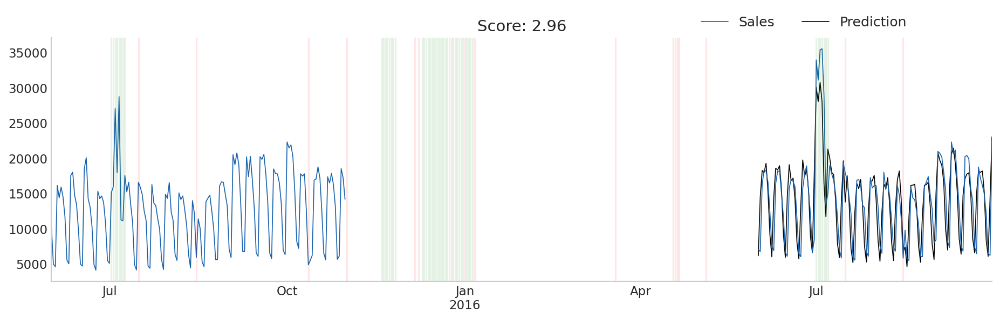

In [ ]:
my_blender_regr.fit()
my_blender_regr.predict()
my_blender_regr.plot()
print(f"The score is {my_blender_regr.score()} " )

<br><br>
#### <a name="blendingVal">3.5.1.1 Blending > All models </a>

In [ ]:
def merge_models_predictions(models, validation=False):
    merged = None
    for name, model in models:
        aux = model.test.copy()[['id', 'fecha']]
        aux[name] = model.y_pred
        aux['id'] = aux['id'].astype(str)
        
        if merged is None:
            if validation:
                aux['unidades_vendidas'] = model.y_test
            merged = aux.copy()
        else:
            merged = merged.merge(aux, on=['id', 'fecha'])
    
    return merged

In [ ]:
df_aux = merge_models_predictions(
    [( 'xgboost',my_xgboost),
     ('catboost',my_catboost ),
     ('lightgbm',my_lightgbm ),
     ('regressors_stacked', my_blender_regr),
     ('prophet', my_prophet)],
    validation=True
)

df_test_aux = merge_models_predictions(
    [( 'xgboost',my_xgboost),
     ('catboost',my_catboost ),
     ('lightgbm',my_lightgbm ),
     ('regressors_stacked', my_blender_regr),
     ('prophet', my_prophet)],
)

In [ ]:
df_aux = df_aux.merge(df, on=['id', 'fecha'], suffixes=('', '_org'))
df_test_aux = df_test_aux.merge(df_test, on=['id', 'fecha'], suffixes=('', '_org'))

In [ ]:
X_train = df_aux.loc[df_aux["fecha"] < "2016-09-01"].copy().reset_index()
X_test = df_aux.loc[df_aux["fecha"] >= "2016-09-01"].copy().reset_index()

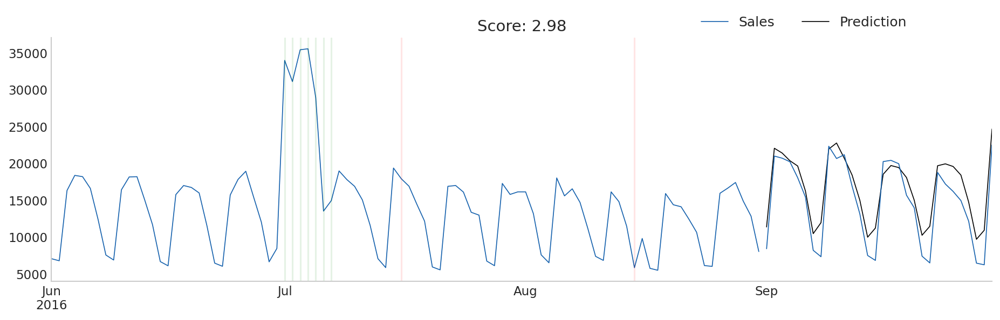

In [ ]:
my_blender_all = Blender_all_models(
    X_train,
    X_test,
    ['xgboost','catboost','lightgbm','regressors_stacked', 'prophet'],
    ['day_of_week'], 
    holidays,
    validation=True
)

my_blender_all.fit()
my_blender_all.predict()
my_blender_all.plot()

### <a name="blendingTest">3.5.2 Blending > Test</a>

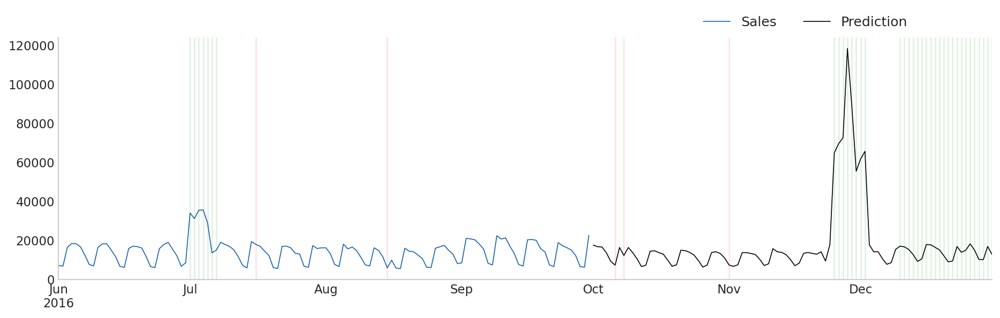

In [ ]:
my_blender_all = Blender_all_models(
    df_aux, 
    df_test_aux, 
    ['xgboost','catboost','lightgbm','regressors_stacked', 'prophet'],
    ['day_of_week'],
    holidays
)

my_blender_all.fit()
my_blender_all.predict()
my_blender_all.plot()

In [ ]:
blender.save_predictions()

<br><br>
# <a name="conclusiones">4. Conclusiones</a>

Nuestro objetivo principal era el de crear un producto de machine learning que, en base a los datos históricos de nuestra tienda online,  ofreciera una predicción día a día para cada producto del número de ventas. 

Nos hemos encontrado un dataset muy informativo y con muchas variables a explorar. Así, nuestro primer objetivo ha sido maximizar la extracción de información de los datos, para ello hemos llevado a cabo un extenso trabajo exploratorio.

Para la planificación del modelado hemos utilizado modelos con diferente naturaleza, se ha estudiado el modelo de series temporales Prophet y diferentes modelos de regresión. Hemos entendido las diferencias principales entre estos modelos, así como sus puntos fuertes y sus debilidades.

Se ha podido comprobar mediante la evaluación de los modelos que todos hacen un trabajo similar a la hora de identificar las variables que influyen más en las ventas de cada producto. Se ha confirmado el buen funcionamiento de la técnica de blending. Esta técnica de blending ha sido utilizada para la predicción final ya que nos ayuda a diluir posibles errores por sobreajuste que cada uno de los modelos individuales tenga.  
